## 1. Loading the preprocessed Data

In [1]:
import pandas as pd
import ast

# Load the saved CSV file
subjects_df = pd.read_csv('./outputs/filtered_subjects_df.csv')
subjects_df['features_value'] = subjects_df['features_value'].apply(ast.literal_eval)

# Display the first few rows to verify
subjects_df.head()


,id,ASD,SITE_ID,SEX,AGE_AT_SCAN,atlas,graph_feature_type,feature,feature_engineering,features_value,test
0,51154,0,NYU,1,30.08,cc200,node_based,degree,original,"[15, 11, 6, 2, 7, 11, 6, 9, 0, 1, 7, 8, 4, 1, ...",0
1,50617,1,YALE,1,7.25,cc200,node_based,degree,original,"[22, 5, 5, 8, 14, 7, 12, 1, 3, 3, 11, 6, 8, 6,...",1
2,50807,1,KKI,1,10.65,cc200,node_based,degree,original,"[10, 15, 4, 15, 3, 7, 11, 5, 1, 2, 2, 12, 17, ...",0
3,51369,0,MAX_MUN,1,32.00,cc200,node_based,degree,original,"[3, 40, 29, 2, 15, 4, 10, 11, 0, 0, 6, 8, 22, ...",0
4,50135,1,OLIN,1,12.00,cc200,node_based,degree,original,"[18, 31, 23, 11, 8, 56, 45, 21, 7, 2, 3, 5, 44...",0


In [2]:
subjects_df.shape

(37260, 11)

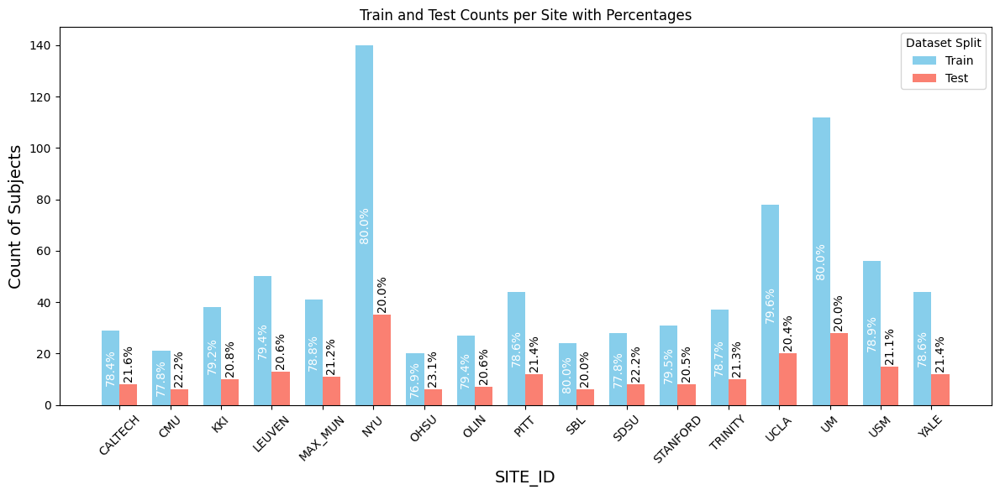

In [6]:
import matplotlib.pyplot as plt
import numpy as np

# Filtered DataFrame
filtered_df = subjects_df[
    (subjects_df['atlas'] == 'cc200') &
    (subjects_df['graph_feature_type'] == 'node_based') &
    (subjects_df['feature'] == 'degree') &
    (subjects_df['feature_engineering'] == 'original')
][['id', 'ASD', 'SITE_ID', 'SEX', 'AGE_AT_SCAN', 'test']]

# Calculate train and test counts per SITE_ID
site_counts = filtered_df.groupby(['SITE_ID', 'test']).size().unstack(fill_value=0)
site_counts.columns = ['train', 'test']
site_counts = site_counts.astype({"train": int, "test": int})

# Calculate percentages
site_counts_percent = site_counts.div(site_counts.sum(axis=1), axis=0) * 100

# Plotting
fig, ax = plt.subplots(figsize=(12, 6))
x = range(len(site_counts))  # X positions for each site

# Width of each bar
width = 0.35

# Plot bars for train and test with different colors
ax.bar([pos - width / 2 for pos in x], site_counts['train'], width=width, color='skyblue', label='Train')
ax.bar([pos + width / 2 for pos in x], site_counts['test'], width=width, color='salmon', label='Test')

# Adding percentage annotations
for idx, (site, counts) in enumerate(site_counts.iterrows()):
    # Train bar annotation in the middle
    train_count = counts['train']
    train_percent = site_counts_percent.loc[site, 'train'] # type: ignore
    ax.text(idx - width / 2, train_count / 2, f"{train_percent:.1f}%", ha='center', va='center', rotation=90, fontsize=10, color='white')

    # Test bar annotation at the top
    test_count = counts['test']
    test_percent = site_counts_percent.loc[site, 'test'] # type: ignore
    ax.text(idx + width / 2, test_count + 1, f"{test_percent:.1f}%", ha='center', va='bottom', rotation=90, fontsize=10, color='black')

# Adding titles and labels
plt.title("Train and Test Counts per Site with Percentages")
plt.xlabel("SITE_ID", fontsize=14)
plt.ylabel("Count of Subjects", fontsize=14)
plt.xticks(x, site_counts.index, rotation=45)  # type: ignore # Set x-ticks to site names
plt.legend(title='Dataset Split')

plt.tight_layout()
plt.show()

In [4]:
print(filtered_df.shape)
# Count the total number of train and test cases in filtered_df
train_test_counts = filtered_df['test'].value_counts()
train_test_counts

(1035, 6)


test
0    820
1    215
Name: count, dtype: int64

## 2. Model Training

In [5]:
subjects_df

,id,ASD,SITE_ID,SEX,AGE_AT_SCAN,atlas,graph_feature_type,feature,feature_engineering,features_value,test
0,51154,0,NYU,1,30.08,cc200,node_based,degree,original,"[15, 11, 6, 2, 7, 11, 6, 9, 0, 1, 7, 8, 4, 1, ...",0
1,50617,1,YALE,1,7.25,cc200,node_based,degree,original,"[22, 5, 5, 8, 14, 7, 12, 1, 3, 3, 11, 6, 8, 6,...",1
2,50807,1,KKI,1,10.65,cc200,node_based,degree,original,"[10, 15, 4, 15, 3, 7, 11, 5, 1, 2, 2, 12, 17, ...",0
3,51369,0,MAX_MUN,1,32.00,cc200,node_based,degree,original,"[3, 40, 29, 2, 15, 4, 10, 11, 0, 0, 6, 8, 22, ...",0
4,50135,1,OLIN,1,12.00,cc200,node_based,degree,original,"[18, 31, 23, 11, 8, 56, 45, 21, 7, 2, 3, 5, 44...",0
...,...,...,...,...,...,...,...,...,...,...,...
37255,50655,1,CMU,1,27.00,multi,graph_level,average_degree,pca_10,"[375.94, -146.53, -87.52, -1.93, -60.69, -25.5...",1
37256,50651,1,CMU,1,39.00,multi,graph_level,average_degree,pca_10,"[445.37, -319.32, 12.69, 6.62, -78.7, 27.38, 3...",1
37257,50664,0,CMU,1,21.00,multi,graph_level,average_degree,pca_10,"[-128.0, -61.37, -20.07, -27.63, -11.72, -3.33...",1
37258,50642,1,CMU,1,33.00,multi,graph_level,average_degree,pca_10,"[-210.26, -51.85, -42.6, -38.84, 9.02, -9.18, ...",1


### 2.1 Individual Site model training
A Family of Classifier Models for each individual Site

In [7]:
from sklearn.exceptions import ConvergenceWarning
import warnings
from typing import List, Union
from sklearn.model_selection import cross_val_predict, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
import xgboost as xgb
import lightgbm as lgb
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix
import pandas as pd
import numpy as np

# Define the cases for feature engineering
cases = [
    {'graph_feature_type': 'node_based', 'feature': 'degree'},
    {'graph_feature_type': 'edge_based', 'feature': 'average_degree'},
    {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}
]

# Define the models to try
models: List[
    Union[
        LogisticRegression
        , DecisionTreeClassifier
        , RandomForestClassifier
        , xgb.XGBClassifier
        , lgb.LGBMClassifier
        , SVC
        , MLPClassifier
    ]
] = [
    LogisticRegression(),
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    xgb.XGBClassifier(),
    lgb.LGBMClassifier(verbose=-1),
    SVC(),
    MLPClassifier(),
]

model_names = {
    'LogisticRegression': 'LR',
    'DecisionTreeClassifier': 'DT',
    'RandomForestClassifier': 'RF',
    'XGBClassifier': 'XGB',
    'LGBMClassifier': 'LGBM',
    'SVC': 'SVM',
    'MLPClassifier': 'MLP'
}

# Initialize a list to store results
results = []

# Loop over each combination of parameters
for site_id in subjects_df['SITE_ID'].unique():
    for atlas in subjects_df['atlas'].unique():
        for case in cases:
            for fe in subjects_df['feature_engineering'].unique():
                # Filter the dataset for the specific combination of SITE_ID, atlas, case, and feature engineering
                subset_df = subjects_df[
                    (subjects_df['SITE_ID'] == site_id) &
                    (subjects_df['atlas'] == atlas) &
                    (subjects_df['graph_feature_type'] == case['graph_feature_type']) &
                    (subjects_df['feature'] == case['feature']) &
                    (subjects_df['feature_engineering'] == fe)
                ]

                # Skip if subset is empty
                if subset_df.empty:
                    continue

                # Extract features and labels
                X = np.stack(subset_df["features_value"].values)
                y = subset_df["ASD"].values

                # Train and evaluate each classifier
                for model in models:
                    model_name = model_names[type(model).__name__]
                    with warnings.catch_warnings():
                        warnings.simplefilter("ignore", category=ConvergenceWarning)  # Ignore only convergence warnings
                        # 10-fold cross-validation
                        cv_scores = cross_val_score(
                            estimator=model, # type: ignore
                            X=X,
                            y=y,
                            cv=10,  # Changed to 10 folds
                            scoring="accuracy",
                        )

                        # Get predicted values for additional metrics
                        y_pred = cross_val_predict(estimator=model, X=X, y=y, cv=10) # type: ignore

                        # Compute additional metrics
                        precision = precision_score(y, y_pred, average="weighted") * 100
                        recall = recall_score(y, y_pred, average="weighted") * 100
                        f1 = f1_score(y, y_pred, average="weighted") * 100

                        # Compute TN, FP, FN, TP using confusion matrix
                        tn, fp, fn, tp = confusion_matrix(y, y_pred).ravel()

                        # Compute Sensitivity (Recall for ASD = 1 (True Positive Rate))
                        sensitivity = (tp / (tp + fn)) * 100 if (tp + fn) != 0 else 0

                        # Compute Specificity (True Negative Rate)
                        specificity = (tn / (tn + fp)) * 100 if (tn + fp) != 0 else 0

                        # Store results
                        results.append(
                            {
                                "SITE_ID": site_id,
                                "atlas": atlas,
                                "graph_feature_type": case["graph_feature_type"],
                                "feature": case["feature"],
                                "feature_engineering": fe,
                                "model": model_name,
                                "cv_accuracy_mean": cv_scores.mean()
                                * 100,  # Accuracy in %
                                "cv_accuracy_std": cv_scores.std()
                                * 100,  # Accuracy std in %
                                "precision": precision,
                                "recall": recall,  # Weighted recall
                                "sensitivity": sensitivity,  # Recall for ASD=1 (TPR)
                                "specificity": specificity,  # True Negative Rate (TNR)
                                "f1_score": f1,
                            }
                        )

                        print(
                            f"Processed: {site_id}, {atlas}, {case['graph_feature_type']}, {fe}, {model_name}"
                        )

# Convert results to a DataFrame
results_df = pd.DataFrame(results)

# Display the first few rows of results to verify
results_df.head()

Processed: NYU, cc200, node_based, original, LR
Processed: NYU, cc200, node_based, original, DT
Processed: NYU, cc200, node_based, original, RF
Processed: NYU, cc200, node_based, original, XGB
Processed: NYU, cc200, node_based, original, LGBM
Processed: NYU, cc200, node_based, original, SVM
Processed: NYU, cc200, node_based, original, MLP
Processed: NYU, cc200, node_based, mi_10, LR
Processed: NYU, cc200, node_based, mi_10, DT
Processed: NYU, cc200, node_based, mi_10, RF
Processed: NYU, cc200, node_based, mi_10, XGB
Processed: NYU, cc200, node_based, mi_10, LGBM
Processed: NYU, cc200, node_based, mi_10, SVM
Processed: NYU, cc200, node_based, mi_10, MLP
Processed: NYU, cc200, node_based, pca_10, LR
Processed: NYU, cc200, node_based, pca_10, DT
Processed: NYU, cc200, node_based, pca_10, RF
Processed: NYU, cc200, node_based, pca_10, XGB
Processed: NYU, cc200, node_based, pca_10, LGBM
Processed: NYU, cc200, node_based, pca_10, SVM
Processed: NYU, cc200, node_based, pca_10, MLP
Processed: N

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: NYU, cc200, edge_based, mi_10, MLP
Processed: NYU, cc200, edge_based, pca_10, LR
Processed: NYU, cc200, edge_based, pca_10, DT
Processed: NYU, cc200, edge_based, pca_10, RF
Processed: NYU, cc200, edge_based, pca_10, XGB
Processed: NYU, cc200, edge_based, pca_10, LGBM
Processed: NYU, cc200, edge_based, pca_10, SVM
Processed: NYU, cc200, edge_based, pca_10, MLP
Processed: NYU, cc200, graph_level, original, LR
Processed: NYU, cc200, graph_level, original, DT
Processed: NYU, cc200, graph_level, original, RF
Processed: NYU, cc200, graph_level, original, XGB
Processed: NYU, cc200, graph_level, original, LGBM
Processed: NYU, cc200, graph_level, original, SVM
Processed: NYU, cc200, graph_level, original, MLP
Processed: NYU, cc200, graph_level, mi_10, LR
Processed: NYU, cc200, graph_level, mi_10, DT
Processed: NYU, cc200, graph_level, mi_10, RF
Processed: NYU, cc200, graph_level, mi_10, XGB
Processed: NYU, cc200, graph_level, mi_10, LGBM
Processed: NYU, cc200, graph_level, mi_10, SVM

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: NYU, cc200, graph_level, mi_10, MLP
Processed: NYU, cc200, graph_level, pca_10, LR
Processed: NYU, cc200, graph_level, pca_10, DT
Processed: NYU, cc200, graph_level, pca_10, RF
Processed: NYU, cc200, graph_level, pca_10, XGB
Processed: NYU, cc200, graph_level, pca_10, LGBM
Processed: NYU, cc200, graph_level, pca_10, SVM
Processed: NYU, cc200, graph_level, pca_10, MLP
Processed: NYU, aal, node_based, original, LR
Processed: NYU, aal, node_based, original, DT
Processed: NYU, aal, node_based, original, RF
Processed: NYU, aal, node_based, original, XGB
Processed: NYU, aal, node_based, original, LGBM
Processed: NYU, aal, node_based, original, SVM
Processed: NYU, aal, node_based, original, MLP
Processed: NYU, aal, node_based, mi_10, LR
Processed: NYU, aal, node_based, mi_10, DT
Processed: NYU, aal, node_based, mi_10, RF
Processed: NYU, aal, node_based, mi_10, XGB
Processed: NYU, aal, node_based, mi_10, LGBM
Processed: NYU, aal, node_based, mi_10, SVM
Processed: NYU, aal, node_base

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: NYU, aal, edge_based, mi_10, MLP
Processed: NYU, aal, edge_based, pca_10, LR
Processed: NYU, aal, edge_based, pca_10, DT
Processed: NYU, aal, edge_based, pca_10, RF
Processed: NYU, aal, edge_based, pca_10, XGB
Processed: NYU, aal, edge_based, pca_10, LGBM
Processed: NYU, aal, edge_based, pca_10, SVM
Processed: NYU, aal, edge_based, pca_10, MLP
Processed: NYU, aal, graph_level, original, LR
Processed: NYU, aal, graph_level, original, DT
Processed: NYU, aal, graph_level, original, RF
Processed: NYU, aal, graph_level, original, XGB
Processed: NYU, aal, graph_level, original, LGBM
Processed: NYU, aal, graph_level, original, SVM
Processed: NYU, aal, graph_level, original, MLP
Processed: NYU, aal, graph_level, mi_10, LR
Processed: NYU, aal, graph_level, mi_10, DT


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: NYU, aal, graph_level, mi_10, RF
Processed: NYU, aal, graph_level, mi_10, XGB
Processed: NYU, aal, graph_level, mi_10, LGBM
Processed: NYU, aal, graph_level, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: NYU, aal, graph_level, mi_10, MLP
Processed: NYU, aal, graph_level, pca_10, LR
Processed: NYU, aal, graph_level, pca_10, DT
Processed: NYU, aal, graph_level, pca_10, RF
Processed: NYU, aal, graph_level, pca_10, XGB
Processed: NYU, aal, graph_level, pca_10, LGBM
Processed: NYU, aal, graph_level, pca_10, SVM
Processed: NYU, aal, graph_level, pca_10, MLP
Processed: NYU, dos160, node_based, original, LR
Processed: NYU, dos160, node_based, original, DT
Processed: NYU, dos160, node_based, original, RF
Processed: NYU, dos160, node_based, original, XGB
Processed: NYU, dos160, node_based, original, LGBM
Processed: NYU, dos160, node_based, original, SVM
Processed: NYU, dos160, node_based, original, MLP
Processed: NYU, dos160, node_based, mi_10, LR
Processed: NYU, dos160, node_based, mi_10, DT
Processed: NYU, dos160, node_based, mi_10, RF
Processed: NYU, dos160, node_based, mi_10, XGB
Processed: NYU, dos160, node_based, mi_10, LGBM
Processed: NYU, dos160, node_based, mi_10, SVM
Process

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: NYU, multi, graph_level, mi_10, MLP
Processed: NYU, multi, graph_level, pca_10, LR
Processed: NYU, multi, graph_level, pca_10, DT
Processed: NYU, multi, graph_level, pca_10, RF
Processed: NYU, multi, graph_level, pca_10, XGB
Processed: NYU, multi, graph_level, pca_10, LGBM
Processed: NYU, multi, graph_level, pca_10, SVM
Processed: NYU, multi, graph_level, pca_10, MLP
Processed: YALE, cc200, node_based, original, LR
Processed: YALE, cc200, node_based, original, DT
Processed: YALE, cc200, node_based, original, RF
Processed: YALE, cc200, node_based, original, XGB
Processed: YALE, cc200, node_based, original, LGBM
Processed: YALE, cc200, node_based, original, SVM
Processed: YALE, cc200, node_based, original, MLP
Processed: YALE, cc200, node_based, mi_10, LR
Processed: YALE, cc200, node_based, mi_10, DT
Processed: YALE, cc200, node_based, mi_10, RF
Processed: YALE, cc200, node_based, mi_10, XGB
Processed: YALE, cc200, node_based, mi_10, LGBM
Processed: YALE, cc200, node_based, mi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: KKI, cc200, edge_based, original, MLP
Processed: KKI, cc200, edge_based, mi_10, LR
Processed: KKI, cc200, edge_based, mi_10, DT


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: KKI, cc200, edge_based, mi_10, RF


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: KKI, cc200, edge_based, mi_10, XGB
Processed: KKI, cc200, edge_based, mi_10, LGBM
Processed: KKI, cc200, edge_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: KKI, cc200, edge_based, mi_10, MLP
Processed: KKI, cc200, edge_based, pca_10, LR
Processed: KKI, cc200, edge_based, pca_10, DT
Processed: KKI, cc200, edge_based, pca_10, RF
Processed: KKI, cc200, edge_based, pca_10, XGB
Processed: KKI, cc200, edge_based, pca_10, LGBM
Processed: KKI, cc200, edge_based, pca_10, SVM
Processed: KKI, cc200, edge_based, pca_10, MLP
Processed: KKI, cc200, graph_level, original, LR
Processed: KKI, cc200, graph_level, original, DT
Processed: KKI, cc200, graph_level, original, RF
Processed: KKI, cc200, graph_level, original, XGB
Processed: KKI, cc200, graph_level, original, LGBM
Processed: KKI, cc200, graph_level, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: KKI, cc200, graph_level, original, MLP
Processed: KKI, cc200, graph_level, mi_10, LR
Processed: KKI, cc200, graph_level, mi_10, DT
Processed: KKI, cc200, graph_level, mi_10, RF
Processed: KKI, cc200, graph_level, mi_10, XGB
Processed: KKI, cc200, graph_level, mi_10, LGBM
Processed: KKI, cc200, graph_level, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: KKI, cc200, graph_level, mi_10, MLP
Processed: KKI, cc200, graph_level, pca_10, LR
Processed: KKI, cc200, graph_level, pca_10, DT
Processed: KKI, cc200, graph_level, pca_10, RF
Processed: KKI, cc200, graph_level, pca_10, XGB
Processed: KKI, cc200, graph_level, pca_10, LGBM
Processed: KKI, cc200, graph_level, pca_10, SVM
Processed: KKI, cc200, graph_level, pca_10, MLP
Processed: KKI, aal, node_based, original, LR
Processed: KKI, aal, node_based, original, DT
Processed: KKI, aal, node_based, original, RF
Processed: KKI, aal, node_based, original, XGB
Processed: KKI, aal, node_based, original, LGBM
Processed: KKI, aal, node_based, original, SVM
Processed: KKI, aal, node_based, original, MLP
Processed: KKI, aal, node_based, mi_10, LR
Processed: KKI, aal, node_based, mi_10, DT
Processed: KKI, aal, node_based, mi_10, RF
Processed: KKI, aal, node_based, mi_10, XGB
Processed: KKI, aal, node_based, mi_10, LGBM
Processed: KKI, aal, node_based, mi_10, SVM
Processed: KKI, aal, node_base

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: KKI, aal, edge_based, original, MLP
Processed: KKI, aal, edge_based, mi_10, LR
Processed: KKI, aal, edge_based, mi_10, DT
Processed: KKI, aal, edge_based, mi_10, RF


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: KKI, aal, edge_based, mi_10, XGB
Processed: KKI, aal, edge_based, mi_10, LGBM
Processed: KKI, aal, edge_based, mi_10, SVM
Processed: KKI, aal, edge_based, mi_10, MLP
Processed: KKI, aal, edge_based, pca_10, LR
Processed: KKI, aal, edge_based, pca_10, DT
Processed: KKI, aal, edge_based, pca_10, RF
Processed: KKI, aal, edge_based, pca_10, XGB
Processed: KKI, aal, edge_based, pca_10, LGBM
Processed: KKI, aal, edge_based, pca_10, SVM
Processed: KKI, aal, edge_based, pca_10, MLP
Processed: KKI, aal, graph_level, original, LR
Processed: KKI, aal, graph_level, original, DT
Processed: KKI, aal, graph_level, original, RF
Processed: KKI, aal, graph_level, original, XGB
Processed: KKI, aal, graph_level, original, LGBM
Processed: KKI, aal, graph_level, original, SVM
Processed: KKI, aal, graph_level, original, MLP
Processed: KKI, aal, graph_level, mi_10, LR
Processed: KKI, aal, graph_level, mi_10, DT
Processed: KKI, aal, graph_level, mi_10, RF
Processed: KKI, aal, graph_level, mi_10, XGB

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: KKI, dos160, edge_based, mi_10, MLP
Processed: KKI, dos160, edge_based, pca_10, LR
Processed: KKI, dos160, edge_based, pca_10, DT
Processed: KKI, dos160, edge_based, pca_10, RF
Processed: KKI, dos160, edge_based, pca_10, XGB
Processed: KKI, dos160, edge_based, pca_10, LGBM
Processed: KKI, dos160, edge_based, pca_10, SVM
Processed: KKI, dos160, edge_based, pca_10, MLP
Processed: KKI, dos160, graph_level, original, LR
Processed: KKI, dos160, graph_level, original, DT
Processed: KKI, dos160, graph_level, original, RF
Processed: KKI, dos160, graph_level, original, XGB
Processed: KKI, dos160, graph_level, original, LGBM
Processed: KKI, dos160, graph_level, original, SVM
Processed: KKI, dos160, graph_level, original, MLP
Processed: KKI, dos160, graph_level, mi_10, LR
Processed: KKI, dos160, graph_level, mi_10, DT
Processed: KKI, dos160, graph_level, mi_10, RF
Processed: KKI, dos160, graph_level, mi_10, XGB
Processed: KKI, dos160, graph_level, mi_10, LGBM
Processed: KKI, dos160, gr

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: KKI, dos160, graph_level, mi_10, MLP
Processed: KKI, dos160, graph_level, pca_10, LR
Processed: KKI, dos160, graph_level, pca_10, DT
Processed: KKI, dos160, graph_level, pca_10, RF
Processed: KKI, dos160, graph_level, pca_10, XGB
Processed: KKI, dos160, graph_level, pca_10, LGBM
Processed: KKI, dos160, graph_level, pca_10, SVM
Processed: KKI, dos160, graph_level, pca_10, MLP
Processed: KKI, multi, node_based, original, LR
Processed: KKI, multi, node_based, original, DT
Processed: KKI, multi, node_based, original, RF
Processed: KKI, multi, node_based, original, XGB
Processed: KKI, multi, node_based, original, LGBM
Processed: KKI, multi, node_based, original, SVM
Processed: KKI, multi, node_based, original, MLP
Processed: KKI, multi, node_based, mi_10, LR
Processed: KKI, multi, node_based, mi_10, DT
Processed: KKI, multi, node_based, mi_10, RF
Processed: KKI, multi, node_based, mi_10, XGB
Processed: KKI, multi, node_based, mi_10, LGBM
Processed: KKI, multi, node_based, mi_10, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: KKI, multi, edge_based, original, MLP
Processed: KKI, multi, edge_based, mi_10, LR
Processed: KKI, multi, edge_based, mi_10, DT
Processed: KKI, multi, edge_based, mi_10, RF
Processed: KKI, multi, edge_based, mi_10, XGB
Processed: KKI, multi, edge_based, mi_10, LGBM
Processed: KKI, multi, edge_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: KKI, multi, edge_based, mi_10, MLP
Processed: KKI, multi, edge_based, pca_10, LR
Processed: KKI, multi, edge_based, pca_10, DT
Processed: KKI, multi, edge_based, pca_10, RF
Processed: KKI, multi, edge_based, pca_10, XGB
Processed: KKI, multi, edge_based, pca_10, LGBM
Processed: KKI, multi, edge_based, pca_10, SVM
Processed: KKI, multi, edge_based, pca_10, MLP
Processed: KKI, multi, graph_level, original, LR
Processed: KKI, multi, graph_level, original, DT
Processed: KKI, multi, graph_level, original, RF
Processed: KKI, multi, graph_level, original, XGB
Processed: KKI, multi, graph_level, original, LGBM
Processed: KKI, multi, graph_level, original, SVM
Processed: KKI, multi, graph_level, original, MLP
Processed: KKI, multi, graph_level, mi_10, LR
Processed: KKI, multi, graph_level, mi_10, DT
Processed: KKI, multi, graph_level, mi_10, RF
Processed: KKI, multi, graph_level, mi_10, XGB
Processed: KKI, multi, graph_level, mi_10, LGBM
Processed: KKI, multi, graph_level, mi_10, SVM

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: MAX_MUN, cc200, edge_based, mi_10, MLP
Processed: MAX_MUN, cc200, edge_based, pca_10, LR
Processed: MAX_MUN, cc200, edge_based, pca_10, DT
Processed: MAX_MUN, cc200, edge_based, pca_10, RF
Processed: MAX_MUN, cc200, edge_based, pca_10, XGB
Processed: MAX_MUN, cc200, edge_based, pca_10, LGBM
Processed: MAX_MUN, cc200, edge_based, pca_10, SVM
Processed: MAX_MUN, cc200, edge_based, pca_10, MLP
Processed: MAX_MUN, cc200, graph_level, original, LR
Processed: MAX_MUN, cc200, graph_level, original, DT
Processed: MAX_MUN, cc200, graph_level, original, RF
Processed: MAX_MUN, cc200, graph_level, original, XGB
Processed: MAX_MUN, cc200, graph_level, original, LGBM
Processed: MAX_MUN, cc200, graph_level, original, SVM
Processed: MAX_MUN, cc200, graph_level, original, MLP
Processed: MAX_MUN, cc200, graph_level, mi_10, LR
Processed: MAX_MUN, cc200, graph_level, mi_10, DT
Processed: MAX_MUN, cc200, graph_level, mi_10, RF
Processed: MAX_MUN, cc200, graph_level, mi_10, XGB
Processed: MAX_MUN

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: MAX_MUN, aal, graph_level, original, MLP
Processed: MAX_MUN, aal, graph_level, mi_10, LR
Processed: MAX_MUN, aal, graph_level, mi_10, DT


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: MAX_MUN, aal, graph_level, mi_10, RF
Processed: MAX_MUN, aal, graph_level, mi_10, XGB
Processed: MAX_MUN, aal, graph_level, mi_10, LGBM
Processed: MAX_MUN, aal, graph_level, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: MAX_MUN, aal, graph_level, mi_10, MLP
Processed: MAX_MUN, aal, graph_level, pca_10, LR
Processed: MAX_MUN, aal, graph_level, pca_10, DT
Processed: MAX_MUN, aal, graph_level, pca_10, RF
Processed: MAX_MUN, aal, graph_level, pca_10, XGB
Processed: MAX_MUN, aal, graph_level, pca_10, LGBM
Processed: MAX_MUN, aal, graph_level, pca_10, SVM
Processed: MAX_MUN, aal, graph_level, pca_10, MLP
Processed: MAX_MUN, dos160, node_based, original, LR
Processed: MAX_MUN, dos160, node_based, original, DT
Processed: MAX_MUN, dos160, node_based, original, RF
Processed: MAX_MUN, dos160, node_based, original, XGB
Processed: MAX_MUN, dos160, node_based, original, LGBM
Processed: MAX_MUN, dos160, node_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: MAX_MUN, dos160, node_based, original, MLP
Processed: MAX_MUN, dos160, node_based, mi_10, LR
Processed: MAX_MUN, dos160, node_based, mi_10, DT
Processed: MAX_MUN, dos160, node_based, mi_10, RF
Processed: MAX_MUN, dos160, node_based, mi_10, XGB
Processed: MAX_MUN, dos160, node_based, mi_10, LGBM
Processed: MAX_MUN, dos160, node_based, mi_10, SVM
Processed: MAX_MUN, dos160, node_based, mi_10, MLP
Processed: MAX_MUN, dos160, node_based, pca_10, LR
Processed: MAX_MUN, dos160, node_based, pca_10, DT
Processed: MAX_MUN, dos160, node_based, pca_10, RF
Processed: MAX_MUN, dos160, node_based, pca_10, XGB
Processed: MAX_MUN, dos160, node_based, pca_10, LGBM
Processed: MAX_MUN, dos160, node_based, pca_10, SVM
Processed: MAX_MUN, dos160, node_based, pca_10, MLP
Processed: MAX_MUN, dos160, edge_based, original, LR
Processed: MAX_MUN, dos160, edge_based, original, DT
Processed: MAX_MUN, dos160, edge_based, original, RF
Processed: MAX_MUN, dos160, edge_based, original, XGB
Processed: MAX_M

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: MAX_MUN, dos160, graph_level, mi_10, RF


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: MAX_MUN, dos160, graph_level, mi_10, XGB
Processed: MAX_MUN, dos160, graph_level, mi_10, LGBM
Processed: MAX_MUN, dos160, graph_level, mi_10, SVM
Processed: MAX_MUN, dos160, graph_level, mi_10, MLP
Processed: MAX_MUN, dos160, graph_level, pca_10, LR
Processed: MAX_MUN, dos160, graph_level, pca_10, DT
Processed: MAX_MUN, dos160, graph_level, pca_10, RF
Processed: MAX_MUN, dos160, graph_level, pca_10, XGB
Processed: MAX_MUN, dos160, graph_level, pca_10, LGBM
Processed: MAX_MUN, dos160, graph_level, pca_10, SVM
Processed: MAX_MUN, dos160, graph_level, pca_10, MLP
Processed: MAX_MUN, multi, node_based, original, LR
Processed: MAX_MUN, multi, node_based, original, DT
Processed: MAX_MUN, multi, node_based, original, RF
Processed: MAX_MUN, multi, node_based, original, XGB
Processed: MAX_MUN, multi, node_based, original, LGBM
Processed: MAX_MUN, multi, node_based, original, SVM
Processed: MAX_MUN, multi, node_based, original, MLP
Processed: MAX_MUN, multi, node_based, mi_10, LR
Proc

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, cc200, node_based, original, MLP
Processed: OLIN, cc200, node_based, mi_10, LR
Processed: OLIN, cc200, node_based, mi_10, DT
Processed: OLIN, cc200, node_based, mi_10, RF
Processed: OLIN, cc200, node_based, mi_10, XGB
Processed: OLIN, cc200, node_based, mi_10, LGBM
Processed: OLIN, cc200, node_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, cc200, node_based, mi_10, MLP
Processed: OLIN, cc200, node_based, pca_10, LR
Processed: OLIN, cc200, node_based, pca_10, DT
Processed: OLIN, cc200, node_based, pca_10, RF
Processed: OLIN, cc200, node_based, pca_10, XGB
Processed: OLIN, cc200, node_based, pca_10, LGBM
Processed: OLIN, cc200, node_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, cc200, node_based, pca_10, MLP
Processed: OLIN, cc200, edge_based, original, LR
Processed: OLIN, cc200, edge_based, original, DT
Processed: OLIN, cc200, edge_based, original, RF
Processed: OLIN, cc200, edge_based, original, XGB
Processed: OLIN, cc200, edge_based, original, LGBM
Processed: OLIN, cc200, edge_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, cc200, edge_based, original, MLP
Processed: OLIN, cc200, edge_based, mi_10, LR
Processed: OLIN, cc200, edge_based, mi_10, DT
Processed: OLIN, cc200, edge_based, mi_10, RF
Processed: OLIN, cc200, edge_based, mi_10, XGB
Processed: OLIN, cc200, edge_based, mi_10, LGBM
Processed: OLIN, cc200, edge_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, cc200, edge_based, mi_10, MLP
Processed: OLIN, cc200, edge_based, pca_10, LR
Processed: OLIN, cc200, edge_based, pca_10, DT
Processed: OLIN, cc200, edge_based, pca_10, RF
Processed: OLIN, cc200, edge_based, pca_10, XGB
Processed: OLIN, cc200, edge_based, pca_10, LGBM
Processed: OLIN, cc200, edge_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, cc200, edge_based, pca_10, MLP
Processed: OLIN, cc200, graph_level, original, LR
Processed: OLIN, cc200, graph_level, original, DT
Processed: OLIN, cc200, graph_level, original, RF
Processed: OLIN, cc200, graph_level, original, XGB
Processed: OLIN, cc200, graph_level, original, LGBM
Processed: OLIN, cc200, graph_level, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, cc200, graph_level, original, MLP
Processed: OLIN, cc200, graph_level, mi_10, LR
Processed: OLIN, cc200, graph_level, mi_10, DT
Processed: OLIN, cc200, graph_level, mi_10, RF


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, cc200, graph_level, mi_10, XGB
Processed: OLIN, cc200, graph_level, mi_10, LGBM
Processed: OLIN, cc200, graph_level, mi_10, SVM
Processed: OLIN, cc200, graph_level, mi_10, MLP
Processed: OLIN, cc200, graph_level, pca_10, LR
Processed: OLIN, cc200, graph_level, pca_10, DT
Processed: OLIN, cc200, graph_level, pca_10, RF
Processed: OLIN, cc200, graph_level, pca_10, XGB
Processed: OLIN, cc200, graph_level, pca_10, LGBM
Processed: OLIN, cc200, graph_level, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, cc200, graph_level, pca_10, MLP
Processed: OLIN, aal, node_based, original, LR
Processed: OLIN, aal, node_based, original, DT
Processed: OLIN, aal, node_based, original, RF
Processed: OLIN, aal, node_based, original, XGB
Processed: OLIN, aal, node_based, original, LGBM
Processed: OLIN, aal, node_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, aal, node_based, original, MLP
Processed: OLIN, aal, node_based, mi_10, LR
Processed: OLIN, aal, node_based, mi_10, DT
Processed: OLIN, aal, node_based, mi_10, RF
Processed: OLIN, aal, node_based, mi_10, XGB
Processed: OLIN, aal, node_based, mi_10, LGBM
Processed: OLIN, aal, node_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, aal, node_based, mi_10, MLP
Processed: OLIN, aal, node_based, pca_10, LR
Processed: OLIN, aal, node_based, pca_10, DT
Processed: OLIN, aal, node_based, pca_10, RF
Processed: OLIN, aal, node_based, pca_10, XGB
Processed: OLIN, aal, node_based, pca_10, LGBM
Processed: OLIN, aal, node_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, aal, node_based, pca_10, MLP
Processed: OLIN, aal, edge_based, original, LR
Processed: OLIN, aal, edge_based, original, DT
Processed: OLIN, aal, edge_based, original, RF
Processed: OLIN, aal, edge_based, original, XGB
Processed: OLIN, aal, edge_based, original, LGBM
Processed: OLIN, aal, edge_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, aal, edge_based, original, MLP
Processed: OLIN, aal, edge_based, mi_10, LR
Processed: OLIN, aal, edge_based, mi_10, DT
Processed: OLIN, aal, edge_based, mi_10, RF
Processed: OLIN, aal, edge_based, mi_10, XGB
Processed: OLIN, aal, edge_based, mi_10, LGBM
Processed: OLIN, aal, edge_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, aal, edge_based, mi_10, MLP
Processed: OLIN, aal, edge_based, pca_10, LR
Processed: OLIN, aal, edge_based, pca_10, DT
Processed: OLIN, aal, edge_based, pca_10, RF
Processed: OLIN, aal, edge_based, pca_10, XGB
Processed: OLIN, aal, edge_based, pca_10, LGBM
Processed: OLIN, aal, edge_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, aal, edge_based, pca_10, MLP
Processed: OLIN, aal, graph_level, original, LR
Processed: OLIN, aal, graph_level, original, DT
Processed: OLIN, aal, graph_level, original, RF
Processed: OLIN, aal, graph_level, original, XGB
Processed: OLIN, aal, graph_level, original, LGBM
Processed: OLIN, aal, graph_level, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, aal, graph_level, original, MLP
Processed: OLIN, aal, graph_level, mi_10, LR
Processed: OLIN, aal, graph_level, mi_10, DT


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: OLIN, aal, graph_level, mi_10, RF


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: OLIN, aal, graph_level, mi_10, XGB
Processed: OLIN, aal, graph_level, mi_10, LGBM
Processed: OLIN, aal, graph_level, mi_10, SVM
Processed: OLIN, aal, graph_level, mi_10, MLP
Processed: OLIN, aal, graph_level, pca_10, LR
Processed: OLIN, aal, graph_level, pca_10, DT
Processed: OLIN, aal, graph_level, pca_10, RF
Processed: OLIN, aal, graph_level, pca_10, XGB
Processed: OLIN, aal, graph_level, pca_10, LGBM
Processed: OLIN, aal, graph_level, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, aal, graph_level, pca_10, MLP
Processed: OLIN, dos160, node_based, original, LR
Processed: OLIN, dos160, node_based, original, DT
Processed: OLIN, dos160, node_based, original, RF
Processed: OLIN, dos160, node_based, original, XGB
Processed: OLIN, dos160, node_based, original, LGBM
Processed: OLIN, dos160, node_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, dos160, node_based, original, MLP
Processed: OLIN, dos160, node_based, mi_10, LR
Processed: OLIN, dos160, node_based, mi_10, DT
Processed: OLIN, dos160, node_based, mi_10, RF
Processed: OLIN, dos160, node_based, mi_10, XGB
Processed: OLIN, dos160, node_based, mi_10, LGBM
Processed: OLIN, dos160, node_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, dos160, node_based, mi_10, MLP
Processed: OLIN, dos160, node_based, pca_10, LR
Processed: OLIN, dos160, node_based, pca_10, DT
Processed: OLIN, dos160, node_based, pca_10, RF
Processed: OLIN, dos160, node_based, pca_10, XGB
Processed: OLIN, dos160, node_based, pca_10, LGBM
Processed: OLIN, dos160, node_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, dos160, node_based, pca_10, MLP
Processed: OLIN, dos160, edge_based, original, LR
Processed: OLIN, dos160, edge_based, original, DT
Processed: OLIN, dos160, edge_based, original, RF
Processed: OLIN, dos160, edge_based, original, XGB
Processed: OLIN, dos160, edge_based, original, LGBM
Processed: OLIN, dos160, edge_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, dos160, edge_based, original, MLP
Processed: OLIN, dos160, edge_based, mi_10, LR
Processed: OLIN, dos160, edge_based, mi_10, DT
Processed: OLIN, dos160, edge_based, mi_10, RF
Processed: OLIN, dos160, edge_based, mi_10, XGB
Processed: OLIN, dos160, edge_based, mi_10, LGBM
Processed: OLIN, dos160, edge_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, dos160, edge_based, mi_10, MLP
Processed: OLIN, dos160, edge_based, pca_10, LR
Processed: OLIN, dos160, edge_based, pca_10, DT
Processed: OLIN, dos160, edge_based, pca_10, RF
Processed: OLIN, dos160, edge_based, pca_10, XGB
Processed: OLIN, dos160, edge_based, pca_10, LGBM
Processed: OLIN, dos160, edge_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, dos160, edge_based, pca_10, MLP
Processed: OLIN, dos160, graph_level, original, LR
Processed: OLIN, dos160, graph_level, original, DT
Processed: OLIN, dos160, graph_level, original, RF
Processed: OLIN, dos160, graph_level, original, XGB
Processed: OLIN, dos160, graph_level, original, LGBM
Processed: OLIN, dos160, graph_level, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, dos160, graph_level, original, MLP
Processed: OLIN, dos160, graph_level, mi_10, LR
Processed: OLIN, dos160, graph_level, mi_10, DT
Processed: OLIN, dos160, graph_level, mi_10, RF
Processed: OLIN, dos160, graph_level, mi_10, XGB
Processed: OLIN, dos160, graph_level, mi_10, LGBM
Processed: OLIN, dos160, graph_level, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, dos160, graph_level, mi_10, MLP
Processed: OLIN, dos160, graph_level, pca_10, LR
Processed: OLIN, dos160, graph_level, pca_10, DT
Processed: OLIN, dos160, graph_level, pca_10, RF
Processed: OLIN, dos160, graph_level, pca_10, XGB
Processed: OLIN, dos160, graph_level, pca_10, LGBM
Processed: OLIN, dos160, graph_level, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, dos160, graph_level, pca_10, MLP
Processed: OLIN, multi, node_based, original, LR
Processed: OLIN, multi, node_based, original, DT
Processed: OLIN, multi, node_based, original, RF
Processed: OLIN, multi, node_based, original, XGB
Processed: OLIN, multi, node_based, original, LGBM
Processed: OLIN, multi, node_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, multi, node_based, original, MLP
Processed: OLIN, multi, node_based, mi_10, LR
Processed: OLIN, multi, node_based, mi_10, DT
Processed: OLIN, multi, node_based, mi_10, RF
Processed: OLIN, multi, node_based, mi_10, XGB
Processed: OLIN, multi, node_based, mi_10, LGBM
Processed: OLIN, multi, node_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, multi, node_based, mi_10, MLP
Processed: OLIN, multi, node_based, pca_10, LR
Processed: OLIN, multi, node_based, pca_10, DT
Processed: OLIN, multi, node_based, pca_10, RF
Processed: OLIN, multi, node_based, pca_10, XGB
Processed: OLIN, multi, node_based, pca_10, LGBM
Processed: OLIN, multi, node_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, multi, node_based, pca_10, MLP
Processed: OLIN, multi, edge_based, original, LR
Processed: OLIN, multi, edge_based, original, DT
Processed: OLIN, multi, edge_based, original, RF
Processed: OLIN, multi, edge_based, original, XGB
Processed: OLIN, multi, edge_based, original, LGBM
Processed: OLIN, multi, edge_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, multi, edge_based, original, MLP
Processed: OLIN, multi, edge_based, mi_10, LR
Processed: OLIN, multi, edge_based, mi_10, DT
Processed: OLIN, multi, edge_based, mi_10, RF
Processed: OLIN, multi, edge_based, mi_10, XGB
Processed: OLIN, multi, edge_based, mi_10, LGBM
Processed: OLIN, multi, edge_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, multi, edge_based, mi_10, MLP
Processed: OLIN, multi, edge_based, pca_10, LR
Processed: OLIN, multi, edge_based, pca_10, DT
Processed: OLIN, multi, edge_based, pca_10, RF
Processed: OLIN, multi, edge_based, pca_10, XGB
Processed: OLIN, multi, edge_based, pca_10, LGBM
Processed: OLIN, multi, edge_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, multi, edge_based, pca_10, MLP
Processed: OLIN, multi, graph_level, original, LR
Processed: OLIN, multi, graph_level, original, DT
Processed: OLIN, multi, graph_level, original, RF
Processed: OLIN, multi, graph_level, original, XGB
Processed: OLIN, multi, graph_level, original, LGBM
Processed: OLIN, multi, graph_level, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, multi, graph_level, original, MLP
Processed: OLIN, multi, graph_level, mi_10, LR
Processed: OLIN, multi, graph_level, mi_10, DT
Processed: OLIN, multi, graph_level, mi_10, RF
Processed: OLIN, multi, graph_level, mi_10, XGB
Processed: OLIN, multi, graph_level, mi_10, LGBM
Processed: OLIN, multi, graph_level, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, multi, graph_level, mi_10, MLP
Processed: OLIN, multi, graph_level, pca_10, LR
Processed: OLIN, multi, graph_level, pca_10, DT
Processed: OLIN, multi, graph_level, pca_10, RF
Processed: OLIN, multi, graph_level, pca_10, XGB
Processed: OLIN, multi, graph_level, pca_10, LGBM
Processed: OLIN, multi, graph_level, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OLIN, multi, graph_level, pca_10, MLP
Processed: UCLA, cc200, node_based, original, LR
Processed: UCLA, cc200, node_based, original, DT
Processed: UCLA, cc200, node_based, original, RF
Processed: UCLA, cc200, node_based, original, XGB
Processed: UCLA, cc200, node_based, original, LGBM
Processed: UCLA, cc200, node_based, original, SVM
Processed: UCLA, cc200, node_based, original, MLP
Processed: UCLA, cc200, node_based, mi_10, LR
Processed: UCLA, cc200, node_based, mi_10, DT
Processed: UCLA, cc200, node_based, mi_10, RF
Processed: UCLA, cc200, node_based, mi_10, XGB
Processed: UCLA, cc200, node_based, mi_10, LGBM
Processed: UCLA, cc200, node_based, mi_10, SVM
Processed: UCLA, cc200, node_based, mi_10, MLP
Processed: UCLA, cc200, node_based, pca_10, LR
Processed: UCLA, cc200, node_based, pca_10, DT
Processed: UCLA, cc200, node_based, pca_10, RF
Processed: UCLA, cc200, node_based, pca_10, XGB
Processed: UCLA, cc200, node_based, pca_10, LGBM
Processed: UCLA, cc200, node_based, pc

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: UCLA, cc200, edge_based, mi_10, RF


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: UCLA, cc200, edge_based, mi_10, XGB
Processed: UCLA, cc200, edge_based, mi_10, LGBM
Processed: UCLA, cc200, edge_based, mi_10, SVM
Processed: UCLA, cc200, edge_based, mi_10, MLP
Processed: UCLA, cc200, edge_based, pca_10, LR
Processed: UCLA, cc200, edge_based, pca_10, DT
Processed: UCLA, cc200, edge_based, pca_10, RF
Processed: UCLA, cc200, edge_based, pca_10, XGB
Processed: UCLA, cc200, edge_based, pca_10, LGBM
Processed: UCLA, cc200, edge_based, pca_10, SVM
Processed: UCLA, cc200, edge_based, pca_10, MLP
Processed: UCLA, cc200, graph_level, original, LR
Processed: UCLA, cc200, graph_level, original, DT
Processed: UCLA, cc200, graph_level, original, RF
Processed: UCLA, cc200, graph_level, original, XGB
Processed: UCLA, cc200, graph_level, original, LGBM
Processed: UCLA, cc200, graph_level, original, SVM
Processed: UCLA, cc200, graph_level, original, MLP
Processed: UCLA, cc200, graph_level, mi_10, LR
Processed: UCLA, cc200, graph_level, mi_10, DT
Processed: UCLA, cc200, grap

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: UCLA, aal, edge_based, original, MLP
Processed: UCLA, aal, edge_based, mi_10, LR
Processed: UCLA, aal, edge_based, mi_10, DT
Processed: UCLA, aal, edge_based, mi_10, RF
Processed: UCLA, aal, edge_based, mi_10, XGB
Processed: UCLA, aal, edge_based, mi_10, LGBM
Processed: UCLA, aal, edge_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: UCLA, aal, edge_based, mi_10, MLP
Processed: UCLA, aal, edge_based, pca_10, LR
Processed: UCLA, aal, edge_based, pca_10, DT
Processed: UCLA, aal, edge_based, pca_10, RF
Processed: UCLA, aal, edge_based, pca_10, XGB
Processed: UCLA, aal, edge_based, pca_10, LGBM
Processed: UCLA, aal, edge_based, pca_10, SVM
Processed: UCLA, aal, edge_based, pca_10, MLP
Processed: UCLA, aal, graph_level, original, LR
Processed: UCLA, aal, graph_level, original, DT
Processed: UCLA, aal, graph_level, original, RF
Processed: UCLA, aal, graph_level, original, XGB
Processed: UCLA, aal, graph_level, original, LGBM
Processed: UCLA, aal, graph_level, original, SVM
Processed: UCLA, aal, graph_level, original, MLP
Processed: UCLA, aal, graph_level, mi_10, LR
Processed: UCLA, aal, graph_level, mi_10, DT
Processed: UCLA, aal, graph_level, mi_10, RF
Processed: UCLA, aal, graph_level, mi_10, XGB
Processed: UCLA, aal, graph_level, mi_10, LGBM
Processed: UCLA, aal, graph_level, mi_10, SVM
Processed: UCLA, aal

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: UCLA, dos160, graph_level, mi_10, RF


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: UCLA, dos160, graph_level, mi_10, XGB
Processed: UCLA, dos160, graph_level, mi_10, LGBM
Processed: UCLA, dos160, graph_level, mi_10, SVM
Processed: UCLA, dos160, graph_level, mi_10, MLP
Processed: UCLA, dos160, graph_level, pca_10, LR
Processed: UCLA, dos160, graph_level, pca_10, DT
Processed: UCLA, dos160, graph_level, pca_10, RF
Processed: UCLA, dos160, graph_level, pca_10, XGB
Processed: UCLA, dos160, graph_level, pca_10, LGBM
Processed: UCLA, dos160, graph_level, pca_10, SVM
Processed: UCLA, dos160, graph_level, pca_10, MLP
Processed: UCLA, multi, node_based, original, LR
Processed: UCLA, multi, node_based, original, DT
Processed: UCLA, multi, node_based, original, RF
Processed: UCLA, multi, node_based, original, XGB
Processed: UCLA, multi, node_based, original, LGBM
Processed: UCLA, multi, node_based, original, SVM
Processed: UCLA, multi, node_based, original, MLP
Processed: UCLA, multi, node_based, mi_10, LR
Processed: UCLA, multi, node_based, mi_10, DT
Processed: UCLA

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: UCLA, multi, edge_based, mi_10, MLP
Processed: UCLA, multi, edge_based, pca_10, LR
Processed: UCLA, multi, edge_based, pca_10, DT
Processed: UCLA, multi, edge_based, pca_10, RF
Processed: UCLA, multi, edge_based, pca_10, XGB
Processed: UCLA, multi, edge_based, pca_10, LGBM
Processed: UCLA, multi, edge_based, pca_10, SVM
Processed: UCLA, multi, edge_based, pca_10, MLP
Processed: UCLA, multi, graph_level, original, LR
Processed: UCLA, multi, graph_level, original, DT
Processed: UCLA, multi, graph_level, original, RF
Processed: UCLA, multi, graph_level, original, XGB
Processed: UCLA, multi, graph_level, original, LGBM
Processed: UCLA, multi, graph_level, original, SVM
Processed: UCLA, multi, graph_level, original, MLP
Processed: UCLA, multi, graph_level, mi_10, LR
Processed: UCLA, multi, graph_level, mi_10, DT
Processed: UCLA, multi, graph_level, mi_10, RF
Processed: UCLA, multi, graph_level, mi_10, XGB
Processed: UCLA, multi, graph_level, mi_10, LGBM
Processed: UCLA, multi, gr

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, cc200, node_based, original, MLP
Processed: SDSU, cc200, node_based, mi_10, LR
Processed: SDSU, cc200, node_based, mi_10, DT
Processed: SDSU, cc200, node_based, mi_10, RF
Processed: SDSU, cc200, node_based, mi_10, XGB
Processed: SDSU, cc200, node_based, mi_10, LGBM
Processed: SDSU, cc200, node_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, cc200, node_based, mi_10, MLP
Processed: SDSU, cc200, node_based, pca_10, LR
Processed: SDSU, cc200, node_based, pca_10, DT
Processed: SDSU, cc200, node_based, pca_10, RF
Processed: SDSU, cc200, node_based, pca_10, XGB
Processed: SDSU, cc200, node_based, pca_10, LGBM
Processed: SDSU, cc200, node_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, cc200, node_based, pca_10, MLP
Processed: SDSU, cc200, edge_based, original, LR
Processed: SDSU, cc200, edge_based, original, DT
Processed: SDSU, cc200, edge_based, original, RF
Processed: SDSU, cc200, edge_based, original, XGB
Processed: SDSU, cc200, edge_based, original, LGBM
Processed: SDSU, cc200, edge_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, cc200, edge_based, original, MLP
Processed: SDSU, cc200, edge_based, mi_10, LR
Processed: SDSU, cc200, edge_based, mi_10, DT


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: SDSU, cc200, edge_based, mi_10, RF


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: SDSU, cc200, edge_based, mi_10, XGB
Processed: SDSU, cc200, edge_based, mi_10, LGBM
Processed: SDSU, cc200, edge_based, mi_10, SVM
Processed: SDSU, cc200, edge_based, mi_10, MLP
Processed: SDSU, cc200, edge_based, pca_10, LR
Processed: SDSU, cc200, edge_based, pca_10, DT
Processed: SDSU, cc200, edge_based, pca_10, RF
Processed: SDSU, cc200, edge_based, pca_10, XGB
Processed: SDSU, cc200, edge_based, pca_10, LGBM
Processed: SDSU, cc200, edge_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, cc200, edge_based, pca_10, MLP
Processed: SDSU, cc200, graph_level, original, LR
Processed: SDSU, cc200, graph_level, original, DT
Processed: SDSU, cc200, graph_level, original, RF
Processed: SDSU, cc200, graph_level, original, XGB
Processed: SDSU, cc200, graph_level, original, LGBM
Processed: SDSU, cc200, graph_level, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, cc200, graph_level, original, MLP
Processed: SDSU, cc200, graph_level, mi_10, LR
Processed: SDSU, cc200, graph_level, mi_10, DT


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: SDSU, cc200, graph_level, mi_10, RF


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: SDSU, cc200, graph_level, mi_10, XGB
Processed: SDSU, cc200, graph_level, mi_10, LGBM
Processed: SDSU, cc200, graph_level, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, cc200, graph_level, mi_10, MLP
Processed: SDSU, cc200, graph_level, pca_10, LR
Processed: SDSU, cc200, graph_level, pca_10, DT
Processed: SDSU, cc200, graph_level, pca_10, RF
Processed: SDSU, cc200, graph_level, pca_10, XGB
Processed: SDSU, cc200, graph_level, pca_10, LGBM
Processed: SDSU, cc200, graph_level, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, cc200, graph_level, pca_10, MLP
Processed: SDSU, aal, node_based, original, LR
Processed: SDSU, aal, node_based, original, DT
Processed: SDSU, aal, node_based, original, RF
Processed: SDSU, aal, node_based, original, XGB
Processed: SDSU, aal, node_based, original, LGBM
Processed: SDSU, aal, node_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, aal, node_based, original, MLP
Processed: SDSU, aal, node_based, mi_10, LR
Processed: SDSU, aal, node_based, mi_10, DT
Processed: SDSU, aal, node_based, mi_10, RF
Processed: SDSU, aal, node_based, mi_10, XGB
Processed: SDSU, aal, node_based, mi_10, LGBM
Processed: SDSU, aal, node_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, aal, node_based, mi_10, MLP
Processed: SDSU, aal, node_based, pca_10, LR
Processed: SDSU, aal, node_based, pca_10, DT
Processed: SDSU, aal, node_based, pca_10, RF
Processed: SDSU, aal, node_based, pca_10, XGB
Processed: SDSU, aal, node_based, pca_10, LGBM
Processed: SDSU, aal, node_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, aal, node_based, pca_10, MLP
Processed: SDSU, aal, edge_based, original, LR
Processed: SDSU, aal, edge_based, original, DT
Processed: SDSU, aal, edge_based, original, RF
Processed: SDSU, aal, edge_based, original, XGB
Processed: SDSU, aal, edge_based, original, LGBM
Processed: SDSU, aal, edge_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, aal, edge_based, original, MLP
Processed: SDSU, aal, edge_based, mi_10, LR
Processed: SDSU, aal, edge_based, mi_10, DT


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: SDSU, aal, edge_based, mi_10, RF


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: SDSU, aal, edge_based, mi_10, XGB
Processed: SDSU, aal, edge_based, mi_10, LGBM
Processed: SDSU, aal, edge_based, mi_10, SVM
Processed: SDSU, aal, edge_based, mi_10, MLP
Processed: SDSU, aal, edge_based, pca_10, LR
Processed: SDSU, aal, edge_based, pca_10, DT
Processed: SDSU, aal, edge_based, pca_10, RF
Processed: SDSU, aal, edge_based, pca_10, XGB
Processed: SDSU, aal, edge_based, pca_10, LGBM
Processed: SDSU, aal, edge_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, aal, edge_based, pca_10, MLP
Processed: SDSU, aal, graph_level, original, LR
Processed: SDSU, aal, graph_level, original, DT
Processed: SDSU, aal, graph_level, original, RF
Processed: SDSU, aal, graph_level, original, XGB
Processed: SDSU, aal, graph_level, original, LGBM
Processed: SDSU, aal, graph_level, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, aal, graph_level, original, MLP
Processed: SDSU, aal, graph_level, mi_10, LR
Processed: SDSU, aal, graph_level, mi_10, DT
Processed: SDSU, aal, graph_level, mi_10, RF
Processed: SDSU, aal, graph_level, mi_10, XGB
Processed: SDSU, aal, graph_level, mi_10, LGBM
Processed: SDSU, aal, graph_level, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, aal, graph_level, mi_10, MLP
Processed: SDSU, aal, graph_level, pca_10, LR
Processed: SDSU, aal, graph_level, pca_10, DT
Processed: SDSU, aal, graph_level, pca_10, RF
Processed: SDSU, aal, graph_level, pca_10, XGB
Processed: SDSU, aal, graph_level, pca_10, LGBM
Processed: SDSU, aal, graph_level, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, aal, graph_level, pca_10, MLP
Processed: SDSU, dos160, node_based, original, LR
Processed: SDSU, dos160, node_based, original, DT
Processed: SDSU, dos160, node_based, original, RF
Processed: SDSU, dos160, node_based, original, XGB
Processed: SDSU, dos160, node_based, original, LGBM
Processed: SDSU, dos160, node_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, dos160, node_based, original, MLP
Processed: SDSU, dos160, node_based, mi_10, LR
Processed: SDSU, dos160, node_based, mi_10, DT
Processed: SDSU, dos160, node_based, mi_10, RF
Processed: SDSU, dos160, node_based, mi_10, XGB
Processed: SDSU, dos160, node_based, mi_10, LGBM
Processed: SDSU, dos160, node_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, dos160, node_based, mi_10, MLP
Processed: SDSU, dos160, node_based, pca_10, LR
Processed: SDSU, dos160, node_based, pca_10, DT
Processed: SDSU, dos160, node_based, pca_10, RF
Processed: SDSU, dos160, node_based, pca_10, XGB
Processed: SDSU, dos160, node_based, pca_10, LGBM
Processed: SDSU, dos160, node_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, dos160, node_based, pca_10, MLP
Processed: SDSU, dos160, edge_based, original, LR
Processed: SDSU, dos160, edge_based, original, DT
Processed: SDSU, dos160, edge_based, original, RF
Processed: SDSU, dos160, edge_based, original, XGB
Processed: SDSU, dos160, edge_based, original, LGBM
Processed: SDSU, dos160, edge_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, dos160, edge_based, original, MLP
Processed: SDSU, dos160, edge_based, mi_10, LR
Processed: SDSU, dos160, edge_based, mi_10, DT
Processed: SDSU, dos160, edge_based, mi_10, RF
Processed: SDSU, dos160, edge_based, mi_10, XGB
Processed: SDSU, dos160, edge_based, mi_10, LGBM
Processed: SDSU, dos160, edge_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, dos160, edge_based, mi_10, MLP
Processed: SDSU, dos160, edge_based, pca_10, LR
Processed: SDSU, dos160, edge_based, pca_10, DT
Processed: SDSU, dos160, edge_based, pca_10, RF
Processed: SDSU, dos160, edge_based, pca_10, XGB
Processed: SDSU, dos160, edge_based, pca_10, LGBM
Processed: SDSU, dos160, edge_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, dos160, edge_based, pca_10, MLP
Processed: SDSU, dos160, graph_level, original, LR
Processed: SDSU, dos160, graph_level, original, DT
Processed: SDSU, dos160, graph_level, original, RF
Processed: SDSU, dos160, graph_level, original, XGB
Processed: SDSU, dos160, graph_level, original, LGBM
Processed: SDSU, dos160, graph_level, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, dos160, graph_level, original, MLP
Processed: SDSU, dos160, graph_level, mi_10, LR
Processed: SDSU, dos160, graph_level, mi_10, DT


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: SDSU, dos160, graph_level, mi_10, RF


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: SDSU, dos160, graph_level, mi_10, XGB
Processed: SDSU, dos160, graph_level, mi_10, LGBM
Processed: SDSU, dos160, graph_level, mi_10, SVM
Processed: SDSU, dos160, graph_level, mi_10, MLP
Processed: SDSU, dos160, graph_level, pca_10, LR
Processed: SDSU, dos160, graph_level, pca_10, DT
Processed: SDSU, dos160, graph_level, pca_10, RF
Processed: SDSU, dos160, graph_level, pca_10, XGB
Processed: SDSU, dos160, graph_level, pca_10, LGBM
Processed: SDSU, dos160, graph_level, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, dos160, graph_level, pca_10, MLP
Processed: SDSU, multi, node_based, original, LR
Processed: SDSU, multi, node_based, original, DT
Processed: SDSU, multi, node_based, original, RF
Processed: SDSU, multi, node_based, original, XGB
Processed: SDSU, multi, node_based, original, LGBM
Processed: SDSU, multi, node_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, multi, node_based, original, MLP
Processed: SDSU, multi, node_based, mi_10, LR
Processed: SDSU, multi, node_based, mi_10, DT
Processed: SDSU, multi, node_based, mi_10, RF
Processed: SDSU, multi, node_based, mi_10, XGB
Processed: SDSU, multi, node_based, mi_10, LGBM
Processed: SDSU, multi, node_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, multi, node_based, mi_10, MLP
Processed: SDSU, multi, node_based, pca_10, LR
Processed: SDSU, multi, node_based, pca_10, DT
Processed: SDSU, multi, node_based, pca_10, RF
Processed: SDSU, multi, node_based, pca_10, XGB
Processed: SDSU, multi, node_based, pca_10, LGBM
Processed: SDSU, multi, node_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, multi, node_based, pca_10, MLP
Processed: SDSU, multi, edge_based, original, LR
Processed: SDSU, multi, edge_based, original, DT
Processed: SDSU, multi, edge_based, original, RF
Processed: SDSU, multi, edge_based, original, XGB
Processed: SDSU, multi, edge_based, original, LGBM
Processed: SDSU, multi, edge_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, multi, edge_based, original, MLP
Processed: SDSU, multi, edge_based, mi_10, LR
Processed: SDSU, multi, edge_based, mi_10, DT
Processed: SDSU, multi, edge_based, mi_10, RF
Processed: SDSU, multi, edge_based, mi_10, XGB
Processed: SDSU, multi, edge_based, mi_10, LGBM
Processed: SDSU, multi, edge_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, multi, edge_based, mi_10, MLP
Processed: SDSU, multi, edge_based, pca_10, LR
Processed: SDSU, multi, edge_based, pca_10, DT
Processed: SDSU, multi, edge_based, pca_10, RF
Processed: SDSU, multi, edge_based, pca_10, XGB
Processed: SDSU, multi, edge_based, pca_10, LGBM
Processed: SDSU, multi, edge_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, multi, edge_based, pca_10, MLP
Processed: SDSU, multi, graph_level, original, LR
Processed: SDSU, multi, graph_level, original, DT
Processed: SDSU, multi, graph_level, original, RF
Processed: SDSU, multi, graph_level, original, XGB
Processed: SDSU, multi, graph_level, original, LGBM
Processed: SDSU, multi, graph_level, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, multi, graph_level, original, MLP
Processed: SDSU, multi, graph_level, mi_10, LR
Processed: SDSU, multi, graph_level, mi_10, DT
Processed: SDSU, multi, graph_level, mi_10, RF
Processed: SDSU, multi, graph_level, mi_10, XGB
Processed: SDSU, multi, graph_level, mi_10, LGBM
Processed: SDSU, multi, graph_level, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, multi, graph_level, mi_10, MLP
Processed: SDSU, multi, graph_level, pca_10, LR
Processed: SDSU, multi, graph_level, pca_10, DT
Processed: SDSU, multi, graph_level, pca_10, RF
Processed: SDSU, multi, graph_level, pca_10, XGB
Processed: SDSU, multi, graph_level, pca_10, LGBM
Processed: SDSU, multi, graph_level, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: SDSU, multi, graph_level, pca_10, MLP
Processed: LEUVEN, cc200, node_based, original, LR
Processed: LEUVEN, cc200, node_based, original, DT
Processed: LEUVEN, cc200, node_based, original, RF
Processed: LEUVEN, cc200, node_based, original, XGB
Processed: LEUVEN, cc200, node_based, original, LGBM
Processed: LEUVEN, cc200, node_based, original, SVM
Processed: LEUVEN, cc200, node_based, original, MLP
Processed: LEUVEN, cc200, node_based, mi_10, LR
Processed: LEUVEN, cc200, node_based, mi_10, DT
Processed: LEUVEN, cc200, node_based, mi_10, RF
Processed: LEUVEN, cc200, node_based, mi_10, XGB
Processed: LEUVEN, cc200, node_based, mi_10, LGBM
Processed: LEUVEN, cc200, node_based, mi_10, SVM
Processed: LEUVEN, cc200, node_based, mi_10, MLP
Processed: LEUVEN, cc200, node_based, pca_10, LR
Processed: LEUVEN, cc200, node_based, pca_10, DT
Processed: LEUVEN, cc200, node_based, pca_10, RF
Processed: LEUVEN, cc200, node_based, pca_10, XGB
Processed: LEUVEN, cc200, node_based, pca_10, LGBM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: LEUVEN, cc200, edge_based, mi_10, MLP
Processed: LEUVEN, cc200, edge_based, pca_10, LR
Processed: LEUVEN, cc200, edge_based, pca_10, DT
Processed: LEUVEN, cc200, edge_based, pca_10, RF
Processed: LEUVEN, cc200, edge_based, pca_10, XGB
Processed: LEUVEN, cc200, edge_based, pca_10, LGBM
Processed: LEUVEN, cc200, edge_based, pca_10, SVM
Processed: LEUVEN, cc200, edge_based, pca_10, MLP
Processed: LEUVEN, cc200, graph_level, original, LR
Processed: LEUVEN, cc200, graph_level, original, DT
Processed: LEUVEN, cc200, graph_level, original, RF
Processed: LEUVEN, cc200, graph_level, original, XGB
Processed: LEUVEN, cc200, graph_level, original, LGBM
Processed: LEUVEN, cc200, graph_level, original, SVM
Processed: LEUVEN, cc200, graph_level, original, MLP
Processed: LEUVEN, cc200, graph_level, mi_10, LR
Processed: LEUVEN, cc200, graph_level, mi_10, DT
Processed: LEUVEN, cc200, graph_level, mi_10, RF
Processed: LEUVEN, cc200, graph_level, mi_10, XGB
Processed: LEUVEN, cc200, graph_level

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: LEUVEN, cc200, graph_level, mi_10, MLP
Processed: LEUVEN, cc200, graph_level, pca_10, LR
Processed: LEUVEN, cc200, graph_level, pca_10, DT
Processed: LEUVEN, cc200, graph_level, pca_10, RF
Processed: LEUVEN, cc200, graph_level, pca_10, XGB
Processed: LEUVEN, cc200, graph_level, pca_10, LGBM
Processed: LEUVEN, cc200, graph_level, pca_10, SVM
Processed: LEUVEN, cc200, graph_level, pca_10, MLP
Processed: LEUVEN, aal, node_based, original, LR
Processed: LEUVEN, aal, node_based, original, DT
Processed: LEUVEN, aal, node_based, original, RF
Processed: LEUVEN, aal, node_based, original, XGB
Processed: LEUVEN, aal, node_based, original, LGBM
Processed: LEUVEN, aal, node_based, original, SVM
Processed: LEUVEN, aal, node_based, original, MLP
Processed: LEUVEN, aal, node_based, mi_10, LR
Processed: LEUVEN, aal, node_based, mi_10, DT
Processed: LEUVEN, aal, node_based, mi_10, RF
Processed: LEUVEN, aal, node_based, mi_10, XGB
Processed: LEUVEN, aal, node_based, mi_10, LGBM
Processed: LEU

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: LEUVEN, aal, edge_based, mi_10, RF


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: LEUVEN, aal, edge_based, mi_10, XGB
Processed: LEUVEN, aal, edge_based, mi_10, LGBM
Processed: LEUVEN, aal, edge_based, mi_10, SVM
Processed: LEUVEN, aal, edge_based, mi_10, MLP
Processed: LEUVEN, aal, edge_based, pca_10, LR
Processed: LEUVEN, aal, edge_based, pca_10, DT
Processed: LEUVEN, aal, edge_based, pca_10, RF
Processed: LEUVEN, aal, edge_based, pca_10, XGB
Processed: LEUVEN, aal, edge_based, pca_10, LGBM
Processed: LEUVEN, aal, edge_based, pca_10, SVM
Processed: LEUVEN, aal, edge_based, pca_10, MLP
Processed: LEUVEN, aal, graph_level, original, LR
Processed: LEUVEN, aal, graph_level, original, DT
Processed: LEUVEN, aal, graph_level, original, RF
Processed: LEUVEN, aal, graph_level, original, XGB
Processed: LEUVEN, aal, graph_level, original, LGBM
Processed: LEUVEN, aal, graph_level, original, SVM
Processed: LEUVEN, aal, graph_level, original, MLP
Processed: LEUVEN, aal, graph_level, mi_10, LR
Processed: LEUVEN, aal, graph_level, mi_10, DT
Processed: LEUVEN, aal, grap

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: LEUVEN, aal, graph_level, mi_10, MLP
Processed: LEUVEN, aal, graph_level, pca_10, LR
Processed: LEUVEN, aal, graph_level, pca_10, DT
Processed: LEUVEN, aal, graph_level, pca_10, RF
Processed: LEUVEN, aal, graph_level, pca_10, XGB
Processed: LEUVEN, aal, graph_level, pca_10, LGBM
Processed: LEUVEN, aal, graph_level, pca_10, SVM
Processed: LEUVEN, aal, graph_level, pca_10, MLP
Processed: LEUVEN, dos160, node_based, original, LR
Processed: LEUVEN, dos160, node_based, original, DT
Processed: LEUVEN, dos160, node_based, original, RF
Processed: LEUVEN, dos160, node_based, original, XGB
Processed: LEUVEN, dos160, node_based, original, LGBM
Processed: LEUVEN, dos160, node_based, original, SVM
Processed: LEUVEN, dos160, node_based, original, MLP
Processed: LEUVEN, dos160, node_based, mi_10, LR
Processed: LEUVEN, dos160, node_based, mi_10, DT
Processed: LEUVEN, dos160, node_based, mi_10, RF
Processed: LEUVEN, dos160, node_based, mi_10, XGB
Processed: LEUVEN, dos160, node_based, mi_10,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: LEUVEN, dos160, edge_based, mi_10, MLP
Processed: LEUVEN, dos160, edge_based, pca_10, LR
Processed: LEUVEN, dos160, edge_based, pca_10, DT
Processed: LEUVEN, dos160, edge_based, pca_10, RF
Processed: LEUVEN, dos160, edge_based, pca_10, XGB
Processed: LEUVEN, dos160, edge_based, pca_10, LGBM
Processed: LEUVEN, dos160, edge_based, pca_10, SVM
Processed: LEUVEN, dos160, edge_based, pca_10, MLP
Processed: LEUVEN, dos160, graph_level, original, LR
Processed: LEUVEN, dos160, graph_level, original, DT
Processed: LEUVEN, dos160, graph_level, original, RF
Processed: LEUVEN, dos160, graph_level, original, XGB
Processed: LEUVEN, dos160, graph_level, original, LGBM
Processed: LEUVEN, dos160, graph_level, original, SVM
Processed: LEUVEN, dos160, graph_level, original, MLP
Processed: LEUVEN, dos160, graph_level, mi_10, LR
Processed: LEUVEN, dos160, graph_level, mi_10, DT
Processed: LEUVEN, dos160, graph_level, mi_10, RF
Processed: LEUVEN, dos160, graph_level, mi_10, XGB
Processed: LEUVEN,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: USM, cc200, edge_based, original, MLP
Processed: USM, cc200, edge_based, mi_10, LR
Processed: USM, cc200, edge_based, mi_10, DT


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: USM, cc200, edge_based, mi_10, RF


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: USM, cc200, edge_based, mi_10, XGB
Processed: USM, cc200, edge_based, mi_10, LGBM
Processed: USM, cc200, edge_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: USM, cc200, edge_based, mi_10, MLP
Processed: USM, cc200, edge_based, pca_10, LR
Processed: USM, cc200, edge_based, pca_10, DT
Processed: USM, cc200, edge_based, pca_10, RF
Processed: USM, cc200, edge_based, pca_10, XGB
Processed: USM, cc200, edge_based, pca_10, LGBM
Processed: USM, cc200, edge_based, pca_10, SVM
Processed: USM, cc200, edge_based, pca_10, MLP
Processed: USM, cc200, graph_level, original, LR
Processed: USM, cc200, graph_level, original, DT
Processed: USM, cc200, graph_level, original, RF
Processed: USM, cc200, graph_level, original, XGB
Processed: USM, cc200, graph_level, original, LGBM
Processed: USM, cc200, graph_level, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: USM, cc200, graph_level, original, MLP
Processed: USM, cc200, graph_level, mi_10, LR
Processed: USM, cc200, graph_level, mi_10, DT


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: USM, cc200, graph_level, mi_10, RF


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: USM, cc200, graph_level, mi_10, XGB
Processed: USM, cc200, graph_level, mi_10, LGBM
Processed: USM, cc200, graph_level, mi_10, SVM
Processed: USM, cc200, graph_level, mi_10, MLP
Processed: USM, cc200, graph_level, pca_10, LR
Processed: USM, cc200, graph_level, pca_10, DT
Processed: USM, cc200, graph_level, pca_10, RF
Processed: USM, cc200, graph_level, pca_10, XGB
Processed: USM, cc200, graph_level, pca_10, LGBM
Processed: USM, cc200, graph_level, pca_10, SVM
Processed: USM, cc200, graph_level, pca_10, MLP
Processed: USM, aal, node_based, original, LR
Processed: USM, aal, node_based, original, DT
Processed: USM, aal, node_based, original, RF
Processed: USM, aal, node_based, original, XGB
Processed: USM, aal, node_based, original, LGBM
Processed: USM, aal, node_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: USM, aal, node_based, original, MLP
Processed: USM, aal, node_based, mi_10, LR
Processed: USM, aal, node_based, mi_10, DT
Processed: USM, aal, node_based, mi_10, RF
Processed: USM, aal, node_based, mi_10, XGB
Processed: USM, aal, node_based, mi_10, LGBM
Processed: USM, aal, node_based, mi_10, SVM
Processed: USM, aal, node_based, mi_10, MLP
Processed: USM, aal, node_based, pca_10, LR
Processed: USM, aal, node_based, pca_10, DT
Processed: USM, aal, node_based, pca_10, RF
Processed: USM, aal, node_based, pca_10, XGB
Processed: USM, aal, node_based, pca_10, LGBM
Processed: USM, aal, node_based, pca_10, SVM
Processed: USM, aal, node_based, pca_10, MLP
Processed: USM, aal, edge_based, original, LR
Processed: USM, aal, edge_based, original, DT
Processed: USM, aal, edge_based, original, RF
Processed: USM, aal, edge_based, original, XGB
Processed: USM, aal, edge_based, original, LGBM
Processed: USM, aal, edge_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: USM, aal, edge_based, original, MLP
Processed: USM, aal, edge_based, mi_10, LR
Processed: USM, aal, edge_based, mi_10, DT


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: USM, aal, edge_based, mi_10, RF


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: USM, aal, edge_based, mi_10, XGB
Processed: USM, aal, edge_based, mi_10, LGBM
Processed: USM, aal, edge_based, mi_10, SVM
Processed: USM, aal, edge_based, mi_10, MLP
Processed: USM, aal, edge_based, pca_10, LR
Processed: USM, aal, edge_based, pca_10, DT
Processed: USM, aal, edge_based, pca_10, RF
Processed: USM, aal, edge_based, pca_10, XGB
Processed: USM, aal, edge_based, pca_10, LGBM
Processed: USM, aal, edge_based, pca_10, SVM
Processed: USM, aal, edge_based, pca_10, MLP
Processed: USM, aal, graph_level, original, LR
Processed: USM, aal, graph_level, original, DT
Processed: USM, aal, graph_level, original, RF
Processed: USM, aal, graph_level, original, XGB
Processed: USM, aal, graph_level, original, LGBM
Processed: USM, aal, graph_level, original, SVM
Processed: USM, aal, graph_level, original, MLP
Processed: USM, aal, graph_level, mi_10, LR
Processed: USM, aal, graph_level, mi_10, DT
Processed: USM, aal, graph_level, mi_10, RF
Processed: USM, aal, graph_level, mi_10, XGB

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: USM, aal, graph_level, mi_10, MLP
Processed: USM, aal, graph_level, pca_10, LR
Processed: USM, aal, graph_level, pca_10, DT
Processed: USM, aal, graph_level, pca_10, RF
Processed: USM, aal, graph_level, pca_10, XGB
Processed: USM, aal, graph_level, pca_10, LGBM
Processed: USM, aal, graph_level, pca_10, SVM
Processed: USM, aal, graph_level, pca_10, MLP
Processed: USM, dos160, node_based, original, LR
Processed: USM, dos160, node_based, original, DT
Processed: USM, dos160, node_based, original, RF
Processed: USM, dos160, node_based, original, XGB
Processed: USM, dos160, node_based, original, LGBM
Processed: USM, dos160, node_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: USM, dos160, node_based, original, MLP
Processed: USM, dos160, node_based, mi_10, LR
Processed: USM, dos160, node_based, mi_10, DT
Processed: USM, dos160, node_based, mi_10, RF
Processed: USM, dos160, node_based, mi_10, XGB
Processed: USM, dos160, node_based, mi_10, LGBM
Processed: USM, dos160, node_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: USM, dos160, node_based, mi_10, MLP
Processed: USM, dos160, node_based, pca_10, LR
Processed: USM, dos160, node_based, pca_10, DT
Processed: USM, dos160, node_based, pca_10, RF
Processed: USM, dos160, node_based, pca_10, XGB
Processed: USM, dos160, node_based, pca_10, LGBM
Processed: USM, dos160, node_based, pca_10, SVM
Processed: USM, dos160, node_based, pca_10, MLP
Processed: USM, dos160, edge_based, original, LR
Processed: USM, dos160, edge_based, original, DT
Processed: USM, dos160, edge_based, original, RF
Processed: USM, dos160, edge_based, original, XGB
Processed: USM, dos160, edge_based, original, LGBM
Processed: USM, dos160, edge_based, original, SVM
Processed: USM, dos160, edge_based, original, MLP
Processed: USM, dos160, edge_based, mi_10, LR
Processed: USM, dos160, edge_based, mi_10, DT
Processed: USM, dos160, edge_based, mi_10, RF
Processed: USM, dos160, edge_based, mi_10, XGB
Processed: USM, dos160, edge_based, mi_10, LGBM
Processed: USM, dos160, edge_based, mi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: USM, dos160, graph_level, mi_10, RF


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: USM, dos160, graph_level, mi_10, XGB
Processed: USM, dos160, graph_level, mi_10, LGBM
Processed: USM, dos160, graph_level, mi_10, SVM
Processed: USM, dos160, graph_level, mi_10, MLP
Processed: USM, dos160, graph_level, pca_10, LR
Processed: USM, dos160, graph_level, pca_10, DT
Processed: USM, dos160, graph_level, pca_10, RF
Processed: USM, dos160, graph_level, pca_10, XGB
Processed: USM, dos160, graph_level, pca_10, LGBM
Processed: USM, dos160, graph_level, pca_10, SVM
Processed: USM, dos160, graph_level, pca_10, MLP
Processed: USM, multi, node_based, original, LR
Processed: USM, multi, node_based, original, DT
Processed: USM, multi, node_based, original, RF
Processed: USM, multi, node_based, original, XGB
Processed: USM, multi, node_based, original, LGBM
Processed: USM, multi, node_based, original, SVM
Processed: USM, multi, node_based, original, MLP
Processed: USM, multi, node_based, mi_10, LR
Processed: USM, multi, node_based, mi_10, DT
Processed: USM, multi, node_based, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: USM, multi, edge_based, original, MLP
Processed: USM, multi, edge_based, mi_10, LR
Processed: USM, multi, edge_based, mi_10, DT
Processed: USM, multi, edge_based, mi_10, RF
Processed: USM, multi, edge_based, mi_10, XGB
Processed: USM, multi, edge_based, mi_10, LGBM
Processed: USM, multi, edge_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: USM, multi, edge_based, mi_10, MLP
Processed: USM, multi, edge_based, pca_10, LR
Processed: USM, multi, edge_based, pca_10, DT
Processed: USM, multi, edge_based, pca_10, RF
Processed: USM, multi, edge_based, pca_10, XGB
Processed: USM, multi, edge_based, pca_10, LGBM
Processed: USM, multi, edge_based, pca_10, SVM
Processed: USM, multi, edge_based, pca_10, MLP
Processed: USM, multi, graph_level, original, LR
Processed: USM, multi, graph_level, original, DT
Processed: USM, multi, graph_level, original, RF
Processed: USM, multi, graph_level, original, XGB
Processed: USM, multi, graph_level, original, LGBM
Processed: USM, multi, graph_level, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: USM, multi, graph_level, original, MLP
Processed: USM, multi, graph_level, mi_10, LR
Processed: USM, multi, graph_level, mi_10, DT
Processed: USM, multi, graph_level, mi_10, RF
Processed: USM, multi, graph_level, mi_10, XGB
Processed: USM, multi, graph_level, mi_10, LGBM
Processed: USM, multi, graph_level, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: USM, multi, graph_level, mi_10, MLP
Processed: USM, multi, graph_level, pca_10, LR
Processed: USM, multi, graph_level, pca_10, DT
Processed: USM, multi, graph_level, pca_10, RF
Processed: USM, multi, graph_level, pca_10, XGB
Processed: USM, multi, graph_level, pca_10, LGBM
Processed: USM, multi, graph_level, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: USM, multi, graph_level, pca_10, MLP
Processed: STANFORD, cc200, node_based, original, LR
Processed: STANFORD, cc200, node_based, original, DT
Processed: STANFORD, cc200, node_based, original, RF
Processed: STANFORD, cc200, node_based, original, XGB
Processed: STANFORD, cc200, node_based, original, LGBM
Processed: STANFORD, cc200, node_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, cc200, node_based, original, MLP
Processed: STANFORD, cc200, node_based, mi_10, LR
Processed: STANFORD, cc200, node_based, mi_10, DT
Processed: STANFORD, cc200, node_based, mi_10, RF
Processed: STANFORD, cc200, node_based, mi_10, XGB
Processed: STANFORD, cc200, node_based, mi_10, LGBM
Processed: STANFORD, cc200, node_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, cc200, node_based, mi_10, MLP
Processed: STANFORD, cc200, node_based, pca_10, LR
Processed: STANFORD, cc200, node_based, pca_10, DT
Processed: STANFORD, cc200, node_based, pca_10, RF
Processed: STANFORD, cc200, node_based, pca_10, XGB
Processed: STANFORD, cc200, node_based, pca_10, LGBM
Processed: STANFORD, cc200, node_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, cc200, node_based, pca_10, MLP
Processed: STANFORD, cc200, edge_based, original, LR
Processed: STANFORD, cc200, edge_based, original, DT
Processed: STANFORD, cc200, edge_based, original, RF
Processed: STANFORD, cc200, edge_based, original, XGB
Processed: STANFORD, cc200, edge_based, original, LGBM
Processed: STANFORD, cc200, edge_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, cc200, edge_based, original, MLP
Processed: STANFORD, cc200, edge_based, mi_10, LR
Processed: STANFORD, cc200, edge_based, mi_10, DT
Processed: STANFORD, cc200, edge_based, mi_10, RF
Processed: STANFORD, cc200, edge_based, mi_10, XGB
Processed: STANFORD, cc200, edge_based, mi_10, LGBM
Processed: STANFORD, cc200, edge_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, cc200, edge_based, mi_10, MLP
Processed: STANFORD, cc200, edge_based, pca_10, LR
Processed: STANFORD, cc200, edge_based, pca_10, DT
Processed: STANFORD, cc200, edge_based, pca_10, RF
Processed: STANFORD, cc200, edge_based, pca_10, XGB
Processed: STANFORD, cc200, edge_based, pca_10, LGBM
Processed: STANFORD, cc200, edge_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, cc200, edge_based, pca_10, MLP
Processed: STANFORD, cc200, graph_level, original, LR
Processed: STANFORD, cc200, graph_level, original, DT
Processed: STANFORD, cc200, graph_level, original, RF
Processed: STANFORD, cc200, graph_level, original, XGB
Processed: STANFORD, cc200, graph_level, original, LGBM
Processed: STANFORD, cc200, graph_level, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, cc200, graph_level, original, MLP
Processed: STANFORD, cc200, graph_level, mi_10, LR
Processed: STANFORD, cc200, graph_level, mi_10, DT
Processed: STANFORD, cc200, graph_level, mi_10, RF
Processed: STANFORD, cc200, graph_level, mi_10, XGB
Processed: STANFORD, cc200, graph_level, mi_10, LGBM
Processed: STANFORD, cc200, graph_level, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, cc200, graph_level, mi_10, MLP
Processed: STANFORD, cc200, graph_level, pca_10, LR
Processed: STANFORD, cc200, graph_level, pca_10, DT
Processed: STANFORD, cc200, graph_level, pca_10, RF
Processed: STANFORD, cc200, graph_level, pca_10, XGB
Processed: STANFORD, cc200, graph_level, pca_10, LGBM
Processed: STANFORD, cc200, graph_level, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, cc200, graph_level, pca_10, MLP
Processed: STANFORD, aal, node_based, original, LR
Processed: STANFORD, aal, node_based, original, DT
Processed: STANFORD, aal, node_based, original, RF
Processed: STANFORD, aal, node_based, original, XGB
Processed: STANFORD, aal, node_based, original, LGBM
Processed: STANFORD, aal, node_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, aal, node_based, original, MLP
Processed: STANFORD, aal, node_based, mi_10, LR
Processed: STANFORD, aal, node_based, mi_10, DT
Processed: STANFORD, aal, node_based, mi_10, RF
Processed: STANFORD, aal, node_based, mi_10, XGB
Processed: STANFORD, aal, node_based, mi_10, LGBM
Processed: STANFORD, aal, node_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, aal, node_based, mi_10, MLP
Processed: STANFORD, aal, node_based, pca_10, LR
Processed: STANFORD, aal, node_based, pca_10, DT
Processed: STANFORD, aal, node_based, pca_10, RF
Processed: STANFORD, aal, node_based, pca_10, XGB
Processed: STANFORD, aal, node_based, pca_10, LGBM
Processed: STANFORD, aal, node_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, aal, node_based, pca_10, MLP
Processed: STANFORD, aal, edge_based, original, LR
Processed: STANFORD, aal, edge_based, original, DT
Processed: STANFORD, aal, edge_based, original, RF
Processed: STANFORD, aal, edge_based, original, XGB
Processed: STANFORD, aal, edge_based, original, LGBM
Processed: STANFORD, aal, edge_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, aal, edge_based, original, MLP
Processed: STANFORD, aal, edge_based, mi_10, LR
Processed: STANFORD, aal, edge_based, mi_10, DT
Processed: STANFORD, aal, edge_based, mi_10, RF


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, aal, edge_based, mi_10, XGB
Processed: STANFORD, aal, edge_based, mi_10, LGBM
Processed: STANFORD, aal, edge_based, mi_10, SVM
Processed: STANFORD, aal, edge_based, mi_10, MLP
Processed: STANFORD, aal, edge_based, pca_10, LR
Processed: STANFORD, aal, edge_based, pca_10, DT
Processed: STANFORD, aal, edge_based, pca_10, RF
Processed: STANFORD, aal, edge_based, pca_10, XGB
Processed: STANFORD, aal, edge_based, pca_10, LGBM
Processed: STANFORD, aal, edge_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, aal, edge_based, pca_10, MLP
Processed: STANFORD, aal, graph_level, original, LR
Processed: STANFORD, aal, graph_level, original, DT
Processed: STANFORD, aal, graph_level, original, RF
Processed: STANFORD, aal, graph_level, original, XGB
Processed: STANFORD, aal, graph_level, original, LGBM
Processed: STANFORD, aal, graph_level, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, aal, graph_level, original, MLP
Processed: STANFORD, aal, graph_level, mi_10, LR
Processed: STANFORD, aal, graph_level, mi_10, DT
Processed: STANFORD, aal, graph_level, mi_10, RF
Processed: STANFORD, aal, graph_level, mi_10, XGB
Processed: STANFORD, aal, graph_level, mi_10, LGBM
Processed: STANFORD, aal, graph_level, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, aal, graph_level, mi_10, MLP
Processed: STANFORD, aal, graph_level, pca_10, LR
Processed: STANFORD, aal, graph_level, pca_10, DT
Processed: STANFORD, aal, graph_level, pca_10, RF
Processed: STANFORD, aal, graph_level, pca_10, XGB
Processed: STANFORD, aal, graph_level, pca_10, LGBM
Processed: STANFORD, aal, graph_level, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, aal, graph_level, pca_10, MLP
Processed: STANFORD, dos160, node_based, original, LR
Processed: STANFORD, dos160, node_based, original, DT
Processed: STANFORD, dos160, node_based, original, RF
Processed: STANFORD, dos160, node_based, original, XGB
Processed: STANFORD, dos160, node_based, original, LGBM
Processed: STANFORD, dos160, node_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, dos160, node_based, original, MLP
Processed: STANFORD, dos160, node_based, mi_10, LR
Processed: STANFORD, dos160, node_based, mi_10, DT
Processed: STANFORD, dos160, node_based, mi_10, RF
Processed: STANFORD, dos160, node_based, mi_10, XGB
Processed: STANFORD, dos160, node_based, mi_10, LGBM
Processed: STANFORD, dos160, node_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, dos160, node_based, mi_10, MLP
Processed: STANFORD, dos160, node_based, pca_10, LR
Processed: STANFORD, dos160, node_based, pca_10, DT
Processed: STANFORD, dos160, node_based, pca_10, RF
Processed: STANFORD, dos160, node_based, pca_10, XGB
Processed: STANFORD, dos160, node_based, pca_10, LGBM
Processed: STANFORD, dos160, node_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, dos160, node_based, pca_10, MLP
Processed: STANFORD, dos160, edge_based, original, LR
Processed: STANFORD, dos160, edge_based, original, DT
Processed: STANFORD, dos160, edge_based, original, RF
Processed: STANFORD, dos160, edge_based, original, XGB
Processed: STANFORD, dos160, edge_based, original, LGBM
Processed: STANFORD, dos160, edge_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, dos160, edge_based, original, MLP
Processed: STANFORD, dos160, edge_based, mi_10, LR
Processed: STANFORD, dos160, edge_based, mi_10, DT
Processed: STANFORD, dos160, edge_based, mi_10, RF
Processed: STANFORD, dos160, edge_based, mi_10, XGB
Processed: STANFORD, dos160, edge_based, mi_10, LGBM
Processed: STANFORD, dos160, edge_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, dos160, edge_based, mi_10, MLP
Processed: STANFORD, dos160, edge_based, pca_10, LR
Processed: STANFORD, dos160, edge_based, pca_10, DT
Processed: STANFORD, dos160, edge_based, pca_10, RF
Processed: STANFORD, dos160, edge_based, pca_10, XGB
Processed: STANFORD, dos160, edge_based, pca_10, LGBM
Processed: STANFORD, dos160, edge_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, dos160, edge_based, pca_10, MLP
Processed: STANFORD, dos160, graph_level, original, LR
Processed: STANFORD, dos160, graph_level, original, DT
Processed: STANFORD, dos160, graph_level, original, RF
Processed: STANFORD, dos160, graph_level, original, XGB
Processed: STANFORD, dos160, graph_level, original, LGBM
Processed: STANFORD, dos160, graph_level, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, dos160, graph_level, original, MLP
Processed: STANFORD, dos160, graph_level, mi_10, LR
Processed: STANFORD, dos160, graph_level, mi_10, DT
Processed: STANFORD, dos160, graph_level, mi_10, RF
Processed: STANFORD, dos160, graph_level, mi_10, XGB
Processed: STANFORD, dos160, graph_level, mi_10, LGBM
Processed: STANFORD, dos160, graph_level, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, dos160, graph_level, mi_10, MLP
Processed: STANFORD, dos160, graph_level, pca_10, LR
Processed: STANFORD, dos160, graph_level, pca_10, DT
Processed: STANFORD, dos160, graph_level, pca_10, RF
Processed: STANFORD, dos160, graph_level, pca_10, XGB
Processed: STANFORD, dos160, graph_level, pca_10, LGBM
Processed: STANFORD, dos160, graph_level, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, dos160, graph_level, pca_10, MLP
Processed: STANFORD, multi, node_based, original, LR
Processed: STANFORD, multi, node_based, original, DT
Processed: STANFORD, multi, node_based, original, RF
Processed: STANFORD, multi, node_based, original, XGB
Processed: STANFORD, multi, node_based, original, LGBM
Processed: STANFORD, multi, node_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, multi, node_based, original, MLP
Processed: STANFORD, multi, node_based, mi_10, LR
Processed: STANFORD, multi, node_based, mi_10, DT
Processed: STANFORD, multi, node_based, mi_10, RF
Processed: STANFORD, multi, node_based, mi_10, XGB
Processed: STANFORD, multi, node_based, mi_10, LGBM
Processed: STANFORD, multi, node_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, multi, node_based, mi_10, MLP
Processed: STANFORD, multi, node_based, pca_10, LR
Processed: STANFORD, multi, node_based, pca_10, DT
Processed: STANFORD, multi, node_based, pca_10, RF
Processed: STANFORD, multi, node_based, pca_10, XGB
Processed: STANFORD, multi, node_based, pca_10, LGBM
Processed: STANFORD, multi, node_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, multi, node_based, pca_10, MLP
Processed: STANFORD, multi, edge_based, original, LR
Processed: STANFORD, multi, edge_based, original, DT
Processed: STANFORD, multi, edge_based, original, RF
Processed: STANFORD, multi, edge_based, original, XGB
Processed: STANFORD, multi, edge_based, original, LGBM
Processed: STANFORD, multi, edge_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, multi, edge_based, original, MLP
Processed: STANFORD, multi, edge_based, mi_10, LR
Processed: STANFORD, multi, edge_based, mi_10, DT
Processed: STANFORD, multi, edge_based, mi_10, RF
Processed: STANFORD, multi, edge_based, mi_10, XGB
Processed: STANFORD, multi, edge_based, mi_10, LGBM
Processed: STANFORD, multi, edge_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, multi, edge_based, mi_10, MLP
Processed: STANFORD, multi, edge_based, pca_10, LR
Processed: STANFORD, multi, edge_based, pca_10, DT
Processed: STANFORD, multi, edge_based, pca_10, RF
Processed: STANFORD, multi, edge_based, pca_10, XGB
Processed: STANFORD, multi, edge_based, pca_10, LGBM
Processed: STANFORD, multi, edge_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, multi, edge_based, pca_10, MLP
Processed: STANFORD, multi, graph_level, original, LR
Processed: STANFORD, multi, graph_level, original, DT
Processed: STANFORD, multi, graph_level, original, RF
Processed: STANFORD, multi, graph_level, original, XGB
Processed: STANFORD, multi, graph_level, original, LGBM
Processed: STANFORD, multi, graph_level, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, multi, graph_level, original, MLP
Processed: STANFORD, multi, graph_level, mi_10, LR
Processed: STANFORD, multi, graph_level, mi_10, DT
Processed: STANFORD, multi, graph_level, mi_10, RF
Processed: STANFORD, multi, graph_level, mi_10, XGB
Processed: STANFORD, multi, graph_level, mi_10, LGBM
Processed: STANFORD, multi, graph_level, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, multi, graph_level, mi_10, MLP
Processed: STANFORD, multi, graph_level, pca_10, LR
Processed: STANFORD, multi, graph_level, pca_10, DT
Processed: STANFORD, multi, graph_level, pca_10, RF
Processed: STANFORD, multi, graph_level, pca_10, XGB
Processed: STANFORD, multi, graph_level, pca_10, LGBM
Processed: STANFORD, multi, graph_level, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: STANFORD, multi, graph_level, pca_10, MLP
Processed: UM, cc200, node_based, original, LR
Processed: UM, cc200, node_based, original, DT
Processed: UM, cc200, node_based, original, RF
Processed: UM, cc200, node_based, original, XGB
Processed: UM, cc200, node_based, original, LGBM
Processed: UM, cc200, node_based, original, SVM
Processed: UM, cc200, node_based, original, MLP
Processed: UM, cc200, node_based, mi_10, LR
Processed: UM, cc200, node_based, mi_10, DT
Processed: UM, cc200, node_based, mi_10, RF
Processed: UM, cc200, node_based, mi_10, XGB
Processed: UM, cc200, node_based, mi_10, LGBM
Processed: UM, cc200, node_based, mi_10, SVM
Processed: UM, cc200, node_based, mi_10, MLP
Processed: UM, cc200, node_based, pca_10, LR
Processed: UM, cc200, node_based, pca_10, DT
Processed: UM, cc200, node_based, pca_10, RF
Processed: UM, cc200, node_based, pca_10, XGB
Processed: UM, cc200, node_based, pca_10, LGBM
Processed: UM, cc200, node_based, pca_10, SVM
Processed: UM, cc200, node

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: UM, cc200, edge_based, mi_10, MLP
Processed: UM, cc200, edge_based, pca_10, LR
Processed: UM, cc200, edge_based, pca_10, DT
Processed: UM, cc200, edge_based, pca_10, RF
Processed: UM, cc200, edge_based, pca_10, XGB
Processed: UM, cc200, edge_based, pca_10, LGBM
Processed: UM, cc200, edge_based, pca_10, SVM
Processed: UM, cc200, edge_based, pca_10, MLP
Processed: UM, cc200, graph_level, original, LR
Processed: UM, cc200, graph_level, original, DT
Processed: UM, cc200, graph_level, original, RF
Processed: UM, cc200, graph_level, original, XGB
Processed: UM, cc200, graph_level, original, LGBM
Processed: UM, cc200, graph_level, original, SVM
Processed: UM, cc200, graph_level, original, MLP
Processed: UM, cc200, graph_level, mi_10, LR
Processed: UM, cc200, graph_level, mi_10, DT


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: UM, cc200, graph_level, mi_10, RF


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: UM, cc200, graph_level, mi_10, XGB
Processed: UM, cc200, graph_level, mi_10, LGBM
Processed: UM, cc200, graph_level, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: UM, cc200, graph_level, mi_10, MLP
Processed: UM, cc200, graph_level, pca_10, LR
Processed: UM, cc200, graph_level, pca_10, DT
Processed: UM, cc200, graph_level, pca_10, RF
Processed: UM, cc200, graph_level, pca_10, XGB
Processed: UM, cc200, graph_level, pca_10, LGBM
Processed: UM, cc200, graph_level, pca_10, SVM
Processed: UM, cc200, graph_level, pca_10, MLP
Processed: UM, aal, node_based, original, LR
Processed: UM, aal, node_based, original, DT
Processed: UM, aal, node_based, original, RF
Processed: UM, aal, node_based, original, XGB
Processed: UM, aal, node_based, original, LGBM
Processed: UM, aal, node_based, original, SVM
Processed: UM, aal, node_based, original, MLP
Processed: UM, aal, node_based, mi_10, LR
Processed: UM, aal, node_based, mi_10, DT
Processed: UM, aal, node_based, mi_10, RF
Processed: UM, aal, node_based, mi_10, XGB
Processed: UM, aal, node_based, mi_10, LGBM
Processed: UM, aal, node_based, mi_10, SVM
Processed: UM, aal, node_based, mi_10, MLP
Processe

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: UM, dos160, graph_level, mi_10, MLP
Processed: UM, dos160, graph_level, pca_10, LR
Processed: UM, dos160, graph_level, pca_10, DT
Processed: UM, dos160, graph_level, pca_10, RF
Processed: UM, dos160, graph_level, pca_10, XGB
Processed: UM, dos160, graph_level, pca_10, LGBM
Processed: UM, dos160, graph_level, pca_10, SVM
Processed: UM, dos160, graph_level, pca_10, MLP
Processed: UM, multi, node_based, original, LR
Processed: UM, multi, node_based, original, DT
Processed: UM, multi, node_based, original, RF
Processed: UM, multi, node_based, original, XGB
Processed: UM, multi, node_based, original, LGBM
Processed: UM, multi, node_based, original, SVM
Processed: UM, multi, node_based, original, MLP
Processed: UM, multi, node_based, mi_10, LR
Processed: UM, multi, node_based, mi_10, DT
Processed: UM, multi, node_based, mi_10, RF
Processed: UM, multi, node_based, mi_10, XGB
Processed: UM, multi, node_based, mi_10, LGBM
Processed: UM, multi, node_based, mi_10, SVM
Processed: UM, mu

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: TRINITY, cc200, edge_based, mi_10, MLP
Processed: TRINITY, cc200, edge_based, pca_10, LR
Processed: TRINITY, cc200, edge_based, pca_10, DT
Processed: TRINITY, cc200, edge_based, pca_10, RF
Processed: TRINITY, cc200, edge_based, pca_10, XGB
Processed: TRINITY, cc200, edge_based, pca_10, LGBM
Processed: TRINITY, cc200, edge_based, pca_10, SVM
Processed: TRINITY, cc200, edge_based, pca_10, MLP
Processed: TRINITY, cc200, graph_level, original, LR
Processed: TRINITY, cc200, graph_level, original, DT
Processed: TRINITY, cc200, graph_level, original, RF
Processed: TRINITY, cc200, graph_level, original, XGB
Processed: TRINITY, cc200, graph_level, original, LGBM
Processed: TRINITY, cc200, graph_level, original, SVM
Processed: TRINITY, cc200, graph_level, original, MLP
Processed: TRINITY, cc200, graph_level, mi_10, LR
Processed: TRINITY, cc200, graph_level, mi_10, DT


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: TRINITY, cc200, graph_level, mi_10, RF


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: TRINITY, cc200, graph_level, mi_10, XGB
Processed: TRINITY, cc200, graph_level, mi_10, LGBM
Processed: TRINITY, cc200, graph_level, mi_10, SVM
Processed: TRINITY, cc200, graph_level, mi_10, MLP
Processed: TRINITY, cc200, graph_level, pca_10, LR
Processed: TRINITY, cc200, graph_level, pca_10, DT
Processed: TRINITY, cc200, graph_level, pca_10, RF
Processed: TRINITY, cc200, graph_level, pca_10, XGB
Processed: TRINITY, cc200, graph_level, pca_10, LGBM
Processed: TRINITY, cc200, graph_level, pca_10, SVM
Processed: TRINITY, cc200, graph_level, pca_10, MLP
Processed: TRINITY, aal, node_based, original, LR
Processed: TRINITY, aal, node_based, original, DT
Processed: TRINITY, aal, node_based, original, RF
Processed: TRINITY, aal, node_based, original, XGB
Processed: TRINITY, aal, node_based, original, LGBM
Processed: TRINITY, aal, node_based, original, SVM
Processed: TRINITY, aal, node_based, original, MLP
Processed: TRINITY, aal, node_based, mi_10, LR
Processed: TRINITY, aal, node_b

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: TRINITY, aal, edge_based, mi_10, RF


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: TRINITY, aal, edge_based, mi_10, XGB
Processed: TRINITY, aal, edge_based, mi_10, LGBM
Processed: TRINITY, aal, edge_based, mi_10, SVM
Processed: TRINITY, aal, edge_based, mi_10, MLP
Processed: TRINITY, aal, edge_based, pca_10, LR
Processed: TRINITY, aal, edge_based, pca_10, DT
Processed: TRINITY, aal, edge_based, pca_10, RF
Processed: TRINITY, aal, edge_based, pca_10, XGB
Processed: TRINITY, aal, edge_based, pca_10, LGBM
Processed: TRINITY, aal, edge_based, pca_10, SVM
Processed: TRINITY, aal, edge_based, pca_10, MLP
Processed: TRINITY, aal, graph_level, original, LR
Processed: TRINITY, aal, graph_level, original, DT
Processed: TRINITY, aal, graph_level, original, RF
Processed: TRINITY, aal, graph_level, original, XGB
Processed: TRINITY, aal, graph_level, original, LGBM
Processed: TRINITY, aal, graph_level, original, SVM
Processed: TRINITY, aal, graph_level, original, MLP
Processed: TRINITY, aal, graph_level, mi_10, LR
Processed: TRINITY, aal, graph_level, mi_10, DT
Processe

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: TRINITY, aal, graph_level, mi_10, XGB
Processed: TRINITY, aal, graph_level, mi_10, LGBM
Processed: TRINITY, aal, graph_level, mi_10, SVM
Processed: TRINITY, aal, graph_level, mi_10, MLP
Processed: TRINITY, aal, graph_level, pca_10, LR
Processed: TRINITY, aal, graph_level, pca_10, DT
Processed: TRINITY, aal, graph_level, pca_10, RF
Processed: TRINITY, aal, graph_level, pca_10, XGB
Processed: TRINITY, aal, graph_level, pca_10, LGBM
Processed: TRINITY, aal, graph_level, pca_10, SVM
Processed: TRINITY, aal, graph_level, pca_10, MLP
Processed: TRINITY, dos160, node_based, original, LR
Processed: TRINITY, dos160, node_based, original, DT
Processed: TRINITY, dos160, node_based, original, RF
Processed: TRINITY, dos160, node_based, original, XGB
Processed: TRINITY, dos160, node_based, original, LGBM
Processed: TRINITY, dos160, node_based, original, SVM
Processed: TRINITY, dos160, node_based, original, MLP
Processed: TRINITY, dos160, node_based, mi_10, LR
Processed: TRINITY, dos160, n

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: TRINITY, dos160, edge_based, mi_10, XGB
Processed: TRINITY, dos160, edge_based, mi_10, LGBM
Processed: TRINITY, dos160, edge_based, mi_10, SVM
Processed: TRINITY, dos160, edge_based, mi_10, MLP
Processed: TRINITY, dos160, edge_based, pca_10, LR
Processed: TRINITY, dos160, edge_based, pca_10, DT
Processed: TRINITY, dos160, edge_based, pca_10, RF
Processed: TRINITY, dos160, edge_based, pca_10, XGB
Processed: TRINITY, dos160, edge_based, pca_10, LGBM
Processed: TRINITY, dos160, edge_based, pca_10, SVM
Processed: TRINITY, dos160, edge_based, pca_10, MLP
Processed: TRINITY, dos160, graph_level, original, LR
Processed: TRINITY, dos160, graph_level, original, DT
Processed: TRINITY, dos160, graph_level, original, RF
Processed: TRINITY, dos160, graph_level, original, XGB
Processed: TRINITY, dos160, graph_level, original, LGBM
Processed: TRINITY, dos160, graph_level, original, SVM
Processed: TRINITY, dos160, graph_level, original, MLP
Processed: TRINITY, dos160, graph_level, mi_10, LR

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: TRINITY, multi, edge_based, mi_10, MLP
Processed: TRINITY, multi, edge_based, pca_10, LR
Processed: TRINITY, multi, edge_based, pca_10, DT
Processed: TRINITY, multi, edge_based, pca_10, RF
Processed: TRINITY, multi, edge_based, pca_10, XGB
Processed: TRINITY, multi, edge_based, pca_10, LGBM
Processed: TRINITY, multi, edge_based, pca_10, SVM
Processed: TRINITY, multi, edge_based, pca_10, MLP
Processed: TRINITY, multi, graph_level, original, LR
Processed: TRINITY, multi, graph_level, original, DT
Processed: TRINITY, multi, graph_level, original, RF
Processed: TRINITY, multi, graph_level, original, XGB
Processed: TRINITY, multi, graph_level, original, LGBM
Processed: TRINITY, multi, graph_level, original, SVM
Processed: TRINITY, multi, graph_level, original, MLP
Processed: TRINITY, multi, graph_level, mi_10, LR
Processed: TRINITY, multi, graph_level, mi_10, DT
Processed: TRINITY, multi, graph_level, mi_10, RF
Processed: TRINITY, multi, graph_level, mi_10, XGB
Processed: TRINITY

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: PITT, cc200, edge_based, original, MLP
Processed: PITT, cc200, edge_based, mi_10, LR
Processed: PITT, cc200, edge_based, mi_10, DT
Processed: PITT, cc200, edge_based, mi_10, RF
Processed: PITT, cc200, edge_based, mi_10, XGB
Processed: PITT, cc200, edge_based, mi_10, LGBM
Processed: PITT, cc200, edge_based, mi_10, SVM
Processed: PITT, cc200, edge_based, mi_10, MLP
Processed: PITT, cc200, edge_based, pca_10, LR
Processed: PITT, cc200, edge_based, pca_10, DT
Processed: PITT, cc200, edge_based, pca_10, RF
Processed: PITT, cc200, edge_based, pca_10, XGB
Processed: PITT, cc200, edge_based, pca_10, LGBM
Processed: PITT, cc200, edge_based, pca_10, SVM
Processed: PITT, cc200, edge_based, pca_10, MLP
Processed: PITT, cc200, graph_level, original, LR
Processed: PITT, cc200, graph_level, original, DT
Processed: PITT, cc200, graph_level, original, RF
Processed: PITT, cc200, graph_level, original, XGB
Processed: PITT, cc200, graph_level, original, LGBM
Processed: PITT, cc200, graph_level,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: PITT, cc200, graph_level, mi_10, RF


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: PITT, cc200, graph_level, mi_10, XGB
Processed: PITT, cc200, graph_level, mi_10, LGBM
Processed: PITT, cc200, graph_level, mi_10, SVM
Processed: PITT, cc200, graph_level, mi_10, MLP
Processed: PITT, cc200, graph_level, pca_10, LR
Processed: PITT, cc200, graph_level, pca_10, DT
Processed: PITT, cc200, graph_level, pca_10, RF
Processed: PITT, cc200, graph_level, pca_10, XGB
Processed: PITT, cc200, graph_level, pca_10, LGBM
Processed: PITT, cc200, graph_level, pca_10, SVM
Processed: PITT, cc200, graph_level, pca_10, MLP
Processed: PITT, aal, node_based, original, LR
Processed: PITT, aal, node_based, original, DT
Processed: PITT, aal, node_based, original, RF
Processed: PITT, aal, node_based, original, XGB
Processed: PITT, aal, node_based, original, LGBM
Processed: PITT, aal, node_based, original, SVM
Processed: PITT, aal, node_based, original, MLP
Processed: PITT, aal, node_based, mi_10, LR
Processed: PITT, aal, node_based, mi_10, DT
Processed: PITT, aal, node_based, mi_10, RF


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: PITT, aal, edge_based, mi_10, MLP
Processed: PITT, aal, edge_based, pca_10, LR
Processed: PITT, aal, edge_based, pca_10, DT
Processed: PITT, aal, edge_based, pca_10, RF
Processed: PITT, aal, edge_based, pca_10, XGB
Processed: PITT, aal, edge_based, pca_10, LGBM
Processed: PITT, aal, edge_based, pca_10, SVM
Processed: PITT, aal, edge_based, pca_10, MLP
Processed: PITT, aal, graph_level, original, LR
Processed: PITT, aal, graph_level, original, DT
Processed: PITT, aal, graph_level, original, RF
Processed: PITT, aal, graph_level, original, XGB
Processed: PITT, aal, graph_level, original, LGBM
Processed: PITT, aal, graph_level, original, SVM
Processed: PITT, aal, graph_level, original, MLP
Processed: PITT, aal, graph_level, mi_10, LR
Processed: PITT, aal, graph_level, mi_10, DT
Processed: PITT, aal, graph_level, mi_10, RF
Processed: PITT, aal, graph_level, mi_10, XGB
Processed: PITT, aal, graph_level, mi_10, LGBM
Processed: PITT, aal, graph_level, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: PITT, aal, graph_level, mi_10, MLP
Processed: PITT, aal, graph_level, pca_10, LR
Processed: PITT, aal, graph_level, pca_10, DT
Processed: PITT, aal, graph_level, pca_10, RF
Processed: PITT, aal, graph_level, pca_10, XGB
Processed: PITT, aal, graph_level, pca_10, LGBM
Processed: PITT, aal, graph_level, pca_10, SVM
Processed: PITT, aal, graph_level, pca_10, MLP
Processed: PITT, dos160, node_based, original, LR
Processed: PITT, dos160, node_based, original, DT
Processed: PITT, dos160, node_based, original, RF
Processed: PITT, dos160, node_based, original, XGB
Processed: PITT, dos160, node_based, original, LGBM
Processed: PITT, dos160, node_based, original, SVM
Processed: PITT, dos160, node_based, original, MLP
Processed: PITT, dos160, node_based, mi_10, LR
Processed: PITT, dos160, node_based, mi_10, DT
Processed: PITT, dos160, node_based, mi_10, RF
Processed: PITT, dos160, node_based, mi_10, XGB
Processed: PITT, dos160, node_based, mi_10, LGBM
Processed: PITT, dos160, node_base

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: PITT, dos160, graph_level, mi_10, XGB
Processed: PITT, dos160, graph_level, mi_10, LGBM
Processed: PITT, dos160, graph_level, mi_10, SVM
Processed: PITT, dos160, graph_level, mi_10, MLP
Processed: PITT, dos160, graph_level, pca_10, LR
Processed: PITT, dos160, graph_level, pca_10, DT
Processed: PITT, dos160, graph_level, pca_10, RF
Processed: PITT, dos160, graph_level, pca_10, XGB
Processed: PITT, dos160, graph_level, pca_10, LGBM
Processed: PITT, dos160, graph_level, pca_10, SVM
Processed: PITT, dos160, graph_level, pca_10, MLP
Processed: PITT, multi, node_based, original, LR
Processed: PITT, multi, node_based, original, DT
Processed: PITT, multi, node_based, original, RF
Processed: PITT, multi, node_based, original, XGB
Processed: PITT, multi, node_based, original, LGBM
Processed: PITT, multi, node_based, original, SVM
Processed: PITT, multi, node_based, original, MLP
Processed: PITT, multi, node_based, mi_10, LR
Processed: PITT, multi, node_based, mi_10, DT
Processed: PITT

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: PITT, multi, edge_based, mi_10, MLP
Processed: PITT, multi, edge_based, pca_10, LR
Processed: PITT, multi, edge_based, pca_10, DT
Processed: PITT, multi, edge_based, pca_10, RF
Processed: PITT, multi, edge_based, pca_10, XGB
Processed: PITT, multi, edge_based, pca_10, LGBM
Processed: PITT, multi, edge_based, pca_10, SVM
Processed: PITT, multi, edge_based, pca_10, MLP
Processed: PITT, multi, graph_level, original, LR
Processed: PITT, multi, graph_level, original, DT
Processed: PITT, multi, graph_level, original, RF
Processed: PITT, multi, graph_level, original, XGB
Processed: PITT, multi, graph_level, original, LGBM
Processed: PITT, multi, graph_level, original, SVM
Processed: PITT, multi, graph_level, original, MLP
Processed: PITT, multi, graph_level, mi_10, LR
Processed: PITT, multi, graph_level, mi_10, DT
Processed: PITT, multi, graph_level, mi_10, RF
Processed: PITT, multi, graph_level, mi_10, XGB
Processed: PITT, multi, graph_level, mi_10, LGBM
Processed: PITT, multi, gr

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: CALTECH, aal, edge_based, pca_10, LR
Processed: CALTECH, aal, edge_based, pca_10, DT
Processed: CALTECH, aal, edge_based, pca_10, RF
Processed: CALTECH, aal, edge_based, pca_10, XGB
Processed: CALTECH, aal, edge_based, pca_10, LGBM
Processed: CALTECH, aal, edge_based, pca_10, SVM
Processed: CALTECH, aal, edge_based, pca_10, MLP
Processed: CALTECH, aal, graph_level, original, LR
Processed: CALTECH, aal, graph_level, original, DT
Processed: CALTECH, aal, graph_level, original, RF
Processed: CALTECH, aal, graph_level, original, XGB
Processed: CALTECH, aal, graph_level, original, LGBM
Processed: CALTECH, aal, graph_level, original, SVM
Processed: CALTECH, aal, graph_level, original, MLP
Processed: CALTECH, aal, graph_level, mi_10, LR
Processed: CALTECH, aal, graph_level, mi_10, DT
Processed: CALTECH, aal, graph_level, mi_10, RF
Processed: CALTECH, aal, graph_level, mi_10, XGB
Processed: CALTECH, aal, graph_level, mi_10, LGBM
Processed: CALTECH, aal, graph_level, mi_10, SVM
Proce

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, cc200, node_based, original, MLP
Processed: OHSU, cc200, node_based, mi_10, LR
Processed: OHSU, cc200, node_based, mi_10, DT
Processed: OHSU, cc200, node_based, mi_10, RF
Processed: OHSU, cc200, node_based, mi_10, XGB
Processed: OHSU, cc200, node_based, mi_10, LGBM
Processed: OHSU, cc200, node_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, cc200, node_based, mi_10, MLP
Processed: OHSU, cc200, node_based, pca_10, LR
Processed: OHSU, cc200, node_based, pca_10, DT
Processed: OHSU, cc200, node_based, pca_10, RF
Processed: OHSU, cc200, node_based, pca_10, XGB
Processed: OHSU, cc200, node_based, pca_10, LGBM
Processed: OHSU, cc200, node_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, cc200, node_based, pca_10, MLP
Processed: OHSU, cc200, edge_based, original, LR
Processed: OHSU, cc200, edge_based, original, DT
Processed: OHSU, cc200, edge_based, original, RF
Processed: OHSU, cc200, edge_based, original, XGB
Processed: OHSU, cc200, edge_based, original, LGBM
Processed: OHSU, cc200, edge_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, cc200, edge_based, original, MLP
Processed: OHSU, cc200, edge_based, mi_10, LR
Processed: OHSU, cc200, edge_based, mi_10, DT


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: OHSU, cc200, edge_based, mi_10, RF


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: OHSU, cc200, edge_based, mi_10, XGB
Processed: OHSU, cc200, edge_based, mi_10, LGBM
Processed: OHSU, cc200, edge_based, mi_10, SVM
Processed: OHSU, cc200, edge_based, mi_10, MLP
Processed: OHSU, cc200, edge_based, pca_10, LR
Processed: OHSU, cc200, edge_based, pca_10, DT
Processed: OHSU, cc200, edge_based, pca_10, RF
Processed: OHSU, cc200, edge_based, pca_10, XGB
Processed: OHSU, cc200, edge_based, pca_10, LGBM
Processed: OHSU, cc200, edge_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, cc200, edge_based, pca_10, MLP
Processed: OHSU, cc200, graph_level, original, LR
Processed: OHSU, cc200, graph_level, original, DT
Processed: OHSU, cc200, graph_level, original, RF
Processed: OHSU, cc200, graph_level, original, XGB
Processed: OHSU, cc200, graph_level, original, LGBM
Processed: OHSU, cc200, graph_level, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, cc200, graph_level, original, MLP
Processed: OHSU, cc200, graph_level, mi_10, LR
Processed: OHSU, cc200, graph_level, mi_10, DT
Processed: OHSU, cc200, graph_level, mi_10, RF
Processed: OHSU, cc200, graph_level, mi_10, XGB
Processed: OHSU, cc200, graph_level, mi_10, LGBM
Processed: OHSU, cc200, graph_level, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, cc200, graph_level, mi_10, MLP
Processed: OHSU, cc200, graph_level, pca_10, LR
Processed: OHSU, cc200, graph_level, pca_10, DT
Processed: OHSU, cc200, graph_level, pca_10, RF
Processed: OHSU, cc200, graph_level, pca_10, XGB
Processed: OHSU, cc200, graph_level, pca_10, LGBM
Processed: OHSU, cc200, graph_level, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, cc200, graph_level, pca_10, MLP
Processed: OHSU, aal, node_based, original, LR
Processed: OHSU, aal, node_based, original, DT
Processed: OHSU, aal, node_based, original, RF
Processed: OHSU, aal, node_based, original, XGB
Processed: OHSU, aal, node_based, original, LGBM
Processed: OHSU, aal, node_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, aal, node_based, original, MLP
Processed: OHSU, aal, node_based, mi_10, LR
Processed: OHSU, aal, node_based, mi_10, DT
Processed: OHSU, aal, node_based, mi_10, RF
Processed: OHSU, aal, node_based, mi_10, XGB
Processed: OHSU, aal, node_based, mi_10, LGBM
Processed: OHSU, aal, node_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, aal, node_based, mi_10, MLP
Processed: OHSU, aal, node_based, pca_10, LR
Processed: OHSU, aal, node_based, pca_10, DT
Processed: OHSU, aal, node_based, pca_10, RF
Processed: OHSU, aal, node_based, pca_10, XGB
Processed: OHSU, aal, node_based, pca_10, LGBM
Processed: OHSU, aal, node_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, aal, node_based, pca_10, MLP
Processed: OHSU, aal, edge_based, original, LR
Processed: OHSU, aal, edge_based, original, DT
Processed: OHSU, aal, edge_based, original, RF
Processed: OHSU, aal, edge_based, original, XGB
Processed: OHSU, aal, edge_based, original, LGBM
Processed: OHSU, aal, edge_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, aal, edge_based, original, MLP
Processed: OHSU, aal, edge_based, mi_10, LR
Processed: OHSU, aal, edge_based, mi_10, DT


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: OHSU, aal, edge_based, mi_10, RF


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: OHSU, aal, edge_based, mi_10, XGB
Processed: OHSU, aal, edge_based, mi_10, LGBM
Processed: OHSU, aal, edge_based, mi_10, SVM
Processed: OHSU, aal, edge_based, mi_10, MLP
Processed: OHSU, aal, edge_based, pca_10, LR
Processed: OHSU, aal, edge_based, pca_10, DT
Processed: OHSU, aal, edge_based, pca_10, RF
Processed: OHSU, aal, edge_based, pca_10, XGB
Processed: OHSU, aal, edge_based, pca_10, LGBM
Processed: OHSU, aal, edge_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, aal, edge_based, pca_10, MLP
Processed: OHSU, aal, graph_level, original, LR
Processed: OHSU, aal, graph_level, original, DT
Processed: OHSU, aal, graph_level, original, RF
Processed: OHSU, aal, graph_level, original, XGB
Processed: OHSU, aal, graph_level, original, LGBM
Processed: OHSU, aal, graph_level, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, aal, graph_level, original, MLP
Processed: OHSU, aal, graph_level, mi_10, LR
Processed: OHSU, aal, graph_level, mi_10, DT


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, aal, graph_level, mi_10, RF


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: OHSU, aal, graph_level, mi_10, XGB
Processed: OHSU, aal, graph_level, mi_10, LGBM
Processed: OHSU, aal, graph_level, mi_10, SVM
Processed: OHSU, aal, graph_level, mi_10, MLP
Processed: OHSU, aal, graph_level, pca_10, LR
Processed: OHSU, aal, graph_level, pca_10, DT
Processed: OHSU, aal, graph_level, pca_10, RF
Processed: OHSU, aal, graph_level, pca_10, XGB
Processed: OHSU, aal, graph_level, pca_10, LGBM
Processed: OHSU, aal, graph_level, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, aal, graph_level, pca_10, MLP
Processed: OHSU, dos160, node_based, original, LR
Processed: OHSU, dos160, node_based, original, DT
Processed: OHSU, dos160, node_based, original, RF
Processed: OHSU, dos160, node_based, original, XGB
Processed: OHSU, dos160, node_based, original, LGBM
Processed: OHSU, dos160, node_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, dos160, node_based, original, MLP
Processed: OHSU, dos160, node_based, mi_10, LR
Processed: OHSU, dos160, node_based, mi_10, DT
Processed: OHSU, dos160, node_based, mi_10, RF
Processed: OHSU, dos160, node_based, mi_10, XGB
Processed: OHSU, dos160, node_based, mi_10, LGBM
Processed: OHSU, dos160, node_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, dos160, node_based, mi_10, MLP
Processed: OHSU, dos160, node_based, pca_10, LR
Processed: OHSU, dos160, node_based, pca_10, DT
Processed: OHSU, dos160, node_based, pca_10, RF
Processed: OHSU, dos160, node_based, pca_10, XGB
Processed: OHSU, dos160, node_based, pca_10, LGBM
Processed: OHSU, dos160, node_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, dos160, node_based, pca_10, MLP
Processed: OHSU, dos160, edge_based, original, LR
Processed: OHSU, dos160, edge_based, original, DT
Processed: OHSU, dos160, edge_based, original, RF
Processed: OHSU, dos160, edge_based, original, XGB
Processed: OHSU, dos160, edge_based, original, LGBM
Processed: OHSU, dos160, edge_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, dos160, edge_based, original, MLP
Processed: OHSU, dos160, edge_based, mi_10, LR
Processed: OHSU, dos160, edge_based, mi_10, DT


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: OHSU, dos160, edge_based, mi_10, RF


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: OHSU, dos160, edge_based, mi_10, XGB
Processed: OHSU, dos160, edge_based, mi_10, LGBM
Processed: OHSU, dos160, edge_based, mi_10, SVM
Processed: OHSU, dos160, edge_based, mi_10, MLP
Processed: OHSU, dos160, edge_based, pca_10, LR
Processed: OHSU, dos160, edge_based, pca_10, DT
Processed: OHSU, dos160, edge_based, pca_10, RF
Processed: OHSU, dos160, edge_based, pca_10, XGB
Processed: OHSU, dos160, edge_based, pca_10, LGBM
Processed: OHSU, dos160, edge_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, dos160, edge_based, pca_10, MLP
Processed: OHSU, dos160, graph_level, original, LR
Processed: OHSU, dos160, graph_level, original, DT
Processed: OHSU, dos160, graph_level, original, RF
Processed: OHSU, dos160, graph_level, original, XGB
Processed: OHSU, dos160, graph_level, original, LGBM
Processed: OHSU, dos160, graph_level, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, dos160, graph_level, original, MLP
Processed: OHSU, dos160, graph_level, mi_10, LR
Processed: OHSU, dos160, graph_level, mi_10, DT
Processed: OHSU, dos160, graph_level, mi_10, RF
Processed: OHSU, dos160, graph_level, mi_10, XGB
Processed: OHSU, dos160, graph_level, mi_10, LGBM
Processed: OHSU, dos160, graph_level, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, dos160, graph_level, mi_10, MLP
Processed: OHSU, dos160, graph_level, pca_10, LR
Processed: OHSU, dos160, graph_level, pca_10, DT
Processed: OHSU, dos160, graph_level, pca_10, RF
Processed: OHSU, dos160, graph_level, pca_10, XGB
Processed: OHSU, dos160, graph_level, pca_10, LGBM
Processed: OHSU, dos160, graph_level, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, dos160, graph_level, pca_10, MLP
Processed: OHSU, multi, node_based, original, LR
Processed: OHSU, multi, node_based, original, DT
Processed: OHSU, multi, node_based, original, RF
Processed: OHSU, multi, node_based, original, XGB
Processed: OHSU, multi, node_based, original, LGBM
Processed: OHSU, multi, node_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, multi, node_based, original, MLP
Processed: OHSU, multi, node_based, mi_10, LR
Processed: OHSU, multi, node_based, mi_10, DT
Processed: OHSU, multi, node_based, mi_10, RF
Processed: OHSU, multi, node_based, mi_10, XGB
Processed: OHSU, multi, node_based, mi_10, LGBM
Processed: OHSU, multi, node_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, multi, node_based, mi_10, MLP
Processed: OHSU, multi, node_based, pca_10, LR
Processed: OHSU, multi, node_based, pca_10, DT
Processed: OHSU, multi, node_based, pca_10, RF
Processed: OHSU, multi, node_based, pca_10, XGB
Processed: OHSU, multi, node_based, pca_10, LGBM
Processed: OHSU, multi, node_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, multi, node_based, pca_10, MLP
Processed: OHSU, multi, edge_based, original, LR
Processed: OHSU, multi, edge_based, original, DT
Processed: OHSU, multi, edge_based, original, RF
Processed: OHSU, multi, edge_based, original, XGB
Processed: OHSU, multi, edge_based, original, LGBM
Processed: OHSU, multi, edge_based, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, multi, edge_based, original, MLP
Processed: OHSU, multi, edge_based, mi_10, LR
Processed: OHSU, multi, edge_based, mi_10, DT
Processed: OHSU, multi, edge_based, mi_10, RF
Processed: OHSU, multi, edge_based, mi_10, XGB
Processed: OHSU, multi, edge_based, mi_10, LGBM
Processed: OHSU, multi, edge_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, multi, edge_based, mi_10, MLP
Processed: OHSU, multi, edge_based, pca_10, LR
Processed: OHSU, multi, edge_based, pca_10, DT
Processed: OHSU, multi, edge_based, pca_10, RF
Processed: OHSU, multi, edge_based, pca_10, XGB
Processed: OHSU, multi, edge_based, pca_10, LGBM
Processed: OHSU, multi, edge_based, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, multi, edge_based, pca_10, MLP
Processed: OHSU, multi, graph_level, original, LR
Processed: OHSU, multi, graph_level, original, DT
Processed: OHSU, multi, graph_level, original, RF
Processed: OHSU, multi, graph_level, original, XGB
Processed: OHSU, multi, graph_level, original, LGBM
Processed: OHSU, multi, graph_level, original, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, multi, graph_level, original, MLP
Processed: OHSU, multi, graph_level, mi_10, LR
Processed: OHSU, multi, graph_level, mi_10, DT
Processed: OHSU, multi, graph_level, mi_10, RF
Processed: OHSU, multi, graph_level, mi_10, XGB
Processed: OHSU, multi, graph_level, mi_10, LGBM
Processed: OHSU, multi, graph_level, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, multi, graph_level, mi_10, MLP
Processed: OHSU, multi, graph_level, pca_10, LR
Processed: OHSU, multi, graph_level, pca_10, DT
Processed: OHSU, multi, graph_level, pca_10, RF
Processed: OHSU, multi, graph_level, pca_10, XGB
Processed: OHSU, multi, graph_level, pca_10, LGBM
Processed: OHSU, multi, graph_level, pca_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: OHSU, multi, graph_level, pca_10, MLP
Processed: CMU, cc200, node_based, original, LR
Processed: CMU, cc200, node_based, original, DT
Processed: CMU, cc200, node_based, original, RF
Processed: CMU, cc200, node_based, original, XGB
Processed: CMU, cc200, node_based, original, LGBM
Processed: CMU, cc200, node_based, original, SVM
Processed: CMU, cc200, node_based, original, MLP
Processed: CMU, cc200, node_based, mi_10, LR
Processed: CMU, cc200, node_based, mi_10, DT
Processed: CMU, cc200, node_based, mi_10, RF
Processed: CMU, cc200, node_based, mi_10, XGB
Processed: CMU, cc200, node_based, mi_10, LGBM
Processed: CMU, cc200, node_based, mi_10, SVM
Processed: CMU, cc200, node_based, mi_10, MLP
Processed: CMU, cc200, node_based, pca_10, LR
Processed: CMU, cc200, node_based, pca_10, DT
Processed: CMU, cc200, node_based, pca_10, RF
Processed: CMU, cc200, node_based, pca_10, XGB
Processed: CMU, cc200, node_based, pca_10, LGBM
Processed: CMU, cc200, node_based, pca_10, SVM
Processed:

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

Processed: CMU, cc200, edge_based, mi_10, RF
Processed: CMU, cc200, edge_based, mi_10, XGB
Processed: CMU, cc200, edge_based, mi_10, LGBM
Processed: CMU, cc200, edge_based, mi_10, SVM


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Processed: CMU, cc200, edge_based, mi_10, MLP
Processed: CMU, cc200, edge_based, pca_10, LR
Processed: CMU, cc200, edge_based, pca_10, DT
Processed: CMU, cc200, edge_based, pca_10, RF
Processed: CMU, cc200, edge_based, pca_10, XGB
Processed: CMU, cc200, edge_based, pca_10, LGBM
Processed: CMU, cc200, edge_based, pca_10, SVM
Processed: CMU, cc200, edge_based, pca_10, MLP
Processed: CMU, cc200, graph_level, original, LR
Processed: CMU, cc200, graph_level, original, DT
Processed: CMU, cc200, graph_level, original, RF
Processed: CMU, cc200, graph_level, original, XGB
Processed: CMU, cc200, graph_level, original, LGBM
Processed: CMU, cc200, graph_level, original, SVM
Processed: CMU, cc200, graph_level, original, MLP
Processed: CMU, cc200, graph_level, mi_10, LR
Processed: CMU, cc200, graph_level, mi_10, DT
Processed: CMU, cc200, graph_level, mi_10, RF
Processed: CMU, cc200, graph_level, mi_10, XGB
Processed: CMU, cc200, graph_level, mi_10, LGBM
Processed: CMU, cc200, graph_level, mi_10, SVM

,SITE_ID,atlas,graph_feature_type,feature,feature_engineering,model,cv_accuracy_mean,cv_accuracy_std,precision,recall,sensitivity,specificity,f1_score
0,NYU,cc200,node_based,degree,original,LR,56.045752,11.066085,56.381579,56.000000,52.000000,59.0,56.145575
1,NYU,cc200,node_based,degree,original,DT,58.758170,8.470044,55.663750,56.571429,40.000000,69.0,55.756695
2,NYU,cc200,node_based,degree,original,RF,64.084967,11.055657,55.065856,57.142857,22.666667,83.0,52.728093
3,NYU,cc200,node_based,degree,original,XGB,62.941176,10.926181,62.241590,62.857143,45.333333,76.0,61.938256
4,NYU,cc200,node_based,degree,original,LGBM,68.039216,9.533078,67.878788,68.000000,49.333333,82.0,66.993007


- Sensitivity (True Positive Rate) → How well the model detects ASD cases.
- Specificity (True Negative Rate) → How well the model avoids misclassifying non-ASD cases.
- Both metrics should not be equal unless the dataset is perfectly balanced.
- A good model should balance high Sensitivity and Specificity.

In [26]:
results_df

,SITE_ID,atlas,graph_feature_type,feature,feature_engineering,model,cv_accuracy_mean,cv_accuracy_std,precision,recall,sensitivity,specificity,f1_score
0,NYU,cc200,node_based,degree,original,LR,56.045752,11.066085,56.381579,56.000000,52.000000,59.000000,56.145575
1,NYU,cc200,node_based,degree,original,DT,58.758170,8.470044,55.663750,56.571429,40.000000,69.000000,55.756695
2,NYU,cc200,node_based,degree,original,RF,64.084967,11.055657,55.065856,57.142857,22.666667,83.000000,52.728093
3,NYU,cc200,node_based,degree,original,XGB,62.941176,10.926181,62.241590,62.857143,45.333333,76.000000,61.938256
4,NYU,cc200,node_based,degree,original,LGBM,68.039216,9.533078,67.878788,68.000000,49.333333,82.000000,66.993007
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4279,CMU,multi,graph_level,average_degree,pca_10,RF,56.666667,24.944383,51.994302,51.851852,50.000000,53.846154,51.851852
4280,CMU,multi,graph_level,average_degree,pca_10,XGB,56.666667,29.059326,55.925926,55.555556,50.000000,61.538462,55.433455
4281,CMU,multi,graph_level,average_degree,pca_10,LGBM,38.333333,7.637626,36.790123,37.037037,42.857143,30.769231,36.863346
4282,CMU,multi,graph_level,average_degree,pca_10,SVM,63.333333,22.110832,64.618736,62.962963,50.000000,76.923077,62.345679


## Overall performance for the whole dataset


In [28]:
# Group by SITE_ID and select the row with the best 'cv_accuracy_mean' for each SITE_ID
best_config_per_site = results_df.loc[
    results_df.groupby("SITE_ID")["cv_accuracy_mean"].idxmax()
]

# Get the size of data for each SITE_ID (the number of samples for each site)
unique_graph_feature_type = subjects_df["graph_feature_type"].nunique()
unique_feature_engineering = subjects_df["feature_engineering"].nunique()
unique_atlas = subjects_df["atlas"].nunique()

# Calculate the product of unique config values
product_of_unique_configs = (
    unique_graph_feature_type * unique_feature_engineering * unique_atlas
)

# Get the value_counts for SITE_ID
site_id_counts = subjects_df["SITE_ID"].value_counts()

# Divide the value_counts by the product of unique config values
site_sizes = (site_id_counts / product_of_unique_configs).astype(int)

# Merge the best configurations with the site sizes to get the weight for each SITE_ID
best_config_per_site = best_config_per_site.set_index("SITE_ID").join(site_sizes)

# Calculate the weighted average for each metric on the whole dataset
weighted_avg_accuracy = (
    best_config_per_site["cv_accuracy_mean"]
    * best_config_per_site.index.map(site_sizes)
).sum() / site_sizes.sum()


weighted_precision = (
    best_config_per_site["precision"] * best_config_per_site.index.map(site_sizes)
).sum() / site_sizes.sum()
weighted_recall = (
    best_config_per_site["recall"] * best_config_per_site.index.map(site_sizes)
).sum() / site_sizes.sum()
weighted_sensitivity = (
    best_config_per_site["sensitivity"] * best_config_per_site.index.map(site_sizes)
).sum() / site_sizes.sum()
weighted_specificity = (
    best_config_per_site["specificity"] * best_config_per_site.index.map(site_sizes)
).sum() / site_sizes.sum()
weighted_f1_score = (
    best_config_per_site["f1_score"] * best_config_per_site.index.map(site_sizes)
).sum() / site_sizes.sum()

# Print the weighted averages performance for the whole dataset
print(f"Weighted Average Accuracy for 10-fold CV: {weighted_avg_accuracy:.2f}%")
print(f"Weighted Precision: {weighted_precision:.4f}")
print(f"Weighted Recall: {weighted_recall:.4f}")
print(f"Weighted Sensitivity: {weighted_sensitivity:.4f}")
print(f"Weighted Specificity: {weighted_specificity:.4f}")
print(f"Weighted F1 Score: {weighted_f1_score:.4f}")

Weighted Average Accuracy for 10-fold CV: 75.25%
Weighted Precision: 75.3347
Weighted Recall: 75.0725
Weighted Sensitivity: 71.2001
Weighted Specificity: 76.4010
Weighted F1 Score: 74.6501


In [29]:
best_config_per_site

,atlas,graph_feature_type,feature,feature_engineering,model,cv_accuracy_mean,cv_accuracy_std,precision,recall,sensitivity,specificity,f1_score,count
SITE_ID,,,,,,,,,,,,,
CALTECH,multi,edge_based,average_degree,mi_10,DT,85.000000,16.583124,84.228935,83.783784,78.947368,88.888889,83.760076,37
CMU,cc200,node_based,degree,mi_10,RF,85.000000,18.929694,89.133089,88.888889,85.714286,92.307692,88.888889,27
KKI,multi,node_based,degree,mi_10,RF,81.500000,14.150972,83.461538,81.250000,60.000000,96.428571,80.303030,48
LEUVEN,dos160,node_based,degree,mi_10,RF,73.333333,13.834132,73.270248,73.015873,62.068966,82.352941,72.667151,63
MAX_MUN,cc200,node_based,degree,mi_10,RF,71.000000,17.000000,71.180432,71.153846,62.500000,78.571429,70.925684,52
NYU,cc200,node_based,degree,original,LGBM,68.039216,9.533078,67.878788,68.000000,49.333333,82.000000,66.993007,175
OHSU,multi,node_based,degree,mi_10,LR,91.666667,17.078251,92.307692,92.307692,91.666667,92.857143,92.307692,26
OLIN,aal,node_based,degree,mi_10,RF,85.833333,14.457793,82.568412,82.352941,89.473684,73.333333,82.163866,34
PITT,dos160,node_based,degree,mi_10,RF,72.666667,16.519349,71.729720,71.428571,79.310345,62.962963,71.207373,56


## Evaluations
Ablation study for evaluations of the different components of our `ASD-GraphNet` Framework on the four steps of our pipeline.
- Multi-Atlas vs. Single Atlas Analysis: We assess the impact of using multiple brain atlases versus single brain atlases on ASD detection performance.
- Graph Features Analysis: We investigate the contribution of various graph features to classification accuracy.
- Feature Engineering Analysis: We evaluate the effectiveness of mutual information-based feature selection and principal component analysis (PCA) in enhancing ASD detection.
- Binary ASD Classifier Analysis: We compare the performance of different classification models in discriminating ASD individuals from typically developing controls.

### Some Explorations on the results

1. Top five best performance pipeline

In [102]:
results_df.nlargest(5, "cv_accuracy_mean")

,SITE_ID,atlas,graph_feature_type,feature,feature_engineering,model,cv_accuracy_mean,cv_accuracy_std,precision,recall,sensitivity,specificity,f1_score
3976,OHSU,multi,node_based,degree,mi_10,LR,91.666667,17.078251,92.307692,92.307692,91.666667,92.857143,92.307692
3916,OHSU,dos160,node_based,degree,mi_10,XGB,88.333333,18.333333,90.497738,88.461538,75.000000,100.000000,88.195675
4041,CMU,cc200,node_based,degree,mi_10,RF,88.333333,18.333333,89.133089,88.888889,85.714286,92.307692,88.888889
3286,SBL,cc200,node_based,degree,mi_10,XGB,86.666667,22.110832,86.666667,86.666667,86.666667,86.666667,86.666667
4230,CMU,multi,node_based,degree,mi_10,RF,86.666667,20.816660,85.900673,85.185185,92.857143,76.923077,85.061728


2. Top five best performance pipeline for `NYU` SITE ID.

In [66]:
results_df[results_df["SITE_ID"] == "UM"].nlargest(5, "cv_accuracy_mean")

,SITE_ID,atlas,graph_feature_type,feature,feature_engineering,model,cv_accuracy_mean,cv_accuracy_std,precision,recall,sensitivity,specificity,f1_score
2653,UM,dos160,node_based,degree,mi_10,LR,67.857143,7.319251,67.810761,67.857143,63.636364,71.621622,67.802689
2531,UM,cc200,node_based,degree,mi_10,LGBM,66.428571,6.428571,66.404396,66.428571,63.636364,68.918919,66.413092
2659,UM,dos160,node_based,degree,mi_10,MLP,66.428571,9.063270,65.695062,65.714286,57.575758,72.972973,65.487416
2761,UM,multi,graph_level,average_degree,mi_10,XGB,66.428571,15.987878,66.459386,66.428571,65.151515,67.567568,66.440591
2658,UM,dos160,node_based,degree,mi_10,SVM,65.714286,10.973065,66.308230,65.714286,50.000000,79.729730,64.866383


3. Comparing the results of different `atlas` based on F1 Score and maximum achieved performance for all the individual sites.

In [35]:
results_df.groupby("atlas")["f1_score"].max().sort_values(ascending=False)

atlas
multi     92.307692
cc200     88.888889
dos160    88.195675
aal       85.015144
Name: f1_score, dtype: float64

4. Comparing the results of each individual recording center `SITE_ID` when using different `atlas`

In [25]:
results_df.groupby(["SITE_ID", "atlas"])["f1_score"].max().unstack()

atlas,aal,cc200,dos160,multi
SITE_ID,,,,
CALTECH,75.640036,78.378378,83.760076,83.760076
CMU,70.370370,88.888889,70.288970,88.858238
KKI,70.833333,69.671094,70.833333,82.669197
LEUVEN,71.471861,68.253968,72.423280,71.428571
MAX_MUN,59.660340,67.246676,66.333125,72.456576
NYU,56.755903,68.089054,61.424566,66.622778
OHSU,84.428904,80.682736,88.195675,92.307692
OLIN,85.015144,79.320747,85.015144,76.470588
PITT,67.857143,71.355311,67.010164,69.497236


5. Compare the results of each `atlas` when using different graph features

In [37]:
results_df.groupby(["atlas", "graph_feature_type"])["f1_score"].max().unstack()

graph_feature_type,edge_based,graph_level,node_based
atlas,,,
aal,81.908169,72.569444,85.015144
cc200,78.378378,74.325236,88.888889
dos160,72.569444,73.412389,88.195675
multi,84.615385,80.997921,92.307692


6. Compare the results of each `atlas` when using different feature engineering techniques

In [38]:
results_df.groupby(["atlas", "feature_engineering"])["f1_score"].max().unstack()

feature_engineering,mi_10,original,pca_10
atlas,,,
aal,85.015144,79.192488,81.908169
cc200,88.888889,76.923077,80.682736
dos160,88.195675,76.643357,73.412389
multi,92.307692,84.615385,84.615385


7. Compare the results of each `atlas` when using different `classifiers`

In [39]:
results_df.groupby(["atlas", "model"])["f1_score"].max().unstack()

model,DT,LGBM,LR,MLP,RF,SVM,XGB
atlas,,,,,,,
aal,80.816136,72.721624,75.670236,80.682736,85.015144,82.947888,81.908169
cc200,78.378378,70.076378,81.481481,80.682736,88.888889,78.378378,86.666667
dos160,76.923077,72.228665,76.643357,85.015144,84.428904,84.428904,88.195675
multi,83.760076,74.773140,92.307692,83.760076,88.858238,78.378378,82.978723


8. Average Performance:

Calculate the maximum Accuracies and F1 Score for each atlas across all sites, graph features, feature engineering methods, and classifier models.

Compare the mean accuracies of each atlas. The atlas with the highest mean accuracy is generally considered the best performer

In [88]:
results_df.groupby("atlas").agg(
    {"cv_accuracy_mean": "max", "f1_score": "max", 'precision': "max"}
).reset_index()

,atlas,cv_accuracy_mean,f1_score,precision,recall
0,aal,88.333333,85.015144,86.163102,85.294118
1,cc200,86.666667,88.888889,89.133089,88.888889
2,dos160,88.333333,88.195675,90.497738,88.461538
3,multi,91.666667,92.307692,92.307692,92.307692


9. Paired T-Tests:

Perform paired t-tests to compare the max accuracies of each atlas pair.

Statistical Significance: Examine the p-values from the paired t-tests. If p < 0.05, there's a significant difference between the atlases being compared. This helps determine if the performance difference is statistically meaningful

In [47]:
from scipy import stats

atlases = ["cc200", "aal", "dos160", "multi"]
p_values = []

for i in range(len(atlases)):
    for j in range(i + 1, len(atlases)):
        atlas1 = results_df[results_df["atlas"] == atlases[i]]["f1_score"]
        atlas2 = results_df[results_df["atlas"] == atlases[j]]["f1_score"]
        t_stat, p_val = stats.ttest_rel(atlas1, atlas2)
        p_values.append((atlases[i], atlases[j], p_val))

p_value_df = pd.DataFrame(p_values, columns=["Atlas1", "Atlas2", "P-value"])
p_value_df["Statistical Significance"] = p_value_df["P-value"] < 0.05
p_value_df

,Atlas1,Atlas2,P-value,Statistical Significance
0,cc200,aal,6.259307e-08,True
1,cc200,dos160,2.502432e-01,False
2,cc200,multi,1.367292e-02,True
3,aal,dos160,4.567416e-05,True
4,aal,multi,4.433025e-16,True
5,dos160,multi,3.354464e-04,True


In [55]:
from scipy import stats
import pandas as pd

# Assuming results_df is already loaded and contains the necessary columns
atlases = ["cc200", "aal", "dos160", "multi"]
unique_site_ids = results_df["SITE_ID"].unique()
p_values_per_site = []

for site_id in unique_site_ids:
    site_df = results_df[results_df["SITE_ID"] == site_id]
    for i in range(len(atlases)):
        for j in range(i + 1, len(atlases)):
            atlas1 = site_df[site_df["atlas"] == atlases[i]]["f1_score"]
            atlas2 = site_df[site_df["atlas"] == atlases[j]]["f1_score"]
            if (
                len(atlas1) > 1 and len(atlas2) > 1
            ):  # Ensure there are enough samples for t-test
                t_stat, p_val = stats.ttest_rel(atlas1.values, atlas2.values)
                p_values_per_site.append((site_id, atlases[i], atlases[j], p_val))

p_value_df_per_site = pd.DataFrame(
    p_values_per_site, columns=["SITE_ID", "Atlas1", "Atlas2", "P-value"]
)
p_value_df_per_site["Statistical Significance"] = p_value_df_per_site["P-value"] < 0.05
# p_value_df_per_site[p_value_df_per_site["SITE_ID"] == "NYU"]
p_value_df_per_site

,SITE_ID,Atlas1,Atlas2,P-value,Statistical Significance
0,NYU,cc200,aal,6.147785e-08,True
1,NYU,cc200,dos160,5.322745e-01,False
2,NYU,cc200,multi,2.619472e-01,False
3,NYU,aal,dos160,1.438937e-09,True
4,NYU,aal,multi,1.012014e-08,True
...,...,...,...,...,...
97,CMU,cc200,dos160,2.592465e-04,True
98,CMU,cc200,multi,1.548872e-01,False
99,CMU,aal,dos160,5.592057e-06,True
100,CMU,aal,multi,1.721598e-01,False


10. Effect Size:

Calculate Cohen's d for effect size between atlas pairs.

Effect Size: Cohen's d values indicate the magnitude of difference between atlas pairs:
- Small effect: |d| < 0.2
- Medium effect: 0.2 ≤ |d| < 0.8
- Large effect: |d| ≥ 0.8


In [59]:
import numpy as np
import pandas as pd


def cohens_d(group1, group2):
    n1, n2 = len(group1), len(group2)
    var1, var2 = np.var(group1, ddof=1), np.var(group2, ddof=1)
    pooled_se = np.sqrt(((n1 - 1) * var1 + (n2 - 1) * var2) / (n1 + n2 - 2))
    return (np.mean(group1) - np.mean(group2)) / pooled_se


effect_sizes = []

for i in range(len(atlases)):
    for j in range(i + 1, len(atlases)):
        atlas1 = results_df[results_df["atlas"] == atlases[i]]["f1_score"]
        atlas2 = results_df[results_df["atlas"] == atlases[j]]["f1_score"]
        d = cohens_d(atlas1, atlas2)
        effect_sizes.append((atlases[i], atlases[j], d))

effect_size_df = pd.DataFrame(effect_sizes, columns=["Atlas1", "Atlas2", "Cohen's d"])


# Function to determine effect size category
def effect_size_category(d):
    if abs(d) < 0.2:
        return "Small"
    elif 0.2 <= abs(d) < 0.8:
        return "Medium"
    else:
        return "Large"


# Add new column for effect size category
effect_size_df["Effect Size Category"] = effect_size_df["Cohen's d"].apply(
    effect_size_category
)

effect_size_df

,Atlas1,Atlas2,Cohen's d,Effect Size Category
0,cc200,aal,0.183382,Small
1,cc200,dos160,0.040360,Small
2,cc200,multi,-0.072441,Small
3,aal,dos160,-0.144453,Small
4,aal,multi,-0.259204,Medium
5,dos160,multi,-0.114095,Small


11. Box Plot:

Create a box plot to visualize the distribution of accuracies for each atlas.

Consistency: Use the box plot to assess the consistency of each atlas across all conditions. A smaller box (interquartile range) indicates more consistent performance

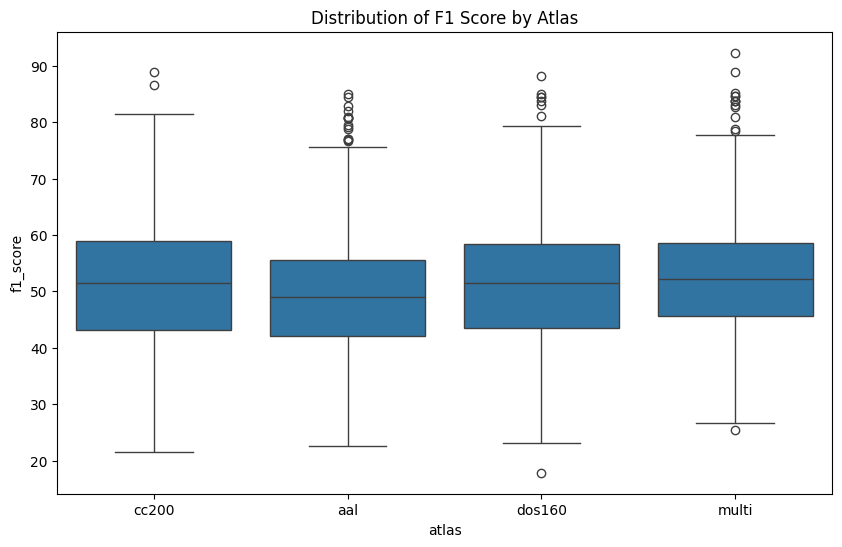

In [60]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.boxplot(x="atlas", y="f1_score", data=results_df)
plt.title("Distribution of F1 Score by Atlas")
plt.show()

12. Heatmap:

Create a heatmap of F1 Score across sites and atlases.

Site-specific Performance: The heatmap allows you to identify if certain atlases perform better at specific sites, which could be important for practical applications

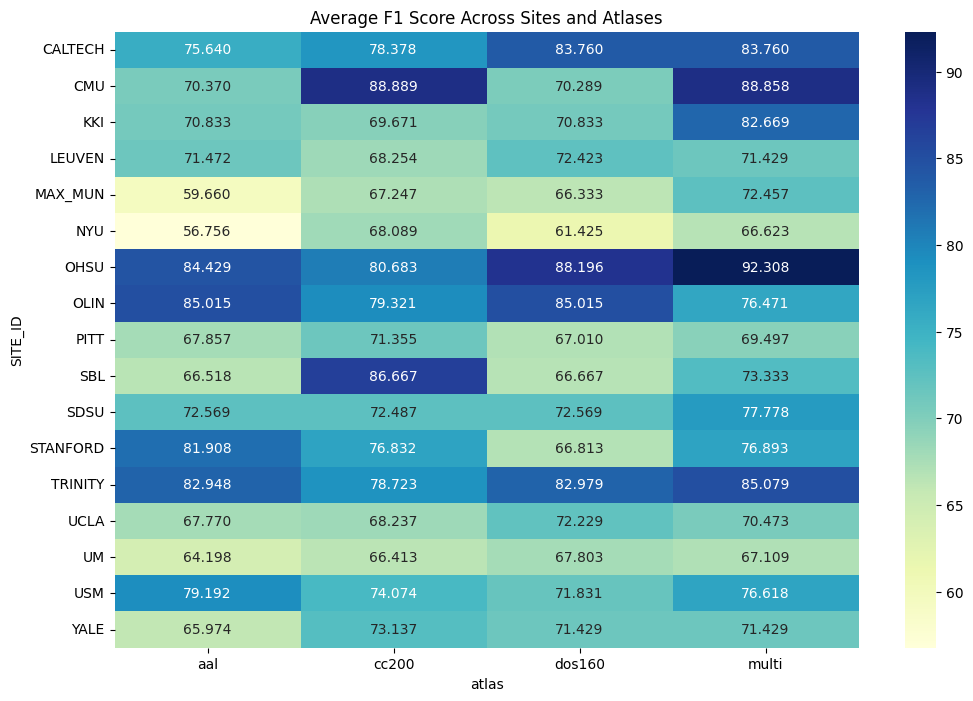

In [63]:
pivot_df = results_df.pivot_table(
    index="SITE_ID", columns="atlas", values="f1_score", aggfunc="max"
)

plt.figure(figsize=(12, 8))
sns.heatmap(pivot_df, annot=True, cmap="YlGnBu", fmt=".3f")
plt.title("Average F1 Score Across Sites and Atlases")
plt.show()

13. Interaction Plot:

Create an interaction plot to visualize how atlas performance varies across different graph features, feature engineering methods, and classifier models

Interactions: The interaction plots help you understand how atlas performance varies across different pipeline components. This can reveal if certain atlases are particularly well-suited for specific graph features, feature engineering methods, or classifier models


max_f1_by_graph_feature (Before Reindexing):
atlas                     aal      cc200     dos160      multi
graph_feature_type                                            
edge_based          81.908169  78.378378  73.695419  84.615385
graph_level         70.568663  72.734499  78.282989  77.777778
node_based          84.615385  88.888889  88.195675  92.307692

max_f1_by_graph_feature (After Reindexing):
atlas                     aal      cc200     dos160      multi
graph_feature_type                                            
node_based          84.615385  88.888889  88.195675  92.307692
edge_based          81.908169  78.378378  73.695419  84.615385
graph_level         70.568663  72.734499  78.282989  77.777778


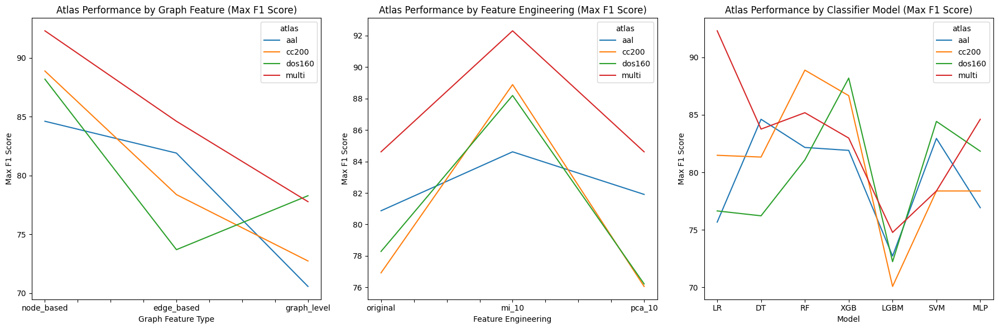

In [40]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Define the desired order for each category
graph_feature_order = ["node_based", "edge_based", "graph_level"]
feature_engineering_order = ["original", "mi_10", "pca_10"]
model_order = ["LR", "DT", "RF", "XGB", "LGBM", "SVM", "MLP"]

# Compute the maximum f1_score for each group
max_f1_by_graph_feature = (
    results_df.groupby(["graph_feature_type", "atlas"])["f1_score"].max().unstack()
)
max_f1_by_feature_engineering = (
    results_df.groupby(["feature_engineering", "atlas"])["f1_score"].max().unstack()
)
max_f1_by_model = results_df.groupby(["model", "atlas"])["f1_score"].max().unstack()

# # Print DataFrames to check if they are empty after reindexing
# print("\nmax_f1_by_graph_feature (Before Reindexing):")
# print(max_f1_by_graph_feature)

# Ensure the index (x-axis values) is categorical with the specified order
max_f1_by_graph_feature = max_f1_by_graph_feature.reindex(graph_feature_order)

# # Print DataFrames to check if they are empty after reindexing
# print("\nmax_f1_by_graph_feature (After Reindexing):")
# print(max_f1_by_graph_feature)

max_f1_by_feature_engineering = max_f1_by_feature_engineering.reindex(
    feature_engineering_order
)
max_f1_by_model = max_f1_by_model.reindex(model_order)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

# Plot for graph_feature_type
max_f1_by_graph_feature.plot(ax=ax1)
ax1.set_title("Atlas Performance by Graph Feature (Max F1 Score)")
ax1.set_xlabel("Graph Feature Type")
ax1.set_ylabel("Max F1 Score")

# Plot for feature_engineering
max_f1_by_feature_engineering.plot(ax=ax2)
ax2.set_title("Atlas Performance by Feature Engineering (Max F1 Score)")
ax2.set_xlabel("Feature Engineering")
ax2.set_ylabel("Max F1 Score")

# Plot for model
max_f1_by_model.plot(ax=ax3)  # Add transparency
ax3.set_title("Atlas Performance by Classifier Model (Max F1 Score)")
ax3.set_xlabel("Model")
ax3.set_ylabel("Max F1 Score")

plt.tight_layout()
plt.show()

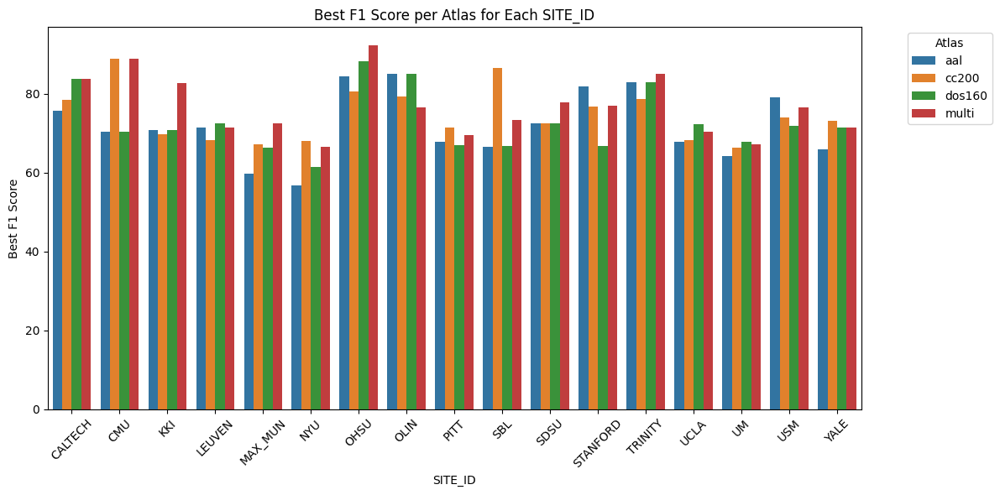

In [65]:
import matplotlib.pyplot as plt
import seaborn as sns

# Find the best training accuracy for each (SITE_ID, atlas) combination
best_train_acc_df = (
    results_df.groupby(["SITE_ID", "atlas"])["f1_score"].max().reset_index()
)

# Set up the bar plot
plt.figure(figsize=(12, 6))
sns.barplot(data=best_train_acc_df, x="SITE_ID", y="f1_score", hue="atlas")

# Add labels and title
plt.xlabel("SITE_ID")
plt.ylabel("Best F1 Score")
plt.title("Best F1 Score per Atlas for Each SITE_ID")
plt.legend(title="Atlas", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()
plt.show()

### 1. **Multi-Atlas vs. Single Atlas Comparison**

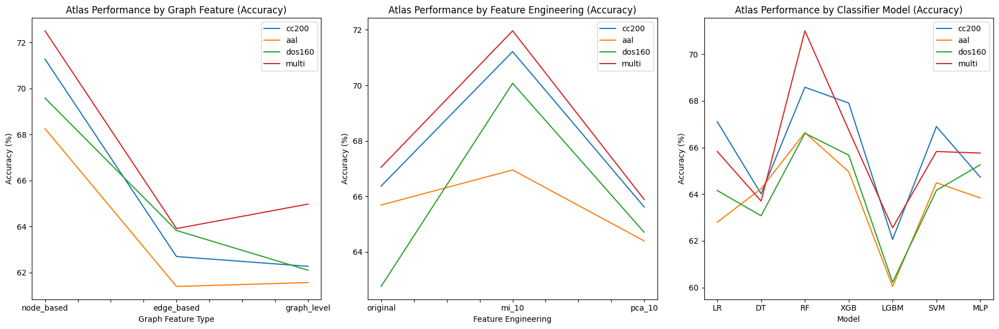

In [48]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Define the desired order for each category
graph_feature_order = ["node_based", "edge_based", "graph_level"]
feature_engineering_order = ["original", "mi_10", "pca_10"]
model_order = ["LR", "DT", "RF", "XGB", "LGBM", "SVM", "MLP"]

# Get the size of data for each SITE_ID (the number of samples for each site)
site_id_counts = subjects_df["SITE_ID"].value_counts()

# Get the unique counts for each configuration
unique_graph_feature_type = subjects_df["graph_feature_type"].nunique()
unique_feature_engineering = subjects_df["feature_engineering"].nunique()
unique_atlas = subjects_df["atlas"].nunique()

# Calculate the product of unique config values
product_of_unique_configs = (
    unique_graph_feature_type * unique_feature_engineering * unique_atlas
)

# Divide the value_counts by the product of unique config values
site_sizes = (site_id_counts / product_of_unique_configs).astype(int)


# Function to compute the best configuration per site for a given filtered DataFrame
def compute_best_config_per_site(filtered_df: pd.DataFrame):
    best_config_per_site = filtered_df.loc[
        filtered_df.groupby("SITE_ID")["cv_accuracy_mean"].idxmax()
    ]
    best_config_per_site = best_config_per_site.set_index("SITE_ID").join(site_sizes)
    return best_config_per_site


# Function to compute the weighted average accuracy
def compute_weighted_avg(
    filtered_best_config_per_site: pd.DataFrame, site_sizes: pd.Series
):
    return (
        filtered_best_config_per_site["cv_accuracy_mean"]
        * filtered_best_config_per_site.index.map(site_sizes)
    ).sum() / site_sizes.sum()


# Initialize dictionaries to store weighted average accuracies
weighted_avg_accuracy_by_graph_feature = {}
weighted_avg_accuracy_by_feature_engineering = {}
weighted_avg_accuracy_by_model = {}

# Compute weighted average accuracy for each combination of atlas and graph_feature_type
for atlas in results_df["atlas"].unique():
    for graph_feature_type in results_df["graph_feature_type"].unique():
        filtered_df = results_df[
            (results_df["atlas"] == atlas)
            & (results_df["graph_feature_type"] == graph_feature_type)
        ]
        best_config_per_site = compute_best_config_per_site(filtered_df)
        if graph_feature_type not in weighted_avg_accuracy_by_graph_feature:
            weighted_avg_accuracy_by_graph_feature[graph_feature_type] = {}
        weighted_avg_accuracy_by_graph_feature[graph_feature_type][atlas] = (
            compute_weighted_avg(best_config_per_site, site_sizes)
        )

# Compute weighted average accuracy for each combination of atlas and feature_engineering
for atlas in results_df["atlas"].unique():
    for feature_engineering in results_df["feature_engineering"].unique():
        filtered_df = results_df[
            (results_df["atlas"] == atlas)
            & (results_df["feature_engineering"] == feature_engineering)
        ]
        best_config_per_site = compute_best_config_per_site(filtered_df)
        if feature_engineering not in weighted_avg_accuracy_by_feature_engineering:
            weighted_avg_accuracy_by_feature_engineering[feature_engineering] = {}
        weighted_avg_accuracy_by_feature_engineering[feature_engineering][atlas] = (
            compute_weighted_avg(best_config_per_site, site_sizes)
        )

# Compute weighted average accuracy for each combination of atlas and model
for atlas in results_df["atlas"].unique():
    for model in results_df["model"].unique():
        filtered_df = results_df[
            (results_df["atlas"] == atlas) & (results_df["model"] == model)
        ]
        best_config_per_site = compute_best_config_per_site(filtered_df)
        if model not in weighted_avg_accuracy_by_model:
            weighted_avg_accuracy_by_model[model] = {}
        weighted_avg_accuracy_by_model[model][atlas] = compute_weighted_avg(
            best_config_per_site, site_sizes
        )

# Convert dictionaries to DataFrames
weighted_avg_accuracy_by_graph_feature_df = pd.DataFrame.from_dict(
    weighted_avg_accuracy_by_graph_feature, orient="index"
)
weighted_avg_accuracy_by_feature_engineering_df = pd.DataFrame.from_dict(
    weighted_avg_accuracy_by_feature_engineering, orient="index"
)
weighted_avg_accuracy_by_model_df = pd.DataFrame.from_dict(
    weighted_avg_accuracy_by_model, orient="index"
)

# Reindex for order
weighted_avg_accuracy_by_graph_feature_df = (
    weighted_avg_accuracy_by_graph_feature_df.reindex(graph_feature_order)
)
weighted_avg_accuracy_by_feature_engineering_df = (
    weighted_avg_accuracy_by_feature_engineering_df.reindex(feature_engineering_order)
)
weighted_avg_accuracy_by_model_df = weighted_avg_accuracy_by_model_df.reindex(
    model_order
)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

# Plot for graph_feature_type
if not weighted_avg_accuracy_by_graph_feature_df.empty:
    weighted_avg_accuracy_by_graph_feature_df.plot(ax=ax1)
    ax1.set_title("Atlas Performance by Graph Feature (Accuracy)")
    ax1.set_xlabel("Graph Feature Type")
    ax1.set_ylabel("Accuracy (%)")
else:
    ax1.text(
        0.5,
        0.5,
        "No Data",
        horizontalalignment="center",
        verticalalignment="center",
        transform=ax1.transAxes,
    )

# Plot for feature_engineering
if not weighted_avg_accuracy_by_feature_engineering_df.empty:
    weighted_avg_accuracy_by_feature_engineering_df.plot(ax=ax2)
    ax2.set_title("Atlas Performance by Feature Engineering (Accuracy)")
    ax2.set_xlabel("Feature Engineering")
    ax2.set_ylabel("Accuracy (%)")
else:
    ax2.text(
        0.5,
        0.5,
        "No Data",
        horizontalalignment="center",
        verticalalignment="center",
        transform=ax2.transAxes,
    )

# Plot for model
if not weighted_avg_accuracy_by_model_df.empty:
    weighted_avg_accuracy_by_model_df.plot(ax=ax3)
    ax3.set_title("Atlas Performance by Classifier Model (Accuracy)")
    ax3.set_xlabel("Model")
    ax3.set_ylabel("Accuracy (%)")
else:
    ax3.text(
        0.5,
        0.5,
        "No Data",
        horizontalalignment="center",
        verticalalignment="center",
        transform=ax3.transAxes,
    )

plt.tight_layout()
plt.show()

Weighted Performance Metrics by Atlas:
        Weighted Avg Accuracy  Weighted Precision  Weighted Recall  \
cc200               71.852191           72.309311        71.980676   
aal                 69.460401           68.852455        68.115942   
dos160              70.180520           70.817967        70.338164   
multi               73.041494           72.564369        72.463768   

        Weighted Sensitivity  Weighted Specificity  Weighted F1 Score  
cc200              69.614857             71.598731          71.356255  
aal                61.730767             70.665200          65.863606  
dos160             63.147528             74.730710          69.678848  
multi              68.700912             73.925323          72.111150  


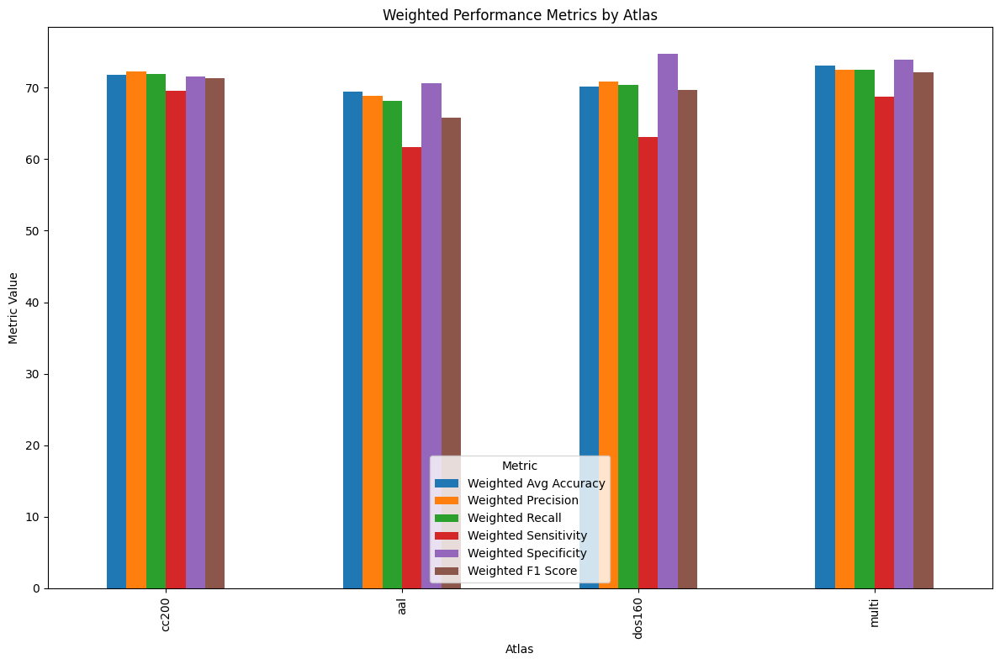

In [56]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Define the desired order for each category
atlas_order = ["cc200", "dos160", "aal", "multi"]
feature_engineering_order = ["original", "mi_10", "pca_10"]
graph_feature_order = ["node_based", "edge_based", "graph_level"]
model_order = ["LR", "DT", "RF", "XGB", "LGBM", "SVM", "MLP"]

# Get the unique counts for each configuration
unique_graph_feature_type = subjects_df["graph_feature_type"].nunique()
unique_feature_engineering = subjects_df["feature_engineering"].nunique()
unique_atlas = subjects_df["atlas"].nunique()

# Calculate the product of unique config values
product_of_unique_configs = (
    unique_graph_feature_type * unique_feature_engineering * unique_atlas
)

# Get the value_counts for SITE_ID
site_id_counts = subjects_df["SITE_ID"].value_counts()

# Divide the value_counts by the product of unique config values
site_sizes = (site_id_counts / product_of_unique_configs).astype(int)

# Function to compute the best configuration per site for a given filtered DataFrame
def compute_best_config_per_site(filtered_df: pd.DataFrame):
    best_config_per_site = filtered_df.loc[
        filtered_df.groupby("SITE_ID")["cv_accuracy_mean"].idxmax()
    ]
    best_config_per_site = best_config_per_site.set_index("SITE_ID").join(site_sizes)
    return best_config_per_site

# Function to compute the weighted average metrics
def compute_weighted_metrics(best_config_per_site: pd.DataFrame, site_sizes: pd.Series):
    weighted_avg_accuracy = (
        best_config_per_site["cv_accuracy_mean"]
        * best_config_per_site.index.map(site_sizes)
    ).sum() / site_sizes.sum()
    
    weighted_precision = (
        best_config_per_site["precision"] * best_config_per_site.index.map(site_sizes)
    ).sum() / site_sizes.sum()
    
    weighted_recall = (
        best_config_per_site["recall"] * best_config_per_site.index.map(site_sizes)
    ).sum() / site_sizes.sum()
    
    weighted_sensitivity = (
        best_config_per_site["sensitivity"] * best_config_per_site.index.map(site_sizes)
    ).sum() / site_sizes.sum()
    
    weighted_specificity = (
        best_config_per_site["specificity"] * best_config_per_site.index.map(site_sizes)
    ).sum() / site_sizes.sum()
    
    weighted_f1_score = (
        best_config_per_site["f1_score"] * best_config_per_site.index.map(site_sizes)
    ).sum() / site_sizes.sum()
    
    return {
        "Weighted Avg Accuracy": weighted_avg_accuracy,
        "Weighted Precision": weighted_precision,
        "Weighted Recall": weighted_recall,
        "Weighted Sensitivity": weighted_sensitivity,
        "Weighted Specificity": weighted_specificity,
        "Weighted F1 Score": weighted_f1_score
    }

# Initialize a dictionary to store metrics for each atlas
atlas_metrics = {}

# Compute metrics for each unique atlas
for atlas in results_df["atlas"].unique():
    filtered_df = results_df[results_df["atlas"] == atlas]
    best_config_per_site = compute_best_config_per_site(filtered_df)
    metrics = compute_weighted_metrics(best_config_per_site, site_sizes)
    atlas_metrics[atlas] = metrics

# Convert the metrics dictionary to a DataFrame
atlas_metrics_df = pd.DataFrame.from_dict(atlas_metrics, orient="index")

# Print the metrics for each atlas
print("Weighted Performance Metrics by Atlas:")
print(atlas_metrics_df)

# Plotting
fig, ax = plt.subplots(figsize=(12, 8))

# Plot the metrics for each atlas
if not atlas_metrics_df.empty:
    atlas_metrics_df.plot(kind='bar', ax=ax)
    ax.set_title("Weighted Performance Metrics by Atlas")
    ax.set_xlabel("Atlas")
    ax.set_ylabel("Metric Value")
    ax.legend(title="Metric")
else:
    ax.text(
        0.5,
        0.5,
        "No Data",
        horizontalalignment="center",
        verticalalignment="center",
        transform=ax.transAxes,
    )

plt.tight_layout()
plt.show()

In [58]:
atlas_metrics_df

,Weighted Avg Accuracy,Weighted Precision,Weighted Recall,Weighted Sensitivity,Weighted Specificity,Weighted F1 Score
cc200,71.852191,72.309311,71.980676,69.614857,71.598731,71.356255
aal,69.460401,68.852455,68.115942,61.730767,70.665200,65.863606
dos160,70.180520,70.817967,70.338164,63.147528,74.730710,69.678848
multi,73.041494,72.564369,72.463768,68.700912,73.925323,72.111150


### 2. **Graph Features Contribution**

Graph Feature Accuracies by Atlas:
        node_based  edge_based  graph_level
cc200    71.278117   62.698040    62.271685
dos160   69.585938   63.830430    62.102498
aal      68.256050   61.397879    61.565569
multi    72.506873   63.913626    64.976661

Graph Feature Accuracies by Feature Engineering:
          node_based  edge_based  graph_level
original   69.790593   63.402961    61.673030
mi_10      75.005080   65.289387    64.730029
pca_10     67.777635   64.837474    64.386803

Graph Feature Accuracies by Model:
      node_based  edge_based  graph_level
LR     68.077805   62.909918    61.425390
DT     66.511298   63.152890    62.700412
RF     73.258795   63.121217    64.744915
XGB    71.648147   63.087702    63.782786
LGBM   63.914207   59.177121    59.712943
SVM    68.786422   63.542715    60.111141
MLP    68.848681   63.761253    62.283604


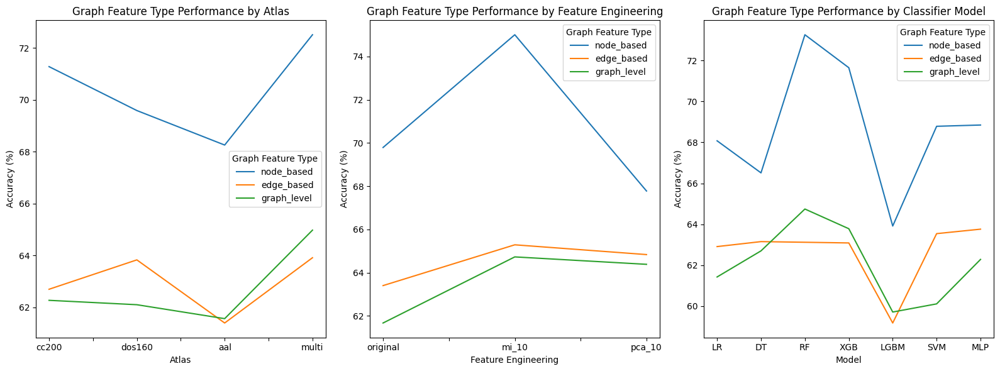

In [52]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Define the desired order for each category
atlas_order = ["cc200", "dos160", "aal", "multi"]
feature_engineering_order = ["original", "mi_10", "pca_10"]
model_order = ["LR", "DT", "RF", "XGB", "LGBM", "SVM", "MLP"]

# Get the size of data for each SITE_ID (the number of samples for each site)
site_id_counts = subjects_df["SITE_ID"].value_counts()

# Get the unique counts for each configuration
unique_graph_feature_type = subjects_df["graph_feature_type"].nunique()
unique_feature_engineering = subjects_df["feature_engineering"].nunique()
unique_atlas = subjects_df["atlas"].nunique()

# Calculate the product of unique config values
product_of_unique_configs = (
    unique_graph_feature_type * unique_feature_engineering * unique_atlas
)

# Divide the value_counts by the product of unique config values
site_sizes = (site_id_counts / product_of_unique_configs).astype(int)

# Function to compute the best configuration per site for a given filtered DataFrame
def compute_best_config_per_site(filtered_df: pd.DataFrame):
    best_config_per_site = filtered_df.loc[
        filtered_df.groupby("SITE_ID")["cv_accuracy_mean"].idxmax()
    ]
    best_config_per_site = best_config_per_site.set_index("SITE_ID").join(site_sizes)
    return best_config_per_site

# Function to compute the weighted average accuracy
def compute_weighted_avg(
    filtered_best_config_per_site: pd.DataFrame, site_sizes: pd.Series
):
    return (
        filtered_best_config_per_site["cv_accuracy_mean"]
        * filtered_best_config_per_site.index.map(site_sizes)
    ).sum() / site_sizes.sum()

# Initialize dictionaries to store accuracies
gf_accuracy_by_atlas = {}
gf_accuracy_by_feature_engineering = {}
gf_accuracy_by_model = {}

# Compute accuracy for each combination of graph_feature_type and atlas
for graph_feature_type in results_df["graph_feature_type"].unique():
    for atlas in results_df["atlas"].unique():
        filtered_df = results_df[
            (results_df["graph_feature_type"] == graph_feature_type)
            & (results_df["atlas"] == atlas)
        ]
        best_config_per_site = compute_best_config_per_site(filtered_df)
        if atlas not in gf_accuracy_by_atlas:
            gf_accuracy_by_atlas[atlas] = {}
        gf_accuracy_by_atlas[atlas][graph_feature_type] = compute_weighted_avg(
            best_config_per_site, site_sizes
        )

# Compute accuracy for each combination of graph_feature_type and feature_engineering
for graph_feature_type in results_df["graph_feature_type"].unique():
    for feature_engineering in results_df["feature_engineering"].unique():
        filtered_df = results_df[
            (results_df["graph_feature_type"] == graph_feature_type)
            & (results_df["feature_engineering"] == feature_engineering)
        ]
        best_config_per_site = compute_best_config_per_site(filtered_df)
        if feature_engineering not in gf_accuracy_by_feature_engineering:
            gf_accuracy_by_feature_engineering[feature_engineering] = {}
        gf_accuracy_by_feature_engineering[feature_engineering][
            graph_feature_type
        ] = compute_weighted_avg(best_config_per_site, site_sizes)

# Compute accuracy for each combination of graph_feature_type and model
for graph_feature_type in results_df["graph_feature_type"].unique():
    for model in results_df["model"].unique():
        filtered_df = results_df[
            (results_df["graph_feature_type"] == graph_feature_type) & (results_df["model"] == model)
        ]
        best_config_per_site = compute_best_config_per_site(filtered_df)
        if model not in gf_accuracy_by_model:
            gf_accuracy_by_model[model] = {}
        gf_accuracy_by_model[model][graph_feature_type] = compute_weighted_avg(
            best_config_per_site, site_sizes
        )

# Convert dictionaries to DataFrames
gf_accuracy_by_atlas_df = pd.DataFrame.from_dict(
    gf_accuracy_by_atlas, orient="index"
)
gf_accuracy_by_feature_engineering_df = pd.DataFrame.from_dict(
    gf_accuracy_by_feature_engineering, orient="index"
)
gf_accuracy_by_model_df = pd.DataFrame.from_dict(
    gf_accuracy_by_model, orient="index"
)

# Reindex for order
gf_accuracy_by_atlas_df = gf_accuracy_by_atlas_df.reindex(atlas_order)
gf_accuracy_by_feature_engineering_df = (
    gf_accuracy_by_feature_engineering_df.reindex(feature_engineering_order)
)
gf_accuracy_by_model_df = gf_accuracy_by_model_df.reindex(
    model_order
)

# Print intermediate DataFrames to check if they are empty
print("Graph Feature Accuracies by Atlas:")
print(gf_accuracy_by_atlas_df)

print("\nGraph Feature Accuracies by Feature Engineering:")
print(gf_accuracy_by_feature_engineering_df)

print("\nGraph Feature Accuracies by Model:")
print(gf_accuracy_by_model_df)

# Plotting
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 6))

# Plot for graph_feature_type
if not gf_accuracy_by_atlas_df.empty:
    gf_accuracy_by_atlas_df.plot(ax=ax1)
    ax1.set_title("Graph Feature Type Performance by Atlas")
    ax1.set_xlabel("Atlas")
    ax1.set_ylabel("Accuracy (%)")
    ax1.legend(title="Graph Feature Type")
else:
    ax1.text(
        0.5,
        0.5,
        "No Data",
        horizontalalignment="center",
        verticalalignment="center",
        transform=ax1.transAxes,
    )

# Plot for feature_engineering
if not gf_accuracy_by_feature_engineering_df.empty:
    gf_accuracy_by_feature_engineering_df.plot(ax=ax2)
    ax2.set_title("Graph Feature Type Performance by Feature Engineering")
    ax2.set_xlabel("Feature Engineering")
    ax2.set_ylabel("Accuracy (%)")
    ax2.legend(title="Graph Feature Type")
else:
    ax2.text(
        0.5,
        0.5,
        "No Data",
        horizontalalignment="center",
        verticalalignment="center",
        transform=ax2.transAxes,
    )

# Plot for model
if not gf_accuracy_by_model_df.empty:
    gf_accuracy_by_model_df.plot(ax=ax3)
    ax3.set_title("Graph Feature Type Performance by Classifier Model")
    ax3.set_xlabel("Model")
    ax3.set_ylabel("Accuracy (%)")
    ax3.legend(title="Graph Feature Type")
else:
    ax3.text(
        0.5,
        0.5,
        "No Data",
        horizontalalignment="center",
        verticalalignment="center",
        transform=ax3.transAxes,
    )

plt.tight_layout()
plt.show()

Weighted Performance Metrics by Graph Feature Type:
             Weighted Avg Accuracy  Weighted Precision  Weighted Recall  \
node_based               75.095155           75.201970        74.975845   
edge_based               67.148424           67.800088        67.246377   
graph_level              67.326416           64.295022        63.961353   

             Weighted Sensitivity  Weighted Specificity  Weighted F1 Score  
node_based              71.398421             76.013972          74.558845  
edge_based              61.230961             69.392691          66.090265  
graph_level             63.274327             62.431983          63.400418  


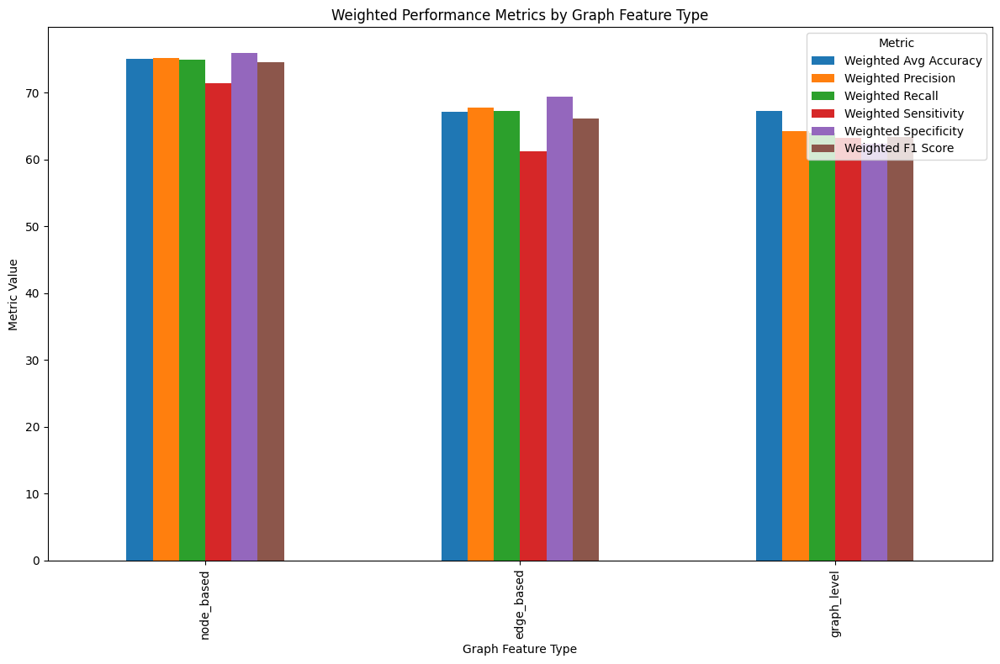

In [59]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Define the desired order for each category
atlas_order = ["cc200", "dos160", "aal", "multi"]
feature_engineering_order = ["original", "mi_10", "pca_10"]
graph_feature_order = ["node_based", "edge_based", "graph_level"]
model_order = ["LR", "DT", "RF", "XGB", "LGBM", "SVM", "MLP"]

# Get the unique counts for each configuration
unique_graph_feature_type = subjects_df["graph_feature_type"].nunique()
unique_feature_engineering = subjects_df["feature_engineering"].nunique()
unique_atlas = subjects_df["atlas"].nunique()

# Calculate the product of unique config values
product_of_unique_configs = (
    unique_graph_feature_type * unique_feature_engineering * unique_atlas
)

# Get the value_counts for SITE_ID
site_id_counts = subjects_df["SITE_ID"].value_counts()

# Divide the value_counts by the product of unique config values
site_sizes = (site_id_counts / product_of_unique_configs).astype(int)


# Function to compute the best configuration per site for a given filtered DataFrame
def compute_best_config_per_site(filtered_df: pd.DataFrame):
    best_config_per_site = filtered_df.loc[
        filtered_df.groupby("SITE_ID")["cv_accuracy_mean"].idxmax()
    ]
    best_config_per_site = best_config_per_site.set_index("SITE_ID").join(site_sizes)
    return best_config_per_site


# Function to compute the weighted average metrics
def compute_weighted_metrics(best_config_per_site: pd.DataFrame, site_sizes: pd.Series):
    weighted_avg_accuracy = (
        best_config_per_site["cv_accuracy_mean"]
        * best_config_per_site.index.map(site_sizes)
    ).sum() / site_sizes.sum()

    weighted_precision = (
        best_config_per_site["precision"] * best_config_per_site.index.map(site_sizes)
    ).sum() / site_sizes.sum()

    weighted_recall = (
        best_config_per_site["recall"] * best_config_per_site.index.map(site_sizes)
    ).sum() / site_sizes.sum()

    weighted_sensitivity = (
        best_config_per_site["sensitivity"] * best_config_per_site.index.map(site_sizes)
    ).sum() / site_sizes.sum()

    weighted_specificity = (
        best_config_per_site["specificity"] * best_config_per_site.index.map(site_sizes)
    ).sum() / site_sizes.sum()

    weighted_f1_score = (
        best_config_per_site["f1_score"] * best_config_per_site.index.map(site_sizes)
    ).sum() / site_sizes.sum()

    return {
        "Weighted Avg Accuracy": weighted_avg_accuracy,
        "Weighted Precision": weighted_precision,
        "Weighted Recall": weighted_recall,
        "Weighted Sensitivity": weighted_sensitivity,
        "Weighted Specificity": weighted_specificity,
        "Weighted F1 Score": weighted_f1_score,
    }


# Initialize a dictionary to store metrics for each graph_feature_type
graph_feature_metrics = {}

# Compute metrics for each unique graph_feature_type
for graph_feature_type in results_df["graph_feature_type"].unique():
    filtered_df = results_df[results_df["graph_feature_type"] == graph_feature_type]
    best_config_per_site = compute_best_config_per_site(filtered_df)
    metrics = compute_weighted_metrics(best_config_per_site, site_sizes)
    graph_feature_metrics[graph_feature_type] = metrics

# Convert the metrics dictionary to a DataFrame
graph_feature_metrics_df = pd.DataFrame.from_dict(graph_feature_metrics, orient="index")

# Print the metrics for each graph_feature_type
print("Weighted Performance Metrics by Graph Feature Type:")
print(graph_feature_metrics_df)

# Plotting
fig, ax = plt.subplots(figsize=(12, 8))

# Plot the metrics for each graph_feature_type
if not graph_feature_metrics_df.empty:
    graph_feature_metrics_df.plot(kind="bar", ax=ax)
    ax.set_title("Weighted Performance Metrics by Graph Feature Type")
    ax.set_xlabel("Graph Feature Type")
    ax.set_ylabel("Metric Value")
    ax.legend(title="Metric")
else:
    ax.text(
        0.5,
        0.5,
        "No Data",
        horizontalalignment="center",
        verticalalignment="center",
        transform=ax.transAxes,
    )

plt.tight_layout()
plt.show()

In [60]:
graph_feature_metrics_df

,Weighted Avg Accuracy,Weighted Precision,Weighted Recall,Weighted Sensitivity,Weighted Specificity,Weighted F1 Score
node_based,75.095155,75.201970,74.975845,71.398421,76.013972,74.558845
edge_based,67.148424,67.800088,67.246377,61.230961,69.392691,66.090265
graph_level,67.326416,64.295022,63.961353,63.274327,62.431983,63.400418


### 3. **Feature Engineering Effectiveness**

Feature Engineering Accuracies by Atlas:
         original      mi_10     pca_10
cc200   66.371135  71.215324  65.621865
dos160  62.757484  70.075535  64.710591
aal     65.689658  66.952334  64.397285
multi   67.050566  71.964326  65.892922

Feature Engineering Accuracies by Graph Feature Type:
              original      mi_10     pca_10
node_based   69.790593  75.005080  67.777635
edge_based   63.402961  65.289387  64.837474
graph_level  61.673030  64.730029  64.386803

Feature Engineering Accuracies by Model:
       original      mi_10     pca_10
LR    63.574171  69.145703  65.334936
DT    62.030275  66.997689  64.175287
RF    65.403704  73.472160  64.909201
XGB   65.107135  71.392407  63.757681
LGBM  61.694776  63.515113  61.277034
SVM   61.641036  69.197345  63.357673
MLP   64.167141  69.010034  64.503741


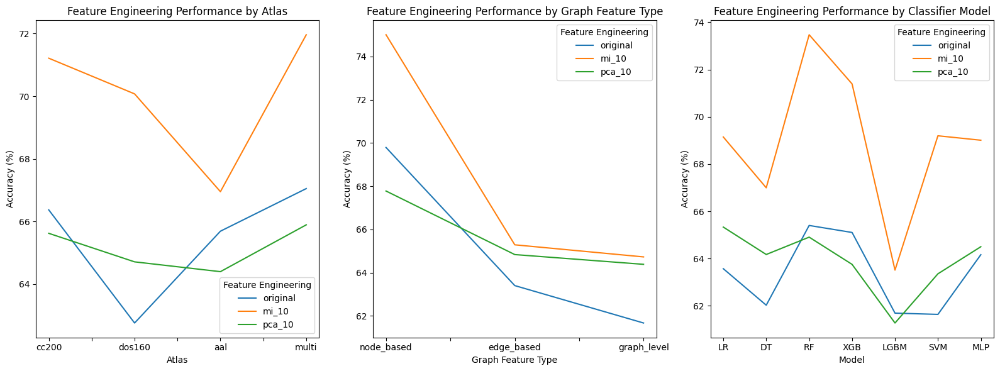

In [53]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Define the desired order for each category
atlas_order = ["cc200", "dos160", "aal", "multi"]
feature_engineering_order = ["original", "mi_10", "pca_10"]
graph_feature_order = ["node_based", "edge_based", "graph_level"]
model_order = ["LR", "DT", "RF", "XGB", "LGBM", "SVM", "MLP"]

# Get the size of data for each SITE_ID (the number of samples for each site)
site_id_counts = subjects_df["SITE_ID"].value_counts()

# Get the unique counts for each configuration
unique_graph_feature_type = subjects_df["graph_feature_type"].nunique()
unique_feature_engineering = subjects_df["feature_engineering"].nunique()
unique_atlas = subjects_df["atlas"].nunique()

# Calculate the product of unique config values
product_of_unique_configs = (
    unique_graph_feature_type * unique_feature_engineering * unique_atlas
)

# Divide the value_counts by the product of unique config values
site_sizes = (site_id_counts / product_of_unique_configs).astype(int)

# Function to compute the best configuration per site for a given filtered DataFrame
def compute_best_config_per_site(filtered_df: pd.DataFrame):
    best_config_per_site = filtered_df.loc[
        filtered_df.groupby("SITE_ID")["cv_accuracy_mean"].idxmax()
    ]
    best_config_per_site = best_config_per_site.set_index("SITE_ID").join(site_sizes)
    return best_config_per_site

# Function to compute the weighted average accuracy
def compute_weighted_avg(
    filtered_best_config_per_site: pd.DataFrame, site_sizes: pd.Series
):
    return (
        filtered_best_config_per_site["cv_accuracy_mean"]
        * filtered_best_config_per_site.index.map(site_sizes)
    ).sum() / site_sizes.sum()

# Initialize dictionaries to store accuracies
fe_accuracy_by_atlas = {}
fe_accuracy_by_graph_feature_type = {}
fe_accuracy_by_model = {}

# Compute accuracy for each combination of feature_engineering and atlas
for feature_engineering in results_df["feature_engineering"].unique():
    for atlas in results_df["atlas"].unique():
        filtered_df = results_df[
            (results_df["feature_engineering"] == feature_engineering)
            & (results_df["atlas"] == atlas)
        ]
        best_config_per_site = compute_best_config_per_site(filtered_df)
        if atlas not in fe_accuracy_by_atlas:
            fe_accuracy_by_atlas[atlas] = {}
        fe_accuracy_by_atlas[atlas][feature_engineering] = compute_weighted_avg(
            best_config_per_site, site_sizes
        )

# Compute accuracy for each combination of feature_engineering and graph_feature_type
for feature_engineering in results_df["feature_engineering"].unique():
    for graph_feature_type in results_df["graph_feature_type"].unique():
        filtered_df = results_df[
            (results_df["feature_engineering"] == feature_engineering)
            & (results_df["graph_feature_type"] == graph_feature_type)
        ]
        best_config_per_site = compute_best_config_per_site(filtered_df)
        if graph_feature_type not in fe_accuracy_by_graph_feature_type:
            fe_accuracy_by_graph_feature_type[graph_feature_type] = {}
        fe_accuracy_by_graph_feature_type[graph_feature_type][
            feature_engineering
        ] = compute_weighted_avg(best_config_per_site, site_sizes)

# Compute accuracy for each combination of feature_engineering and model
for feature_engineering in results_df["feature_engineering"].unique():
    for model in results_df["model"].unique():
        filtered_df = results_df[
            (results_df["feature_engineering"] == feature_engineering)
            & (results_df["model"] == model)
        ]
        best_config_per_site = compute_best_config_per_site(filtered_df)
        if model not in fe_accuracy_by_model:
            fe_accuracy_by_model[model] = {}
        fe_accuracy_by_model[model][feature_engineering] = compute_weighted_avg(
            best_config_per_site, site_sizes
        )

# Convert dictionaries to DataFrames
fe_accuracy_by_atlas_df = pd.DataFrame.from_dict(
    fe_accuracy_by_atlas, orient="index"
)
fe_accuracy_by_graph_feature_type_df = pd.DataFrame.from_dict(
    fe_accuracy_by_graph_feature_type, orient="index"
)
fe_accuracy_by_model_df = pd.DataFrame.from_dict(
    fe_accuracy_by_model, orient="index"
)

# Reindex for order
fe_accuracy_by_atlas_df = fe_accuracy_by_atlas_df.reindex(atlas_order)
fe_accuracy_by_graph_feature_type_df = (
    fe_accuracy_by_graph_feature_type_df.reindex(graph_feature_order)
)
fe_accuracy_by_model_df = fe_accuracy_by_model_df.reindex(
    model_order
)

# Print intermediate DataFrames to check if they are empty
print("Feature Engineering Accuracies by Atlas:")
print(fe_accuracy_by_atlas_df)

print("\nFeature Engineering Accuracies by Graph Feature Type:")
print(fe_accuracy_by_graph_feature_type_df)

print("\nFeature Engineering Accuracies by Model:")
print(fe_accuracy_by_model_df)

# Plotting
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 6))

# Plot for feature_engineering against atlas
if not fe_accuracy_by_atlas_df.empty:
    fe_accuracy_by_atlas_df.plot(ax=ax1)
    ax1.set_title("Feature Engineering Performance by Atlas")
    ax1.set_xlabel("Atlas")
    ax1.set_ylabel("Accuracy (%)")
    ax1.legend(title="Feature Engineering")
else:
    ax1.text(
        0.5,
        0.5,
        "No Data",
        horizontalalignment="center",
        verticalalignment="center",
        transform=ax1.transAxes,
    )

# Plot for feature_engineering against graph_feature_type
if not fe_accuracy_by_graph_feature_type_df.empty:
    fe_accuracy_by_graph_feature_type_df.plot(ax=ax2)
    ax2.set_title("Feature Engineering Performance by Graph Feature Type")
    ax2.set_xlabel("Graph Feature Type")
    ax2.set_ylabel("Accuracy (%)")
    ax2.legend(title="Feature Engineering")
else:
    ax2.text(
        0.5,
        0.5,
        "No Data",
        horizontalalignment="center",
        verticalalignment="center",
        transform=ax2.transAxes,
    )

# Plot for feature_engineering against model
if not fe_accuracy_by_model_df.empty:
    fe_accuracy_by_model_df.plot(ax=ax3)
    ax3.set_title("Feature Engineering Performance by Classifier Model")
    ax3.set_xlabel("Model")
    ax3.set_ylabel("Accuracy (%)")
    ax3.legend(title="Feature Engineering")
else:
    ax3.text(
        0.5,
        0.5,
        "No Data",
        horizontalalignment="center",
        verticalalignment="center",
        transform=ax3.transAxes,
    )

plt.tight_layout()
plt.show()

Weighted Performance Metrics by Feature Engineering:
          Weighted Avg Accuracy  Weighted Precision  Weighted Recall  \
original              70.430206           68.981412        68.502415   
mi_10                 75.034870           74.938373        74.685990   
pca_10                69.219342           67.467795        67.342995   

          Weighted Sensitivity  Weighted Specificity  Weighted F1 Score  
original             64.779937             69.251891          67.767543  
mi_10                73.358094             74.457987          74.510452  
pca_10               66.616419             66.697608          67.178664  


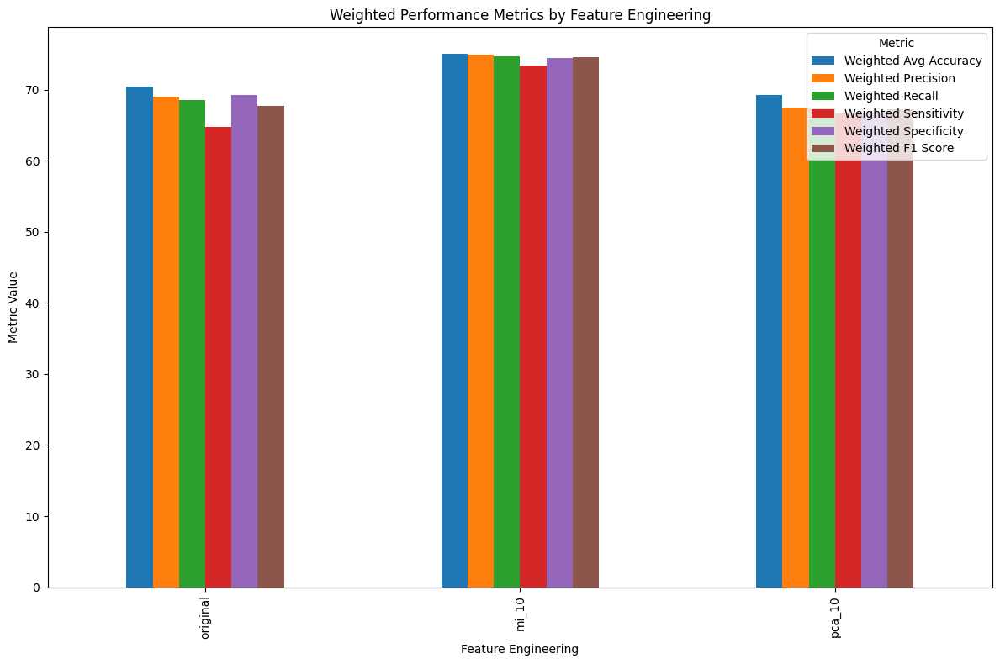

In [61]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Define the desired order for each category
atlas_order = ["cc200", "dos160", "aal", "multi"]
feature_engineering_order = ["original", "mi_10", "pca_10"]
graph_feature_order = ["node_based", "edge_based", "graph_level"]
model_order = ["LR", "DT", "RF", "XGB", "LGBM", "SVM", "MLP"]

# Get the unique counts for each configuration
unique_graph_feature_type = subjects_df["graph_feature_type"].nunique()
unique_feature_engineering = subjects_df["feature_engineering"].nunique()
unique_atlas = subjects_df["atlas"].nunique()

# Calculate the product of unique config values
product_of_unique_configs = (
    unique_graph_feature_type * unique_feature_engineering * unique_atlas
)

# Get the value_counts for SITE_ID
site_id_counts = subjects_df["SITE_ID"].value_counts()

# Divide the value_counts by the product of unique config values
site_sizes = (site_id_counts / product_of_unique_configs).astype(int)

# Function to compute the best configuration per site for a given filtered DataFrame
def compute_best_config_per_site(filtered_df: pd.DataFrame):
    best_config_per_site = filtered_df.loc[
        filtered_df.groupby("SITE_ID")["cv_accuracy_mean"].idxmax()
    ]
    best_config_per_site = best_config_per_site.set_index("SITE_ID").join(site_sizes)
    return best_config_per_site

# Function to compute the weighted average metrics
def compute_weighted_metrics(best_config_per_site: pd.DataFrame, site_sizes: pd.Series):
    weighted_avg_accuracy = (
        best_config_per_site["cv_accuracy_mean"]
        * best_config_per_site.index.map(site_sizes)
    ).sum() / site_sizes.sum()
    
    weighted_precision = (
        best_config_per_site["precision"] * best_config_per_site.index.map(site_sizes)
    ).sum() / site_sizes.sum()
    
    weighted_recall = (
        best_config_per_site["recall"] * best_config_per_site.index.map(site_sizes)
    ).sum() / site_sizes.sum()
    
    weighted_sensitivity = (
        best_config_per_site["sensitivity"] * best_config_per_site.index.map(site_sizes)
    ).sum() / site_sizes.sum()
    
    weighted_specificity = (
        best_config_per_site["specificity"] * best_config_per_site.index.map(site_sizes)
    ).sum() / site_sizes.sum()
    
    weighted_f1_score = (
        best_config_per_site["f1_score"] * best_config_per_site.index.map(site_sizes)
    ).sum() / site_sizes.sum()
    
    return {
        "Weighted Avg Accuracy": weighted_avg_accuracy,
        "Weighted Precision": weighted_precision,
        "Weighted Recall": weighted_recall,
        "Weighted Sensitivity": weighted_sensitivity,
        "Weighted Specificity": weighted_specificity,
        "Weighted F1 Score": weighted_f1_score
    }

# Initialize a dictionary to store metrics for each feature_engineering
feature_engineering_metrics = {}

# Compute metrics for each unique feature_engineering
for feature_engineering in results_df["feature_engineering"].unique():
    filtered_df = results_df[results_df["feature_engineering"] == feature_engineering]
    best_config_per_site = compute_best_config_per_site(filtered_df)
    metrics = compute_weighted_metrics(best_config_per_site, site_sizes)
    feature_engineering_metrics[feature_engineering] = metrics

# Convert the metrics dictionary to a DataFrame
feature_engineering_metrics_df = pd.DataFrame.from_dict(feature_engineering_metrics, orient="index")

# Print the metrics for each feature_engineering
print("Weighted Performance Metrics by Feature Engineering:")
print(feature_engineering_metrics_df)

# Plotting
fig, ax = plt.subplots(figsize=(12, 8))

# Plot the metrics for each feature_engineering
if not feature_engineering_metrics_df.empty:
    feature_engineering_metrics_df.plot(kind='bar', ax=ax)
    ax.set_title("Weighted Performance Metrics by Feature Engineering")
    ax.set_xlabel("Feature Engineering")
    ax.set_ylabel("Metric Value")
    ax.legend(title="Metric")
else:
    ax.text(
        0.5,
        0.5,
        "No Data",
        horizontalalignment="center",
        verticalalignment="center",
        transform=ax.transAxes,
    )

plt.tight_layout()
plt.show()

In [62]:
feature_engineering_metrics_df

,Weighted Avg Accuracy,Weighted Precision,Weighted Recall,Weighted Sensitivity,Weighted Specificity,Weighted F1 Score
original,70.430206,68.981412,68.502415,64.779937,69.251891,67.767543
mi_10,75.034870,74.938373,74.685990,73.358094,74.457987,74.510452
pca_10,69.219342,67.467795,67.342995,66.616419,66.697608,67.178664


### 4. **Binary ASD Classifier Performance**

Model Accuracies by Atlas:
               LR         DT         RF        XGB       LGBM        SVM  \
cc200   67.110149  64.016139  68.583969  67.904270  62.061151  66.899251   
dos160  64.159897  63.075491  66.611445  65.673598  60.226877  64.165590   
aal     62.799654  64.235395  66.639544  64.962015  60.048639  64.489939   
multi   65.832865  63.707044  71.000558  66.744944  62.560488  65.829456   

              MLP  
cc200   64.729771  
dos160  65.258851  
aal     63.839130  
multi   65.762310  

Model Accuracies by Graph Feature Type:
                    LR         DT         RF        XGB       LGBM        SVM  \
node_based   68.077805  66.511298  73.258795  71.648147  63.914207  68.786422   
edge_based   62.909918  63.152890  63.121217  63.087702  59.177121  63.542715   
graph_level  61.425390  62.700412  64.744915  63.782786  59.712943  60.111141   

                   MLP  
node_based   68.848681  
edge_based   63.761253  
graph_level  62.283604  

Model Accuracies by Featu

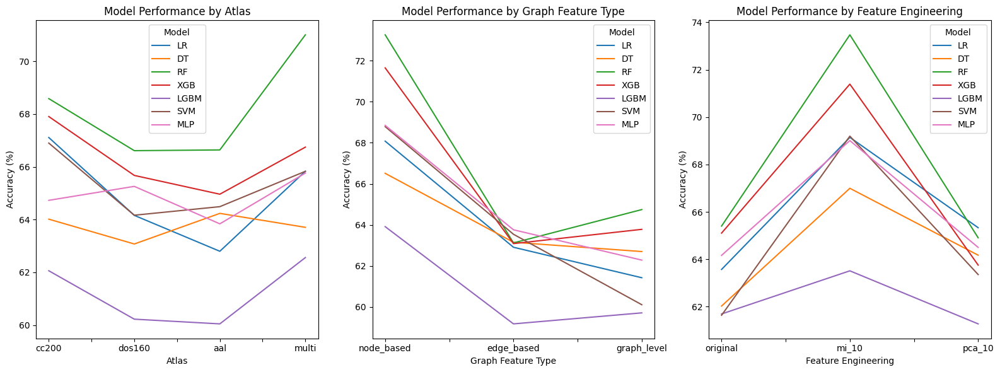

In [55]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Define the desired order for each category
atlas_order = ["cc200", "dos160", "aal", "multi"]
feature_engineering_order = ["original", "mi_10", "pca_10"]
graph_feature_order = ["node_based", "edge_based", "graph_level"]
model_order = ["LR", "DT", "RF", "XGB", "LGBM", "SVM", "MLP"]

# Get the size of data for each SITE_ID (the number of samples for each site)
site_id_counts = subjects_df["SITE_ID"].value_counts()

# Get the unique counts for each configuration
unique_graph_feature_type = subjects_df["graph_feature_type"].nunique()
unique_feature_engineering = subjects_df["feature_engineering"].nunique()
unique_atlas = subjects_df["atlas"].nunique()

# Calculate the product of unique config values
product_of_unique_configs = (
    unique_graph_feature_type * unique_feature_engineering * unique_atlas
)

# Divide the value_counts by the product of unique config values
site_sizes = (site_id_counts / product_of_unique_configs).astype(int)

# Function to compute the best configuration per site for a given filtered DataFrame
def compute_best_config_per_site(filtered_df: pd.DataFrame):
    best_config_per_site = filtered_df.loc[
        filtered_df.groupby("SITE_ID")["cv_accuracy_mean"].idxmax()
    ]
    best_config_per_site = best_config_per_site.set_index("SITE_ID").join(site_sizes)
    return best_config_per_site

# Function to compute the weighted average accuracy
def compute_weighted_avg(
    filtered_best_config_per_site: pd.DataFrame, site_sizes: pd.Series
):
    return (
        filtered_best_config_per_site["cv_accuracy_mean"]
        * filtered_best_config_per_site.index.map(site_sizes)
    ).sum() / site_sizes.sum()

# Initialize dictionaries to store accuracies
model_accuracy_by_atlas = {}
model_accuracy_by_graph_feature_type = {}
model_accuracy_by_feature_engineering = {}

# Compute accuracy for each combination of model and atlas
for model in results_df["model"].unique():
    for atlas in results_df["atlas"].unique():
        filtered_df = results_df[
            (results_df["model"] == model)
            & (results_df["atlas"] == atlas)
        ]
        best_config_per_site = compute_best_config_per_site(filtered_df)
        if atlas not in model_accuracy_by_atlas:
            model_accuracy_by_atlas[atlas] = {}
        model_accuracy_by_atlas[atlas][model] = compute_weighted_avg(
            best_config_per_site, site_sizes
        )

# Compute accuracy for each combination of model and graph_feature_type
for model in results_df["model"].unique():
    for graph_feature_type in results_df["graph_feature_type"].unique():
        filtered_df = results_df[
            (results_df["model"] == model)
            & (results_df["graph_feature_type"] == graph_feature_type)
        ]
        best_config_per_site = compute_best_config_per_site(filtered_df)
        if graph_feature_type not in model_accuracy_by_graph_feature_type:
            model_accuracy_by_graph_feature_type[graph_feature_type] = {}
        model_accuracy_by_graph_feature_type[graph_feature_type][
            model
        ] = compute_weighted_avg(best_config_per_site, site_sizes)

# Compute accuracy for each combination of model and feature_engineering
for model in results_df["model"].unique():
    for feature_engineering in results_df["feature_engineering"].unique():
        filtered_df = results_df[
            (results_df["model"] == model)
            & (results_df["feature_engineering"] == feature_engineering)
        ]
        best_config_per_site = compute_best_config_per_site(filtered_df)
        if feature_engineering not in model_accuracy_by_feature_engineering:
            model_accuracy_by_feature_engineering[feature_engineering] = {}
        model_accuracy_by_feature_engineering[feature_engineering][model] = compute_weighted_avg(
            best_config_per_site, site_sizes
        )

# Convert dictionaries to DataFrames
model_accuracy_by_atlas_df = pd.DataFrame.from_dict(
    model_accuracy_by_atlas, orient="index"
)
model_accuracy_by_graph_feature_type_df = pd.DataFrame.from_dict(
    model_accuracy_by_graph_feature_type, orient="index"
)
model_accuracy_by_feature_engineering_df = pd.DataFrame.from_dict(
    model_accuracy_by_feature_engineering, orient="index"
)

# Reindex for order
model_accuracy_by_atlas_df = model_accuracy_by_atlas_df.reindex(atlas_order)
model_accuracy_by_graph_feature_type_df = (
    model_accuracy_by_graph_feature_type_df.reindex(graph_feature_order)
)
model_accuracy_by_feature_engineering_df = model_accuracy_by_feature_engineering_df.reindex(
    feature_engineering_order
)

# Print intermediate DataFrames to check if they are empty
print("Model Accuracies by Atlas:")
print(model_accuracy_by_atlas_df)

print("\nModel Accuracies by Graph Feature Type:")
print(model_accuracy_by_graph_feature_type_df)

print("\nModel Accuracies by Feature Engineering:")
print(model_accuracy_by_feature_engineering_df)

# Plotting
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 6))

# Plot for model against atlas
if not model_accuracy_by_atlas_df.empty:
    model_accuracy_by_atlas_df.plot(ax=ax1)
    ax1.set_title("Model Performance by Atlas")
    ax1.set_xlabel("Atlas")
    ax1.set_ylabel("Accuracy (%)")
    ax1.legend(title="Model")
else:
    ax1.text(
        0.5,
        0.5,
        "No Data",
        horizontalalignment="center",
        verticalalignment="center",
        transform=ax1.transAxes,
    )

# Plot for model against graph_feature_type
if not model_accuracy_by_graph_feature_type_df.empty:
    model_accuracy_by_graph_feature_type_df.plot(ax=ax2)
    ax2.set_title("Model Performance by Graph Feature Type")
    ax2.set_xlabel("Graph Feature Type")
    ax2.set_ylabel("Accuracy (%)")
    ax2.legend(title="Model")
else:
    ax2.text(
        0.5,
        0.5,
        "No Data",
        horizontalalignment="center",
        verticalalignment="center",
        transform=ax2.transAxes,
    )

# Plot for model against feature_engineering
if not model_accuracy_by_feature_engineering_df.empty:
    model_accuracy_by_feature_engineering_df.plot(ax=ax3)
    ax3.set_title("Model Performance by Feature Engineering")
    ax3.set_xlabel("Feature Engineering")
    ax3.set_ylabel("Accuracy (%)")
    ax3.legend(title="Model")
else:
    ax3.text(
        0.5,
        0.5,
        "No Data",
        horizontalalignment="center",
        verticalalignment="center",
        transform=ax3.transAxes,
    )

plt.tight_layout()
plt.show()

Weighted Performance Metrics by Model:
      Weighted Avg Accuracy  Weighted Precision  Weighted Recall  \
LR                69.767982           70.063296        69.661836   
DT                67.608494           65.630781        65.314010   
RF                73.472160           73.999363        73.623188   
XGB               72.312398           72.468579        72.270531   
LGBM              64.161228           60.823360        64.251208   
SVM               69.792299           71.190183        69.758454   
MLP               70.374714           68.061568        67.632850   

      Weighted Sensitivity  Weighted Specificity  Weighted F1 Score  
LR               65.745996             71.898656          69.285126  
DT               61.442047             67.605712          65.122708  
RF               69.728268             75.130639          73.244557  
XGB              71.961480             70.878656          72.076178  
LGBM             58.543379             66.216818          61.56681

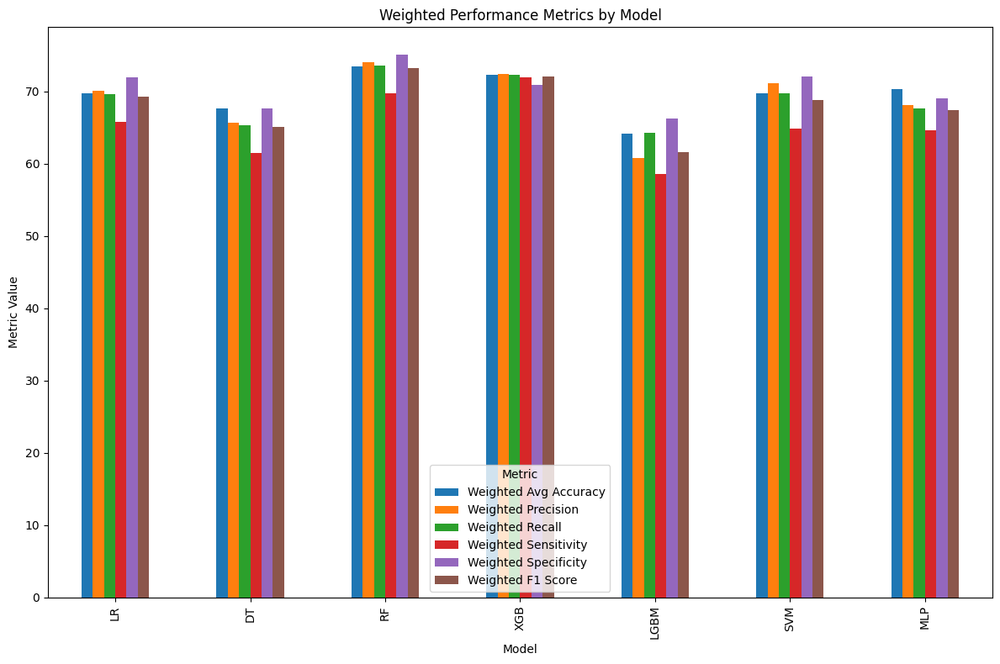

In [63]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Define the desired order for each category
atlas_order = ["cc200", "dos160", "aal", "multi"]
feature_engineering_order = ["original", "mi_10", "pca_10"]
graph_feature_order = ["node_based", "edge_based", "graph_level"]
model_order = ["LR", "DT", "RF", "XGB", "LGBM", "SVM", "MLP"]

# Get the unique counts for each configuration
unique_graph_feature_type = subjects_df["graph_feature_type"].nunique()
unique_feature_engineering = subjects_df["feature_engineering"].nunique()
unique_atlas = subjects_df["atlas"].nunique()

# Calculate the product of unique config values
product_of_unique_configs = (
    unique_graph_feature_type * unique_feature_engineering * unique_atlas
)

# Get the value_counts for SITE_ID
site_id_counts = subjects_df["SITE_ID"].value_counts()

# Divide the value_counts by the product of unique config values
site_sizes = (site_id_counts / product_of_unique_configs).astype(int)

# Function to compute the best configuration per site for a given filtered DataFrame
def compute_best_config_per_site(filtered_df: pd.DataFrame):
    best_config_per_site = filtered_df.loc[
        filtered_df.groupby("SITE_ID")["cv_accuracy_mean"].idxmax()
    ]
    best_config_per_site = best_config_per_site.set_index("SITE_ID").join(site_sizes)
    return best_config_per_site

# Function to compute the weighted average metrics
def compute_weighted_metrics(best_config_per_site: pd.DataFrame, site_sizes: pd.Series):
    weighted_avg_accuracy = (
        best_config_per_site["cv_accuracy_mean"]
        * best_config_per_site.index.map(site_sizes)
    ).sum() / site_sizes.sum()
    
    weighted_precision = (
        best_config_per_site["precision"] * best_config_per_site.index.map(site_sizes)
    ).sum() / site_sizes.sum()
    
    weighted_recall = (
        best_config_per_site["recall"] * best_config_per_site.index.map(site_sizes)
    ).sum() / site_sizes.sum()
    
    weighted_sensitivity = (
        best_config_per_site["sensitivity"] * best_config_per_site.index.map(site_sizes)
    ).sum() / site_sizes.sum()
    
    weighted_specificity = (
        best_config_per_site["specificity"] * best_config_per_site.index.map(site_sizes)
    ).sum() / site_sizes.sum()
    
    weighted_f1_score = (
        best_config_per_site["f1_score"] * best_config_per_site.index.map(site_sizes)
    ).sum() / site_sizes.sum()
    
    return {
        "Weighted Avg Accuracy": weighted_avg_accuracy,
        "Weighted Precision": weighted_precision,
        "Weighted Recall": weighted_recall,
        "Weighted Sensitivity": weighted_sensitivity,
        "Weighted Specificity": weighted_specificity,
        "Weighted F1 Score": weighted_f1_score
    }

# Initialize a dictionary to store metrics for each model
model_metrics = {}

# Compute metrics for each unique model
for model in results_df["model"].unique():
    filtered_df = results_df[results_df["model"] == model]
    best_config_per_site = compute_best_config_per_site(filtered_df)
    metrics = compute_weighted_metrics(best_config_per_site, site_sizes)
    model_metrics[model] = metrics

# Convert the metrics dictionary to a DataFrame
model_metrics_df = pd.DataFrame.from_dict(model_metrics, orient="index")

# Print the metrics for each model
print("Weighted Performance Metrics by Model:")
print(model_metrics_df)

# Plotting
fig, ax = plt.subplots(figsize=(12, 8))

# Plot the metrics for each model
if not model_metrics_df.empty:
    model_metrics_df.plot(kind='bar', ax=ax)
    ax.set_title("Weighted Performance Metrics by Model")
    ax.set_xlabel("Model")
    ax.set_ylabel("Metric Value")
    ax.legend(title="Metric")
else:
    ax.text(
        0.5,
        0.5,
        "No Data",
        horizontalalignment="center",
        verticalalignment="center",
        transform=ax.transAxes,
    )

plt.tight_layout()
plt.show()

In [64]:
model_metrics_df

,Weighted Avg Accuracy,Weighted Precision,Weighted Recall,Weighted Sensitivity,Weighted Specificity,Weighted F1 Score
LR,69.767982,70.063296,69.661836,65.745996,71.898656,69.285126
DT,67.608494,65.630781,65.314010,61.442047,67.605712,65.122708
RF,73.472160,73.999363,73.623188,69.728268,75.130639,73.244557
XGB,72.312398,72.468579,72.270531,71.961480,70.878656,72.076178
LGBM,64.161228,60.823360,64.251208,58.543379,66.216818,61.566813
SVM,69.792299,71.190183,69.758454,64.902836,72.076430,68.828963
MLP,70.374714,68.061568,67.632850,64.566940,69.022377,67.372238


In [4]:
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
import xgboost as xgb
import lightgbm as lgb
from sklearn.metrics import accuracy_score
import pandas as pd
import numpy as np

# Define the cases for feature engineering
cases = [
    {"graph_feature_type": "node_based", "feature": "degree"},
    {"graph_feature_type": "edge_based", "feature": "average_degree"},
    {"graph_feature_type": "graph_level", "feature": "average_degree"},
]

# Define the models to try
models = [
    LogisticRegression(),
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    xgb.XGBClassifier(),
    lgb.LGBMClassifier(verbose=-1),
    SVC(),
    MLPClassifier(),
]

model_names = {
    "LogisticRegression": "LR",
    "DecisionTreeClassifier": "DT",
    "RandomForestClassifier": "RF",
    "XGBClassifier": "XGB",
    "LGBMClassifier": "LGBM",
    "SVC": "SVM",
    "MLPClassifier": "MLP",
}

# Initialize a list to store results
results = []

# Loop over each combination of parameters
for site_id in subjects_df["SITE_ID"].unique():
    for atlas in subjects_df["atlas"].unique():
        for case in cases:
            for fe in subjects_df["feature_engineering"].unique():
                # Filter the dataset for the specific combination of SITE_ID, atlas, case, and feature engineering
                subset_df = subjects_df[
                    (subjects_df["SITE_ID"] == site_id)
                    & (subjects_df["atlas"] == atlas)
                    & (subjects_df["graph_feature_type"] == case["graph_feature_type"])
                    & (subjects_df["feature"] == case["feature"])
                    & (subjects_df["feature_engineering"] == fe)
                ]

                # Skip if subset is empty
                if subset_df.empty:
                    continue

                # Split into training and test sets
                train_df = subset_df[subset_df["test"] == 0]
                test_df = subset_df[subset_df["test"] == 1]

                # Skip if either training or test set is empty
                if train_df.empty or test_df.empty:
                    continue

                # Extract features and labels
                X_train = np.stack(train_df["features_value"].values)
                y_train = train_df["ASD"].values
                X_test = np.stack(test_df["features_value"].values)
                y_test = test_df["ASD"].values

                # Train and evaluate each classifier with cross-validation
                for model in models:
                    model_name = model_names[type(model).__name__]

                    # Use cross-validation on training data
                    cv_scores = cross_val_score(model, X_train, y_train, cv=5)
                    train_accuracy = cv_scores.mean()

                    # Fit the model on training data after cross-validation scores are computed
                    model.fit(X_train, y_train)

                    # Evaluate on the test data
                    y_pred = model.predict(X_test)
                    test_accuracy = accuracy_score(y_test, y_pred)

                    # Store results
                    results.append(
                        {
                            "SITE_ID": site_id,
                            "atlas": atlas,
                            "graph_feature_type": case["graph_feature_type"],
                            "feature": case["feature"],
                            "feature_engineering": fe,
                            "model": model_name,
                            "train_accuracy": train_accuracy,
                            "test_accuracy": test_accuracy,
                        }
                    )

                    print(
                        f"SITE_ID: {site_id}, Model: {model_name}, Atlas: {atlas}, Feature Engineering: {fe}, Case: {case}, Train Accuracy: {train_accuracy:.4f}, Test Accuracy: {test_accuracy:.4f}"
                    )

# Convert results to a DataFrame
results_df = pd.DataFrame(results)

# Display results DataFrame to verify performance of each model.
print(results_df.head())

SITE_ID: NYU, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5929, Test Accuracy: 0.5143
SITE_ID: NYU, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6143, Test Accuracy: 0.4286
SITE_ID: NYU, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5714, Test Accuracy: 0.6571
SITE_ID: NYU, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5786, Test Accuracy: 0.5714
SITE_ID: NYU, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5929, Test Accuracy: 0.5714
SITE_ID: NYU, Model: SVM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: NYU, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5929, Test Accuracy: 0.6857
SITE_ID: NYU, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5786, Test Accuracy: 0.5429
SITE_ID: NYU, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5571, Test Accuracy: 0.5714
SITE_ID: NYU, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5714, Test Accuracy: 0.5143
SITE_ID: NYU, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5571, Test Accuracy: 0.5143
SITE_ID: NYU, Model: LGBM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: NYU, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5214, Test Accuracy: 0.4857


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: NYU, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5143, Test Accuracy: 0.6000
SITE_ID: NYU, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5214, Test Accuracy: 0.6571
SITE_ID: NYU, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5214, Test Accuracy: 0.6571
SITE_ID: NYU, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4786, Test Accuracy: 0.5714
SITE_ID: NYU, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4857, Test Accuracy: 0.6000
SITE_ID: NYU, Model: SVM, Atlas: cc200, Feature Engi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: NYU, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4929, Test Accuracy: 0.6571
SITE_ID: NYU, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5571, Test Accuracy: 0.6000
SITE_ID: NYU, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5571, Test Accuracy: 0.5714
SITE_ID: NYU, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5571, Test Accuracy: 0.5714
SITE_ID: NYU, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5571, Test Accuracy: 0.5714
SITE_ID: NYU, Model: LGBM, Atlas: cc200, Feature Engineering: mi_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: NYU, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4286, Test Accuracy: 0.5714


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: NYU, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5286, Test Accuracy: 0.5143
SITE_ID: NYU, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4714, Test Accuracy: 0.5143
SITE_ID: NYU, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5571, Test Accuracy: 0.6857
SITE_ID: NYU, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4929, Test Accuracy: 0.6000
SITE_ID: NYU, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4929, Test Accuracy: 0.6000
SITE_ID: NYU, Model: SVM, Atlas: cc200, Feature

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: NYU, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5571, Test Accuracy: 0.5714
SITE_ID: NYU, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.6000
SITE_ID: NYU, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6214, Test Accuracy: 0.6000
SITE_ID: NYU, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.6000
SITE_ID: NYU, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6214, Test Accuracy: 0.6571
SITE_ID: NYU, Model: LGBM, Atlas: cc200, Feature Engineering

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: NYU, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5857, Test Accuracy: 0.4286
SITE_ID: NYU, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5643, Test Accuracy: 0.4571
SITE_ID: NYU, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4929, Test Accuracy: 0.6000
SITE_ID: NYU, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5286, Test Accuracy: 0.5714
SITE_ID: NYU, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5214, Test Accuracy: 0.4000
SITE_ID: NYU, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_ty

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: NYU, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5286, Test Accuracy: 0.5714
SITE_ID: NYU, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5571, Test Accuracy: 0.6000
SITE_ID: NYU, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.3714
SITE_ID: NYU, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5286, Test Accuracy: 0.4857
SITE_ID: NYU, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5643, Test Accuracy: 0.3143
SITE_ID: NYU, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feat

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: NYU, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5571, Test Accuracy: 0.6000
SITE_ID: NYU, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5214, Test Accuracy: 0.5143
SITE_ID: NYU, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.3429
SITE_ID: NYU, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5571, Test Accuracy: 0.6286
SITE_ID: NYU, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4714, Test Accuracy: 0.5714
SITE_ID: NYU, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'fe

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: NYU, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.5143
SITE_ID: NYU, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5286, Test Accuracy: 0.4857
SITE_ID: NYU, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4571, Test Accuracy: 0.5143
SITE_ID: NYU, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5071, Test Accuracy: 0.4000
SITE_ID: NYU, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5286, Test Accuracy: 0.4286
SITE_ID: NYU, Model: LGBM, Atlas: aal, Feature Engineering: original, Cas

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: NYU, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.5429
SITE_ID: NYU, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5643, Test Accuracy: 0.6000
SITE_ID: NYU, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5643, Test Accuracy: 0.6286
SITE_ID: NYU, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5714, Test Accuracy: 0.6286
SITE_ID: NYU, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.6286
SITE_ID: NYU, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Case: {'

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: NYU, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5571, Test Accuracy: 0.6571
SITE_ID: NYU, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4714, Test Accuracy: 0.6286
SITE_ID: NYU, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4643, Test Accuracy: 0.4571
SITE_ID: NYU, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5071, Test Accuracy: 0.4571
SITE_ID: NYU, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.5143
SITE_ID: NYU, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: NYU, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4786, Test Accuracy: 0.3714


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: NYU, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.5714
SITE_ID: NYU, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5714, Test Accuracy: 0.6286
SITE_ID: NYU, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6571
SITE_ID: NYU, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.7143
SITE_ID: NYU, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4786, Test Accuracy: 0.6571
SITE_ID: NYU, Model: SVM, Atlas: aal, Feature Engineering

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: NYU, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4714, Test Accuracy: 0.6857
SITE_ID: NYU, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5643, Test Accuracy: 0.6000
SITE_ID: NYU, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.5714
SITE_ID: NYU, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5571, Test Accuracy: 0.6000
SITE_ID: NYU, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.5714
SITE_ID: NYU, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Cas

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: NYU, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.4286
SITE_ID: NYU, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5071, Test Accuracy: 0.6286
SITE_ID: NYU, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5214, Test Accuracy: 0.5714


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


SITE_ID: NYU, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.4571
SITE_ID: NYU, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5143, Test Accuracy: 0.5429
SITE_ID: NYU, Model: LGBM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5143, Test Accuracy: 0.6000
SITE_ID: NYU, Model: SVM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.5714


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: NYU, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5214, Test Accuracy: 0.6286
SITE_ID: NYU, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.5429
SITE_ID: NYU, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5286, Test Accuracy: 0.5714
SITE_ID: NYU, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5571, Test Accuracy: 0.4857
SITE_ID: NYU, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4929, Test Accuracy: 0.5429
SITE_ID: NYU, Model: LGBM, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': '

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: NYU, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5357, Test Accuracy: 0.5143
SITE_ID: NYU, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5357, Test Accuracy: 0.6000
SITE_ID: NYU, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.5714
SITE_ID: NYU, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.5429
SITE_ID: NYU, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5929, Test Accuracy: 0.4571
SITE_ID: NYU, Model: LGBM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type':

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: NYU, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5643, Test Accuracy: 0.6571
SITE_ID: NYU, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5143, Test Accuracy: 0.5429
SITE_ID: NYU, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5214, Test Accuracy: 0.3714
SITE_ID: NYU, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5714, Test Accuracy: 0.6571
SITE_ID: NYU, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4929, Test Accuracy: 0.5143
SITE_ID: NYU, Model: LGBM, Atlas: dos160, Feature Engineer

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: NYU, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5357, Test Accuracy: 0.5143
SITE_ID: NYU, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5714, Test Accuracy: 0.5714
SITE_ID: NYU, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5786, Test Accuracy: 0.4857
SITE_ID: NYU, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5643, Test Accuracy: 0.5143
SITE_ID: NYU, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6143, Test Accuracy: 0.5143
SITE_ID: NYU, Model: LGBM, Atlas: dos160, Feature Engineerin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: NYU, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5929, Test Accuracy: 0.5143
SITE_ID: NYU, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5714, Test Accuracy: 0.6857
SITE_ID: NYU, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5214, Test Accuracy: 0.5143
SITE_ID: NYU, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.5429
SITE_ID: NYU, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5071, Test Accuracy: 0.5429
SITE_ID: NYU, Model: LGBM, Atlas: dos160, Feature Engineeri

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: NYU, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.5714
SITE_ID: NYU, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.4571
SITE_ID: NYU, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.6000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: NYU, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6000
SITE_ID: NYU, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4929, Test Accuracy: 0.6000
SITE_ID: NYU, Model: LGBM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.4286
SITE_ID: NYU, Model: SVM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.5714


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: NYU, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5571, Test Accuracy: 0.3714
SITE_ID: NYU, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.5714
SITE_ID: NYU, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5929, Test Accuracy: 0.5429
SITE_ID: NYU, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5929, Test Accuracy: 0.5714
SITE_ID: NYU, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6071, Test Accuracy: 0.6286
SITE_ID: NYU, Model: LGBM, Atlas: dos160, Feature Engin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: NYU, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5929, Test Accuracy: 0.4571
SITE_ID: NYU, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5286, Test Accuracy: 0.6000
SITE_ID: NYU, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4786, Test Accuracy: 0.6000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


SITE_ID: NYU, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.5143
SITE_ID: NYU, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5286, Test Accuracy: 0.6286
SITE_ID: NYU, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5571, Test Accuracy: 0.6286
SITE_ID: NYU, Model: SVM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5571, Test Accuracy: 0.5429
SITE_ID: NYU, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5857, Test Accuracy: 0.6571
SITE_ID: NYU, Model: LR, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_t

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: NYU, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6214, Test Accuracy: 0.6571
SITE_ID: NYU, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5857, Test Accuracy: 0.6571
SITE_ID: NYU, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5786, Test Accuracy: 0.5429
SITE_ID: NYU, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5786, Test Accuracy: 0.5714
SITE_ID: NYU, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.5429
SITE_ID: NYU, Model: LGBM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: NYU, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5643, Test Accuracy: 0.6571
SITE_ID: NYU, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4357, Test Accuracy: 0.7143
SITE_ID: NYU, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5286, Test Accuracy: 0.5143
SITE_ID: NYU, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5071, Test Accuracy: 0.4571
SITE_ID: NYU, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4643, Test Accuracy: 0.5429
SITE_ID: NYU, Model: LGBM, Atlas: multi, Feature Engineering: o

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: NYU, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3857, Test Accuracy: 0.7429
SITE_ID: NYU, Model: LR, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5571, Test Accuracy: 0.5429
SITE_ID: NYU, Model: DT, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.4571
SITE_ID: NYU, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5357, Test Accuracy: 0.5714
SITE_ID: NYU, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5714, Test Accuracy: 0.5143
SITE_ID: NYU, Model: LGBM, Atlas: multi, Feature Engineering: mi_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: NYU, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5786, Test Accuracy: 0.5429
SITE_ID: NYU, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5214, Test Accuracy: 0.5714
SITE_ID: NYU, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.4857
SITE_ID: NYU, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4857, Test Accuracy: 0.4286
SITE_ID: NYU, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.5143
SITE_ID: NYU, Model: LGBM, Atlas: multi, Feature Engineering: pc

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: NYU, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4929, Test Accuracy: 0.5714
SITE_ID: NYU, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.4857
SITE_ID: NYU, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.5143


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: NYU, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6071, Test Accuracy: 0.5429
SITE_ID: NYU, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4929, Test Accuracy: 0.4857
SITE_ID: NYU, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4786, Test Accuracy: 0.4571
SITE_ID: NYU, Model: SVM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.4571


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: NYU, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6571, Test Accuracy: 0.4571
SITE_ID: NYU, Model: LR, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5786, Test Accuracy: 0.4286
SITE_ID: NYU, Model: DT, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.4000
SITE_ID: NYU, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6071, Test Accuracy: 0.4571
SITE_ID: NYU, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5643, Test Accuracy: 0.4286
SITE_ID: NYU, Model: LGBM, Atlas: multi, Feature Engineering

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: NYU, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.3714
SITE_ID: NYU, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.5429
SITE_ID: NYU, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5071, Test Accuracy: 0.6000
SITE_ID: NYU, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5714, Test Accuracy: 0.6286
SITE_ID: NYU, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5571, Test Accuracy: 0.5714
SITE_ID: NYU, Model: LGBM, Atlas: multi, Feature Engineerin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: NYU, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4857, Test Accuracy: 0.5714
SITE_ID: YALE, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3889, Test Accuracy: 0.5000
SITE_ID: YALE, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4111, Test Accuracy: 0.6667
SITE_ID: YALE, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4722, Test Accuracy: 0.6667
SITE_ID: YALE, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4778, Test Accuracy: 0.7500
SITE_ID: YALE, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case: {'g

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: YALE, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6806, Test Accuracy: 0.4167
SITE_ID: YALE, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4722, Test Accuracy: 0.4167
SITE_ID: YALE, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4750, Test Accuracy: 0.3333
SITE_ID: YALE, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5694, Test Accuracy: 0.4167
SITE_ID: YALE, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5444, Test Accuracy: 0.5833
SITE_ID: YALE, Model: LGBM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type':

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: YALE, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4972, Test Accuracy: 0.7500
SITE_ID: YALE, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5444, Test Accuracy: 0.4167
SITE_ID: YALE, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4556, Test Accuracy: 0.5833
SITE_ID: YALE, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4583, Test Accuracy: 0.5833
SITE_ID: YALE, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4306, Test Accuracy: 0.5833
SITE_ID: YALE, Model: LGBM, Atlas: cc200, Feature Engineer

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: YALE, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3861, Test Accuracy: 0.5000
SITE_ID: YALE, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5444, Test Accuracy: 0.3333
SITE_ID: YALE, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5444, Test Accuracy: 0.3333
SITE_ID: YALE, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5444, Test Accuracy: 0.3333
SITE_ID: YALE, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5444, Test Accuracy: 0.3333
SITE_ID: YALE, Model: LGBM, Atlas: cc200, Feature Engineerin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: YALE, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5444, Test Accuracy: 0.5000
SITE_ID: YALE, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: YALE, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4778, Test Accuracy: 0.7500
SITE_ID: YALE, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3222, Test Accuracy: 0.5000
SITE_ID: YALE, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4750, Test Accuracy: 0.6667
SITE_ID: YALE, Model: LGBM, Atlas: cc200, Feat

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: YALE, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4750, Test Accuracy: 0.4167
SITE_ID: YALE, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.5000
SITE_ID: YALE, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4778, Test Accuracy: 0.4167
SITE_ID: YALE, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.4167
SITE_ID: YALE, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.5000
SITE_ID: YALE, Model: LGBM, Atlas: cc200, Feature Engin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: YALE, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5917, Test Accuracy: 0.4167
SITE_ID: YALE, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4806, Test Accuracy: 0.4167
SITE_ID: YALE, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3583, Test Accuracy: 0.4167
SITE_ID: YALE, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3389, Test Accuracy: 0.5000
SITE_ID: YALE, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.2500, Test Accuracy: 0.5000
SITE_ID: YALE, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feat

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: YALE, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5889, Test Accuracy: 0.7500
SITE_ID: YALE, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4528, Test Accuracy: 0.5000
SITE_ID: YALE, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4556, Test Accuracy: 0.3333
SITE_ID: YALE, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3694, Test Accuracy: 0.5000
SITE_ID: YALE, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5250, Test Accuracy: 0.3333
SITE_ID: YALE, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: YALE, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4611, Test Accuracy: 0.3333
SITE_ID: YALE, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4750, Test Accuracy: 0.3333
SITE_ID: YALE, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5222, Test Accuracy: 0.5000
SITE_ID: YALE, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4556, Test Accuracy: 0.4167
SITE_ID: YALE, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6667
SITE_ID: YALE, Model: LGBM, Atlas: aal, Feature Engineering: origina

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: YALE, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5417, Test Accuracy: 0.5000
SITE_ID: YALE, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5222, Test Accuracy: 0.3333
SITE_ID: YALE, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5222, Test Accuracy: 0.3333
SITE_ID: YALE, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5222, Test Accuracy: 0.3333
SITE_ID: YALE, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5444, Test Accuracy: 0.3333
SITE_ID: YALE, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Ca

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: YALE, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6139, Test Accuracy: 0.3333
SITE_ID: YALE, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6583, Test Accuracy: 0.3333
SITE_ID: YALE, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5444, Test Accuracy: 0.5833
SITE_ID: YALE, Model: SVM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.2500


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: YALE, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6111, Test Accuracy: 0.5000
SITE_ID: YALE, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4306, Test Accuracy: 0.3333
SITE_ID: YALE, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4583, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: YALE, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.2500, Test Accuracy: 0.3333
SITE_ID: YALE, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4306, Test Accuracy: 0.3333
SITE_ID: YALE, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5444, Test Accuracy: 0.3333
SITE_ID: YALE, Model: SVM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4556, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: YALE, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3889, Test Accuracy: 0.3333
SITE_ID: YALE, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5444, Test Accuracy: 0.3333
SITE_ID: YALE, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5444, Test Accuracy: 0.3333
SITE_ID: YALE, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5444, Test Accuracy: 0.3333
SITE_ID: YALE, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5444, Test Accuracy: 0.3333
SITE_ID: YALE, Model: LGBM, Atlas: aal, Feature Engineering: mi_1

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: YALE, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4028, Test Accuracy: 0.3333
SITE_ID: YALE, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6389, Test Accuracy: 0.4167
SITE_ID: YALE, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5278, Test Accuracy: 0.3333
SITE_ID: YALE, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5194, Test Accuracy: 0.6667
SITE_ID: YALE, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5222, Test Accuracy: 0.5833
SITE_ID: YALE, Model: LGBM, Atlas: dos160, Feature Engineering: original, Case:

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: YALE, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7056, Test Accuracy: 0.4167
SITE_ID: YALE, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5889, Test Accuracy: 0.5833
SITE_ID: YALE, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6111, Test Accuracy: 0.4167
SITE_ID: YALE, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5639, Test Accuracy: 0.4167
SITE_ID: YALE, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5861, Test Accuracy: 0.3333
SITE_ID: YALE, Model: LGBM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: YALE, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5444, Test Accuracy: 0.4167
SITE_ID: YALE, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4111, Test Accuracy: 0.5833
SITE_ID: YALE, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5028, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: YALE, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4111, Test Accuracy: 0.5000
SITE_ID: YALE, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.4167
SITE_ID: YALE, Model: LGBM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5444, Test Accuracy: 0.4167
SITE_ID: YALE, Model: SVM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6583, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: YALE, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3889, Test Accuracy: 0.4167
SITE_ID: YALE, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5444, Test Accuracy: 0.4167
SITE_ID: YALE, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.5000
SITE_ID: YALE, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4556, Test Accuracy: 0.8333
SITE_ID: YALE, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.3333
SITE_ID: YALE, Model: LGBM, Atlas: dos160, Feature Engi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: YALE, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5444, Test Accuracy: 0.7500
SITE_ID: YALE, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4528, Test Accuracy: 0.2500
SITE_ID: YALE, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5222, Test Accuracy: 0.4167
SITE_ID: YALE, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5417, Test Accuracy: 0.5000
SITE_ID: YALE, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5472, Test Accuracy: 0.4167
SITE_ID: YALE, Model: LGBM, Atlas: dos160, Feature Eng

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: YALE, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4972, Test Accuracy: 0.5000
SITE_ID: YALE, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5194, Test Accuracy: 0.4167
SITE_ID: YALE, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5389, Test Accuracy: 0.4167
SITE_ID: YALE, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.5833
SITE_ID: YALE, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6194, Test Accuracy: 0.4167
SITE_ID: YALE, Model: LGBM, Atlas: dos160

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: YALE, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5222, Test Accuracy: 0.5000
SITE_ID: YALE, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5444, Test Accuracy: 0.3333
SITE_ID: YALE, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5444, Test Accuracy: 0.3333
SITE_ID: YALE, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5444, Test Accuracy: 0.3333
SITE_ID: YALE, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5444, Test Accuracy: 0.3333
SITE_ID: YALE, Model: LGBM, Atlas: dos160, Feature

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: YALE, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3833, Test Accuracy: 0.5833
SITE_ID: YALE, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5028, Test Accuracy: 0.5000
SITE_ID: YALE, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.7500
SITE_ID: YALE, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6389, Test Accuracy: 0.5000
SITE_ID: YALE, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4806, Test Accuracy: 0.5000
SITE_ID: YALE, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: YALE, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.8000, Test Accuracy: 0.5833
SITE_ID: YALE, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7500, Test Accuracy: 0.5833
SITE_ID: YALE, Model: LGBM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5222, Test Accuracy: 0.5833
SITE_ID: YALE, Model: SVM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6139, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: YALE, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6583, Test Accuracy: 0.5000
SITE_ID: YALE, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5778, Test Accuracy: 0.5833
SITE_ID: YALE, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5944, Test Accuracy: 0.6667
SITE_ID: YALE, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5722, Test Accuracy: 0.5000
SITE_ID: YALE, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5250, Test Accuracy: 0.7500
SITE_ID: YALE, Model: LGBM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type':

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: YALE, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5139, Test Accuracy: 0.2500
SITE_ID: YALE, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4944, Test Accuracy: 0.5000
SITE_ID: YALE, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5222, Test Accuracy: 0.5833
SITE_ID: YALE, Model: SVM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4556, Test Accuracy: 0.4167


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: YALE, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.5000
SITE_ID: YALE, Model: LR, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4778, Test Accuracy: 0.3333
SITE_ID: YALE, Model: DT, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7056, Test Accuracy: 0.6667
SITE_ID: YALE, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6806, Test Accuracy: 0.6667
SITE_ID: YALE, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6583, Test Accuracy: 0.8333
SITE_ID: YALE, Model: LGBM, Atlas: multi, Feature Engineerin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: YALE, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6139, Test Accuracy: 0.4167
SITE_ID: YALE, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4556, Test Accuracy: 0.4167
SITE_ID: YALE, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5944, Test Accuracy: 0.3333
SITE_ID: YALE, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5917, Test Accuracy: 0.3333
SITE_ID: YALE, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5694, Test Accuracy: 0.3333
SITE_ID: YALE, Model: LGBM, Atlas: multi, Feature Engineeri

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: YALE, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5444, Test Accuracy: 0.3333
SITE_ID: YALE, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4778, Test Accuracy: 0.5000
SITE_ID: YALE, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5222, Test Accuracy: 0.5000
SITE_ID: YALE, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4000, Test Accuracy: 0.1667
SITE_ID: YALE, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4472, Test Accuracy: 0.5833
SITE_ID: YALE, Model: LGBM, Atlas: multi, Feat

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: YALE, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4528, Test Accuracy: 0.4167
SITE_ID: YALE, Model: LR, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4750, Test Accuracy: 0.5833
SITE_ID: YALE, Model: DT, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6111, Test Accuracy: 0.3333
SITE_ID: YALE, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6111, Test Accuracy: 0.4167
SITE_ID: YALE, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5472, Test Accuracy: 0.5000
SITE_ID: YALE, Model: LGBM, Atlas: multi, Feature Engin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: YALE, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4278, Test Accuracy: 0.7500
SITE_ID: YALE, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3472, Test Accuracy: 0.4167
SITE_ID: YALE, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5472, Test Accuracy: 0.2500
SITE_ID: YALE, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4361, Test Accuracy: 0.4167
SITE_ID: YALE, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5694, Test Accuracy: 0.5000
SITE_ID: YALE, Model: LGBM, Atlas: multi, Feature Engi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: YALE, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3167, Test Accuracy: 0.4167
SITE_ID: KKI, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.8000
SITE_ID: KKI, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5821, Test Accuracy: 0.8000
SITE_ID: KKI, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6036, Test Accuracy: 0.6000
SITE_ID: KKI, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4679, Test Accuracy: 0.6000
SITE_ID: KKI, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case: {'graph

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: KKI, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6536, Test Accuracy: 0.3000
SITE_ID: KKI, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4750, Test Accuracy: 0.7000
SITE_ID: KKI, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5821, Test Accuracy: 0.3000
SITE_ID: KKI, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5071, Test Accuracy: 0.4000
SITE_ID: KKI, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4750, Test Accuracy: 0.3000
SITE_ID: KKI, Model: LGBM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: KKI, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5750, Test Accuracy: 0.2000
SITE_ID: KKI, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6071, Test Accuracy: 0.3000
SITE_ID: KKI, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4929, Test Accuracy: 0.6000
SITE_ID: KKI, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4250, Test Accuracy: 0.4000
SITE_ID: KKI, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4179, Test Accuracy: 0.6000
SITE_ID: KKI, Model: LGBM, Atlas: cc200, Feature Engineering: o

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: KKI, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5036, Test Accuracy: 0.3000
SITE_ID: KKI, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5786, Test Accuracy: 0.6000
SITE_ID: KKI, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5786, Test Accuracy: 0.6000
SITE_ID: KKI, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5786, Test Accuracy: 0.6000
SITE_ID: KKI, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5786, Test Accuracy: 0.6000
SITE_ID: KKI, Model: LGBM, Atlas: cc200, Feature Engineering: mi_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: KKI, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4714, Test Accuracy: 0.4000
SITE_ID: KKI, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4179, Test Accuracy: 0.4000
SITE_ID: KKI, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: KKI, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4464, Test Accuracy: 0.6000
SITE_ID: KKI, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4214, Test Accuracy: 0.5000
SITE_ID: KKI, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5786, Test Accuracy: 0.6000
SITE_ID: KKI, Model: SVM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5786, Test Accuracy: 0.6000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: KKI, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3929, Test Accuracy: 0.5000
SITE_ID: KKI, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4714, Test Accuracy: 0.6000
SITE_ID: KKI, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4536, Test Accuracy: 0.4000
SITE_ID: KKI, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.4000
SITE_ID: KKI, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4536, Test Accuracy: 0.4000
SITE_ID: KKI, Model: LGBM, Atlas: cc200, Feature Engineering

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: KKI, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4250, Test Accuracy: 0.3000
SITE_ID: KKI, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3964, Test Accuracy: 0.6000
SITE_ID: KKI, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4714, Test Accuracy: 0.3000
SITE_ID: KKI, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3929, Test Accuracy: 0.5000
SITE_ID: KKI, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4821, Test Accuracy: 0.5000
SITE_ID: KKI, Model: LGBM, Atlas: cc200, Feature Engineerin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: KKI, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3714, Test Accuracy: 0.5000
SITE_ID: KKI, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.6000
SITE_ID: KKI, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5786, Test Accuracy: 0.6000
SITE_ID: KKI, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.6000
SITE_ID: KKI, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7321, Test Accuracy: 0.7000
SITE_ID: KKI, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_ty

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: KKI, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5214, Test Accuracy: 0.8000
SITE_ID: KKI, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6857, Test Accuracy: 0.6000
SITE_ID: KKI, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5321, Test Accuracy: 0.4000
SITE_ID: KKI, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6143, Test Accuracy: 0.6000
SITE_ID: KKI, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5607, Test Accuracy: 0.6000
SITE_ID: KKI, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'fe

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: KKI, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5250, Test Accuracy: 0.5000
SITE_ID: KKI, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4964, Test Accuracy: 0.5000
SITE_ID: KKI, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3143, Test Accuracy: 0.2000
SITE_ID: KKI, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5036, Test Accuracy: 0.4000
SITE_ID: KKI, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3714, Test Accuracy: 0.5000
SITE_ID: KKI, Model: LGBM, Atlas: aal, Feature Engineering: original, Cas

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: KKI, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6536, Test Accuracy: 0.4000
SITE_ID: KKI, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5536, Test Accuracy: 0.6000
SITE_ID: KKI, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5786, Test Accuracy: 0.6000
SITE_ID: KKI, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5286, Test Accuracy: 0.6000
SITE_ID: KKI, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5786, Test Accuracy: 0.6000
SITE_ID: KKI, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Case: {'

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: KKI, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5036, Test Accuracy: 0.6000
SITE_ID: KKI, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5286, Test Accuracy: 0.6000
SITE_ID: KKI, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4750, Test Accuracy: 0.6000
SITE_ID: KKI, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5036, Test Accuracy: 0.6000
SITE_ID: KKI, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5607, Test Accuracy: 0.4000
SITE_ID: KKI, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: KKI, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5571, Test Accuracy: 0.6000
SITE_ID: KKI, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5036, Test Accuracy: 0.2000
SITE_ID: KKI, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5536, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: KKI, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6036, Test Accuracy: 0.5000
SITE_ID: KKI, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6286, Test Accuracy: 0.4000
SITE_ID: KKI, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5786, Test Accuracy: 0.6000
SITE_ID: KKI, Model: SVM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5786, Test Accuracy: 0.6000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: KKI, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.5000
SITE_ID: KKI, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5250, Test Accuracy: 0.6000
SITE_ID: KKI, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7679, Test Accuracy: 0.6000
SITE_ID: KKI, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7429, Test Accuracy: 0.7000
SITE_ID: KKI, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6607, Test Accuracy: 0.5000
SITE_ID: KKI, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Cas

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: KKI, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5750, Test Accuracy: 0.6000
SITE_ID: KKI, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6000
SITE_ID: KKI, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4179, Test Accuracy: 0.6000
SITE_ID: KKI, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5036, Test Accuracy: 0.6000
SITE_ID: KKI, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4750, Test Accuracy: 0.7000
SITE_ID: KKI, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, C

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: KKI, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.7000
SITE_ID: KKI, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.8000
SITE_ID: KKI, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5536, Test Accuracy: 0.7000
SITE_ID: KKI, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5286, Test Accuracy: 0.6000
SITE_ID: KKI, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4929, Test Accuracy: 0.4000
SITE_ID: KKI, Model: LGBM, Atlas: dos160, Feature Engineering: original, Case: {'gra

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: KKI, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6679, Test Accuracy: 0.8000
SITE_ID: KKI, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6071, Test Accuracy: 0.6000
SITE_ID: KKI, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5571, Test Accuracy: 0.5000
SITE_ID: KKI, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4964, Test Accuracy: 0.7000
SITE_ID: KKI, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4750, Test Accuracy: 0.6000
SITE_ID: KKI, Model: LGBM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type':

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: KKI, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5250, Test Accuracy: 0.8000
SITE_ID: KKI, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4179, Test Accuracy: 0.6000
SITE_ID: KKI, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4143, Test Accuracy: 0.6000
SITE_ID: KKI, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.7000
SITE_ID: KKI, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6321, Test Accuracy: 0.5000
SITE_ID: KKI, Model: LGBM, Atlas: dos160, Feature Engineer

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: KKI, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4750, Test Accuracy: 0.7000
SITE_ID: KKI, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6607, Test Accuracy: 0.7000
SITE_ID: KKI, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5464, Test Accuracy: 0.7000
SITE_ID: KKI, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4964, Test Accuracy: 0.5000
SITE_ID: KKI, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6321, Test Accuracy: 0.6000
SITE_ID: KKI, Model: LGBM, Atlas: dos160, Feature Engineerin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: KKI, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6607, Test Accuracy: 0.6000
SITE_ID: KKI, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5857, Test Accuracy: 0.7000
SITE_ID: KKI, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.5000
SITE_ID: KKI, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.6000
SITE_ID: KKI, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6321, Test Accuracy: 0.7000
SITE_ID: KKI, Model: LGBM, Atlas: dos160, Feature Engineeri

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: KKI, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7107, Test Accuracy: 0.7000
SITE_ID: KKI, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.7000
SITE_ID: KKI, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.2571, Test Accuracy: 0.6000
SITE_ID: KKI, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4429, Test Accuracy: 0.5000
SITE_ID: KKI, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4821, Test Accuracy: 0.6000
SITE_ID: KKI, Model: LGBM, Atlas: dos160, Feat

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: KKI, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4250, Test Accuracy: 0.9000
SITE_ID: KKI, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5036, Test Accuracy: 0.7000
SITE_ID: KKI, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5964, Test Accuracy: 0.3000
SITE_ID: KKI, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5964, Test Accuracy: 0.3000
SITE_ID: KKI, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5071, Test Accuracy: 0.5000
SITE_ID: KKI, Model: LGBM, Atlas: dos160, Feature Engin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: KKI, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5786, Test Accuracy: 0.8000
SITE_ID: KKI, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6107, Test Accuracy: 0.6000
SITE_ID: KKI, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6071, Test Accuracy: 0.8000
SITE_ID: KKI, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6071, Test Accuracy: 0.6000
SITE_ID: KKI, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5036, Test Accuracy: 0.5000
SITE_ID: KKI, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {'graph

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: KKI, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7893, Test Accuracy: 0.9000
SITE_ID: KKI, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6821, Test Accuracy: 0.7000
SITE_ID: KKI, Model: LGBM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6036, Test Accuracy: 0.5000
SITE_ID: KKI, Model: SVM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6571, Test Accuracy: 0.9000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: KKI, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6071, Test Accuracy: 0.8000
SITE_ID: KKI, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4571, Test Accuracy: 0.6000
SITE_ID: KKI, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5821, Test Accuracy: 0.6000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: KKI, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4357, Test Accuracy: 0.6000
SITE_ID: KKI, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6036, Test Accuracy: 0.6000
SITE_ID: KKI, Model: LGBM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6036, Test Accuracy: 0.5000
SITE_ID: KKI, Model: SVM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5750, Test Accuracy: 0.5000
SITE_ID: KKI, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4179, Test Accuracy: 0.4000
SITE_ID: KKI, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': '

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: KKI, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3893, Test Accuracy: 0.5000
SITE_ID: KKI, Model: LR, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6286, Test Accuracy: 0.6000
SITE_ID: KKI, Model: DT, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5679, Test Accuracy: 0.5000
SITE_ID: KKI, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5464, Test Accuracy: 0.5000
SITE_ID: KKI, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5464, Test Accuracy: 0.5000
SITE_ID: KKI, Model: LGBM, Atlas: multi, Feature Engineering: mi_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: KKI, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.5000
SITE_ID: KKI, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5250, Test Accuracy: 0.6000
SITE_ID: KKI, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4714, Test Accuracy: 0.6000
SITE_ID: KKI, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5250, Test Accuracy: 0.5000
SITE_ID: KKI, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3607, Test Accuracy: 0.6000
SITE_ID: KKI, Model: LGBM, Atlas: multi, Feature Engineering: pc

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: KKI, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5750, Test Accuracy: 0.5000
SITE_ID: KKI, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5071, Test Accuracy: 0.5000
SITE_ID: KKI, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4786, Test Accuracy: 0.5000
SITE_ID: KKI, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.4000
SITE_ID: KKI, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5250, Test Accuracy: 0.5000
SITE_ID: KKI, Model: LGBM, Atlas: multi, Feature En

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: KKI, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4036, Test Accuracy: 0.5000
SITE_ID: KKI, Model: LR, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4429, Test Accuracy: 0.5000
SITE_ID: KKI, Model: DT, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.7000
SITE_ID: KKI, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4679, Test Accuracy: 0.5000
SITE_ID: KKI, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5964, Test Accuracy: 0.6000
SITE_ID: KKI, Model: LGBM, Atlas: multi, Feature Engineering

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: KKI, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.4000
SITE_ID: KKI, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4821, Test Accuracy: 0.7000
SITE_ID: KKI, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3964, Test Accuracy: 0.3000
SITE_ID: KKI, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3714, Test Accuracy: 0.6000
SITE_ID: KKI, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4429, Test Accuracy: 0.4000
SITE_ID: KKI, Model: LGBM, Atlas: multi, Feature Engineerin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: MAX_MUN, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6306, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3667, Test Accuracy: 0.2727
SITE_ID: MAX_MUN, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3361, Test Accuracy: 0.3636
SITE_ID: MAX_MUN, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4139, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4111, Test Accuracy: 0.3636
SITE_ID: MAX_MUN, Model: LGBM, Atlas: cc200, Feature Engineering: pca_10, Case: {'gr

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: MAX_MUN, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4111, Test Accuracy: 0.4545
SITE_ID: MAX_MUN, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5389, Test Accuracy: 0.4545


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


SITE_ID: MAX_MUN, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.6364
SITE_ID: MAX_MUN, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5361, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: SVM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4861, Test Accuracy: 0.5455


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: MAX_MUN, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4417, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4861, Test Accuracy: 0.6364
SITE_ID: MAX_MUN, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5361, Test Accuracy: 0.6364
SITE_ID: MAX_MUN, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5361, Test Accuracy: 0.6364
SITE_ID: MAX_MUN, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4861, Test Accuracy: 0.6364
SITE_ID: MAX_MUN, Model: LGBM, Atlas: cc200, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: MAX_MUN, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4611, Test Accuracy: 0.6364
SITE_ID: MAX_MUN, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4417, Test Accuracy: 0.3636
SITE_ID: MAX_MUN, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3889, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3917, Test Accuracy: 0.6364
SITE_ID: MAX_MUN, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4361, Test Accuracy: 0.6364
SITE_ID: MAX_MUN, Model: LGBM, Atlas: cc200,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: MAX_MUN, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4583, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3417, Test Accuracy: 0.8182
SITE_ID: MAX_MUN, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4639, Test Accuracy: 0.4545


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: MAX_MUN, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3694, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5139, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5361, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: SVM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.6364


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: MAX_MUN, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4444, Test Accuracy: 0.6364
SITE_ID: MAX_MUN, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5306, Test Accuracy: 0.6364
SITE_ID: MAX_MUN, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5833, Test Accuracy: 0.4545
SITE_ID: MAX_MUN, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6111, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5833, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: LGBM, Atlas: cc

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: MAX_MUN, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3917, Test Accuracy: 0.4545
SITE_ID: MAX_MUN, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4611, Test Accuracy: 0.6364
SITE_ID: MAX_MUN, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6111, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5639, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5583, Test Accuracy: 0.7273
SITE_ID: MAX_MUN, Model: LGBM, Atlas: c

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: MAX_MUN, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5806, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3139, Test Accuracy: 0.2727
SITE_ID: MAX_MUN, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4417, Test Accuracy: 0.3636


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: MAX_MUN, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3889, Test Accuracy: 0.4545
SITE_ID: MAX_MUN, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5361, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: SVM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3667, Test Accuracy: 0.2727
SITE_ID: MAX_MUN, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'gra

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: MAX_MUN, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.3636
SITE_ID: MAX_MUN, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3917, Test Accuracy: 0.4545
SITE_ID: MAX_MUN, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5361, Test Accuracy: 0.7273
SITE_ID: MAX_MUN, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.7273
SITE_ID: MAX_MUN, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4611, Test Accuracy: 0.6364
SITE_ID: MAX_MUN, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: MAX_MUN, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4139, Test Accuracy: 0.3636
SITE_ID: MAX_MUN, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3917, Test Accuracy: 0.7273
SITE_ID: MAX_MUN, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3667, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3944, Test Accuracy: 0.6364
SITE_ID: MAX_MUN, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.3636
SITE_ID: MAX_MUN, Model: LGBM, Atlas: aal, Feature En

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: MAX_MUN, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4417, Test Accuracy: 0.6364
SITE_ID: MAX_MUN, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4889, Test Accuracy: 0.6364
SITE_ID: MAX_MUN, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5361, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5111, Test Accuracy: 0.6364
SITE_ID: MAX_MUN, Model: LGBM, Atlas: aal, Feature Engi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: MAX_MUN, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4639, Test Accuracy: 0.6364
SITE_ID: MAX_MUN, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4389, Test Accuracy: 0.4545
SITE_ID: MAX_MUN, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.6364
SITE_ID: MAX_MUN, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3611, Test Accuracy: 0.4545
SITE_ID: MAX_MUN, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3861, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: LGBM, Atlas: aal, Feature Eng

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: MAX_MUN, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.2917, Test Accuracy: 0.6364
SITE_ID: MAX_MUN, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4306, Test Accuracy: 0.6364
SITE_ID: MAX_MUN, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4889, Test Accuracy: 0.7273


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: MAX_MUN, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5111, Test Accuracy: 0.7273
SITE_ID: MAX_MUN, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5806, Test Accuracy: 0.6364
SITE_ID: MAX_MUN, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5361, Test Accuracy: 0.6364
SITE_ID: MAX_MUN, Model: SVM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5139, Test Accuracy: 0.5455


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: MAX_MUN, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5111, Test Accuracy: 0.2727
SITE_ID: MAX_MUN, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.2727
SITE_ID: MAX_MUN, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.2727
SITE_ID: MAX_MUN, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.4545
SITE_ID: MAX_MUN, Model: LGBM, Atlas: aal, Feature

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: MAX_MUN, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.4545
SITE_ID: MAX_MUN, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4139, Test Accuracy: 0.7273
SITE_ID: MAX_MUN, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4861, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6083, Test Accuracy: 0.4545
SITE_ID: MAX_MUN, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6028, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: LGBM, Atlas: dos160, Feature Engineerin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: MAX_MUN, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6389, Test Accuracy: 0.4545
SITE_ID: MAX_MUN, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3417, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4639, Test Accuracy: 0.4545
SITE_ID: MAX_MUN, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5583, Test Accuracy: 0.6364
SITE_ID: MAX_MUN, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4639, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: LGBM, Atlas: dos160, Feature Engineering: pca_10, Case

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: MAX_MUN, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3417, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5389, Test Accuracy: 0.7273
SITE_ID: MAX_MUN, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4917, Test Accuracy: 0.7273
SITE_ID: MAX_MUN, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6528, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4861, Test Accuracy: 0.7273
SITE_ID: MAX_MUN, Model: LGBM, Atlas: 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: MAX_MUN, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4889, Test Accuracy: 0.7273
SITE_ID: MAX_MUN, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6056, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6556, Test Accuracy: 0.6364
SITE_ID: MAX_MUN, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6056, Test Accuracy: 0.6364
SITE_ID: MAX_MUN, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3917, Test Accuracy: 0.4545
SITE_ID: MAX_MUN, Model: LGBM, Atlas: do

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: MAX_MUN, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6778, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4889, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3833, Test Accuracy: 0.4545
SITE_ID: MAX_MUN, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3611, Test Accuracy: 0.7273
SITE_ID: MAX_MUN, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5611, Test Accuracy: 0.3636
SITE_ID: MAX_MUN, Model: LGBM, Atlas: d

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: MAX_MUN, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3861, Test Accuracy: 0.6364
SITE_ID: MAX_MUN, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5361, Test Accuracy: 0.7273
SITE_ID: MAX_MUN, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4389, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6083, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4583, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: L

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: MAX_MUN, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5611, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5361, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5361, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4861, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5361, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: LGBM, Atla

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: MAX_MUN, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7278, Test Accuracy: 0.2727
SITE_ID: MAX_MUN, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5611, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5583, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4611, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3361, Test Accuracy: 0.2727
SITE_ID: MAX_MUN, Model: LGBM, Atlas: multi, Feature Engineering:

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: MAX_MUN, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6806, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6833, Test Accuracy: 0.3636
SITE_ID: MAX_MUN, Model: LGBM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5611, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: SVM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5861, Test Accuracy: 0.4545


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: MAX_MUN, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6083, Test Accuracy: 0.4545
SITE_ID: MAX_MUN, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4639, Test Accuracy: 0.4545
SITE_ID: MAX_MUN, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3722, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5139, Test Accuracy: 0.4545
SITE_ID: MAX_MUN, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4861, Test Accuracy: 0.4545
SITE_ID: MAX_MUN, Model: LGBM, Atlas: multi, Feature Engineering: pca_10, Case: {'gr

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: MAX_MUN, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5639, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5139, Test Accuracy: 0.4545
SITE_ID: MAX_MUN, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6611, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5361, Test Accuracy: 0.4545
SITE_ID: MAX_MUN, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.3636
SITE_ID: MAX_MUN, Model: LGBM, Atlas: multi,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: MAX_MUN, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4889, Test Accuracy: 0.4545
SITE_ID: MAX_MUN, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4639, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7028, Test Accuracy: 0.4545
SITE_ID: MAX_MUN, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5611, Test Accuracy: 0.6364
SITE_ID: MAX_MUN, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7083, Test Accuracy: 0.4545
SITE_ID: MAX_MUN, Model: LGBM, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: MAX_MUN, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5833, Test Accuracy: 0.4545
SITE_ID: MAX_MUN, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4139, Test Accuracy: 0.4545
SITE_ID: MAX_MUN, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3861, Test Accuracy: 0.6364


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: MAX_MUN, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3639, Test Accuracy: 0.5455
SITE_ID: MAX_MUN, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3639, Test Accuracy: 0.6364
SITE_ID: MAX_MUN, Model: LGBM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5611, Test Accuracy: 0.7273
SITE_ID: MAX_MUN, Model: SVM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4611, Test Accuracy: 0.3636


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: MAX_MUN, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4861, Test Accuracy: 0.4545
SITE_ID: OLIN, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5467, Test Accuracy: 0.5714
SITE_ID: OLIN, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.4286
SITE_ID: OLIN, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5867, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5867, Test Accuracy: 0.5714
SITE_ID: OLIN, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case:

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OLIN, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.5714
SITE_ID: OLIN, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7400, Test Accuracy: 0.5714
SITE_ID: OLIN, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6733, Test Accuracy: 0.4286
SITE_ID: OLIN, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4867, Test Accuracy: 0.5714
SITE_ID: OLIN, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.5714
SITE_ID: OLIN, Model: LGBM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type':

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: OLIN, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6600, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4733, Test Accuracy: 0.4286
SITE_ID: OLIN, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3933, Test Accuracy: 0.4286
SITE_ID: OLIN, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5467, Test Accuracy: 0.4286
SITE_ID: OLIN, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5867, Test Accuracy: 0.4286
SITE_ID: OLIN, Model: LGBM, Atlas: cc200, Feature Engineer

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OLIN, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4733, Test Accuracy: 0.4286
SITE_ID: OLIN, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.7143
SITE_ID: OLIN, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5867, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: LGBM, Atlas: cc200, Feature Engineerin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OLIN, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5867, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4133, Test Accuracy: 0.5714
SITE_ID: OLIN, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.4286
SITE_ID: OLIN, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: LGBM, Atlas: cc200, Feature Engineeri

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OLIN, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.4286
SITE_ID: OLIN, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7067, Test Accuracy: 0.4286


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: OLIN, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: SVM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.1429


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OLIN, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6267, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5867, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5867, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: LGBM, Atlas: cc200, Feature Engin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP

SITE_ID: OLIN, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.0000
SITE_ID: OLIN, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.0000
SITE_ID: OLIN, Model: LGBM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: SVM, Atlas: cc200, Feature Eng

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OLIN, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6533, Test Accuracy: 0.4286
SITE_ID: OLIN, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5800, Test Accuracy: 0.7143
SITE_ID: OLIN, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6600, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.7143
SITE_ID: OLIN, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feat

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OLIN, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.5714
SITE_ID: OLIN, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.0000
SITE_ID: OLIN, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6267, Test Accuracy: 0.0000
SITE_ID: OLIN, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6067, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OLIN, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4933, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5133, Test Accuracy: 0.4286
SITE_ID: OLIN, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5933, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: LGBM, Atlas: aal, Feature Engineering: origina

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OLIN, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5867, Test Accuracy: 0.5714
SITE_ID: OLIN, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6600, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Ca

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OLIN, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OLIN, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6267, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4000, Test Accuracy: 0.5714
SITE_ID: OLIN, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.2857


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: OLIN, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5467, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3933, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: SVM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.1429


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OLIN, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3600, Test Accuracy: 0.5714
SITE_ID: OLIN, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: LGBM, Atlas: aal, Feature Engineering: mi_1

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OLIN, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4467, Test Accuracy: 0.5714
SITE_ID: OLIN, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5133, Test Accuracy: 0.4286
SITE_ID: OLIN, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5933, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.4286
SITE_ID: OLIN, Model: LGBM, Atlas: dos160, Feature Engineering: original, Case:

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OLIN, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7867, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.4286
SITE_ID: OLIN, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5067, Test Accuracy: 0.5714
SITE_ID: OLIN, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.7143
SITE_ID: OLIN, Model: LGBM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OLIN, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4467, Test Accuracy: 0.5714
SITE_ID: OLIN, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: LGBM, Atlas: dos160, Feature En

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: OLIN, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6600, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4000, Test Accuracy: 0.7143
SITE_ID: OLIN, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4000, Test Accuracy: 0.5714
SITE_ID: OLIN, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: LGBM, Atlas: dos160, Feature Engi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OLIN, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4067, Test Accuracy: 0.5714
SITE_ID: OLIN, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3000, Test Accuracy: 0.4286
SITE_ID: OLIN, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4000, Test Accuracy: 0.5714
SITE_ID: OLIN, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3600, Test Accuracy: 0.5714
SITE_ID: OLIN, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4133, Test Accuracy: 0.4286
SITE_ID: OLIN, Model: LGBM, Atlas: dos160, Feature Eng

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OLIN, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4133, Test Accuracy: 0.4286
SITE_ID: OLIN, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.5714
SITE_ID: OLIN, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.5714
SITE_ID: OLIN, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: LGBM, Atlas: dos160

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OLIN, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4733, Test Accuracy: 0.5714
SITE_ID: OLIN, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6600, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7333, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7333, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6267, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: LGBM, Atlas: dos160, Feature

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OLIN, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6933, Test Accuracy: 0.0000
SITE_ID: OLIN, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6467, Test Accuracy: 0.5714
SITE_ID: OLIN, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6267, Test Accuracy: 0.5714
SITE_ID: OLIN, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.4286
SITE_ID: OLIN, Model: LGBM, Atlas: dos160, Featur

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OLIN, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6267, Test Accuracy: 0.4286
SITE_ID: OLIN, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4867, Test Accuracy: 0.4286
SITE_ID: OLIN, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5267, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: OLIN, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6533, Test Accuracy: 0.4286
SITE_ID: OLIN, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.4286
SITE_ID: OLIN, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5933, Test Accuracy: 0.4286
SITE_ID: OLIN, Model: LGBM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type':

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: OLIN, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5467, Test Accuracy: 0.5714
SITE_ID: OLIN, Model: LR, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.5714
SITE_ID: OLIN, Model: DT, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.5714
SITE_ID: OLIN, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.7143
SITE_ID: OLIN, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6400, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: LGBM, Atlas: multi, Feature Engineerin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OLIN, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6467, Test Accuracy: 0.7143
SITE_ID: OLIN, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4867, Test Accuracy: 0.5714
SITE_ID: OLIN, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4067, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3733, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.2600, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: LGBM, Atlas: multi, Feature Engineeri

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OLIN, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.4286
SITE_ID: OLIN, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3267, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.1429
SITE_ID: OLIN, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4000, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: LGBM, Atlas: multi, Feat

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OLIN, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5933, Test Accuracy: 0.5714
SITE_ID: OLIN, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.2857
SITE_ID: OLIN, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4733, Test Accuracy: 0.4286
SITE_ID: OLIN, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5133, Test Accuracy: 0.5714
SITE_ID: OLIN, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.5714
SITE_ID: OLIN, Model: LGBM, Atlas: multi, Feature Engi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: UCLA, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5892, Test Accuracy: 0.6000
SITE_ID: UCLA, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5117, Test Accuracy: 0.4500
SITE_ID: UCLA, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5750, Test Accuracy: 0.4500
SITE_ID: UCLA, Model: SVM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5742, Test Accuracy: 0.8000
SITE_ID: UCLA, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5117, Test Accuracy: 0.5500
SITE_ID: UCLA, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_fea

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UCLA, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6150, Test Accuracy: 0.4500
SITE_ID: UCLA, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5650, Test Accuracy: 0.6500
SITE_ID: UCLA, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.7000
SITE_ID: UCLA, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.7500
SITE_ID: UCLA, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5250, Test Accuracy: 0.7500
SITE_ID: UCLA, Model: LGBM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type':

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UCLA, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5242, Test Accuracy: 0.6000
SITE_ID: UCLA, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4358, Test Accuracy: 0.5000
SITE_ID: UCLA, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4983, Test Accuracy: 0.3000
SITE_ID: UCLA, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5883, Test Accuracy: 0.5000
SITE_ID: UCLA, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5233, Test Accuracy: 0.4500
SITE_ID: UCLA, Model: LGBM, Atlas: cc200, Feature Engineer

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UCLA, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5125, Test Accuracy: 0.5000
SITE_ID: UCLA, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5133, Test Accuracy: 0.7000
SITE_ID: UCLA, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5133, Test Accuracy: 0.7000
SITE_ID: UCLA, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5133, Test Accuracy: 0.7000
SITE_ID: UCLA, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5133, Test Accuracy: 0.7000
SITE_ID: UCLA, Model: LGBM, Atlas: cc200, Feature Engineerin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UCLA, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6125, Test Accuracy: 0.3500
SITE_ID: UCLA, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4733, Test Accuracy: 0.7500
SITE_ID: UCLA, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4850, Test Accuracy: 0.5000
SITE_ID: UCLA, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5483, Test Accuracy: 0.4000
SITE_ID: UCLA, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5642, Test Accuracy: 0.5500
SITE_ID: UCLA, Model: LGBM, Atlas: cc200, Feat

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UCLA, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5108, Test Accuracy: 0.7500
SITE_ID: UCLA, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5892, Test Accuracy: 0.5500
SITE_ID: UCLA, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5733, Test Accuracy: 0.5000
SITE_ID: UCLA, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5608, Test Accuracy: 0.5500
SITE_ID: UCLA, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5983, Test Accuracy: 0.5000
SITE_ID: UCLA, Model: LGBM, Atlas: cc200, Feature Engin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UCLA, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6775, Test Accuracy: 0.4500
SITE_ID: UCLA, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5383, Test Accuracy: 0.6000
SITE_ID: UCLA, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6008, Test Accuracy: 0.6000
SITE_ID: UCLA, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5883, Test Accuracy: 0.5500
SITE_ID: UCLA, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6125, Test Accuracy: 0.6000
SITE_ID: UCLA, Model: LGBM, Atlas: cc200, Feature Engi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UCLA, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5225, Test Accuracy: 0.6000
SITE_ID: UCLA, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5125, Test Accuracy: 0.6000
SITE_ID: UCLA, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4883, Test Accuracy: 0.6000
SITE_ID: UCLA, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5908, Test Accuracy: 0.6000
SITE_ID: UCLA, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5908, Test Accuracy: 0.6000
SITE_ID: UCLA, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feat

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: UCLA, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4383, Test Accuracy: 0.6000
SITE_ID: UCLA, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6142, Test Accuracy: 0.5000
SITE_ID: UCLA, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5367, Test Accuracy: 0.6000
SITE_ID: UCLA, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6908, Test Accuracy: 0.4500
SITE_ID: UCLA, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5375, Test Accuracy: 0.5500
SITE_ID: UCLA, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based',

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UCLA, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6133, Test Accuracy: 0.5500
SITE_ID: UCLA, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6408, Test Accuracy: 0.6000
SITE_ID: UCLA, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6658, Test Accuracy: 0.4000
SITE_ID: UCLA, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7417, Test Accuracy: 0.4000
SITE_ID: UCLA, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7033, Test Accuracy: 0.4500
SITE_ID: UCLA, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UCLA, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6267, Test Accuracy: 0.5500
SITE_ID: UCLA, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5492, Test Accuracy: 0.4500
SITE_ID: UCLA, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5142, Test Accuracy: 0.3000
SITE_ID: UCLA, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4858, Test Accuracy: 0.3000
SITE_ID: UCLA, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5925, Test Accuracy: 0.2500
SITE_ID: UCLA, Model: LGBM, Atlas: aal, Feature Engineering: origina

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UCLA, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5233, Test Accuracy: 0.3500
SITE_ID: UCLA, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5267, Test Accuracy: 0.3000
SITE_ID: UCLA, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3692, Test Accuracy: 0.3000
SITE_ID: UCLA, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3567, Test Accuracy: 0.3000
SITE_ID: UCLA, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3817, Test Accuracy: 0.3000
SITE_ID: UCLA, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Ca

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UCLA, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5875, Test Accuracy: 0.4000
SITE_ID: UCLA, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4758, Test Accuracy: 0.6500
SITE_ID: UCLA, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4350, Test Accuracy: 0.6500
SITE_ID: UCLA, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4750, Test Accuracy: 0.6000
SITE_ID: UCLA, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3950, Test Accuracy: 0.5000
SITE_ID: UCLA, Model: LGBM, Atlas: aal, Feature Engineer

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UCLA, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5150, Test Accuracy: 0.5000
SITE_ID: UCLA, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5783, Test Accuracy: 0.5500
SITE_ID: UCLA, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5650, Test Accuracy: 0.4500
SITE_ID: UCLA, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6033, Test Accuracy: 0.5500
SITE_ID: UCLA, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5517, Test Accuracy: 0.5000
SITE_ID: UCLA, Model: LGBM, Atlas: aal, Feature Engineering: mi_1

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UCLA, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5775, Test Accuracy: 0.4500
SITE_ID: UCLA, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4742, Test Accuracy: 0.5000
SITE_ID: UCLA, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6275, Test Accuracy: 0.5500
SITE_ID: UCLA, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6025, Test Accuracy: 0.6500
SITE_ID: UCLA, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.6000
SITE_ID: UCLA, Model: LGBM, Atlas: aal, Feature Engineering: pca

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UCLA, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5117, Test Accuracy: 0.3500
SITE_ID: UCLA, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5742, Test Accuracy: 0.6000
SITE_ID: UCLA, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4633, Test Accuracy: 0.5500
SITE_ID: UCLA, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6400, Test Accuracy: 0.6500
SITE_ID: UCLA, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5650, Test Accuracy: 0.5500
SITE_ID: UCLA, Model: LGBM, Atlas: dos160, Feature Engineering: original, Case:

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UCLA, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5492, Test Accuracy: 0.6500
SITE_ID: UCLA, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6367, Test Accuracy: 0.5000
SITE_ID: UCLA, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5742, Test Accuracy: 0.7500
SITE_ID: UCLA, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6267, Test Accuracy: 0.6500
SITE_ID: UCLA, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6650, Test Accuracy: 0.7500
SITE_ID: UCLA, Model: LGBM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UCLA, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6008, Test Accuracy: 0.4500
SITE_ID: UCLA, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5542, Test Accuracy: 0.5500
SITE_ID: UCLA, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4867, Test Accuracy: 0.4000
SITE_ID: UCLA, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5633, Test Accuracy: 0.5500
SITE_ID: UCLA, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6292, Test Accuracy: 0.5500
SITE_ID: UCLA, Model: LGBM, Atlas: dos160, Feature En

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UCLA, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4758, Test Accuracy: 0.2500
SITE_ID: UCLA, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4742, Test Accuracy: 0.6500
SITE_ID: UCLA, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5250, Test Accuracy: 0.6000
SITE_ID: UCLA, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5783, Test Accuracy: 0.6500
SITE_ID: UCLA, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5475, Test Accuracy: 0.7000
SITE_ID: UCLA, Model: LGBM, Atlas: dos160, Feature Engi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UCLA, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5508, Test Accuracy: 0.7000
SITE_ID: UCLA, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4600, Test Accuracy: 0.5000
SITE_ID: UCLA, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5917, Test Accuracy: 0.6500
SITE_ID: UCLA, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5250, Test Accuracy: 0.6000
SITE_ID: UCLA, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5133, Test Accuracy: 0.7000
SITE_ID: UCLA, Model: LGBM, Atlas: dos160, Feature Eng

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UCLA, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5742, Test Accuracy: 0.5500
SITE_ID: UCLA, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5617, Test Accuracy: 0.5500
SITE_ID: UCLA, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5625, Test Accuracy: 0.4500
SITE_ID: UCLA, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5733, Test Accuracy: 0.5000
SITE_ID: UCLA, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.6000
SITE_ID: UCLA, Model: LGBM, Atlas: dos160

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UCLA, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5750, Test Accuracy: 0.6000
SITE_ID: UCLA, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5133, Test Accuracy: 0.7000
SITE_ID: UCLA, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5133, Test Accuracy: 0.7000
SITE_ID: UCLA, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5133, Test Accuracy: 0.7000
SITE_ID: UCLA, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5133, Test Accuracy: 0.7000
SITE_ID: UCLA, Model: LGBM, Atlas: dos160, Feature

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UCLA, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5275, Test Accuracy: 0.6500
SITE_ID: UCLA, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5642, Test Accuracy: 0.5500
SITE_ID: UCLA, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5375, Test Accuracy: 0.4500
SITE_ID: UCLA, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6283, Test Accuracy: 0.8000
SITE_ID: UCLA, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.6500
SITE_ID: UCLA, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: UCLA, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6558, Test Accuracy: 0.8000
SITE_ID: UCLA, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6308, Test Accuracy: 0.6000
SITE_ID: UCLA, Model: LGBM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6675, Test Accuracy: 0.6500
SITE_ID: UCLA, Model: SVM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6567, Test Accuracy: 0.8500


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UCLA, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5892, Test Accuracy: 0.7000
SITE_ID: UCLA, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5767, Test Accuracy: 0.5500
SITE_ID: UCLA, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5642, Test Accuracy: 0.5500
SITE_ID: UCLA, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5250, Test Accuracy: 0.5000
SITE_ID: UCLA, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5758, Test Accuracy: 0.5000
SITE_ID: UCLA, Model: LGBM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type':

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: UCLA, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5783, Test Accuracy: 0.4500
SITE_ID: UCLA, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5517, Test Accuracy: 0.7500
SITE_ID: UCLA, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6175, Test Accuracy: 0.6000
SITE_ID: UCLA, Model: SVM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5775, Test Accuracy: 0.6000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UCLA, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3975, Test Accuracy: 0.4500
SITE_ID: UCLA, Model: LR, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6033, Test Accuracy: 0.4500
SITE_ID: UCLA, Model: DT, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4875, Test Accuracy: 0.5500
SITE_ID: UCLA, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5125, Test Accuracy: 0.5500
SITE_ID: UCLA, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5125, Test Accuracy: 0.5000
SITE_ID: UCLA, Model: LGBM, Atlas: multi, Feature Engineerin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UCLA, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5633, Test Accuracy: 0.5000
SITE_ID: UCLA, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5642, Test Accuracy: 0.5500
SITE_ID: UCLA, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4733, Test Accuracy: 0.6500
SITE_ID: UCLA, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5275, Test Accuracy: 0.5500
SITE_ID: UCLA, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5367, Test Accuracy: 0.6000
SITE_ID: UCLA, Model: LGBM, Atlas: multi, Feature Engineeri

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UCLA, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6275, Test Accuracy: 0.6000
SITE_ID: UCLA, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.7000
SITE_ID: UCLA, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4125, Test Accuracy: 0.6000
SITE_ID: UCLA, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.6500
SITE_ID: UCLA, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5283, Test Accuracy: 0.5500
SITE_ID: UCLA, Model: LGBM, Atlas: multi, Feat

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UCLA, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5933, Test Accuracy: 0.8000
SITE_ID: UCLA, Model: LR, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5933, Test Accuracy: 0.5500
SITE_ID: UCLA, Model: DT, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5650, Test Accuracy: 0.5500
SITE_ID: UCLA, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5408, Test Accuracy: 0.5500
SITE_ID: UCLA, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4892, Test Accuracy: 0.5500
SITE_ID: UCLA, Model: LGBM, Atlas: multi, Feature Engin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UCLA, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3892, Test Accuracy: 0.4500
SITE_ID: UCLA, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3467, Test Accuracy: 0.8000
SITE_ID: UCLA, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4900, Test Accuracy: 0.5000
SITE_ID: UCLA, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5275, Test Accuracy: 0.5000
SITE_ID: UCLA, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4367, Test Accuracy: 0.6000
SITE_ID: UCLA, Model: LGBM, Atlas: multi, Feature Engi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UCLA, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4117, Test Accuracy: 0.6500
SITE_ID: SDSU, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6800, Test Accuracy: 0.5000
SITE_ID: SDSU, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.6250
SITE_ID: SDSU, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6800, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6133, Test Accuracy: 0.2500
SITE_ID: SDSU, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case: {'

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SDSU, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6867, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6933, Test Accuracy: 0.5000
SITE_ID: SDSU, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.1250
SITE_ID: SDSU, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6133, Test Accuracy: 0.2500
SITE_ID: SDSU, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: LGBM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type':

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SDSU, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6800, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6800, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6800, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6800, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: LGBM, Atlas: cc200, Feature Engineerin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SDSU, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7133, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5067, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: SDSU, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.2500
SITE_ID: SDSU, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6800, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: SVM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6800, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: LR, Atlas: cc200, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


SITE_ID: SDSU, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6933, Test Accuracy: 0.1250
SITE_ID: SDSU, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6933, Test Accuracy: 0.2500
SITE_ID: SDSU, Model: LGBM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6800, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: SVM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6800, Test Accuracy: 0.3750


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SDSU, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6533, Test Accuracy: 0.2500
SITE_ID: SDSU, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.2500
SITE_ID: SDSU, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3867, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6467, Test Accuracy: 0.2500
SITE_ID: SDSU, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6067, Test Accuracy: 0.2500
SITE_ID: SDSU, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feat

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SDSU, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6267, Test Accuracy: 0.5000
SITE_ID: SDSU, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4867, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3867, Test Accuracy: 0.6250
SITE_ID: SDSU, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.6250
SITE_ID: SDSU, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.6250
SITE_ID: SDSU, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SDSU, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5067, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5800, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4267, Test Accuracy: 0.2500
SITE_ID: SDSU, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: LGBM, Atlas: aal, Feature Engineering: origina

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SDSU, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6800, Test Accuracy: 0.1250
SITE_ID: SDSU, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6800, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6800, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6133, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6800, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Ca

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SDSU, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6133, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6400, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.2500
SITE_ID: SDSU, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6400, Test Accuracy: 0.2500
SITE_ID: SDSU, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5733, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SDSU, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5733, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3267, Test Accuracy: 0.6250
SITE_ID: SDSU, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.7500


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: SDSU, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5733, Test Accuracy: 0.2500
SITE_ID: SDSU, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5800, Test Accuracy: 0.6250
SITE_ID: SDSU, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6800, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: SVM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6800, Test Accuracy: 0.3750


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SDSU, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3867, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6467, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.5000
SITE_ID: SDSU, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.5000
SITE_ID: SDSU, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7133, Test Accuracy: 0.5000
SITE_ID: SDSU, Model: LGBM, Atlas: aal, Feature Engineering: mi_1

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: SDSU, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6467, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.5000
SITE_ID: SDSU, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6533, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.6250
SITE_ID: SDSU, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.7500
SITE_ID: SDSU, Model: LGBM, Atlas: aal, Feature Engineering: pca

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SDSU, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6467, Test Accuracy: 0.5000
SITE_ID: SDSU, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4600, Test Accuracy: 0.1250
SITE_ID: SDSU, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6133, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.2500
SITE_ID: SDSU, Model: LGBM, Atlas: dos160, Feature Engineering: original, Case:

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SDSU, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6800, Test Accuracy: 0.5000
SITE_ID: SDSU, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4000, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6867, Test Accuracy: 0.6250
SITE_ID: SDSU, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6867, Test Accuracy: 0.5000
SITE_ID: SDSU, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6533, Test Accuracy: 0.6250
SITE_ID: SDSU, Model: LGBM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SDSU, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6867, Test Accuracy: 0.5000
SITE_ID: SDSU, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7067, Test Accuracy: 0.2500
SITE_ID: SDSU, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7867, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.2500
SITE_ID: SDSU, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4600, Test Accuracy: 0.2500
SITE_ID: SDSU, Model: LGBM, Atlas: dos160, Feature En

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SDSU, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5933, Test Accuracy: 0.1250
SITE_ID: SDSU, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.8600, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.8600, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.8600, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6800, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: LGBM, Atlas: dos160, Feature Engi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SDSU, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.8200, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7400, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.5000
SITE_ID: SDSU, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6533, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6800, Test Accuracy: 0.5000
SITE_ID: SDSU, Model: LGBM, Atlas: dos160, Feature Eng

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SDSU, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7467, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4533, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4733, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: SDSU, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6067, Test Accuracy: 0.5000
SITE_ID: SDSU, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.7500
SITE_ID: SDSU, Model: LGBM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6800, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: SVM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6800, Test Accuracy: 0.3750


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SDSU, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4200, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6800, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6800, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6800, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6800, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: LGBM, Atlas: dos160, Feature

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SDSU, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7133, Test Accuracy: 0.5000
SITE_ID: SDSU, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.7500
SITE_ID: SDSU, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.7500
SITE_ID: SDSU, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.7500
SITE_ID: SDSU, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: SDSU, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7533, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7200, Test Accuracy: 0.7500
SITE_ID: SDSU, Model: LGBM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.8750
SITE_ID: SDSU, Model: SVM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5733, Test Accuracy: 0.7500


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: SDSU, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.2500
SITE_ID: SDSU, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3933, Test Accuracy: 0.7500
SITE_ID: SDSU, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5733, Test Accuracy: 0.6250
SITE_ID: SDSU, Model: LGBM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type':

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


SITE_ID: SDSU, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7133, Test Accuracy: 0.2500
SITE_ID: SDSU, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7533, Test Accuracy: 0.2500
SITE_ID: SDSU, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5067, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4933, Test Accuracy: 0.5000
SITE_ID: SDSU, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.8750
SITE_ID: SDSU, Model: SVM, Atlas: multi, Featur

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SDSU, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7533, Test Accuracy: 0.2500
SITE_ID: SDSU, Model: LR, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.2500
SITE_ID: SDSU, Model: DT, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5467, Test Accuracy: 0.1250
SITE_ID: SDSU, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5067, Test Accuracy: 0.2500
SITE_ID: SDSU, Model: LGBM, Atlas: multi, Feature Engineerin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SDSU, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4400, Test Accuracy: 0.2500
SITE_ID: SDSU, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6733, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7933, Test Accuracy: 0.2500
SITE_ID: SDSU, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6533, Test Accuracy: 0.2500
SITE_ID: SDSU, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7133, Test Accuracy: 0.2500
SITE_ID: SDSU, Model: LGBM, Atlas: multi, Feature Engineeri

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SDSU, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6067, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4733, Test Accuracy: 0.6250
SITE_ID: SDSU, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3600, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


SITE_ID: SDSU, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3600, Test Accuracy: 0.5000
SITE_ID: SDSU, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4733, Test Accuracy: 0.7500
SITE_ID: SDSU, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.8750
SITE_ID: SDSU, Model: SVM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.7500
SITE_ID: SDSU, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4467, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: LR, Atlas: multi, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/s

SITE_ID: SDSU, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6133, Test Accuracy: 0.2500
SITE_ID: SDSU, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4267, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4200, Test Accuracy: 0.3750
SITE_ID: SDSU, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5733, Test Accuracy: 0.6250
SITE_ID: SDSU, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.5000
SITE_ID: SDSU, Model: LGBM, Atlas: multi, Feature Engi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


SITE_ID: LEUVEN, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.5385
SITE_ID: LEUVEN, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4600, Test Accuracy: 0.3846
SITE_ID: LEUVEN, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.4615
SITE_ID: LEUVEN, Model: SVM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.2308
SITE_ID: LEUVEN, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4600, Test Accuracy: 0.6154
SITE_ID: LEUVEN, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case:

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: LEUVEN, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4600, Test Accuracy: 0.4615
SITE_ID: LEUVEN, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4200, Test Accuracy: 0.6154
SITE_ID: LEUVEN, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6923
SITE_ID: LEUVEN, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.6154
SITE_ID: LEUVEN, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.4615
SITE_ID: LEUVEN, Model: LGBM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_fe

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: LEUVEN, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6600, Test Accuracy: 0.3077
SITE_ID: LEUVEN, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.3077
SITE_ID: LEUVEN, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.3077


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: LEUVEN, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6800, Test Accuracy: 0.1538
SITE_ID: LEUVEN, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6600, Test Accuracy: 0.3077
SITE_ID: LEUVEN, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.6923
SITE_ID: LEUVEN, Model: SVM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.2308


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: LEUVEN, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5800, Test Accuracy: 0.3846
SITE_ID: LEUVEN, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6400, Test Accuracy: 0.0769
SITE_ID: LEUVEN, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6154
SITE_ID: LEUVEN, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5800, Test Accuracy: 0.0769
SITE_ID: LEUVEN, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.0769
SITE_ID: LEUVEN, Model: LGBM, Atlas: cc200, Featur

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: LEUVEN, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.5385
SITE_ID: LEUVEN, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.5385
SITE_ID: LEUVEN, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.4615
SITE_ID: LEUVEN, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.3077
SITE_ID: LEUVEN, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.3077
SITE_ID: LEUVEN, Model: LGBM, Atlas: cc200, Featu

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: LEUVEN, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6800, Test Accuracy: 0.3077
SITE_ID: LEUVEN, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.6154
SITE_ID: LEUVEN, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.4615


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: LEUVEN, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4400, Test Accuracy: 0.3846
SITE_ID: LEUVEN, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.5385
SITE_ID: LEUVEN, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.3077
SITE_ID: LEUVEN, Model: SVM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.2308


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: LEUVEN, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.4615
SITE_ID: LEUVEN, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.0769
SITE_ID: LEUVEN, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.3077
SITE_ID: LEUVEN, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.3077
SITE_ID: LEUVEN, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.3846
SITE_ID: LEUVEN, Model: LGBM, Atlas: cc200, F

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: LEUVEN, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.4615
SITE_ID: LEUVEN, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5800, Test Accuracy: 0.6923
SITE_ID: LEUVEN, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.5385
SITE_ID: LEUVEN, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6800, Test Accuracy: 0.5385
SITE_ID: LEUVEN, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.6154
SITE_ID: LEUVEN, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: LEUVEN, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6600, Test Accuracy: 0.3846
SITE_ID: LEUVEN, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.4615
SITE_ID: LEUVEN, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5800, Test Accuracy: 0.3077
SITE_ID: LEUVEN, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.4615
SITE_ID: LEUVEN, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6400, Test Accuracy: 0.4615
SITE_ID: LEUVEN, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type':

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: LEUVEN, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.6154
SITE_ID: LEUVEN, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4400, Test Accuracy: 0.4615
SITE_ID: LEUVEN, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.3846
SITE_ID: LEUVEN, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.1538
SITE_ID: LEUVEN, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3846
SITE_ID: LEUVEN, Model: LGBM, Atlas: aal, Feature Engineer

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: LEUVEN, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.3077
SITE_ID: LEUVEN, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.0769
SITE_ID: LEUVEN, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.0769
SITE_ID: LEUVEN, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.0769
SITE_ID: LEUVEN, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.0769
SITE_ID: LEUVEN, Model: LGBM, Atlas: aal, Feature Engineerin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: LEUVEN, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.2308
SITE_ID: LEUVEN, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.4615
SITE_ID: LEUVEN, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4400, Test Accuracy: 0.5385


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: LEUVEN, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.3846
SITE_ID: LEUVEN, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4000, Test Accuracy: 0.3846
SITE_ID: LEUVEN, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4200, Test Accuracy: 0.4615
SITE_ID: LEUVEN, Model: SVM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.2308


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: LEUVEN, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.4615
SITE_ID: LEUVEN, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.0769
SITE_ID: LEUVEN, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3846
SITE_ID: LEUVEN, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3846
SITE_ID: LEUVEN, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.0769
SITE_ID: LEUVEN, Model: LGBM, Atlas: aal, Feature Engin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: LEUVEN, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.4615
SITE_ID: LEUVEN, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4600, Test Accuracy: 0.3846
SITE_ID: LEUVEN, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.4615


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: LEUVEN, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.6154
SITE_ID: LEUVEN, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.2308
SITE_ID: LEUVEN, Model: LGBM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.1538
SITE_ID: LEUVEN, Model: SVM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.0769


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: LEUVEN, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4200, Test Accuracy: 0.6154
SITE_ID: LEUVEN, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.3846
SITE_ID: LEUVEN, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6400, Test Accuracy: 0.3077
SITE_ID: LEUVEN, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7200, Test Accuracy: 0.1538
SITE_ID: LEUVEN, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.0769
SITE_ID: LEUVEN, Model: LGBM, Atlas: dos160, Feature Engineering: mi_10, Case: {'grap

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: LEUVEN, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.3846
SITE_ID: LEUVEN, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.5385
SITE_ID: LEUVEN, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.3846
SITE_ID: LEUVEN, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4400, Test Accuracy: 0.4615
SITE_ID: LEUVEN, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4200, Test Accuracy: 0.4615
SITE_ID: LEUVEN, Model: LGBM, Atlas: dos160, Feature Engineering: pca_10, Case: {'gr

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: LEUVEN, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.3846
SITE_ID: LEUVEN, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.6154
SITE_ID: LEUVEN, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.6154
SITE_ID: LEUVEN, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.5385
SITE_ID: LEUVEN, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4200, Test Accuracy: 0.3077
SITE_ID: LEUVEN, Model: LGBM, Atlas: dos160

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: LEUVEN, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3077
SITE_ID: LEUVEN, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.4615
SITE_ID: LEUVEN, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.4615
SITE_ID: LEUVEN, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.3077
SITE_ID: LEUVEN, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.3077
SITE_ID: LEUVEN, Model: LGBM, Atlas: dos160, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: LEUVEN, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.3077
SITE_ID: LEUVEN, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4000, Test Accuracy: 0.5385
SITE_ID: LEUVEN, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.4615
SITE_ID: LEUVEN, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.4615
SITE_ID: LEUVEN, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4200, Test Accuracy: 0.5385
SITE_ID: LEUVEN, Model: LGBM, Atlas: dos160,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: LEUVEN, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4400, Test Accuracy: 0.3077
SITE_ID: LEUVEN, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3077
SITE_ID: LEUVEN, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4600, Test Accuracy: 0.2308
SITE_ID: LEUVEN, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4600, Test Accuracy: 0.2308
SITE_ID: LEUVEN, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.2308
SITE_ID: LEUVEN, Model: LGBM, A

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: LEUVEN, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.3846
SITE_ID: LEUVEN, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4000, Test Accuracy: 0.0769
SITE_ID: LEUVEN, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5800, Test Accuracy: 0.3077
SITE_ID: LEUVEN, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.2308
SITE_ID: LEUVEN, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6600, Test Accuracy: 0.3846
SITE_ID: LEUVEN, Model: LGBM, Atlas: dos

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: LEUVEN, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5800, Test Accuracy: 0.0769
SITE_ID: LEUVEN, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.2308
SITE_ID: LEUVEN, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5800, Test Accuracy: 0.1538
SITE_ID: LEUVEN, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4200, Test Accuracy: 0.2308
SITE_ID: LEUVEN, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.3077
SITE_ID: LEUVEN, Model: LGBM, Atlas: do

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: LEUVEN, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4600, Test Accuracy: 0.3077
SITE_ID: LEUVEN, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.3846
SITE_ID: LEUVEN, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4400, Test Accuracy: 0.5385
SITE_ID: LEUVEN, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4400, Test Accuracy: 0.6154
SITE_ID: LEUVEN, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.3846
SITE_ID: LEUVEN, Model: LGBM, Atlas: multi, Feature Engineering: origi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: LEUVEN, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7400, Test Accuracy: 0.3846
SITE_ID: LEUVEN, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6600, Test Accuracy: 0.3846
SITE_ID: LEUVEN, Model: LGBM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.5385
SITE_ID: LEUVEN, Model: SVM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.4615


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: LEUVEN, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.5385
SITE_ID: LEUVEN, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.5385
SITE_ID: LEUVEN, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.6923
SITE_ID: LEUVEN, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.4615
SITE_ID: LEUVEN, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.5385
SITE_ID: LEUVEN, Model: LGBM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_fe

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


SITE_ID: LEUVEN, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4400, Test Accuracy: 0.6923
SITE_ID: LEUVEN, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4200, Test Accuracy: 0.5385
SITE_ID: LEUVEN, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4000, Test Accuracy: 0.6154
SITE_ID: LEUVEN, Model: SVM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6154


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: LEUVEN, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4600, Test Accuracy: 0.6923
SITE_ID: LEUVEN, Model: LR, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.5385
SITE_ID: LEUVEN, Model: DT, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5800, Test Accuracy: 0.3846
SITE_ID: LEUVEN, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6600, Test Accuracy: 0.3846
SITE_ID: LEUVEN, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.2308
SITE_ID: LEUVEN, Model: LGBM, Atlas: multi, Featur

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: LEUVEN, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.5385
SITE_ID: LEUVEN, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4000, Test Accuracy: 0.6154
SITE_ID: LEUVEN, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.5385
SITE_ID: LEUVEN, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.4615
SITE_ID: LEUVEN, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4200, Test Accuracy: 0.6154
SITE_ID: LEUVEN, Model: LGBM, Atlas: multi, Featu

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: LEUVEN, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4400, Test Accuracy: 0.6154
SITE_ID: LEUVEN, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3400, Test Accuracy: 0.4615
SITE_ID: LEUVEN, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.5385
SITE_ID: LEUVEN, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.5385
SITE_ID: LEUVEN, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3800, Test Accuracy: 0.3846
SITE_ID: LEUVEN, Model: LGBM, Atlas:

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


SITE_ID: LEUVEN, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6600, Test Accuracy: 0.6923
SITE_ID: LEUVEN, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.4615
SITE_ID: LEUVEN, Model: LGBM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.4615
SITE_ID: LEUVEN, Model: SVM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5800, Test Accuracy: 0.3846


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: LEUVEN, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.4615
SITE_ID: LEUVEN, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4200, Test Accuracy: 0.5385
SITE_ID: LEUVEN, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.4615
SITE_ID: LEUVEN, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5800, Test Accuracy: 0.5385
SITE_ID: LEUVEN, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.6154
SITE_ID: LEUVEN, Model: LGBM, Atlas: multi, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. o

SITE_ID: LEUVEN, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4200, Test Accuracy: 0.5385
SITE_ID: USM, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6970, Test Accuracy: 0.8000
SITE_ID: USM, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.6667
SITE_ID: USM, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6970, Test Accuracy: 0.6667
SITE_ID: USM, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6591, Test Accuracy: 0.6667
SITE_ID: USM, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case: {'gra

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: USM, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5530, Test Accuracy: 0.6000
SITE_ID: USM, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6470, Test Accuracy: 0.6667
SITE_ID: USM, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5348, Test Accuracy: 0.6667
SITE_ID: USM, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6424, Test Accuracy: 0.6000
SITE_ID: USM, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6455, Test Accuracy: 0.6000
SITE_ID: USM, Model: LGBM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: USM, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6606, Test Accuracy: 0.6667
SITE_ID: USM, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4621, Test Accuracy: 0.4667
SITE_ID: USM, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5364, Test Accuracy: 0.6000
SITE_ID: USM, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5894, Test Accuracy: 0.6000
SITE_ID: USM, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4606, Test Accuracy: 0.4000
SITE_ID: USM, Model: LGBM, Atlas: cc200, Feature Engineering: o

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: USM, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5727, Test Accuracy: 0.5333
SITE_ID: USM, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6606, Test Accuracy: 0.6000
SITE_ID: USM, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6061, Test Accuracy: 0.5333
SITE_ID: USM, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6242, Test Accuracy: 0.5333
SITE_ID: USM, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6606, Test Accuracy: 0.6000
SITE_ID: USM, Model: LGBM, Atlas: cc200, Feature Engineering: mi_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: USM, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6242, Test Accuracy: 0.6000
SITE_ID: USM, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6076, Test Accuracy: 0.6667
SITE_ID: USM, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5712, Test Accuracy: 0.4000
SITE_ID: USM, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6227, Test Accuracy: 0.7333
SITE_ID: USM, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5318, Test Accuracy: 0.6667
SITE_ID: USM, Model: LGBM, Atlas: cc200, Feature Engineering: pc

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: USM, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6076, Test Accuracy: 0.6000
SITE_ID: USM, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6106, Test Accuracy: 0.6000
SITE_ID: USM, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6424, Test Accuracy: 0.4667
SITE_ID: USM, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5727, Test Accuracy: 0.6000
SITE_ID: USM, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6424, Test Accuracy: 0.5333
SITE_ID: USM, Model: LGBM, Atlas: cc200, Feature En

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: USM, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5742, Test Accuracy: 0.6000
SITE_ID: USM, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6606, Test Accuracy: 0.6000
SITE_ID: USM, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6606, Test Accuracy: 0.6000
SITE_ID: USM, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6606, Test Accuracy: 0.6000
SITE_ID: USM, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6606, Test Accuracy: 0.6000
SITE_ID: USM, Model: LGBM, Atlas: cc200, Feature Engineering

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: USM, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6242, Test Accuracy: 0.6000
SITE_ID: USM, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6591, Test Accuracy: 0.6000
SITE_ID: USM, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6939, Test Accuracy: 0.4667
SITE_ID: USM, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7333, Test Accuracy: 0.6667
SITE_ID: USM, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.8364, Test Accuracy: 0.5333
SITE_ID: USM, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_ty

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: USM, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.8045, Test Accuracy: 0.6667
SITE_ID: USM, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6439, Test Accuracy: 0.6000
SITE_ID: USM, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6409, Test Accuracy: 0.6667
SITE_ID: USM, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6606, Test Accuracy: 0.6667
SITE_ID: USM, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5561, Test Accuracy: 0.6667
SITE_ID: USM, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'fe

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: USM, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6803, Test Accuracy: 0.8000
SITE_ID: USM, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5364, Test Accuracy: 0.4000
SITE_ID: USM, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.4000
SITE_ID: USM, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6076, Test Accuracy: 0.5333
SITE_ID: USM, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6091, Test Accuracy: 0.4667
SITE_ID: USM, Model: LGBM, Atlas: aal, Feature Engineering: original, Cas

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: USM, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5545, Test Accuracy: 0.4667
SITE_ID: USM, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6606, Test Accuracy: 0.6000
SITE_ID: USM, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6606, Test Accuracy: 0.6000
SITE_ID: USM, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6606, Test Accuracy: 0.6000
SITE_ID: USM, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6606, Test Accuracy: 0.6000
SITE_ID: USM, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Case: {'

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: USM, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6576, Test Accuracy: 0.6000
SITE_ID: USM, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5182, Test Accuracy: 0.4667
SITE_ID: USM, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5212, Test Accuracy: 0.6000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: USM, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6621, Test Accuracy: 0.5333
SITE_ID: USM, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5727, Test Accuracy: 0.6000
SITE_ID: USM, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5894, Test Accuracy: 0.4000
SITE_ID: USM, Model: SVM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6788, Test Accuracy: 0.5333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: USM, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.5333
SITE_ID: USM, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6242, Test Accuracy: 0.6000
SITE_ID: USM, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6803, Test Accuracy: 0.4667
SITE_ID: USM, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6985, Test Accuracy: 0.5333
SITE_ID: USM, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5894, Test Accuracy: 0.6000
SITE_ID: USM, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Cas

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: USM, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6803, Test Accuracy: 0.6667
SITE_ID: USM, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6227, Test Accuracy: 0.6000
SITE_ID: USM, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.7333
SITE_ID: USM, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6788, Test Accuracy: 0.6000
SITE_ID: USM, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5894, Test Accuracy: 0.8000
SITE_ID: USM, Model: LGBM, Atlas: dos160, Feature Engineering: original, Case: {'gra

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: USM, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6242, Test Accuracy: 0.5333
SITE_ID: USM, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6076, Test Accuracy: 0.6000
SITE_ID: USM, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4485, Test Accuracy: 0.6000
SITE_ID: USM, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6061, Test Accuracy: 0.6667
SITE_ID: USM, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5727, Test Accuracy: 0.6000
SITE_ID: USM, Model: LGBM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type':

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: USM, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6076, Test Accuracy: 0.6667
SITE_ID: USM, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5515, Test Accuracy: 0.7333
SITE_ID: USM, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5152, Test Accuracy: 0.8000
SITE_ID: USM, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5727, Test Accuracy: 0.6667
SITE_ID: USM, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.7333
SITE_ID: USM, Model: LGBM, Atlas: dos160, Feature Engineer

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: USM, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5864, Test Accuracy: 0.7333
SITE_ID: USM, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6773, Test Accuracy: 0.5333
SITE_ID: USM, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6773, Test Accuracy: 0.7333
SITE_ID: USM, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6939, Test Accuracy: 0.8000
SITE_ID: USM, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6439, Test Accuracy: 0.7333
SITE_ID: USM, Model: LGBM, Atlas: dos160, Feature Engineerin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: USM, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6242, Test Accuracy: 0.8000
SITE_ID: USM, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6606, Test Accuracy: 0.6000
SITE_ID: USM, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.8000
SITE_ID: USM, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5561, Test Accuracy: 0.6667
SITE_ID: USM, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.7333
SITE_ID: USM, Model: LGBM, Atlas: dos160, Feature Engineeri

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: USM, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4636, Test Accuracy: 0.7333
SITE_ID: USM, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6258, Test Accuracy: 0.5333
SITE_ID: USM, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5348, Test Accuracy: 0.5333
SITE_ID: USM, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6076, Test Accuracy: 0.6000
SITE_ID: USM, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6591, Test Accuracy: 0.5333
SITE_ID: USM, Model: LGBM, Atlas: dos160, Feat

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: USM, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5530, Test Accuracy: 0.7333
SITE_ID: USM, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6606, Test Accuracy: 0.6000
SITE_ID: USM, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6606, Test Accuracy: 0.6000
SITE_ID: USM, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6606, Test Accuracy: 0.6000
SITE_ID: USM, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6606, Test Accuracy: 0.6000
SITE_ID: USM, Model: LGBM, Atlas: dos160, Feature Engin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: USM, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6227, Test Accuracy: 0.7333
SITE_ID: USM, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6970, Test Accuracy: 0.7333
SITE_ID: USM, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5591, Test Accuracy: 0.6000
SITE_ID: USM, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6970, Test Accuracy: 0.6000
SITE_ID: USM, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6258, Test Accuracy: 0.5333
SITE_ID: USM, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {'graph

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: USM, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7697, Test Accuracy: 0.4000
SITE_ID: USM, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6985, Test Accuracy: 0.6000
SITE_ID: USM, Model: LGBM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7318, Test Accuracy: 0.5333
SITE_ID: USM, Model: SVM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6985, Test Accuracy: 0.4000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: USM, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6258, Test Accuracy: 0.4667
SITE_ID: USM, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5379, Test Accuracy: 0.6667
SITE_ID: USM, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5515, Test Accuracy: 0.6000
SITE_ID: USM, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6424, Test Accuracy: 0.6000
SITE_ID: USM, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6970, Test Accuracy: 0.4667
SITE_ID: USM, Model: LGBM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: USM, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6818, Test Accuracy: 0.5333
SITE_ID: USM, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4636, Test Accuracy: 0.4667
SITE_ID: USM, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5530, Test Accuracy: 0.7333
SITE_ID: USM, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6242, Test Accuracy: 0.5333
SITE_ID: USM, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5182, Test Accuracy: 0.6000
SITE_ID: USM, Model: LGBM, Atlas: multi, Feature Engineering: pc

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: USM, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4818, Test Accuracy: 0.4000
SITE_ID: USM, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6242, Test Accuracy: 0.4000
SITE_ID: USM, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5894, Test Accuracy: 0.4000
SITE_ID: USM, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6788, Test Accuracy: 0.4667
SITE_ID: USM, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6061, Test Accuracy: 0.6667
SITE_ID: USM, Model: LGBM, Atlas: multi, Feature En

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: USM, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6227, Test Accuracy: 0.5333
SITE_ID: USM, Model: LR, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6621, Test Accuracy: 0.4667
SITE_ID: USM, Model: DT, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6803, Test Accuracy: 0.4667
SITE_ID: USM, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6803, Test Accuracy: 0.5333
SITE_ID: USM, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6273, Test Accuracy: 0.4667
SITE_ID: USM, Model: LGBM, Atlas: multi, Feature Engineering

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: USM, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7152, Test Accuracy: 0.5333
SITE_ID: USM, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6455, Test Accuracy: 0.6000
SITE_ID: USM, Model: LGBM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6621, Test Accuracy: 0.4000
SITE_ID: USM, Model: SVM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6970, Test Accuracy: 0.4667


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: USM, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5545, Test Accuracy: 0.5333
SITE_ID: STANFORD, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5476, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4571, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6143, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5810, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: LGBM, Atlas: cc200, Feature Engineering:

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: STANFORD, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5810, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4810, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4571, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5143, Test Accuracy: 0.8750
SITE_ID: STANFORD, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4143, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: LGBM, Atlas: cc200, Feature Engineering: pca_10, Case

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: STANFORD, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5476, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4190, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3524, Test Accuracy: 0.7500
SITE_ID: STANFORD, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4857, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4810, Test Accuracy: 0.7500
SITE_ID: STANFORD, Model: LGBM, Atlas:

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: STANFORD, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4571, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5762, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5571, Test Accuracy: 0.8750
SITE_ID: STANFORD, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5571, Test Accuracy: 0.8750
SITE_ID: STANFORD, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4857, Test Accuracy: 0.8750
SITE_ID: STANFORD, Model: LGBM, Atlas: c

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: STANFORD, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5857, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6143, Test Accuracy: 0.8750
SITE_ID: STANFORD, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6714, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5095, Test Accuracy: 0.7500
SITE_ID: STANFORD, Model: LGBM, Atlas: 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: STANFORD, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5381, Test Accuracy: 0.8750
SITE_ID: STANFORD, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3286, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3810, Test Accuracy: 0.7500


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: STANFORD, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4810, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4857, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4857, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: SVM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5476, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: STANFORD, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5286, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5476, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5762, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6714, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.8000, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: LGBM, Atl

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: STANFORD, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7333, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4857, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5762, Test Accuracy: 0.7500
SITE_ID: STANFORD, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4524, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: LGBM, At

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: STANFORD, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4476, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6429, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5524, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5476, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5238, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: LGBM, Atlas: aal, Feature Engineering: orig

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: STANFORD, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6143, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5190, Test Accuracy: 0.7500
SITE_ID: STANFORD, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4286, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6095, Test Accuracy: 0.7500
SITE_ID: STANFORD, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5190, Test Accuracy: 0.7500
SITE_ID: STANFORD, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_fe

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: STANFORD, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3857, Test Accuracy: 0.8750
SITE_ID: STANFORD, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3143, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5524, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3857, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6524, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: LGBM, Atlas: aal, Feat

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: STANFORD, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.2905, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6095, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6095, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6095, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4857, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: LGBM, Atlas: aal, Featur

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: STANFORD, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6095, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5762, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5762, Test Accuracy: 0.8750
SITE_ID: STANFORD, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6048, Test Accuracy: 1.0000
SITE_ID: STANFORD, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6429, Test Accuracy: 1.0000
SITE_ID: STANFORD, Model: LGBM, Atlas: aal, Featu

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: STANFORD, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5810, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4476, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5762, Test Accuracy: 0.3750


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: STANFORD, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5476, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4571, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4857, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: SVM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4857, Test Accuracy: 0.6250


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: STANFORD, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5476, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6476, Test Accuracy: 0.7500
SITE_ID: STANFORD, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6095, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: LGBM, Atlas: aal, F

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: STANFORD, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6429, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4238, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7048, Test Accuracy: 0.8750
SITE_ID: STANFORD, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6143, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6429, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: LGBM, Atlas: aal, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: STANFORD, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6190, Test Accuracy: 0.7500
SITE_ID: STANFORD, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5476, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5905, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5857, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5524, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: LGBM, Atlas: dos160, Feature Engi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: STANFORD, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5238, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5810, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4905, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5190, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5476, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: LGBM, Atlas: dos160, Feature Engineering: pca_10

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: STANFORD, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4571, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6095, Test Accuracy: 0.2500
SITE_ID: STANFORD, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5095, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5810, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6429, Test Accuracy: 0.2500
SITE_ID: STANFORD, Model: LGBM, A

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: STANFORD, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5810, Test Accuracy: 0.2500
SITE_ID: STANFORD, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5857, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5857, Test Accuracy: 0.2500
SITE_ID: STANFORD, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6143, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4524, Test Accuracy: 0.2500
SITE_ID: STANFORD, Model: LGBM, Atl

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: STANFORD, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7143, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6714, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6095, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5714, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: LGBM, At

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: STANFORD, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.8048, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5571, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5905, Test Accuracy: 0.3750


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: STANFORD, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5190, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5857, Test Accuracy: 0.2500
SITE_ID: STANFORD, Model: LGBM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4857, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: SVM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6143, Test Accuracy: 0.6250


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: STANFORD, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4619, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5524, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6810, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6762, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6810, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: LGBM

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: STANFORD, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5857, Test Accuracy: 0.7500
SITE_ID: STANFORD, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7095, Test Accuracy: 0.1250
SITE_ID: STANFORD, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5143, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6762, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6476, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: LGB

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: STANFORD, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6810, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7095, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4810, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5143, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4857, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: LGBM, Atlas: multi, Feature Engine

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: STANFORD, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.8429, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7762, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4857, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5476, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4762, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: LGBM, Atlas: multi, Feature Engineering: pca_10, Case

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: STANFORD, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5476, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: LR, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7048, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: DT, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7667, Test Accuracy: 0.7500
SITE_ID: STANFORD, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.8000, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6143, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: LGBM, Atlas: m

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: STANFORD, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7048, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4810, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4905, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4571, Test Accuracy: 0.7500
SITE_ID: STANFORD, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5238, Test Accuracy: 0.7500
SITE_ID: STANFORD, Model: LGBM, Atlas: 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: STANFORD, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4810, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4952, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5476, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: STANFORD, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6476, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6143, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4857, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: SVM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5857, Test Accuracy: 0.6250


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: STANFORD, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5571, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: LR, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5524, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: DT, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6714, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7714, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6381, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: LGBM, Atl

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: STANFORD, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.3750
SITE_ID: STANFORD, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5857, Test Accuracy: 0.6250
SITE_ID: STANFORD, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7476, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6381, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7095, Test Accuracy: 0.5000
SITE_ID: STANFORD, Model: LGBM, At

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


SITE_ID: UM, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5269, Test Accuracy: 0.6429
SITE_ID: UM, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5194, Test Accuracy: 0.6429
SITE_ID: UM, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5190, Test Accuracy: 0.6429
SITE_ID: UM, Model: SVM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4735, Test Accuracy: 0.6071


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: UM, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5901, Test Accuracy: 0.6429
SITE_ID: UM, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6269, Test Accuracy: 0.6786
SITE_ID: UM, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5265, Test Accuracy: 0.5714
SITE_ID: UM, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6605, Test Accuracy: 0.6429
SITE_ID: UM, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6696, Test Accuracy: 0.6071
SITE_ID: UM, Model: LGBM, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based',

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UM, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6083, Test Accuracy: 0.6071
SITE_ID: UM, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6087, Test Accuracy: 0.6786
SITE_ID: UM, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6348, Test Accuracy: 0.4643
SITE_ID: UM, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5897, Test Accuracy: 0.4643
SITE_ID: UM, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6075, Test Accuracy: 0.6071
SITE_ID: UM, Model: LGBM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UM, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6079, Test Accuracy: 0.3929
SITE_ID: UM, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4557, Test Accuracy: 0.3214
SITE_ID: UM, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5514, Test Accuracy: 0.6071


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: UM, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4182, Test Accuracy: 0.5357
SITE_ID: UM, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4901, Test Accuracy: 0.5000
SITE_ID: UM, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4901, Test Accuracy: 0.6429
SITE_ID: UM, Model: SVM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4534, Test Accuracy: 0.5714


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UM, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5091, Test Accuracy: 0.3929
SITE_ID: UM, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5091, Test Accuracy: 0.4286
SITE_ID: UM, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5091, Test Accuracy: 0.4286
SITE_ID: UM, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5178, Test Accuracy: 0.4286
SITE_ID: UM, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5091, Test Accuracy: 0.4286
SITE_ID: UM, Model: LGBM, Atlas: cc200, Feature Engineering: mi_10, Ca

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UM, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5083, Test Accuracy: 0.5357
SITE_ID: UM, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4652, Test Accuracy: 0.2857
SITE_ID: UM, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5008, Test Accuracy: 0.5714
SITE_ID: UM, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4735, Test Accuracy: 0.5000
SITE_ID: UM, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4822, Test Accuracy: 0.4643
SITE_ID: UM, Model: LGBM, Atlas: cc200, Feature Engineer

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UM, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4628, Test Accuracy: 0.5357
SITE_ID: UM, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5360, Test Accuracy: 0.5357
SITE_ID: UM, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5360, Test Accuracy: 0.5000
SITE_ID: UM, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5360, Test Accuracy: 0.5000
SITE_ID: UM, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5360, Test Accuracy: 0.5000
SITE_ID: UM, Model: LGBM, Atlas: cc200, Feature Engineering: mi_1

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UM, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5071, Test Accuracy: 0.4643
SITE_ID: UM, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5273, Test Accuracy: 0.4643
SITE_ID: UM, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5182, Test Accuracy: 0.5714
SITE_ID: UM, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5731, Test Accuracy: 0.6071
SITE_ID: UM, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6182, Test Accuracy: 0.6429
SITE_ID: UM, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': '

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UM, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5723, Test Accuracy: 0.6071
SITE_ID: UM, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5542, Test Accuracy: 0.5000
SITE_ID: UM, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5364, Test Accuracy: 0.5000
SITE_ID: UM, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5273, Test Accuracy: 0.4643
SITE_ID: UM, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5901, Test Accuracy: 0.5000
SITE_ID: UM, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UM, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5178, Test Accuracy: 0.5000
SITE_ID: UM, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5976, Test Accuracy: 0.6429
SITE_ID: UM, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5107, Test Accuracy: 0.5714
SITE_ID: UM, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5719, Test Accuracy: 0.5714
SITE_ID: UM, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5360, Test Accuracy: 0.5357
SITE_ID: UM, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature'

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UM, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5704, Test Accuracy: 0.6786
SITE_ID: UM, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4387, Test Accuracy: 0.6429
SITE_ID: UM, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5455, Test Accuracy: 0.6429
SITE_ID: UM, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5004, Test Accuracy: 0.6071
SITE_ID: UM, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5261, Test Accuracy: 0.6429
SITE_ID: UM, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'g

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UM, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5364, Test Accuracy: 0.6429
SITE_ID: UM, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6071
SITE_ID: UM, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5968, Test Accuracy: 0.4643
SITE_ID: UM, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5968, Test Accuracy: 0.4643
SITE_ID: UM, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5968, Test Accuracy: 0.4643
SITE_ID: UM, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: UM, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5621, Test Accuracy: 0.4643
SITE_ID: UM, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5794, Test Accuracy: 0.4643
SITE_ID: UM, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5711, Test Accuracy: 0.4643
SITE_ID: UM, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5798, Test Accuracy: 0.5357
SITE_ID: UM, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5708, Test Accuracy: 0.5000
SITE_ID: UM, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: {'grap

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UM, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5514, Test Accuracy: 0.4643
SITE_ID: UM, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4806, Test Accuracy: 0.4643
SITE_ID: UM, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4281, Test Accuracy: 0.5714
SITE_ID: UM, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3569, Test Accuracy: 0.3929
SITE_ID: UM, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3391, Test Accuracy: 0.4286
SITE_ID: UM, Model: LGBM, Atlas: aal, Feature Engineering: origina

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UM, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5083, Test Accuracy: 0.3929
SITE_ID: UM, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5356, Test Accuracy: 0.5357
SITE_ID: UM, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5617, Test Accuracy: 0.4643
SITE_ID: UM, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5704, Test Accuracy: 0.5357
SITE_ID: UM, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5336, Test Accuracy: 0.4643
SITE_ID: UM, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Case: {'g

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UM, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4719, Test Accuracy: 0.3571
SITE_ID: UM, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5711, Test Accuracy: 0.3929
SITE_ID: UM, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5099, Test Accuracy: 0.5714
SITE_ID: UM, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6253, Test Accuracy: 0.6071
SITE_ID: UM, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5534, Test Accuracy: 0.5357
SITE_ID: UM, Model: LGBM, Atlas: dos160, Feature Engineering: original, Case: {'graph_fea

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: UM, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6079, Test Accuracy: 0.3571
SITE_ID: UM, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6964, Test Accuracy: 0.5714
SITE_ID: UM, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5458, Test Accuracy: 0.6071
SITE_ID: UM, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6609, Test Accuracy: 0.4643
SITE_ID: UM, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6356, Test Accuracy: 0.6071
SITE_ID: UM, Model: LGBM, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_b

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UM, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5885, Test Accuracy: 0.6071
SITE_ID: UM, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6783, Test Accuracy: 0.4643
SITE_ID: UM, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5617, Test Accuracy: 0.4643
SITE_ID: UM, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5794, Test Accuracy: 0.4643
SITE_ID: UM, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5079, Test Accuracy: 0.5357
SITE_ID: UM, Model: LGBM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UM, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6502, Test Accuracy: 0.5714
SITE_ID: UM, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5261, Test Accuracy: 0.6429
SITE_ID: UM, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5265, Test Accuracy: 0.5000
SITE_ID: UM, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6059, Test Accuracy: 0.6786
SITE_ID: UM, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5079, Test Accuracy: 0.5000
SITE_ID: UM, Model: LGBM, Atlas: dos160, Feature Engineering: o

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UM, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5794, Test Accuracy: 0.5714
SITE_ID: UM, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6344, Test Accuracy: 0.5714
SITE_ID: UM, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5885, Test Accuracy: 0.6429
SITE_ID: UM, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6067, Test Accuracy: 0.6429
SITE_ID: UM, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5889, Test Accuracy: 0.5714
SITE_ID: UM, Model: LGBM, Atlas: dos160, Feature Engineering: mi_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UM, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5897, Test Accuracy: 0.5714
SITE_ID: UM, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6071, Test Accuracy: 0.5357
SITE_ID: UM, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5447, Test Accuracy: 0.4286
SITE_ID: UM, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5344, Test Accuracy: 0.6429
SITE_ID: UM, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5443, Test Accuracy: 0.5357
SITE_ID: UM, Model: LGBM, Atlas: dos160, Feature Engineering: pc

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UM, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5534, Test Accuracy: 0.5000
SITE_ID: UM, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5012, Test Accuracy: 0.4643
SITE_ID: UM, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5083, Test Accuracy: 0.6071
SITE_ID: UM, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4466, Test Accuracy: 0.5000
SITE_ID: UM, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5715, Test Accuracy: 0.4286
SITE_ID: UM, Model: LGBM, Atlas: dos160, Feature En

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UM, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4368, Test Accuracy: 0.5714
SITE_ID: UM, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5360, Test Accuracy: 0.5000
SITE_ID: UM, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5538, Test Accuracy: 0.5357
SITE_ID: UM, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5538, Test Accuracy: 0.5357
SITE_ID: UM, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5360, Test Accuracy: 0.5714
SITE_ID: UM, Model: LGBM, Atlas: dos160, Feature Engineering

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UM, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5178, Test Accuracy: 0.4643
SITE_ID: UM, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5352, Test Accuracy: 0.6071
SITE_ID: UM, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5079, Test Accuracy: 0.7500
SITE_ID: UM, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6063, Test Accuracy: 0.6429
SITE_ID: UM, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4984, Test Accuracy: 0.6786
SITE_ID: UM, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {'graph_featu

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UM, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5458, Test Accuracy: 0.6786
SITE_ID: UM, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5984, Test Accuracy: 0.6071
SITE_ID: UM, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4822, Test Accuracy: 0.5714
SITE_ID: UM, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5352, Test Accuracy: 0.6071
SITE_ID: UM, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5091, Test Accuracy: 0.6071
SITE_ID: UM, Model: LGBM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UM, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5549, Test Accuracy: 0.5714
SITE_ID: UM, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6154, Test Accuracy: 0.4643
SITE_ID: UM, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5893, Test Accuracy: 0.4643


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: UM, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5810, Test Accuracy: 0.5357
SITE_ID: UM, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5166, Test Accuracy: 0.4286
SITE_ID: UM, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5087, Test Accuracy: 0.3929
SITE_ID: UM, Model: SVM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6166, Test Accuracy: 0.6071


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UM, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5087, Test Accuracy: 0.5000
SITE_ID: UM, Model: LR, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5988, Test Accuracy: 0.5000
SITE_ID: UM, Model: DT, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6530, Test Accuracy: 0.6429
SITE_ID: UM, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6609, Test Accuracy: 0.5357
SITE_ID: UM, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5810, Test Accuracy: 0.4286
SITE_ID: UM, Model: LGBM, Atlas: multi, Feature Engineering: mi_10, Ca

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UM, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5992, Test Accuracy: 0.4286
SITE_ID: UM, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4802, Test Accuracy: 0.5000
SITE_ID: UM, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5462, Test Accuracy: 0.5357
SITE_ID: UM, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4727, Test Accuracy: 0.5000
SITE_ID: UM, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4917, Test Accuracy: 0.5000
SITE_ID: UM, Model: LGBM, Atlas: multi, Feature Engineering: pca_10, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UM, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4814, Test Accuracy: 0.2143
SITE_ID: UM, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4008, Test Accuracy: 0.6786
SITE_ID: UM, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3830, Test Accuracy: 0.5714
SITE_ID: UM, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3921, Test Accuracy: 0.6429
SITE_ID: UM, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4289, Test Accuracy: 0.5357
SITE_ID: UM, Model: LGBM, Atlas: multi, Feature Engineer

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UM, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4731, Test Accuracy: 0.6071
SITE_ID: UM, Model: LR, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5269, Test Accuracy: 0.5357
SITE_ID: UM, Model: DT, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5897, Test Accuracy: 0.4286
SITE_ID: UM, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7233, Test Accuracy: 0.5000
SITE_ID: UM, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6874, Test Accuracy: 0.4286
SITE_ID: UM, Model: LGBM, Atlas: multi, Feature Engineering: mi_1

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: UM, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4996, Test Accuracy: 0.6429
SITE_ID: UM, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4897, Test Accuracy: 0.5714
SITE_ID: UM, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4470, Test Accuracy: 0.5714
SITE_ID: UM, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4466, Test Accuracy: 0.7143
SITE_ID: UM, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4115, Test Accuracy: 0.6429
SITE_ID: UM, Model: LGBM, Atlas: multi, Feature Engineering: pca

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: UM, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4996, Test Accuracy: 0.6429
SITE_ID: TRINITY, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6464, Test Accuracy: 0.6000
SITE_ID: TRINITY, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4286, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6214, Test Accuracy: 0.7000
SITE_ID: TRINITY, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4571, Test Accuracy: 0.4000
SITE_ID: TRINITY, Model: LGBM, Atlas: cc200, Feature Engineering: origi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: TRINITY, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5929, Test Accuracy: 0.6000
SITE_ID: TRINITY, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3750, Test Accuracy: 0.4000
SITE_ID: TRINITY, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6464, Test Accuracy: 0.4000
SITE_ID: TRINITY, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5964, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4857, Test Accuracy: 0.3000
SITE_ID: TRINITY, Model: LGBM, Atlas: cc200, Feature Engineering: pca_10, Case: {'gr

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: TRINITY, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6429, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4786, Test Accuracy: 0.7000
SITE_ID: TRINITY, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5393, Test Accuracy: 0.6000
SITE_ID: TRINITY, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5143, Test Accuracy: 0.7000
SITE_ID: TRINITY, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6143, Test Accuracy: 0.7000
SITE_ID: TRINITY, Model: LGBM, Atlas: cc200

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: TRINITY, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4036, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5643, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5643, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5643, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5964, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: LGBM, Atlas: cc200, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: TRINITY, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5643, Test Accuracy: 0.7000
SITE_ID: TRINITY, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5393, Test Accuracy: 0.8000
SITE_ID: TRINITY, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6179, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5071, Test Accuracy: 0.7000
SITE_ID: TRINITY, Model: LGBM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: SVM, Atlas: cc200

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: TRINITY, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5643, Test Accuracy: 0.6000
SITE_ID: TRINITY, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3571, Test Accuracy: 0.6000
SITE_ID: TRINITY, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5679, Test Accuracy: 0.4000
SITE_ID: TRINITY, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4571, Test Accuracy: 0.4000
SITE_ID: TRINITY, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4571, Test Accuracy: 0.6000
SITE_ID: TRINITY, Model: LGBM, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: TRINITY, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3250, Test Accuracy: 0.6000
SITE_ID: TRINITY, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: LGBM, Atlas: cc

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: TRINITY, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4536, Test Accuracy: 0.8000
SITE_ID: TRINITY, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5464, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7571, Test Accuracy: 0.6000
SITE_ID: TRINITY, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.4000
SITE_ID: TRINITY, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7286, Test Accuracy: 0.8000
SITE_ID: TRINITY, Model: LGBM, Atlas: aal, Feature Engineering: original, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: TRINITY, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7321, Test Accuracy: 0.6000
SITE_ID: TRINITY, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5107, Test Accuracy: 0.7000
SITE_ID: TRINITY, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4893, Test Accuracy: 0.4000
SITE_ID: TRINITY, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4107, Test Accuracy: 0.6000
SITE_ID: TRINITY, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6179, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: TRINITY, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5964, Test Accuracy: 0.7000
SITE_ID: TRINITY, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5107, Test Accuracy: 0.6000
SITE_ID: TRINITY, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4357, Test Accuracy: 0.8000
SITE_ID: TRINITY, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3571, Test Accuracy: 0.7000
SITE_ID: TRINITY, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3821, Test Accuracy: 0.6000
SITE_ID: TRINITY, Model: LGBM, Atlas: aal, Feature En

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: TRINITY, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5357, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: LGBM, Atlas: aal, Feature Engi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: TRINITY, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5071, Test Accuracy: 0.4000
SITE_ID: TRINITY, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4571, Test Accuracy: 0.6000
SITE_ID: TRINITY, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5071, Test Accuracy: 0.7000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: TRINITY, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4786, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6179, Test Accuracy: 0.7000
SITE_ID: TRINITY, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: SVM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5143, Test Accuracy: 0.6000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: TRINITY, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4821, Test Accuracy: 0.8000
SITE_ID: TRINITY, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5143, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: LGBM, Atlas: aal, Feature

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: TRINITY, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4679, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6143, Test Accuracy: 0.6000
SITE_ID: TRINITY, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4857, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6714, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4607, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: LGBM, Atlas: dos160, Feature Engineerin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: TRINITY, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6964, Test Accuracy: 0.9000
SITE_ID: TRINITY, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5393, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5857, Test Accuracy: 0.4000
SITE_ID: TRINITY, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5393, Test Accuracy: 0.4000
SITE_ID: TRINITY, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4607, Test Accuracy: 0.4000
SITE_ID: TRINITY, Model: LGBM, Atlas: dos160, Feature Engineering: pca_10, Case

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: TRINITY, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4750, Test Accuracy: 0.3000
SITE_ID: TRINITY, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5857, Test Accuracy: 0.6000
SITE_ID: TRINITY, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7321, Test Accuracy: 0.4000
SITE_ID: TRINITY, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5929, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6393, Test Accuracy: 0.6000
SITE_ID: TRINITY, Model: LGBM, Atlas: 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: TRINITY, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6143, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6750, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6750, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: LGBM, Atlas: do

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: TRINITY, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6750, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6750, Test Accuracy: 0.4000
SITE_ID: TRINITY, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5214, Test Accuracy: 0.3000
SITE_ID: TRINITY, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5393, Test Accuracy: 0.3000
SITE_ID: TRINITY, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5964, Test Accuracy: 0.4000
SITE_ID: TRINITY, Model: LGBM, Atlas: d

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: TRINITY, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6464, Test Accuracy: 0.4000
SITE_ID: TRINITY, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4929, Test Accuracy: 0.6000
SITE_ID: TRINITY, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4321, Test Accuracy: 0.8000
SITE_ID: TRINITY, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5107, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4857, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: L

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: TRINITY, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4929, Test Accuracy: 0.6000
SITE_ID: TRINITY, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4857, Test Accuracy: 0.4000
SITE_ID: TRINITY, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4857, Test Accuracy: 0.4000
SITE_ID: TRINITY, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4929, Test Accuracy: 0.7000
SITE_ID: TRINITY, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: LGBM, Atla

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: TRINITY, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6250, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5643, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3821, Test Accuracy: 0.6000
SITE_ID: TRINITY, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4036, Test Accuracy: 0.7000
SITE_ID: TRINITY, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4571, Test Accuracy: 0.4000
SITE_ID: TRINITY, Model: LGBM, Atl

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: TRINITY, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3536, Test Accuracy: 0.7000
SITE_ID: TRINITY, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5607, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7571, Test Accuracy: 0.6000
SITE_ID: TRINITY, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.8143, Test Accuracy: 0.6000
SITE_ID: TRINITY, Model: LGBM, Atlas: multi, Feature Engineering:

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: TRINITY, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7571, Test Accuracy: 0.4000
SITE_ID: TRINITY, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5714, Test Accuracy: 0.3000
SITE_ID: TRINITY, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4893, Test Accuracy: 0.7000
SITE_ID: TRINITY, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6250, Test Accuracy: 0.7000
SITE_ID: TRINITY, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5214, Test Accuracy: 0.7000
SITE_ID: TRINITY, Model: LGBM, Atlas: multi, Feature Engineering: pca_10, Case: {'gr

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


SITE_ID: TRINITY, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4107, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5679, Test Accuracy: 0.6000
SITE_ID: TRINITY, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4571, Test Accuracy: 0.3000
SITE_ID: TRINITY, Model: SVM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5964, Test Accuracy: 0.2000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: TRINITY, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4893, Test Accuracy: 0.6000
SITE_ID: TRINITY, Model: LR, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5429, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: DT, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4857, Test Accuracy: 0.6000
SITE_ID: TRINITY, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5143, Test Accuracy: 0.6000
SITE_ID: TRINITY, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4571, Test Accuracy: 0.8000
SITE_ID: TRINITY, Model: LGBM, Atlas: multi, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: TRINITY, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5393, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5464, Test Accuracy: 0.4000
SITE_ID: TRINITY, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4357, Test Accuracy: 0.7000
SITE_ID: TRINITY, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4929, Test Accuracy: 0.6000
SITE_ID: TRINITY, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4929, Test Accuracy: 0.7000
SITE_ID: TRINITY, Model: LGBM, Atlas: multi,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: TRINITY, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3786, Test Accuracy: 0.3000
SITE_ID: TRINITY, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4643, Test Accuracy: 0.4000
SITE_ID: TRINITY, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4179, Test Accuracy: 0.2000
SITE_ID: TRINITY, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5107, Test Accuracy: 0.4000
SITE_ID: TRINITY, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4321, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: LGBM, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: TRINITY, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5357, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: LR, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5607, Test Accuracy: 0.4000
SITE_ID: TRINITY, Model: DT, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6143, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6429, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5643, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: LGBM, Atlas: mu

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. o

SITE_ID: TRINITY, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5321, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5107, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6536, Test Accuracy: 0.4000
SITE_ID: TRINITY, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6286, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.5000
SITE_ID: TRINITY, Model: LGBM, Atlas: m

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: TRINITY, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4821, Test Accuracy: 0.2000
SITE_ID: PITT, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5917, Test Accuracy: 0.7500
SITE_ID: PITT, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5917, Test Accuracy: 0.5833
SITE_ID: PITT, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5194, Test Accuracy: 0.6667
SITE_ID: PITT, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5417, Test Accuracy: 0.6667
SITE_ID: PITT, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case:

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: PITT, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.8139, Test Accuracy: 0.6667
SITE_ID: PITT, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6833, Test Accuracy: 0.6667
SITE_ID: PITT, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5972, Test Accuracy: 0.5833
SITE_ID: PITT, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6111, Test Accuracy: 0.8333
SITE_ID: PITT, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5444, Test Accuracy: 0.8333
SITE_ID: PITT, Model: LGBM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type':

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: PITT, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4556, Test Accuracy: 0.7500
SITE_ID: PITT, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6139, Test Accuracy: 0.4167
SITE_ID: PITT, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4083, Test Accuracy: 0.3333
SITE_ID: PITT, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5417, Test Accuracy: 0.4167
SITE_ID: PITT, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5917, Test Accuracy: 0.4167
SITE_ID: PITT, Model: LGBM, Atlas: cc200, Feature Engineer

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: PITT, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5472, Test Accuracy: 0.4167
SITE_ID: PITT, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5194, Test Accuracy: 0.2500
SITE_ID: PITT, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6083, Test Accuracy: 0.5000
SITE_ID: PITT, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6083, Test Accuracy: 0.5000
SITE_ID: PITT, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6306, Test Accuracy: 0.5833
SITE_ID: PITT, Model: LGBM, Atlas: cc200, Feature Engineerin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: PITT, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4778, Test Accuracy: 0.4167
SITE_ID: PITT, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.2972, Test Accuracy: 0.5000
SITE_ID: PITT, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3611, Test Accuracy: 0.4167
SITE_ID: PITT, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.2944, Test Accuracy: 0.3333
SITE_ID: PITT, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3139, Test Accuracy: 0.5000
SITE_ID: PITT, Model: LGBM, Atlas: cc200, Feat

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: PITT, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.2944, Test Accuracy: 0.5000
SITE_ID: PITT, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4556, Test Accuracy: 0.4167
SITE_ID: PITT, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4556, Test Accuracy: 0.4167
SITE_ID: PITT, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4778, Test Accuracy: 0.5833
SITE_ID: PITT, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4556, Test Accuracy: 0.4167
SITE_ID: PITT, Model: LGBM, Atlas: cc200, Feature Engin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: PITT, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4778, Test Accuracy: 0.5000
SITE_ID: PITT, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5694, Test Accuracy: 0.4167
SITE_ID: PITT, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4806, Test Accuracy: 0.5833
SITE_ID: PITT, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4111, Test Accuracy: 0.5833
SITE_ID: PITT, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4306, Test Accuracy: 0.5000
SITE_ID: PITT, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feat

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: PITT, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5444, Test Accuracy: 0.5000
SITE_ID: PITT, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.4167
SITE_ID: PITT, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5028, Test Accuracy: 0.5833
SITE_ID: PITT, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5222, Test Accuracy: 0.3333
SITE_ID: PITT, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4306, Test Accuracy: 0.4167
SITE_ID: PITT, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: PITT, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4750, Test Accuracy: 0.7500
SITE_ID: PITT, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.3333
SITE_ID: PITT, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5194, Test Accuracy: 0.5833
SITE_ID: PITT, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4972, Test Accuracy: 0.5000
SITE_ID: PITT, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5889, Test Accuracy: 0.5000
SITE_ID: PITT, Model: LGBM, Atlas: aal, Feature Engineering: origina

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: PITT, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3889, Test Accuracy: 0.5000
SITE_ID: PITT, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6111, Test Accuracy: 0.3333
SITE_ID: PITT, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6111, Test Accuracy: 0.3333
SITE_ID: PITT, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6111, Test Accuracy: 0.3333
SITE_ID: PITT, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6111, Test Accuracy: 0.3333
SITE_ID: PITT, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Ca

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: PITT, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.2500
SITE_ID: PITT, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5194, Test Accuracy: 0.4167
SITE_ID: PITT, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5028, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: PITT, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4528, Test Accuracy: 0.4167
SITE_ID: PITT, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5444, Test Accuracy: 0.2500
SITE_ID: PITT, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4556, Test Accuracy: 0.2500
SITE_ID: PITT, Model: SVM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4528, Test Accuracy: 0.4167


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: PITT, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4750, Test Accuracy: 0.5000
SITE_ID: PITT, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6389, Test Accuracy: 0.5833
SITE_ID: PITT, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6139, Test Accuracy: 0.5833
SITE_ID: PITT, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6139, Test Accuracy: 0.5833
SITE_ID: PITT, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6139, Test Accuracy: 0.5833
SITE_ID: PITT, Model: LGBM, Atlas: aal, Feature Engineering: mi_1

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: PITT, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.3333
SITE_ID: PITT, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3889, Test Accuracy: 0.5833
SITE_ID: PITT, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4278, Test Accuracy: 0.5833


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


SITE_ID: PITT, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5889, Test Accuracy: 0.5000
SITE_ID: PITT, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4083, Test Accuracy: 0.4167
SITE_ID: PITT, Model: LGBM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4556, Test Accuracy: 0.4167
SITE_ID: PITT, Model: SVM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4306, Test Accuracy: 0.5833
SITE_ID: PITT, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3444, Test Accuracy: 0.8333
SITE_ID: PITT, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'gra

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: PITT, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5472, Test Accuracy: 0.5000
SITE_ID: PITT, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4083, Test Accuracy: 0.6667
SITE_ID: PITT, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5694, Test Accuracy: 0.5000
SITE_ID: PITT, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.6667
SITE_ID: PITT, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.6667
SITE_ID: PITT, Model: LGBM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: PITT, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3861, Test Accuracy: 0.5833
SITE_ID: PITT, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4528, Test Accuracy: 0.5000
SITE_ID: PITT, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5222, Test Accuracy: 0.5833
SITE_ID: PITT, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3167, Test Accuracy: 0.3333
SITE_ID: PITT, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3194, Test Accuracy: 0.5833
SITE_ID: PITT, Model: LGBM, Atlas: dos160, Feature En

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: PITT, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.5000
SITE_ID: PITT, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3389, Test Accuracy: 0.6667
SITE_ID: PITT, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3583, Test Accuracy: 0.1667
SITE_ID: PITT, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3583, Test Accuracy: 0.4167
SITE_ID: PITT, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3361, Test Accuracy: 0.4167
SITE_ID: PITT, Model: LGBM, Atlas: dos160, Feature Engi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: PITT, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3583, Test Accuracy: 0.4167
SITE_ID: PITT, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5222, Test Accuracy: 0.5833
SITE_ID: PITT, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5194, Test Accuracy: 0.6667
SITE_ID: PITT, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5861, Test Accuracy: 0.4167
SITE_ID: PITT, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5611, Test Accuracy: 0.3333
SITE_ID: PITT, Model: LGBM, Atlas: dos160, Feature Eng

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: PITT, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4750, Test Accuracy: 0.4167
SITE_ID: PITT, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3000, Test Accuracy: 0.6667
SITE_ID: PITT, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3694, Test Accuracy: 0.3333
SITE_ID: PITT, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3667, Test Accuracy: 0.4167
SITE_ID: PITT, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3167, Test Accuracy: 0.4167
SITE_ID: PITT, Model: LGBM, Atlas: dos160

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: PITT, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.2972, Test Accuracy: 0.7500
SITE_ID: PITT, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.5000
SITE_ID: PITT, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5889, Test Accuracy: 0.5000
SITE_ID: PITT, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.5000
SITE_ID: PITT, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4556, Test Accuracy: 0.5000
SITE_ID: PITT, Model: LGBM, Atlas: dos160, Feature

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: PITT, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4306, Test Accuracy: 0.4167
SITE_ID: PITT, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5639, Test Accuracy: 0.5000
SITE_ID: PITT, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4972, Test Accuracy: 0.5833
SITE_ID: PITT, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6361, Test Accuracy: 0.5000
SITE_ID: PITT, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6639, Test Accuracy: 0.5000
SITE_ID: PITT, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: PITT, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6833, Test Accuracy: 0.4167
SITE_ID: PITT, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7056, Test Accuracy: 0.5833
SITE_ID: PITT, Model: LGBM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4556, Test Accuracy: 0.6667
SITE_ID: PITT, Model: SVM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5889, Test Accuracy: 0.8333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: PITT, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5639, Test Accuracy: 0.3333
SITE_ID: PITT, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5250, Test Accuracy: 0.6667
SITE_ID: PITT, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5444, Test Accuracy: 0.5000
SITE_ID: PITT, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5417, Test Accuracy: 0.5833
SITE_ID: PITT, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5417, Test Accuracy: 0.5833
SITE_ID: PITT, Model: LGBM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type':

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: PITT, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4361, Test Accuracy: 0.4167
SITE_ID: PITT, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5306, Test Accuracy: 0.4167
SITE_ID: PITT, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4556, Test Accuracy: 0.5833
SITE_ID: PITT, Model: SVM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4556, Test Accuracy: 0.5833


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: PITT, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4806, Test Accuracy: 0.3333
SITE_ID: PITT, Model: LR, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5417, Test Accuracy: 0.3333
SITE_ID: PITT, Model: DT, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.3333
SITE_ID: PITT, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4528, Test Accuracy: 0.3333
SITE_ID: PITT, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4056, Test Accuracy: 0.4167
SITE_ID: PITT, Model: LGBM, Atlas: multi, Feature Engineerin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: PITT, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4694, Test Accuracy: 0.3333
SITE_ID: PITT, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5222, Test Accuracy: 0.4167
SITE_ID: PITT, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.6667
SITE_ID: PITT, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4972, Test Accuracy: 0.5000
SITE_ID: PITT, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5861, Test Accuracy: 0.5833
SITE_ID: PITT, Model: LGBM, Atlas: multi, Feature Engineeri

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: PITT, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4972, Test Accuracy: 0.4167
SITE_ID: PITT, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3194, Test Accuracy: 0.5000
SITE_ID: PITT, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3861, Test Accuracy: 0.6667
SITE_ID: PITT, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3444, Test Accuracy: 0.4167
SITE_ID: PITT, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.2556, Test Accuracy: 0.5833
SITE_ID: PITT, Model: LGBM, Atlas: multi, Feat

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: PITT, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4361, Test Accuracy: 0.4167
SITE_ID: PITT, Model: LR, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4111, Test Accuracy: 0.4167
SITE_ID: PITT, Model: DT, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4167
SITE_ID: PITT, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5944, Test Accuracy: 0.3333
SITE_ID: PITT, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.4167
SITE_ID: PITT, Model: LGBM, Atlas: multi, Feature Engin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/s

SITE_ID: PITT, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5250, Test Accuracy: 0.4167
SITE_ID: PITT, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3833, Test Accuracy: 0.1667
SITE_ID: PITT, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5389, Test Accuracy: 0.3333
SITE_ID: PITT, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3861, Test Accuracy: 0.1667
SITE_ID: PITT, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3833, Test Accuracy: 0.2500
SITE_ID: PITT, Model: LGBM, Atlas: multi, Feature Engi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: PITT, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3889, Test Accuracy: 0.3333
SITE_ID: SBL, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4700, Test Accuracy: 0.3333
SITE_ID: SBL, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3400, Test Accuracy: 0.5000
SITE_ID: SBL, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5100, Test Accuracy: 0.3333
SITE_ID: SBL, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3400, Test Accuracy: 0.3333
SITE_ID: SBL, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case: {'graph

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SBL, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3300, Test Accuracy: 0.1667
SITE_ID: SBL, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.6667
SITE_ID: SBL, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4600, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


SITE_ID: SBL, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.3333
SITE_ID: SBL, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.5000
SITE_ID: SBL, Model: LGBM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3333
SITE_ID: SBL, Model: SVM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4900, Test Accuracy: 0.3333
SITE_ID: SBL, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.6667
SITE_ID: SBL, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': '

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SBL, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5900, Test Accuracy: 0.6667
SITE_ID: SBL, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.8333
SITE_ID: SBL, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.8333
SITE_ID: SBL, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.8333
SITE_ID: SBL, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.8333
SITE_ID: SBL, Model: LGBM, Atlas: cc200, Feature Engineering: mi_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SBL, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.8000, Test Accuracy: 0.3333
SITE_ID: SBL, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4100, Test Accuracy: 0.5000
SITE_ID: SBL, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: SBL, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5100, Test Accuracy: 0.8333
SITE_ID: SBL, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.8333
SITE_ID: SBL, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3333
SITE_ID: SBL, Model: SVM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: SBL, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3500, Test Accuracy: 0.6667
SITE_ID: SBL, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3333
SITE_ID: SBL, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3333
SITE_ID: SBL, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3333
SITE_ID: SBL, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3333
SITE_ID: SBL, Model: LGBM, Atlas: cc200, Feature Engineering

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


SITE_ID: SBL, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6300, Test Accuracy: 0.5000
SITE_ID: SBL, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4900, Test Accuracy: 0.5000
SITE_ID: SBL, Model: LGBM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3333
SITE_ID: SBL, Model: SVM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4900, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SBL, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5800, Test Accuracy: 0.3333
SITE_ID: SBL, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3333
SITE_ID: SBL, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4100, Test Accuracy: 0.3333
SITE_ID: SBL, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3800, Test Accuracy: 0.1667
SITE_ID: SBL, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5700, Test Accuracy: 0.8333
SITE_ID: SBL, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_ty

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SBL, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3800, Test Accuracy: 0.6667
SITE_ID: SBL, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6600, Test Accuracy: 0.3333
SITE_ID: SBL, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.0000
SITE_ID: SBL, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7100, Test Accuracy: 0.1667
SITE_ID: SBL, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.5000
SITE_ID: SBL, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'fe

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SBL, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3333
SITE_ID: SBL, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.1667
SITE_ID: SBL, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4600, Test Accuracy: 0.1667
SITE_ID: SBL, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4600, Test Accuracy: 0.3333
SITE_ID: SBL, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3800, Test Accuracy: 0.5000
SITE_ID: SBL, Model: LGBM, Atlas: aal, Feature Engineering: original, Cas

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SBL, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.1667
SITE_ID: SBL, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3333
SITE_ID: SBL, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3333
SITE_ID: SBL, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3333
SITE_ID: SBL, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3333
SITE_ID: SBL, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Case: {'

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SBL, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5300, Test Accuracy: 0.0000
SITE_ID: SBL, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6300, Test Accuracy: 0.3333
SITE_ID: SBL, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.1667


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: SBL, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7100, Test Accuracy: 0.1667
SITE_ID: SBL, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6300, Test Accuracy: 0.0000
SITE_ID: SBL, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3333
SITE_ID: SBL, Model: SVM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SBL, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6700, Test Accuracy: 0.3333
SITE_ID: SBL, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.1667
SITE_ID: SBL, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4600, Test Accuracy: 0.5000
SITE_ID: SBL, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4600, Test Accuracy: 0.5000
SITE_ID: SBL, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4600, Test Accuracy: 0.1667
SITE_ID: SBL, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Cas

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SBL, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6667
SITE_ID: SBL, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3300, Test Accuracy: 0.8333
SITE_ID: SBL, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3200, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: SBL, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3700, Test Accuracy: 0.1667
SITE_ID: SBL, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3200, Test Accuracy: 0.3333
SITE_ID: SBL, Model: LGBM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3333
SITE_ID: SBL, Model: SVM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3800, Test Accuracy: 0.3333
SITE_ID: SBL, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3300, Test Accuracy: 0.5000
SITE_ID: SBL, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_fea

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SBL, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.1667
SITE_ID: SBL, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3800, Test Accuracy: 0.6667
SITE_ID: SBL, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4600, Test Accuracy: 0.6667


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: SBL, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3800, Test Accuracy: 0.5000
SITE_ID: SBL, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.5000
SITE_ID: SBL, Model: LGBM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3333
SITE_ID: SBL, Model: SVM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4600, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SBL, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5300, Test Accuracy: 0.5000
SITE_ID: SBL, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.2400, Test Accuracy: 0.5000
SITE_ID: SBL, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.5000
SITE_ID: SBL, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6667
SITE_ID: SBL, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4900, Test Accuracy: 0.6667
SITE_ID: SBL, Model: LGBM, Atlas: dos160, Feature Engineer

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SBL, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3300, Test Accuracy: 0.6667
SITE_ID: SBL, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.6667
SITE_ID: SBL, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 1.0000
SITE_ID: SBL, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.5000
SITE_ID: SBL, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.3333
SITE_ID: SBL, Model: LGBM, Atlas: dos160, Feature Engineerin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: SBL, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5800, Test Accuracy: 0.5000
SITE_ID: SBL, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4600, Test Accuracy: 0.5000
SITE_ID: SBL, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6667
SITE_ID: SBL, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.6667
SITE_ID: SBL, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3800, Test Accuracy: 0.8333
SITE_ID: SBL, Model: LGBM, Atlas: dos160, Feature Engineeri

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SBL, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.8333
SITE_ID: SBL, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4600, Test Accuracy: 0.5000
SITE_ID: SBL, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3800, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: SBL, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4600, Test Accuracy: 0.5000
SITE_ID: SBL, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3400, Test Accuracy: 0.3333
SITE_ID: SBL, Model: LGBM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3333
SITE_ID: SBL, Model: SVM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3700, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SBL, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4200, Test Accuracy: 0.1667
SITE_ID: SBL, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3333
SITE_ID: SBL, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3333
SITE_ID: SBL, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3333
SITE_ID: SBL, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3333
SITE_ID: SBL, Model: LGBM, Atlas: dos160, Feature Engin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: SBL, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.8333
SITE_ID: SBL, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.5000
SITE_ID: SBL, Model: LGBM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3333
SITE_ID: SBL, Model: SVM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4600, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SBL, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6667
SITE_ID: SBL, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5300, Test Accuracy: 0.3333
SITE_ID: SBL, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3800, Test Accuracy: 0.3333
SITE_ID: SBL, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4100, Test Accuracy: 0.3333
SITE_ID: SBL, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4600, Test Accuracy: 0.5000
SITE_ID: SBL, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {'graph

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: SBL, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7900, Test Accuracy: 0.3333
SITE_ID: SBL, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6600, Test Accuracy: 0.5000
SITE_ID: SBL, Model: LGBM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3333
SITE_ID: SBL, Model: SVM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5300, Test Accuracy: 0.6667


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: SBL, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3100, Test Accuracy: 0.1667
SITE_ID: SBL, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4700, Test Accuracy: 0.3333
SITE_ID: SBL, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.5000
SITE_ID: SBL, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.1667
SITE_ID: SBL, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5300, Test Accuracy: 0.1667
SITE_ID: SBL, Model: LGBM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SBL, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.5000
SITE_ID: SBL, Model: LR, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4200, Test Accuracy: 0.5000
SITE_ID: SBL, Model: DT, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4600, Test Accuracy: 0.6667
SITE_ID: SBL, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4600, Test Accuracy: 0.8333
SITE_ID: SBL, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4200, Test Accuracy: 0.6667
SITE_ID: SBL, Model: LGBM, Atlas: multi, Feature Engineering: mi_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SBL, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4600, Test Accuracy: 0.6667
SITE_ID: SBL, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6300, Test Accuracy: 0.5000
SITE_ID: SBL, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4600, Test Accuracy: 0.3333
SITE_ID: SBL, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6600, Test Accuracy: 0.3333
SITE_ID: SBL, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7400, Test Accuracy: 0.3333
SITE_ID: SBL, Model: LGBM, Atlas: multi, Feature Engineering: pc

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SBL, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4600, Test Accuracy: 0.5000
SITE_ID: SBL, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3400, Test Accuracy: 0.6667
SITE_ID: SBL, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.6667


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: SBL, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6667
SITE_ID: SBL, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5800, Test Accuracy: 0.8333
SITE_ID: SBL, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3333
SITE_ID: SBL, Model: SVM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.5000
SITE_ID: SBL, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3800, Test Accuracy: 0.6667
SITE_ID: SBL, Model: LR, Atlas: multi, Featur

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: SBL, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4900, Test Accuracy: 0.8333
SITE_ID: SBL, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4700, Test Accuracy: 0.6667
SITE_ID: SBL, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3600, Test Accuracy: 0.5000
SITE_ID: SBL, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.2500, Test Accuracy: 0.3333
SITE_ID: SBL, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3400, Test Accuracy: 0.5000
SITE_ID: SBL, Model: LGBM, Atlas: multi, Feature Engineerin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: CALTECH, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7933, Test Accuracy: 0.2500
SITE_ID: CALTECH, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6933, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: LGBM, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: SVM, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7600, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CALTECH, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7267, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4733, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5067, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6733, Test Accuracy: 0.7500
SITE_ID: CALTECH, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5067, Test Accuracy: 0.7500
SITE_ID: CALTECH, Model: LGBM, Atlas: cc200, Feature Engineering: pca_10, Case: {'gr

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CALTECH, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7200, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7267, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7533, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7533, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: LGBM, Atlas: cc200

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CALTECH, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7867, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4533, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.8267, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.8267, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7533, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: LGBM, Atlas: cc200, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CALTECH, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.8267, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7200, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6933, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7267, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: LGBM, Atlas: cc200,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CALTECH, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6600, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6133, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.1250


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: CALTECH, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: SVM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7200, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6400, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CALTECH, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6867, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4467, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.2733, Test Accuracy: 0.6250


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


SITE_ID: CALTECH, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: LGBM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: SVM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7133, Test Accuracy: 0.7500


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CALTECH, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5467, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7267, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: CALTECH, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.2500
SITE_ID: CALTECH, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.8600, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: SVM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5133, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'gra

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CALTECH, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6533, Test Accuracy: 0.7500
SITE_ID: CALTECH, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5133, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5133, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CALTECH, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.7500
SITE_ID: CALTECH, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5467, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6267, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5800, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: LGBM, Atlas: aal, Feature En

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CALTECH, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6133, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: LGBM, Atlas: aal, Feature Engi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CALTECH, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6267, Test Accuracy: 0.1250
SITE_ID: CALTECH, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: CALTECH, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6133, Test Accuracy: 0.1250
SITE_ID: CALTECH, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: SVM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6533, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: CALTECH, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4867, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7600, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7267, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7267, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: LGBM, Atlas: aal, Feature

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: CALTECH, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7533, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5133, Test Accuracy: 0.7500
SITE_ID: CALTECH, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7200, Test Accuracy: 0.7500
SITE_ID: CALTECH, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7267, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7533, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: LGBM, Atlas: aal, Featur

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CALTECH, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6867, Test Accuracy: 0.1250
SITE_ID: CALTECH, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5867, Test Accuracy: 0.3750


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: CALTECH, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7867, Test Accuracy: 0.8750
SITE_ID: CALTECH, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6867, Test Accuracy: 0.8750
SITE_ID: CALTECH, Model: LGBM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: SVM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6867, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5800, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: LR, Atlas: dos160, Feature Engineering: 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: CALTECH, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7867, Test Accuracy: 0.7500
SITE_ID: CALTECH, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7467, Test Accuracy: 0.7500
SITE_ID: CALTECH, Model: LGBM, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: SVM, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CALTECH, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6600, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6267, Test Accuracy: 0.1250


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: CALTECH, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6600, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7600, Test Accuracy: 0.2500
SITE_ID: CALTECH, Model: LGBM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: SVM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CALTECH, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5867, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6933, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6800, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7200, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5800, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: LGBM, Atlas: 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CALTECH, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6933, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7200, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7200, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7200, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7200, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: LGBM, Atlas: do

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: CALTECH, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7200, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7533, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6533, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5467, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: LGBM, Atlas: d

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CALTECH, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6867, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4867, Test Accuracy: 0.7500
SITE_ID: CALTECH, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5867, Test Accuracy: 0.6250


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: CALTECH, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7600, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5867, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: LGBM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: SVM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.7500
SITE_ID: CALTECH, Mo

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: CALTECH, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: LGBM, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: SVM, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5867, Test Accuracy: 0.7500


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/s

SITE_ID: CALTECH, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4133, Test Accuracy: 0.7500
SITE_ID: CALTECH, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5133, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5467, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5133, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: LGBM, Atl

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: CALTECH, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6267, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4867, Test Accuracy: 0.1250
SITE_ID: CALTECH, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6600, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4533, Test Accuracy: 0.3750
SITE_ID: CALTECH, Model: LGBM, Atlas: multi, Feature Engineering:

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: CALTECH, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7467, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6133, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: LGBM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: SVM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6133, Test Accuracy: 0.6250


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CALTECH, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5467, Test Accuracy: 0.8750
SITE_ID: CALTECH, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5467, Test Accuracy: 0.2500
SITE_ID: CALTECH, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.8750
SITE_ID: CALTECH, Model: LGBM, Atlas: multi, Feature Engineering: pca_10, Case: {'gr

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: CALTECH, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3800, Test Accuracy: 0.7500
SITE_ID: CALTECH, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.7500
SITE_ID: CALTECH, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5933, Test Accuracy: 0.7500
SITE_ID: CALTECH, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: SVM, At

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CALTECH, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4933, Test Accuracy: 1.0000
SITE_ID: CALTECH, Model: LR, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5067, Test Accuracy: 0.7500
SITE_ID: CALTECH, Model: DT, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7267, Test Accuracy: 1.0000
SITE_ID: CALTECH, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7267, Test Accuracy: 1.0000
SITE_ID: CALTECH, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7267, Test Accuracy: 0.7500
SITE_ID: CALTECH, Model: LGBM, Atlas: multi, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CALTECH, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7267, Test Accuracy: 0.8750
SITE_ID: CALTECH, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4467, Test Accuracy: 0.8750
SITE_ID: CALTECH, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5533, Test Accuracy: 0.8750
SITE_ID: CALTECH, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5867, Test Accuracy: 0.7500
SITE_ID: CALTECH, Model: LGBM, Atlas: multi,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CALTECH, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4067, Test Accuracy: 0.7500
SITE_ID: CALTECH, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4867, Test Accuracy: 0.8750
SITE_ID: CALTECH, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4733, Test Accuracy: 0.6250


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: CALTECH, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5467, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5867, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: SVM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5867, Test Accuracy: 0.7500
SITE_ID: CALTECH, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4467, Test Accuracy: 0.7500
SITE_ID: CALTECH, Model: 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: CALTECH, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7200, Test Accuracy: 0.7500
SITE_ID: CALTECH, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6867, Test Accuracy: 0.7500
SITE_ID: CALTECH, Model: LGBM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.5000
SITE_ID: CALTECH, Model: SVM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6800, Test Accuracy: 0.6250


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CALTECH, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7333, Test Accuracy: 0.8750
SITE_ID: CALTECH, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.7500
SITE_ID: CALTECH, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3800, Test Accuracy: 0.7500
SITE_ID: CALTECH, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.6250
SITE_ID: CALTECH, Model: LGBM, Atlas: m

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: OHSU, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.8500, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.3333
SITE_ID: OHSU, Model: LGBM, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: SVM, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OHSU, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: LGBM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type':

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OHSU, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: LGBM, Atlas: cc200, Feature Engineerin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OHSU, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.3333
SITE_ID: OHSU, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4000, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: LGBM, Atlas: cc200, Feat

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OHSU, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.3333
SITE_ID: OHSU, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: LGBM, Atlas: cc200, Feature Engi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OHSU, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7500, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3000, Test Accuracy: 0.3333
SITE_ID: OHSU, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4000, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4000, Test Accuracy: 0.1667
SITE_ID: OHSU, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4000, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OHSU, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3000, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: LGBM, Atlas: aal, Feature Engineering: origina

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OHSU, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.3333
SITE_ID: OHSU, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Ca

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OHSU, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3000, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: OHSU, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.2500, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.3333
SITE_ID: OHSU, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: SVM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OHSU, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.8333
SITE_ID: OHSU, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.3333
SITE_ID: OHSU, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.3333
SITE_ID: OHSU, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.3333
SITE_ID: OHSU, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: LGBM, Atlas: aal, Feature Engineering: mi_1

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OHSU, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3500, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.3333
SITE_ID: OHSU, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: LGBM, Atlas: dos160, Feature Engineering: original, Case:

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OHSU, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.8000, Test Accuracy: 0.8333
SITE_ID: OHSU, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.3333
SITE_ID: OHSU, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.3333
SITE_ID: OHSU, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.3333
SITE_ID: OHSU, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: LGBM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: OHSU, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.3333
SITE_ID: OHSU, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.2500, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: LGBM, Atlas: dos160, Feature En

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OHSU, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.3333
SITE_ID: OHSU, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: LGBM, Atlas: dos160, Feature Engi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OHSU, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3500, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.3333
SITE_ID: OHSU, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 1.0000
SITE_ID: OHSU, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.3333
SITE_ID: OHSU, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.3333
SITE_ID: OHSU, Model: LGBM, Atlas: dos160

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: OHSU, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4000, Test Accuracy: 0.3333
SITE_ID: OHSU, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: LGBM, Atlas: dos160, Feature

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: OHSU, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.3333
SITE_ID: OHSU, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3000, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3500, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.1500, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: LGBM, Atlas: dos160, Featur

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OHSU, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3500, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.8000, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.3333
SITE_ID: OHSU, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


SITE_ID: OHSU, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.8000, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.3333
SITE_ID: OHSU, Model: SVM, Atlas: multi, Featur

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OHSU, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7500, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: LR, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: DT, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.3333
SITE_ID: OHSU, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: LGBM, Atlas: multi, Feature Engineerin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OHSU, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7500, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.3333
SITE_ID: OHSU, Model: LGBM, Atlas: multi, Feature Engineeri

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OHSU, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3500, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4000, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: LGBM, Atlas: multi, Feat

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: OHSU, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.5000
SITE_ID: OHSU, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4000, Test Accuracy: 0.6667
SITE_ID: OHSU, Model: LGBM, Atlas: multi, Feature Engi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: CMU, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.9100, Test Accuracy: 0.8333
SITE_ID: CMU, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.8600, Test Accuracy: 0.8333
SITE_ID: CMU, Model: LGBM, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.5000
SITE_ID: CMU, Model: SVM, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6700, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CMU, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6100, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3900, Test Accuracy: 0.3333
SITE_ID: CMU, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.6667


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: CMU, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.5000
SITE_ID: CMU, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3900, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.5000
SITE_ID: CMU, Model: SVM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6700, Test Accuracy: 0.6667


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CMU, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.3333
SITE_ID: CMU, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.5000
SITE_ID: CMU, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.5000
SITE_ID: CMU, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6700, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LGBM, Atlas: cc200, Feature Engineering: o

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CMU, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6100, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.5000
SITE_ID: CMU, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.5000
SITE_ID: CMU, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.5000
SITE_ID: CMU, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: cc200, Feature Engineering: mi_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CMU, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5800, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6700, Test Accuracy: 0.3333
SITE_ID: CMU, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6700, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: CMU, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7700, Test Accuracy: 0.6667
SITE_ID: CMU, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6700, Test Accuracy: 0.6667
SITE_ID: CMU, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.5000
SITE_ID: CMU, Model: SVM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7200, Test Accuracy: 0.6667


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CMU, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6300, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.5000
SITE_ID: CMU, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7200, Test Accuracy: 0.6667
SITE_ID: CMU, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.8600, Test Accuracy: 0.6667
SITE_ID: CMU, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7200, Test Accuracy: 0.6667
SITE_ID: CMU, Model: LGBM, Atlas: cc200, Feature Engineering

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/s

SITE_ID: CMU, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7600, Test Accuracy: 0.6667
SITE_ID: CMU, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6700, Test Accuracy: 0.6667
SITE_ID: CMU, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5700, Test Accuracy: 0.5000
SITE_ID: CMU, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7200, Test Accuracy: 0.5000
SITE_ID: CMU, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6100, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: cc200, Feature Engineerin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CMU, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6700, Test Accuracy: 0.6667
SITE_ID: CMU, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6700, Test Accuracy: 0.5000
SITE_ID: CMU, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.3333
SITE_ID: CMU, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.3333
SITE_ID: CMU, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_ty

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CMU, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7100, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7200, Test Accuracy: 0.6667
SITE_ID: CMU, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7200, Test Accuracy: 0.5000
SITE_ID: CMU, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7200, Test Accuracy: 0.3333
SITE_ID: CMU, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7200, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'fe

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CMU, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7600, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6100, Test Accuracy: 0.6667
SITE_ID: CMU, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7700, Test Accuracy: 0.5000
SITE_ID: CMU, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7200, Test Accuracy: 0.3333
SITE_ID: CMU, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LGBM, Atlas: aal, Feature Engineering: original, Cas

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CMU, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5700, Test Accuracy: 0.6667
SITE_ID: CMU, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7200, Test Accuracy: 0.3333
SITE_ID: CMU, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7700, Test Accuracy: 0.3333
SITE_ID: CMU, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7700, Test Accuracy: 0.3333
SITE_ID: CMU, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6700, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Case: {'

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6700, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5800, Test Accuracy: 0.6667
SITE_ID: CMU, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.6667
SITE_ID: CMU, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.5000
SITE_ID: CMU, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4400, Test Accuracy: 0.6667
SITE_ID: CMU, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CMU, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6300, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7100, Test Accuracy: 0.3333
SITE_ID: CMU, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: CMU, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7100, Test Accuracy: 0.5000
SITE_ID: CMU, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7600, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.5000
SITE_ID: CMU, Model: SVM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5700, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7100, Test Accuracy: 0.6667
SITE_ID: CMU, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.5000
SITE_ID: CMU, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5700, Test Accuracy: 0.3333
SITE_ID: CMU, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6700, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Cas

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CMU, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6700, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.5000
SITE_ID: CMU, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.5000
SITE_ID: CMU, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6700, Test Accuracy: 0.3333
SITE_ID: CMU, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5700, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, C

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7300, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4900, Test Accuracy: 0.0000
SITE_ID: CMU, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5300, Test Accuracy: 0.5000
SITE_ID: CMU, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4200, Test Accuracy: 0.5000
SITE_ID: CMU, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4300, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: dos160, Feature Engineering: original, Case: {'gra

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CMU, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.3333
SITE_ID: CMU, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5700, Test Accuracy: 0.5000
SITE_ID: CMU, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4300, Test Accuracy: 0.5000
SITE_ID: CMU, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6100, Test Accuracy: 0.1667
SITE_ID: CMU, Model: LGBM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type':

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CMU, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4300, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3400, Test Accuracy: 0.3333
SITE_ID: CMU, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3333
SITE_ID: CMU, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5300, Test Accuracy: 0.3333
SITE_ID: CMU, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LGBM, Atlas: dos160, Feature Engineer

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CMU, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3400, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6700, Test Accuracy: 0.3333
SITE_ID: CMU, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7200, Test Accuracy: 0.3333
SITE_ID: CMU, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7200, Test Accuracy: 0.3333
SITE_ID: CMU, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7200, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LGBM, Atlas: dos160, Feature Engineerin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CMU, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6700, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4200, Test Accuracy: 0.3333
SITE_ID: CMU, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6600, Test Accuracy: 0.5000
SITE_ID: CMU, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5700, Test Accuracy: 0.5000
SITE_ID: CMU, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LGBM, Atlas: dos160, Feature Engineeri

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CMU, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4300, Test Accuracy: 0.5000
SITE_ID: CMU, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3800, Test Accuracy: 0.6667


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: CMU, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.3333
SITE_ID: CMU, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4400, Test Accuracy: 0.6667
SITE_ID: CMU, Model: LGBM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.5000
SITE_ID: CMU, Model: SVM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7200, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CMU, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3800, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.3333
SITE_ID: CMU, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.5000
SITE_ID: CMU, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7100, Test Accuracy: 0.3333
SITE_ID: CMU, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: dos160, Feature Engin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CMU, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4200, Test Accuracy: 0.1667
SITE_ID: CMU, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3400, Test Accuracy: 0.3333
SITE_ID: CMU, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4400, Test Accuracy: 0.3333
SITE_ID: CMU, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5700, Test Accuracy: 0.3333
SITE_ID: CMU, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LGBM, Atlas: dos160, Feature Engi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CMU, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5800, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.6667
SITE_ID: CMU, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7600, Test Accuracy: 0.8333
SITE_ID: CMU, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.6667
SITE_ID: CMU, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.8100, Test Accuracy: 0.8333
SITE_ID: CMU, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {'graph

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3400, Test Accuracy: 0.6667
SITE_ID: CMU, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3500, Test Accuracy: 0.6667
SITE_ID: CMU, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3900, Test Accuracy: 0.5000
SITE_ID: CMU, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6100, Test Accuracy: 0.5000
SITE_ID: CMU, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3300, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: CMU, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4900, Test Accuracy: 0.3333
SITE_ID: CMU, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4200, Test Accuracy: 0.1667
SITE_ID: CMU, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.1667
SITE_ID: CMU, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7600, Test Accuracy: 0.6667
SITE_ID: CMU, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5700, Test Accuracy: 0.1667
SITE_ID: CMU, Model: SVM, Atlas: multi, Feature Engi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CMU, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4400, Test Accuracy: 0.1667
SITE_ID: CMU, Model: LR, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4300, Test Accuracy: 0.6667
SITE_ID: CMU, Model: DT, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4400, Test Accuracy: 0.0000
SITE_ID: CMU, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4400, Test Accuracy: 0.1667
SITE_ID: CMU, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LGBM, Atlas: multi, Feature Engineering: mi_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CMU, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4300, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3300, Test Accuracy: 0.3333
SITE_ID: CMU, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.2800, Test Accuracy: 0.3333
SITE_ID: CMU, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3400, Test Accuracy: 0.1667
SITE_ID: CMU, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3400, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LGBM, Atlas: multi, Feature Engineering: pc

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CMU, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5800, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.5000
SITE_ID: CMU, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.3333
SITE_ID: CMU, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5600, Test Accuracy: 0.5000
SITE_ID: CMU, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6100, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LGBM, Atlas: multi, Feature En

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

SITE_ID: CMU, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7100, Test Accuracy: 0.3333
SITE_ID: CMU, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6200, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LGBM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5700, Test Accuracy: 0.1667
SITE_ID: CMU, Model: SVM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7200, Test Accuracy: 0.1667


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

SITE_ID: CMU, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6700, Test Accuracy: 0.1667
SITE_ID: CMU, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3900, Test Accuracy: 0.5000
SITE_ID: CMU, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5900, Test Accuracy: 0.6667
SITE_ID: CMU, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6100, Test Accuracy: 0.6667
SITE_ID: CMU, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4800, Test Accuracy: 0.6667
SITE_ID: CMU, Model: LGBM, Atlas: multi, Feature Engineerin

In [7]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
import xgboost as xgb
import lightgbm as lgb
from sklearn.metrics import accuracy_score
import pandas as pd
import numpy as np
from scipy.stats import uniform, randint

# Define the cases for feature engineering
cases = [
    {"graph_feature_type": "node_based", "feature": "degree"},
    {"graph_feature_type": "edge_based", "feature": "average_degree"},
    {"graph_feature_type": "graph_level", "feature": "average_degree"},
]

# Define models and parameter distributions for RandomizedSearchCV
model_params = {
    "LogisticRegression": {
        "model": LogisticRegression(max_iter=1000),
        "params": {"C": uniform(0.01, 10)},
    },
    "DecisionTreeClassifier": {
        "model": DecisionTreeClassifier(),
        "params": {"max_depth": randint(1, 20), "min_samples_split": randint(2, 10)},
    },
    "RandomForestClassifier": {
        "model": RandomForestClassifier(),
        "params": {"n_estimators": randint(10, 100), "max_depth": randint(1, 20)},
    },
    "XGBClassifier": {
        "model": xgb.XGBClassifier(),
        "params": {
            "n_estimators": randint(10, 100),
            "max_depth": randint(3, 10),
            "learning_rate": uniform(0.01, 0.3),
        },
    },
    # "LGBMClassifier": {
    #     "model": lgb.LGBMClassifier(),
    #     "params": {
    #         "n_estimators": randint(10, 100),
    #         "learning_rate": uniform(0.01, 0.3),
    #     },
    # },
    "SVC": {
        "model": SVC(),
        "params": {"C": uniform(0.01, 10), "kernel": ["linear", "rbf"]},
    },
    "MLPClassifier": {
        "model": MLPClassifier(max_iter=500),
        "params": {
            "hidden_layer_sizes": [(50,), (100,), (50, 50)],
            "alpha": uniform(0.0001, 0.1),
        },
    },
}

# Initialize a list to store results
results = []

# Loop over each combination of parameters
for site_id in subjects_df["SITE_ID"].unique():
    for atlas in subjects_df["atlas"].unique():
        for case in cases:
            for fe in subjects_df["feature_engineering"].unique():
                # Filter the dataset for the specific combination of SITE_ID, atlas, case, and feature engineering
                subset_df = subjects_df[
                    (subjects_df["SITE_ID"] == site_id)
                    & (subjects_df["atlas"] == atlas)
                    & (subjects_df["graph_feature_type"] == case["graph_feature_type"])
                    & (subjects_df["feature"] == case["feature"])
                    & (subjects_df["feature_engineering"] == fe)
                ]

                # Skip if subset is empty
                if subset_df.empty:
                    continue

                # Split into training and test sets
                train_df = subset_df[subset_df["test"] == 0]
                test_df = subset_df[subset_df["test"] == 1]

                # Extract features and labels
                X_train = np.stack(train_df["features_value"].values)
                y_train = train_df["ASD"].values
                X_test = np.stack(test_df["features_value"].values)
                y_test = test_df["ASD"].values

                # Train and evaluate each classifier
                for model_name, model_info in model_params.items():
                    model = model_info["model"]
                    param_dist = model_info["params"]

                    # Use RandomizedSearchCV for hyperparameter tuning
                    random_search = RandomizedSearchCV(
                        model,
                        param_distributions=param_dist,
                        n_iter=10,  # Adjust as needed for speed vs performance trade-off
                        cv=5,
                        scoring="accuracy",
                        n_jobs=-1,
                        random_state=42,
                    )
                    random_search.fit(X_train, y_train)
                    best_model = random_search.best_estimator_
                    train_accuracy = random_search.best_score_

                    # Evaluate on the test data
                    y_pred = best_model.predict(X_test) # type: ignore
                    test_accuracy = accuracy_score(y_test, y_pred)

                    # Store results
                    results.append(
                        {
                            "SITE_ID": site_id,
                            "atlas": atlas,
                            "graph_feature_type": case["graph_feature_type"],
                            "feature": case["feature"],
                            "feature_engineering": fe,
                            "model": model_name,
                            "train_accuracy": train_accuracy,
                            "test_accuracy": test_accuracy,
                            "best_params": random_search.best_params_,
                        }
                    )
                    print(
                        f"site_id:{site_id}, atlas:{atlas}, graph_feature_type:{case['graph_feature_type']}, feature:{case['feature']}, fe:{fe}, classifier:{model_name}, best_params:{random_search.best_params_}"
                    )

# Convert results to a DataFrame
results_df = pd.DataFrame(results)

# Display the first few rows of results to verify
results_df.head()

site_id:NYU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:NYU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 11, 'min_samples_split': 4}
site_id:NYU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:NYU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:NYU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, best_params:{'C': 3.7554011884736247, 'kernel': 'linear'}
site_id:NYU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.0460248

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:NYU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:NYU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:NYU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:NYU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:NYU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.05680559213273095, 'max_depth': 5, 'n_estimators': 96}
site_id:NYU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 8.3344264

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:NYU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:NYU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:NYU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:NYU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:NYU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:NYU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:NYU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:NYU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:NYU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:NYU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:NYU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:NYU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:NYU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.059785015794648705, 'hidden_layer_sizes': (100,)}


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

site_id:NYU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:NYU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 12, 'min_samples_split': 7}
site_id:NYU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:NYU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:NYU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:SVC, best_params:{'C': 1.844347898661638, 'kernel': 'rbf'}


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:NYU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:NYU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:NYU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:NYU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:NYU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.20526654188465587, 'max_depth': 7, 'n_estimators': 11}
site_id:NYU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, f

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:NYU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:NYU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:NYU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:NYU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 12, 'n_estimators': 39}
site_id:NYU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:NYU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, best_params:{'C'

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:NYU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:NYU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:NYU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 4, 'min_samples_split': 9}
site_id:NYU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:NYU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:NYU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 0.017787658410143285,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:NYU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:NYU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:NYU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:NYU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:NYU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:NYU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, clas

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:NYU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:NYU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:NYU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:NYU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:NYU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:NYU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifie

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:NYU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

site_id:NYU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:NYU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:NYU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:NYU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:NYU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:SVC, best_params:{'C': 0.5908361216819946, 'kernel': 'rbf'}


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:NYU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:NYU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:NYU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:NYU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:NYU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:NYU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, c

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:NYU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:NYU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:NYU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 11, 'min_samples_split': 4}
site_id:NYU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:NYU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:NYU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:NYU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:NYU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:NYU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 19, 'min_samples_split': 8}
site_id:NYU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:NYU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:NYU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 1.8

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:NYU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:NYU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 5.996584841970366}
site_id:NYU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:NYU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:NYU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.19524445288831496, 'max_depth': 4, 'n_estimators': 31}
site_id:NYU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:NYU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:NYU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:NYU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:NYU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:NYU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:NYU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:NYU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:NYU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:NYU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:NYU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:NYU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:NYU, atlas:dos160, graph_feature_type:graph_level, feature:ave

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:NYU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:NYU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:NYU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:NYU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:NYU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:NYU, atlas:dos160, graph_feature_type:graph_level, feature:average_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:NYU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:NYU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:NYU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:NYU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 11, 'n_estimators': 84}
site_id:NYU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:NYU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, best_p

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:NYU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:NYU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:NYU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 19, 'min_samples_split': 8}
site_id:NYU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 12, 'n_estimators': 39}
site_id:NYU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:NYU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 3.75540

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:NYU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:NYU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:NYU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 4, 'min_samples_split': 9}
site_id:NYU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:NYU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:NYU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:NYU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:NYU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:NYU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 4, 'min_samples_split': 9}
site_id:NYU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:NYU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:NYU, atlas:multi, graph_feature_type:graph_level, feature:average_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:NYU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:NYU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:NYU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 4, 'min_samples_split': 9}
site_id:NYU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 12, 'n_estimators': 39}
site_id:NYU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.19524445288831496, 'max_depth': 4, 'n_estimators': 31}
site_id:NYU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:NYU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:NYU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:NYU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:NYU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:NYU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:NYU, atlas:multi, graph_feature_type:graph_level, feature:average_degree

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:NYU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:YALE, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:YALE, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:YALE, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 11, 'n_estimators': 84}
site_id:YALE, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.20526654188465587, 'max_depth': 7, 'n_estimators': 11}
site_id:YALE, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, b

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:YALE, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:YALE, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:YALE, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:YALE, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 12, 'n_estimators': 39}
site_id:YALE, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:YALE, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 0.5

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:YALE, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:YALE, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:YALE, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:YALE, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:YALE, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:YALE, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:YALE, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:YALE, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 5.996584841970366}
site_id:YALE, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:YALE, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:YALE, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:YALE, atlas:cc200, graph_feature_type:graph_level, feature:aver

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:YALE, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:YALE, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:YALE, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 11, 'min_samples_split': 4}
site_id:YALE, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 11, 'n_estimators': 84}
site_id:YALE, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:YALE, atlas:cc200, graph_feature_type:graph_level, feature:average_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:YALE, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:YALE, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:YALE, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:YALE, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 12, 'n_estimators': 39}
site_id:YALE, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:YALE, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, best_para

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:YALE, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:YALE, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:YALE, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:YALE, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:YALE, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.16743239807751675, 'max_depth': 9, 'n_estimators': 51}
site_id:YALE, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 3.75540118847362

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:YALE, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:YALE, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:YALE, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:YALE, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:YALE, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:YALE, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:YALE, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:YALE, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:YALE, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:YALE, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:YALE, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:YALE, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, cla

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:YALE, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:YALE, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:YALE, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:YALE, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:YALE, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:YALE, atlas:aal, graph_feature_type:graph_level, feature:average_deg

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:YALE, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:YALE, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:YALE, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:YALE, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:YALE, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:YALE, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:YALE, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.0021584494295802444, 'hidden_layer_sizes': (100,)}
site_id:YALE, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:YALE, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 4, 'min_samples_split': 9}
site_id:YALE, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:YALE, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.05680559213273095, 'max_depth': 5, 'n_estimators': 96}
site_id:YALE, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:S

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:YALE, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:YALE, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:YALE, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:YALE, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:YALE, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:YALE, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:YALE, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:YALE, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:YALE, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:YALE, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:YALE, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:YALE, atlas:dos160, graph_feature_type:edge_based, feature:average_d

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:YALE, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:YALE, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:YALE, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:YALE, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:YALE, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:YALE, atlas:dos160, graph_feature_type:edge_based, feature:average_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:YALE, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:YALE, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:YALE, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:YALE, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:YALE, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:YALE, atlas:dos160, graph_feature_type:graph_level, feat

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:YALE, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:YALE, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:YALE, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:YALE, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:YALE, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:YALE, atlas:dos160, graph_feature_type:graph_level, feature:averag

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:YALE, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:YALE, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:YALE, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:YALE, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 12, 'n_estimators': 39}
site_id:YALE, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:YALE, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:YALE, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:YALE, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:YALE, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:YALE, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:YALE, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22659963168004743, 'max_depth': 8, 'n_estimators': 47}
site_id:YALE, atlas:multi, graph_feature_type:edge_based, feature:average_degree,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:YALE, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:YALE, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:YALE, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:YALE, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:YALE, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:YALE, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:YALE, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:YALE, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:YALE, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:YALE, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:YALE, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:YALE, atlas:multi, graph_feature_type:graph_level, feature:average_deg

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:YALE, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:YALE, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:YALE, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:YALE, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 12, 'n_estimators': 39}
site_id:YALE, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:YALE, atlas:multi, graph_feature_type:graph_level, feature:averag

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:KKI, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.059785015794648705, 'hidden_layer_sizes': (100,)}
site_id:KKI, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:KKI, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 4, 'min_samples_split': 9}
site_id:KKI, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:KKI, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.20526654188465587, 'max_depth': 7, 'n_estimators': 11}
site_id:KKI, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 0.5908361

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:KKI, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:KKI, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:KKI, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:KKI, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:KKI, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:KKI, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:KKI, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:KKI, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:KKI, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:KKI, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:KKI, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:KKI, atlas:cc200, graph_feature_type:graph_level, feature:average_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:KKI, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:KKI, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:KKI, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:KKI, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:KKI, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:KKI, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, f

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:KKI, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:KKI, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:KKI, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 4, 'min_samples_split': 9}
site_id:KKI, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:KKI, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:KKI, atlas:cc200, graph_feature_type:graph_level, feature:average_degre

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:KKI, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:KKI, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:KKI, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 11, 'min_samples_split': 4}
site_id:KKI, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:KKI, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:KKI, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, best_params:{'

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:KKI, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:KKI, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:KKI, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:KKI, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:KKI, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:KKI, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 3.7554011884736247, 'k

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:KKI, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:KKI, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 5.996584841970366}
site_id:KKI, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:KKI, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:KKI, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:KKI, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, class

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:KKI, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:KKI, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:KKI, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:KKI, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:KKI, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:KKI, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:KKI, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.059785015794648705, 'hidden_layer_sizes': (100,)}
site_id:KKI, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:KKI, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 4, 'min_samples_split': 9}
site_id:KKI, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:KKI, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:KKI, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:o

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:KKI, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:KKI, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:KKI, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:KKI, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:KKI, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:KKI, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, c

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:KKI, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:KKI, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:KKI, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:KKI, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:KKI, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:KKI, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:KKI, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:KKI, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:KKI, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 12, 'min_samples_split': 7}
site_id:KKI, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:KKI, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.20526654188465587, 'max_depth': 7, 'n_estimators': 11}
site_id:KKI, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, best

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:KKI, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:KKI, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:KKI, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:KKI, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:KKI, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:KKI, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:SVC, best_params:{'C': 3.755

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:KKI, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:KKI, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:KKI, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:KKI, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:KKI, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:KKI, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C':

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:KKI, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:KKI, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:KKI, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:KKI, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:KKI, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:KKI, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:KKI, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.0021584494295802444, 'hidden_layer_sizes': (100,)}
site_id:KKI, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:KKI, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:KKI, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:KKI, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.05680559213273095, 'max_depth': 5, 'n_estimators': 96}
site_id:KKI, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:KKI, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:KKI, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:KKI, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:KKI, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 12, 'n_estimators': 39}
site_id:KKI, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.20526654188465587, 'max_depth': 7, 'n_estimators': 11}
site_id:KKI, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:KKI, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:KKI, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:KKI, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:KKI, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:KKI, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:KKI, atlas:dos160, graph_feature_type:graph_level, feature:av

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:KKI, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.059785015794648705, 'hidden_layer_sizes': (100,)}
site_id:KKI, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:KKI, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:KKI, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:KKI, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:KKI, atlas:dos160, graph_feature_type:graph_level, feature:average_de

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:KKI, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.059785015794648705, 'hidden_layer_sizes': (100,)}
site_id:KKI, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:KKI, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 12, 'min_samples_split': 7}
site_id:KKI, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:KKI, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.16743239807751675, 'max_depth': 9, 'n_estimators': 51}
site_id:KKI, atlas:dos160, graph_feature_type:graph_level, feature:average_d

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:KKI, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:KKI, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:KKI, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 19, 'min_samples_split': 8}
site_id:KKI, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:KKI, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:KKI, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, best_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:KKI, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:KKI, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:KKI, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:KKI, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:KKI, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:KKI, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:KKI, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:KKI, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:KKI, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:KKI, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:KKI, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:KKI, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:KKI, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:KKI, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:KKI, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:KKI, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:KKI, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.05680559213273095, 'max_depth': 5, 'n_estimators': 96}
site_id:KKI, atlas:multi, graph_feature_type:graph_level, feature:average_d

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:KKI, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.0021584494295802444, 'hidden_layer_sizes': (100,)}
site_id:KKI, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:KKI, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 11, 'min_samples_split': 4}
site_id:KKI, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:KKI, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.16743239807751675, 'max_depth': 9, 'n_estimators': 51}
site_id:KKI, atlas:multi, graph_feature_type:graph_level, feature:average_degree,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:KKI, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:KKI, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:KKI, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 11, 'min_samples_split': 4}
site_id:KKI, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:KKI, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:KKI, atlas:multi, graph_feature_type:graph_level, feature:average_degree,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:MAX_MUN, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:MAX_MUN, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:MAX_MUN, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:MAX_MUN, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:MAX_MUN, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:MAX_MUN, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:MAX_MUN, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:MAX_MUN, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:MAX_MUN, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 4, 'min_samples_split': 9}
site_id:MAX_MUN, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:MAX_MUN, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:MAX_MUN, atlas:cc200, graph_feature_type:edge_based, feature

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:MAX_MUN, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.059785015794648705, 'hidden_layer_sizes': (100,)}
site_id:MAX_MUN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:MAX_MUN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:MAX_MUN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:MAX_MUN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:MAX_MUN, atlas:cc200, graph_feature_type:grap

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:MAX_MUN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.0021584494295802444, 'hidden_layer_sizes': (100,)}
site_id:MAX_MUN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:MAX_MUN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 19, 'min_samples_split': 8}
site_id:MAX_MUN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:MAX_MUN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:MAX_MUN, atlas:cc200, graph_feature_type:graph_level

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:MAX_MUN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.0021584494295802444, 'hidden_layer_sizes': (100,)}
site_id:MAX_MUN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:MAX_MUN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:MAX_MUN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:MAX_MUN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:MAX_MUN, atlas:cc200, graph_feature_type:graph_level

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:MAX_MUN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:MAX_MUN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:MAX_MUN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:MAX_MUN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:MAX_MUN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.20526654188465587, 'max_depth': 7, 'n_estimators': 11}
site_id:MAX_MUN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:MAX_MUN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:MAX_MUN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:MAX_MUN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 11, 'min_samples_split': 4}
site_id:MAX_MUN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:MAX_MUN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:MAX_MUN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:MAX_MUN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:MAX_MUN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:MAX_MUN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 4, 'min_samples_split': 9}
site_id:MAX_MUN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:MAX_MUN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:MAX_MUN, atlas:aal, graph_feature_type:edge_based, feature:average_d

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:MAX_MUN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:MAX_MUN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:MAX_MUN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:MAX_MUN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:MAX_MUN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:MAX_MUN, atlas:aal, graph_feature_type:edge_based, feature:average_de

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:MAX_MUN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:MAX_MUN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:MAX_MUN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 12, 'min_samples_split': 7}
site_id:MAX_MUN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:MAX_MUN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:MAX_MUN, atlas:aal, graph_feature_type:graph_level, f

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:MAX_MUN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.059785015794648705, 'hidden_layer_sizes': (100,)}
site_id:MAX_MUN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:MAX_MUN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:MAX_MUN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:MAX_MUN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:MAX_MUN, atlas:aal, graph_feature_type:graph_level, feature:averag

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:MAX_MUN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:MAX_MUN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:MAX_MUN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 11, 'min_samples_split': 4}
site_id:MAX_MUN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:MAX_MUN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:MAX_MUN, atlas:aal, graph_feature_type:graph_level, feature:a

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:MAX_MUN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 12, 'n_estimators': 39}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.19524445288831496, 'max_depth': 4, 'n_estimators': 31}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:origin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:MAX_MUN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 12, 'min_samples_split': 7}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SV

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:MAX_MUN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 12, 'min_samples_split': 7}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:edge_bas

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:MAX_MUN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.059785015794648705, 'hidden_layer_sizes': (100,)}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:edge_based, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:MAX_MUN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:edge_based, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:MAX_MUN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 11, 'n_estimators': 84}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22659963168004743, 'max_depth': 8, 'n_estimators': 47}
site_id:MAX_MUN, atlas:dos160, graph_feature_type

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:MAX_MUN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:MAX_MUN, atlas:dos160, graph_feature_type:graph_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:MAX_MUN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:MAX_MUN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 7.3299394181140505}
site_id:MAX_MUN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:MAX_MUN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:MAX_MUN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:MAX_MUN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:MAX_MUN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:MAX_MUN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:MAX_MUN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:MAX_MUN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 12, 'n_estimators': 39}
site_id:MAX_MUN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:MAX_MUN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, be

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:MAX_MUN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:MAX_MUN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:MAX_MUN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:MAX_MUN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:MAX_MUN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:MAX_MUN, atlas:multi, graph_feature_type:edge_based, feature:

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:MAX_MUN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:MAX_MUN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:MAX_MUN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:MAX_MUN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:MAX_MUN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:MAX_MUN, atlas:multi, graph_feature_type:edge_based, feature

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:MAX_MUN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:MAX_MUN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:MAX_MUN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:MAX_MUN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:MAX_MUN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:MAX_MUN, atlas:multi, graph_feature_type:graph_level, f

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:MAX_MUN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:MAX_MUN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:MAX_MUN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:MAX_MUN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:MAX_MUN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:MAX_MUN, atlas:multi, graph_feature_type:graph_leve

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OLIN, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:OLIN, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OLIN, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:OLIN, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:OLIN, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22659963168004743, 'max_depth': 8, 'n_estimators': 47}
site_id:OLIN, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:SVC, best_params:{'C': 1.8443

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OLIN, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:OLIN, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:OLIN, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 11, 'min_samples_split': 4}
site_id:OLIN, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:OLIN, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:OLIN, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C':

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OLIN, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:OLIN, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:OLIN, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:OLIN, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:OLIN, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:OLIN, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, f

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OLIN, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:OLIN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OLIN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 19, 'min_samples_split': 8}
site_id:OLIN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:OLIN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:OLIN, atlas:cc200, graph_feature_type:graph_level, feature:a

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OLIN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.059785015794648705, 'hidden_layer_sizes': (100,)}
site_id:OLIN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OLIN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:OLIN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:OLIN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:OLIN, atlas:cc200, graph_feature_type:graph_level, feature:average_deg

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OLIN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:OLIN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OLIN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:OLIN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:OLIN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:OLIN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, best_params

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:OLIN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:OLIN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OLIN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:OLIN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:OLIN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:OLIN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:SVC, best_params:{'C': 1.844347898661638,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OLIN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:OLIN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OLIN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:OLIN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:OLIN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:OLIN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 1.84434789866

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OLIN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.059785015794648705, 'hidden_layer_sizes': (100,)}
site_id:OLIN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OLIN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:OLIN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:OLIN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:OLIN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:origina

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OLIN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:OLIN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OLIN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:OLIN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:OLIN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:OLIN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, c

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OLIN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:OLIN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OLIN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:OLIN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:OLIN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.19524445288831496, 'max_depth': 4, 'n_estimators': 31}
site_id:OLIN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, cl

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OLIN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:OLIN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:OLIN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:OLIN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:OLIN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:OLIN, atlas:aal, graph_feature_type:graph_level, feature:average_degree,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OLIN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:OLIN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OLIN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:OLIN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:OLIN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:OLIN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OLIN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:OLIN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:OLIN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:OLIN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:OLIN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:OLIN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OLIN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.0021584494295802444, 'hidden_layer_sizes': (100,)}
site_id:OLIN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:OLIN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:OLIN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:OLIN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:OLIN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:SVC, best_params:{'C'

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OLIN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:OLIN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OLIN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:OLIN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:OLIN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:OLIN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OLIN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:OLIN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OLIN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:OLIN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:OLIN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:OLIN, atlas:dos160, graph_feature_type:edge_based, feature:average_d

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OLIN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:OLIN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:OLIN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:OLIN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:OLIN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:OLIN, atlas:dos160, graph_feature_type:edge_based, feature:average_d

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OLIN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:OLIN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:OLIN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:OLIN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:OLIN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:OLIN, atlas:dos160, graph_feature_type:edge_based, feature:average_de

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OLIN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:OLIN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OLIN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:OLIN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:OLIN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:OLIN, atlas:dos160, graph_feature_type:graph_level, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OLIN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:OLIN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OLIN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:OLIN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:OLIN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:OLIN, atlas:dos160, graph_feature_type:graph_level, feature:avera

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OLIN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:OLIN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:OLIN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:OLIN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:OLIN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:OLIN, atlas:dos160, graph_feature_type:graph_level, feature:aver

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OLIN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:OLIN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:OLIN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:OLIN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:OLIN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22659963168004743, 'max_depth': 8, 'n_estimators': 47}
site_id:OLIN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OLIN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:OLIN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OLIN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:OLIN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 12, 'n_estimators': 39}
site_id:OLIN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.16743239807751675, 'max_depth': 9, 'n_estimators': 51}
site_id:OLIN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:SVC, best_params:{'C': 3.755

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OLIN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:OLIN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OLIN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:OLIN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:OLIN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:OLIN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OLIN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:OLIN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:OLIN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:OLIN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:OLIN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:OLIN, atlas:multi, graph_feature_type:edge_based, feature:average_degr

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OLIN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:OLIN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OLIN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:OLIN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:OLIN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:OLIN, atlas:multi, graph_feature_type:graph_level, feature:average_deg

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OLIN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:OLIN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OLIN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 12, 'min_samples_split': 7}
site_id:OLIN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 11, 'n_estimators': 84}
site_id:OLIN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.20526654188465587, 'max_depth': 7, 'n_estimators': 11}
site_id:OLIN, atlas:multi, graph_feature_type:graph_level, feature:average_d

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UCLA, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:UCLA, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:UCLA, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:UCLA, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:UCLA, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:UCLA, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UCLA, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:UCLA, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:UCLA, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 19, 'min_samples_split': 8}
site_id:UCLA, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:UCLA, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:UCLA, atlas:cc200, graph_feature_type:edge_based, feature:average_degree,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UCLA, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.0021584494295802444, 'hidden_layer_sizes': (100,)}
site_id:UCLA, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:UCLA, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:UCLA, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:UCLA, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:UCLA, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UCLA, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:UCLA, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:UCLA, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 12, 'min_samples_split': 7}
site_id:UCLA, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:UCLA, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.16743239807751675, 'max_depth': 9, 'n_estimators': 51}
site_id:UCLA, atlas:cc200, graph_feature_type:graph_level, feature:a

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UCLA, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:UCLA, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:UCLA, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:UCLA, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:UCLA, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:UCLA, atlas:cc200, graph_feature_type:graph_level, feature:average_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UCLA, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:UCLA, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:UCLA, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 11, 'min_samples_split': 4}
site_id:UCLA, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:UCLA, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:UCLA, atlas:cc200, graph_feature_type:graph_level, feature:average_de

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UCLA, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:UCLA, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:UCLA, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:UCLA, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:UCLA, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22659963168004743, 'max_depth': 8, 'n_estimators': 47}
site_id:UCLA, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, best_params:

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UCLA, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:UCLA, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:UCLA, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 4, 'min_samples_split': 9}
site_id:UCLA, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:UCLA, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:UCLA, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 7.09072577796045

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UCLA, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:UCLA, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:UCLA, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:UCLA, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:UCLA, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.16743239807751675, 'max_depth': 9, 'n_estimators': 51}
site_id:UCLA, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:origin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UCLA, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:UCLA, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:UCLA, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:UCLA, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 11, 'n_estimators': 84}
site_id:UCLA, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:UCLA, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, cl

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UCLA, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

site_id:UCLA, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:UCLA, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 12, 'min_samples_split': 7}
site_id:UCLA, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:UCLA, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22659963168004743, 'max_depth': 8, 'n_estimators': 47}
site_id:UCLA, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:SVC, best_params:{'C': 3.7554011884736247, 'kernel': 'linear'}


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UCLA, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:UCLA, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:UCLA, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:UCLA, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:UCLA, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:UCLA, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_1

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UCLA, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:UCLA, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:UCLA, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:UCLA, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:UCLA, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.20526654188465587, 'max_depth': 7, 'n_estimators': 11}
site_id:UCLA, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:p

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UCLA, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:UCLA, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:UCLA, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:UCLA, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 12, 'n_estimators': 39}
site_id:UCLA, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:UCLA, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UCLA, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:UCLA, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:UCLA, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 4, 'min_samples_split': 9}
site_id:UCLA, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:UCLA, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:UCLA, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C'

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UCLA, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:UCLA, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:UCLA, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:UCLA, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:UCLA, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.16743239807751675, 'max_depth': 9, 'n_estimators': 51}
site_id:UCLA, atlas:dos160, graph_feature_type:edge_based, feature:average_de

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UCLA, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:UCLA, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:UCLA, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 4, 'min_samples_split': 9}
site_id:UCLA, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:UCLA, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:UCLA, atlas:dos160, graph_feature_type:edge_based, feature:average_degr

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UCLA, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.059785015794648705, 'hidden_layer_sizes': (100,)}
site_id:UCLA, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:UCLA, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:UCLA, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:UCLA, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:UCLA, atlas:dos160, graph_feature_type:edge_based, feature:average_d

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UCLA, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:UCLA, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:UCLA, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 12, 'min_samples_split': 7}
site_id:UCLA, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 11, 'n_estimators': 84}
site_id:UCLA, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:UCLA, atlas:dos160, graph_feature_type:graph_level, fea

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UCLA, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:UCLA, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:UCLA, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:UCLA, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:UCLA, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:UCLA, atlas:dos160, graph_feature_type:graph_level, feature:averag

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UCLA, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:UCLA, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:UCLA, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:UCLA, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:UCLA, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22659963168004743, 'max_depth': 8, 'n_estimators': 47}
site_id:UCLA, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, be

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:UCLA, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:UCLA, atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:UCLA, atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:UCLA, atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:UCLA, atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.19524445288831496, 'max_depth': 4, 'n_estimators': 31}
site_id:UCLA, atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 3.34

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UCLA, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:UCLA, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:UCLA, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:UCLA, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:UCLA, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:UCLA, atlas:multi, graph_feature_type:edge_based, feature:average_degree, f

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UCLA, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:UCLA, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:UCLA, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 12, 'min_samples_split': 7}
site_id:UCLA, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:UCLA, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:UCLA, atlas:multi, graph_feature_type:graph_level, feature:a

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UCLA, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:UCLA, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:UCLA, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 4, 'min_samples_split': 9}
site_id:UCLA, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:UCLA, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:UCLA, atlas:multi, graph_feature_type:graph_level, feature:average_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UCLA, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:SDSU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SDSU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:SDSU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:SDSU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:SDSU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, b

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:SDSU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:SDSU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:SDSU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:SDSU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:SDSU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:SDSU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:SVC, best_params:{'C': 1.844347

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SDSU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:SDSU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:SDSU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 4, 'min_samples_split': 9}
site_id:SDSU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:SDSU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:SDSU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SDSU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:SDSU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SDSU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:SDSU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:SDSU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:SDSU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SDSU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:SDSU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SDSU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:SDSU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:SDSU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:SDSU, atlas:cc200, graph_feature_type:graph_level, feature

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SDSU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:SDSU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SDSU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:SDSU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:SDSU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:SDSU, atlas:cc200, graph_feature_type:graph_level, feature:average_degr

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SDSU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:SDSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:SDSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:SDSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:SDSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:SDSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, best_param

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SDSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:SDSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SDSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:SDSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 12, 'n_estimators': 39}
site_id:SDSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.19524445288831496, 'max_depth': 4, 'n_estimators': 31}
site_id:SDSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:SVC, best_params:{'C': 1.844347898661638

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SDSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:SDSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SDSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 19, 'min_samples_split': 8}
site_id:SDSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:SDSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:SDSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 1.844347898661

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SDSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:SDSU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SDSU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:SDSU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:SDSU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:SDSU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SDSU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:SDSU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SDSU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:SDSU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:SDSU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:SDSU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, class

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SDSU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:SDSU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:SDSU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:SDSU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 11, 'n_estimators': 84}
site_id:SDSU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:SDSU, atlas:aal, graph_feature_type:graph_level, feature:average_degre

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SDSU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:SDSU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SDSU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:SDSU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:SDSU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:SDSU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SDSU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:SDSU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SDSU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:SDSU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:SDSU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:SDSU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pc

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SDSU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:SDSU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:SDSU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:SDSU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:SDSU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:SDSU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SDSU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.0021584494295802444, 'hidden_layer_sizes': (100,)}
site_id:SDSU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:SDSU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 4, 'min_samples_split': 9}
site_id:SDSU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:SDSU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.19524445288831496, 'max_depth': 4, 'n_estimators': 31}
site_id:SDSU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:SVC, best_params:{'C':

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SDSU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:SDSU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:SDSU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:SDSU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 12, 'n_estimators': 39}
site_id:SDSU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:SDSU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SDSU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:SDSU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SDSU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 19, 'min_samples_split': 8}
site_id:SDSU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:SDSU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.20526654188465587, 'max_depth': 7, 'n_estimators': 11}
site_id:SDSU, atlas:dos160, graph_feature_type:edge_based, feature:averag

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SDSU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:SDSU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:SDSU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:SDSU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:SDSU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:SDSU, atlas:dos160, graph_feature_type:edge_based, feature:average_degr

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SDSU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:SDSU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SDSU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 11, 'min_samples_split': 4}
site_id:SDSU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 12, 'n_estimators': 39}
site_id:SDSU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:SDSU, atlas:dos160, graph_feature_type:edge_based, feature:average_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SDSU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:SDSU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SDSU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:SDSU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:SDSU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:SDSU, atlas:dos160, graph_feature_type:graph_level, f

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SDSU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:SDSU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SDSU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:SDSU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:SDSU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:SDSU, atlas:dos160, graph_feature_type:graph_level, feature:averag

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SDSU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:SDSU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SDSU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:SDSU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:SDSU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:SDSU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SDSU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:SDSU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SDSU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:SDSU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:SDSU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:SDSU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:SVC, best_params:{'C': 3.3

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SDSU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:SDSU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:SDSU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 19, 'min_samples_split': 8}
site_id:SDSU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:SDSU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:SDSU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, f

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SDSU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:SDSU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SDSU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:SDSU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:SDSU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:SDSU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SDSU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:SDSU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SDSU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:SDSU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:SDSU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:SDSU, atlas:multi, graph_feature_type:graph_level, feature:average_degr

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SDSU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:SDSU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:SDSU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:SDSU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:SDSU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:SDSU, atlas:multi, graph_feature_type:graph_level, feature:average

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:LEUVEN, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:LEUVEN, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:LEUVEN, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:LEUVEN, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:LEUVEN, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:LEUVEN, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_para

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:LEUVEN, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:LEUVEN, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:LEUVEN, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:LEUVEN, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:LEUVEN, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:LEUVEN, atlas:cc200, graph_feature_type:edge_based, feature:averag

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:LEUVEN, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:LEUVEN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:LEUVEN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 12, 'min_samples_split': 7}
site_id:LEUVEN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:LEUVEN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.16743239807751675, 'max_depth': 9, 'n_estimators': 51}
site_id:LEUVEN, atlas:cc200, graph_feature_type:graph_le

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:LEUVEN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:LEUVEN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:LEUVEN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 4, 'min_samples_split': 9}
site_id:LEUVEN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:LEUVEN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:LEUVEN, atlas:cc200, graph_feature_type:graph_level, feature

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:LEUVEN, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:LEUVEN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:LEUVEN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 11, 'min_samples_split': 4}
site_id:LEUVEN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:LEUVEN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:LEUVEN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:SV

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:LEUVEN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.059785015794648705, 'hidden_layer_sizes': (100,)}
site_id:LEUVEN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:LEUVEN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:LEUVEN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:LEUVEN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:LEUVEN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 1.8

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:LEUVEN, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:LEUVEN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:LEUVEN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:LEUVEN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:LEUVEN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:LEUVEN, atlas:aal, graph_feature_type:edge_based, feature:average_degree,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:LEUVEN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:LEUVEN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:LEUVEN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:LEUVEN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:LEUVEN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:LEUVEN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:LEUVEN, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:LEUVEN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:LEUVEN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:LEUVEN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:LEUVEN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:LEUVEN, atlas:aal, graph_feature_type:graph_level, feature:av

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:LEUVEN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:LEUVEN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:LEUVEN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:LEUVEN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:LEUVEN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:LEUVEN, atlas:aal, graph_feature_type:graph_level, feature:average_d

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:LEUVEN, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:LEUVEN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:LEUVEN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:LEUVEN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:LEUVEN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.05680559213273095, 'max_depth': 5, 'n_estimators': 96}
site_id:LEUVEN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, cla

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:LEUVEN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:LEUVEN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:LEUVEN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:LEUVEN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:LEUVEN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:LEUVEN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, bes

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:LEUVEN, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:LEUVEN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:LEUVEN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:LEUVEN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:LEUVEN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:LEUVEN, atlas:dos160, graph_feature_type:edge_based, fe

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:LEUVEN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:LEUVEN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:LEUVEN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 19, 'min_samples_split': 8}
site_id:LEUVEN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:LEUVEN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:LEUVEN, atlas:dos160, graph_feature_type:edge_based, featu

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:LEUVEN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:LEUVEN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:LEUVEN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:LEUVEN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 11, 'n_estimators': 84}
site_id:LEUVEN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:LEUVEN, atlas:dos160, graph_feature_type:edge_based, feature

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:LEUVEN, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:LEUVEN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:LEUVEN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:LEUVEN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:LEUVEN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:LEUVEN, atlas:dos160, graph_feature_type:graph_l

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:LEUVEN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.059785015794648705, 'hidden_layer_sizes': (100,)}
site_id:LEUVEN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:LEUVEN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:LEUVEN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:LEUVEN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22659963168004743, 'max_depth': 8, 'n_estimators': 47}
site_id:LEUVEN, atlas:dos160, graph_feature_type:graph_level, f

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:LEUVEN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.0021584494295802444, 'hidden_layer_sizes': (100,)}
site_id:LEUVEN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:LEUVEN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:LEUVEN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:LEUVEN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:LEUVEN, atlas:dos160, graph_feature_type:graph_level

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:LEUVEN, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:LEUVEN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:LEUVEN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:LEUVEN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 11, 'n_estimators': 84}
site_id:LEUVEN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:LEUVEN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, clas

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:LEUVEN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:LEUVEN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:LEUVEN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 4, 'min_samples_split': 9}
site_id:LEUVEN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:LEUVEN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:LEUVEN, atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:LEUVEN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:LEUVEN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:LEUVEN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:LEUVEN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:LEUVEN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:LEUVEN, atlas:multi, graph_feature_type:edge_based, feature:ave

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:LEUVEN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:LEUVEN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:LEUVEN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:LEUVEN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 12, 'n_estimators': 39}
site_id:LEUVEN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:LEUVEN, atlas:multi, graph_feature_type:edge_based, feature

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:LEUVEN, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:LEUVEN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:LEUVEN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:LEUVEN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:LEUVEN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:LEUVEN, atlas:multi, graph_feature_type:graph_level

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:LEUVEN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:LEUVEN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:LEUVEN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:LEUVEN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:LEUVEN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22659963168004743, 'max_depth': 8, 'n_estimators': 47}
site_id:LEUVEN, atlas:multi, graph_feature_type:graph_level, feature:

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:LEUVEN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:LEUVEN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:LEUVEN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:LEUVEN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:LEUVEN, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:LEUVEN, atlas:multi, graph_feature_type:graph_level, featur

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:USM, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:USM, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:USM, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:USM, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:USM, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:USM, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 3.75540118

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:USM, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:USM, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:USM, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:USM, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:USM, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:USM, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:USM, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.0021584494295802444, 'hidden_layer_sizes': (100,)}
site_id:USM, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:USM, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:USM, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:USM, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.20526654188465587, 'max_depth': 7, 'n_estimators': 11}
site_id:USM, atlas:cc200, graph_feature_type:graph_level, feature:averag

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:USM, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:USM, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:USM, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:USM, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:USM, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:USM, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:USM, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:USM, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:USM, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:USM, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 11, 'n_estimators': 84}
site_id:USM, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.05680559213273095, 'max_depth': 5, 'n_estimators': 96}
site_id:USM, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, best_params:{'C':

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:USM, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:USM, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:USM, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 19, 'min_samples_split': 8}
site_id:USM, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:USM, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:USM, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 3.347086111390218, '

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:USM, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:USM, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:USM, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:USM, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:USM, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:USM, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, cla

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:USM, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:USM, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:USM, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:USM, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:USM, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:USM, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:USM, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:USM, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 5.996584841970366}
site_id:USM, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:USM, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:USM, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:USM, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:or

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:USM, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:USM, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:USM, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 4, 'min_samples_split': 9}
site_id:USM, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:USM, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:USM, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, cla

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:USM, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:USM, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:USM, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:USM, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:USM, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:USM, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, c

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:USM, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:USM, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:USM, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:USM, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:USM, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:USM, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, best_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:USM, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:USM, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:USM, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:USM, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:USM, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:USM, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 0.5

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:USM, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:USM, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:USM, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 19, 'min_samples_split': 8}
site_id:USM, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:USM, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:USM, atlas:dos160, graph_feature_type:edge_based, feature:average_deg

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:USM, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.059785015794648705, 'hidden_layer_sizes': (100,)}
site_id:USM, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:USM, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 19, 'min_samples_split': 8}
site_id:USM, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:USM, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:USM, atlas:dos160, graph_feature_type:edge_based, feature:average_degree

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:USM, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:USM, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:USM, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 19, 'min_samples_split': 8}
site_id:USM, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 11, 'n_estimators': 84}
site_id:USM, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.20526654188465587, 'max_depth': 7, 'n_estimators': 11}
site_id:USM, atlas:dos160, graph_feature_type:graph_level, featur

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:USM, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:USM, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:USM, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:USM, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:USM, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:USM, atlas:dos160, graph_feature_type:graph_level, feature:average_degr

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:USM, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:USM, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:USM, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:USM, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 12, 'n_estimators': 39}
site_id:USM, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:USM, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, be

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:USM, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.0021584494295802444, 'hidden_layer_sizes': (100,)}
site_id:USM, atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:USM, atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:USM, atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:USM, atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:USM, atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 3.3470861

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:USM, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:USM, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:USM, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:USM, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:USM, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:USM, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:USM, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:USM, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:USM, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:USM, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 11, 'n_estimators': 84}
site_id:USM, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:USM, atlas:multi, graph_feature_type:graph_level, feature:average_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:USM, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:USM, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:USM, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:USM, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:USM, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:USM, atlas:multi, graph_feature_type:graph_level, feature:average_degree, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:USM, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:STANFORD, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:STANFORD, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:STANFORD, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:STANFORD, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:STANFORD, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:origin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:STANFORD, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:STANFORD, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:STANFORD, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 11, 'min_samples_split': 4}
site_id:STANFORD, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:STANFORD, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:STANFORD, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifie

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:STANFORD, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:STANFORD, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:STANFORD, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:STANFORD, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:STANFORD, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:STANFORD, atlas:cc200, graph_feature_type:edge_based

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:STANFORD, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:STANFORD, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 5.996584841970366}
site_id:STANFORD, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:STANFORD, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:STANFORD, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:STANFORD, atlas:cc200, graph_feature_type:edge_based

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:STANFORD, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:STANFORD, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:STANFORD, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:STANFORD, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:STANFORD, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:STANFORD, atlas:cc200, graph_feature_type:gr

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:STANFORD, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:STANFORD, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:STANFORD, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 4, 'min_samples_split': 9}
site_id:STANFORD, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:STANFORD, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:STANFORD, atlas:cc200, graph_feature_type:graph_lev

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:STANFORD, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:STANFORD, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:STANFORD, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:STANFORD, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:STANFORD, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:STANFORD, atlas:cc200, graph_feature_type:graph_lev

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:STANFORD, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:STANFORD, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:STANFORD, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:STANFORD, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:STANFORD, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:STANFORD, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:STANFORD, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:STANFORD, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:STANFORD, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:STANFORD, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 12, 'n_estimators': 39}
site_id:STANFORD, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22659963168004743, 'max_depth': 8, 'n_estimators': 47}
site_id:STANFORD, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:SVC, best_params

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:STANFORD, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.059785015794648705, 'hidden_layer_sizes': (100,)}
site_id:STANFORD, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:STANFORD, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:STANFORD, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:STANFORD, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:STANFORD, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_par

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:STANFORD, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:STANFORD, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:STANFORD, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:STANFORD, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:STANFORD, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:STANFORD, atlas:aal, graph_feature_type:edge_based, feature:aver

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:STANFORD, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:STANFORD, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:STANFORD, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:STANFORD, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:STANFORD, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:STANFORD, atlas:aal, graph_feature_type:edge_based, feature:averag

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:STANFORD, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:STANFORD, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:STANFORD, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:STANFORD, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:STANFORD, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:STANFORD, atlas:aal, graph_feature_type:graph_level, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:STANFORD, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:STANFORD, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:STANFORD, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:STANFORD, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:STANFORD, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:STANFORD, atlas:aal, graph_feature_type:graph_level, feat

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:STANFORD, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:STANFORD, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:STANFORD, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:STANFORD, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 11, 'n_estimators': 84}
site_id:STANFORD, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22659963168004743, 'max_depth': 8, 'n_estimators': 47}
site_id:STANFORD, atlas:aal, graph_feature_type:graph_level, fea

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:STANFORD, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:STANFORD, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:STANFORD, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:STANFORD, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:STANFORD, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.16743239807751675, 'max_depth': 9, 'n_estimators': 51}
site_id:STANFORD, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:o

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:STANFORD, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:STANFORD, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:STANFORD, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:STANFORD, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:STANFORD, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22659963168004743, 'max_depth': 8, 'n_estimators': 47}
site_id:STANFORD, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifie

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:STANFORD, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:STANFORD, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:STANFORD, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 11, 'min_samples_split': 4}
site_id:STANFORD, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:STANFORD, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:STANFORD, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, clas

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:STANFORD, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:STANFORD, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:STANFORD, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 19, 'min_samples_split': 8}
site_id:STANFORD, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:STANFORD, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:STANFORD, atlas:dos160, graph_feature_type:edge_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:STANFORD, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:STANFORD, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:STANFORD, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 4, 'min_samples_split': 9}
site_id:STANFORD, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:STANFORD, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:STANFORD, atlas:dos160, graph_feature_type:edge

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:STANFORD, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:STANFORD, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:STANFORD, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:STANFORD, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:STANFORD, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:STANFORD, atlas:dos160, graph_feature_type:edge

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:STANFORD, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:STANFORD, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:STANFORD, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:STANFORD, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 12, 'n_estimators': 39}
site_id:STANFORD, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:STANFORD, atlas:dos160, graph_feature

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:STANFORD, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:STANFORD, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:STANFORD, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:STANFORD, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:STANFORD, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:STANFORD, atlas:dos160, graph_feature_type:g

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:STANFORD, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.0021584494295802444, 'hidden_layer_sizes': (100,)}
site_id:STANFORD, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:STANFORD, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:STANFORD, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:STANFORD, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:STANFORD, atlas:dos160, graph_feature_type:

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:STANFORD, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:STANFORD, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:STANFORD, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:STANFORD, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:STANFORD, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.05680559213273095, 'max_depth': 5, 'n_estimators': 96}
site_id:STANFORD, atlas:multi, graph_feature_type:node_based, feature:degree, fe:

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:STANFORD, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:STANFORD, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:STANFORD, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:STANFORD, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:STANFORD, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:STANFORD, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:SVC, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:STANFORD, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.059785015794648705, 'hidden_layer_sizes': (100,)}
site_id:STANFORD, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:STANFORD, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 11, 'min_samples_split': 4}
site_id:STANFORD, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:STANFORD, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:STANFORD, atlas:multi, graph_feature_type:edge_based, f

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:STANFORD, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.059785015794648705, 'hidden_layer_sizes': (100,)}
site_id:STANFORD, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:STANFORD, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:STANFORD, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:STANFORD, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:STANFORD, atlas:multi, graph_feature_type:edge_based,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:STANFORD, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:STANFORD, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:STANFORD, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:STANFORD, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 12, 'n_estimators': 39}
site_id:STANFORD, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22659963168004743, 'max_depth': 8, 'n_estimators': 47}
site_id:STANFORD, atlas:multi, graph_feature_type:graph_le

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:STANFORD, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.059785015794648705, 'hidden_layer_sizes': (100,)}
site_id:STANFORD, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:STANFORD, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:STANFORD, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:STANFORD, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:STANFORD, atlas:multi, graph_feature_type:graph_l

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UM, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:UM, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:UM, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 11, 'min_samples_split': 4}
site_id:UM, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:UM, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.16743239807751675, 'max_depth': 9, 'n_estimators': 51}
site_id:UM, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 3.7554011884736

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UM, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:UM, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:UM, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:UM, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:UM, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.19524445288831496, 'max_depth': 4, 'n_estimators': 31}
site_id:UM, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UM, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:UM, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:UM, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:UM, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:UM, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:UM, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, clas

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UM, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


site_id:UM, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 8.671761457749351}
site_id:UM, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:UM, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:UM, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:UM, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:SVC, best_params:{'C': 0.017787658410143285, 'kernel': 'rbf'}


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UM, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:UM, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:UM, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:UM, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:UM, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:UM, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UM, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:UM, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:UM, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 12, 'min_samples_split': 7}
site_id:UM, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:UM, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22659963168004743, 'max_depth': 8, 'n_estimators': 47}
site_id:UM, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, best_params:{'C': 0.

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UM, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:UM, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:UM, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:UM, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:UM, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:UM, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 8.334426408004218, 'kernel'

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UM, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:UM, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:UM, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:UM, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:UM, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:UM, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classif

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UM, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:UM, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:UM, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:UM, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:UM, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:UM, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:SV

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UM, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:UM, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:UM, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 19, 'min_samples_split': 8}
site_id:UM, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:UM, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:UM, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UM, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.059785015794648705, 'hidden_layer_sizes': (100,)}
site_id:UM, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:UM, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 11, 'min_samples_split': 4}
site_id:UM, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:UM, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:UM, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classif

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UM, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:UM, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:UM, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:UM, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:UM, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:UM, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, best_params:

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UM, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.0021584494295802444, 'hidden_layer_sizes': (100,)}
site_id:UM, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:UM, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 19, 'min_samples_split': 8}
site_id:UM, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:UM, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.16743239807751675, 'max_depth': 9, 'n_estimators': 51}
site_id:UM, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 3.75540

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UM, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:UM, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:UM, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:UM, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:UM, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.20526654188465587, 'max_depth': 7, 'n_estimators': 11}
site_id:UM, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:or

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UM, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:UM, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:UM, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:UM, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:UM, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:UM, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UM, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:UM, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:UM, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 19, 'min_samples_split': 8}
site_id:UM, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:UM, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.16743239807751675, 'max_depth': 9, 'n_estimators': 51}
site_id:UM, atlas:dos160, graph_feature_type:graph_level, feature:average_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UM, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.059785015794648705, 'hidden_layer_sizes': (100,)}
site_id:UM, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:UM, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:UM, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:UM, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:UM, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, f

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UM, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:UM, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 8.671761457749351}
site_id:UM, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:UM, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 11, 'n_estimators': 84}
site_id:UM, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.16743239807751675, 'max_depth': 9, 'n_estimators': 51}
site_id:UM, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, best_params:{

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UM, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:UM, atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:UM, atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:UM, atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 12, 'n_estimators': 39}
site_id:UM, atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:UM, atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 3.75540118847362

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UM, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:UM, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:UM, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 19, 'min_samples_split': 8}
site_id:UM, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:UM, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:UM, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, c

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UM, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


site_id:UM, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:UM, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:UM, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:UM, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:UM, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:SVC, best_params:{'C': 0.017787658410143285, 'kernel': 'rbf'}


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UM, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.059785015794648705, 'hidden_layer_sizes': (100,)}
site_id:UM, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:UM, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 11, 'min_samples_split': 4}
site_id:UM, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:UM, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:UM, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UM, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.0021584494295802444, 'hidden_layer_sizes': (100,)}
site_id:UM, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:UM, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:UM, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:UM, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:UM, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:UM, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:TRINITY, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:TRINITY, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:TRINITY, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:TRINITY, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.19524445288831496, 'max_depth': 4, 'n_estimators': 31}
site_id:TRINITY, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, class

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:TRINITY, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:TRINITY, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:TRINITY, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:TRINITY, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:TRINITY, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:TRINITY, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:TRINITY, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.0021584494295802444, 'hidden_layer_sizes': (100,)}
site_id:TRINITY, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:TRINITY, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:TRINITY, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:TRINITY, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:TRINITY, atlas:cc200, graph_feature_type:edge_based, featur

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:TRINITY, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:TRINITY, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:TRINITY, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:TRINITY, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 11, 'n_estimators': 84}
site_id:TRINITY, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:TRINITY, atlas:cc200, graph_feature_type:grap

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:TRINITY, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:TRINITY, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:TRINITY, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:TRINITY, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:TRINITY, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:TRINITY, atlas:cc200, graph_feature_type:graph_level,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:TRINITY, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:TRINITY, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:TRINITY, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 11, 'min_samples_split': 4}
site_id:TRINITY, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:TRINITY, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:TRINITY, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:TRINITY, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:TRINITY, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:TRINITY, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 11, 'min_samples_split': 4}
site_id:TRINITY, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:TRINITY, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:TRINITY, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:TRINITY, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:TRINITY, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 7.3299394181140505}
site_id:TRINITY, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:TRINITY, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:TRINITY, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:TRINITY, atlas:aal, graph_feature_type:edge_based, feature:average_d

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:TRINITY, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:TRINITY, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:TRINITY, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:TRINITY, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:TRINITY, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:TRINITY, atlas:aal, graph_feature_type:edge_based, feature:average_d

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:TRINITY, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:TRINITY, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:TRINITY, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:TRINITY, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:TRINITY, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.16743239807751675, 'max_depth': 9, 'n_estimators': 51}
site_id:TRINITY, atlas:aal, graph_feature_type:graph_level, featur

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:TRINITY, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:TRINITY, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:TRINITY, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:TRINITY, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:TRINITY, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:TRINITY, atlas:aal, graph_feature_type:graph_level, feature:averag

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:TRINITY, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:TRINITY, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:TRINITY, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:TRINITY, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 11, 'n_estimators': 84}
site_id:TRINITY, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.19524445288831496, 'max_depth': 4, 'n_estimators': 31}
site_id:TRINITY, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:TRINITY, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:TRINITY, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:TRINITY, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:TRINITY, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:TRINITY, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:TRINITY, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:S

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:TRINITY, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:TRINITY, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:TRINITY, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 12, 'min_samples_split': 7}
site_id:TRINITY, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:TRINITY, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:TRINITY, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifie

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:TRINITY, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.0021584494295802444, 'hidden_layer_sizes': (100,)}
site_id:TRINITY, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:TRINITY, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 12, 'min_samples_split': 7}
site_id:TRINITY, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:TRINITY, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.19524445288831496, 'max_depth': 4, 'n_estimators': 31}
site_id:TRINITY, atlas:dos160, graph_feature_type:edge_based,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:TRINITY, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:TRINITY, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:TRINITY, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:TRINITY, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:TRINITY, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:TRINITY, atlas:dos160, graph_feature_type:edge_based,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:TRINITY, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:TRINITY, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:TRINITY, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:TRINITY, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:TRINITY, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:TRINITY, atlas:dos160, graph_feature_type

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:TRINITY, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:TRINITY, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:TRINITY, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:TRINITY, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 12, 'n_estimators': 39}
site_id:TRINITY, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:TRINITY, atlas:dos160, graph_feature_type:graph_l

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:TRINITY, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:TRINITY, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:TRINITY, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:TRINITY, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:TRINITY, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.19524445288831496, 'max_depth': 4, 'n_estimators': 31}
site_id:TRINITY, atlas:dos160, graph_feature_type:graph_le

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:TRINITY, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.059785015794648705, 'hidden_layer_sizes': (100,)}
site_id:TRINITY, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:TRINITY, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 19, 'min_samples_split': 8}
site_id:TRINITY, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:TRINITY, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.19524445288831496, 'max_depth': 4, 'n_estimators': 31}
site_id:TRINITY, atlas:multi, graph_feature_type:node_based, feature:degree, fe:origina

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:TRINITY, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.0021584494295802444, 'hidden_layer_sizes': (100,)}
site_id:TRINITY, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:TRINITY, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:TRINITY, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:TRINITY, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:TRINITY, atlas:multi, graph_feature_type:edge_based, featu

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:TRINITY, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:TRINITY, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:TRINITY, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:TRINITY, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:TRINITY, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.20526654188465587, 'max_depth': 7, 'n_estimators': 11}
site_id:TRINITY, atlas:multi, graph_feature_type:edge_based, feature

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:TRINITY, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:TRINITY, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:TRINITY, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:TRINITY, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:TRINITY, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:TRINITY, atlas:multi, graph_feature_type:graph_level,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:TRINITY, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:TRINITY, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:TRINITY, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 12, 'min_samples_split': 7}
site_id:TRINITY, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:TRINITY, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:TRINITY, atlas:multi, graph_feature_type:graph_leve

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:PITT, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:PITT, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:PITT, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 11, 'min_samples_split': 4}
site_id:PITT, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:PITT, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.05680559213273095, 'max_depth': 5, 'n_estimators': 96}
site_id:PITT, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 3.7

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:PITT, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:PITT, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:PITT, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 19, 'min_samples_split': 8}
site_id:PITT, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:PITT, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:PITT, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, f

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:PITT, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.0021584494295802444, 'hidden_layer_sizes': (100,)}
site_id:PITT, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:PITT, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:PITT, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:PITT, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22659963168004743, 'max_depth': 8, 'n_estimators': 47}
site_id:PITT, atlas:cc200, graph_feature_type:edge_based, feature:average_degree,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:PITT, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:PITT, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:PITT, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 12, 'min_samples_split': 7}
site_id:PITT, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:PITT, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:PITT, atlas:cc200, graph_feature_type:graph_level, feature:

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:PITT, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.0021584494295802444, 'hidden_layer_sizes': (100,)}
site_id:PITT, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:PITT, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:PITT, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:PITT, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:PITT, atlas:cc200, graph_feature_type:graph_level, feature:average_de

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:PITT, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:PITT, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:PITT, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:PITT, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 12, 'n_estimators': 39}
site_id:PITT, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:PITT, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, best_param

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:PITT, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:PITT, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:PITT, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:PITT, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:PITT, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:PITT, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 0.59083612168199

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:PITT, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.0021584494295802444, 'hidden_layer_sizes': (100,)}
site_id:PITT, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:PITT, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:PITT, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:PITT, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:PITT, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:origi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:PITT, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:PITT, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:PITT, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:PITT, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:PITT, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:PITT, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, c

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:PITT, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:PITT, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:PITT, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 19, 'min_samples_split': 8}
site_id:PITT, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:PITT, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:PITT, atlas:aal, graph_feature_type:graph_level, feature:average_de

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:PITT, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.059785015794648705, 'hidden_layer_sizes': (100,)}
site_id:PITT, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:PITT, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:PITT, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:PITT, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:PITT, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_1

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:PITT, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:PITT, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:PITT, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:PITT, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 12, 'n_estimators': 39}
site_id:PITT, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22659963168004743, 'max_depth': 8, 'n_estimators': 47}
site_id:PITT, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:PITT, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:PITT, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:PITT, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:PITT, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:PITT, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.20526654188465587, 'max_depth': 7, 'n_estimators': 11}
site_id:PITT, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:PITT, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:PITT, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:PITT, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:PITT, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:PITT, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:PITT, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:PITT, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:PITT, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 7.3299394181140505}
site_id:PITT, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:PITT, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:PITT, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:PITT, atlas:dos160, graph_feature_type:edge_based, feature:average_d

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:PITT, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:PITT, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:PITT, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:PITT, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:PITT, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:PITT, atlas:dos160, graph_feature_type:edge_based, feature:average_deg

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:PITT, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:PITT, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:PITT, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:PITT, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:PITT, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:PITT, atlas:dos160, graph_feature_type:graph_level, fea

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:PITT, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:PITT, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:PITT, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:PITT, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 12, 'n_estimators': 39}
site_id:PITT, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:PITT, atlas:dos160, graph_feature_type:graph_level, feature:avera

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:PITT, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:PITT, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:PITT, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 4, 'min_samples_split': 9}
site_id:PITT, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 11, 'n_estimators': 84}
site_id:PITT, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.05680559213273095, 'max_depth': 5, 'n_estimators': 96}
site_id:PITT, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, b

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:PITT, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:PITT, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:PITT, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:PITT, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:PITT, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:PITT, atlas:multi, graph_feature_type:edge_based, feature:average_degree,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:PITT, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:PITT, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:PITT, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 12, 'min_samples_split': 7}
site_id:PITT, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:PITT, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.16743239807751675, 'max_depth': 9, 'n_estimators': 51}
site_id:PITT, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:PITT, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:PITT, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:PITT, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:PITT, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:PITT, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22659963168004743, 'max_depth': 8, 'n_estimators': 47}
site_id:PITT, atlas:multi, graph_feature_type:graph_level, feature:average_deg

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:PITT, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

site_id:PITT, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:PITT, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:PITT, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:PITT, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:PITT, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:SVC, best_params:{'C': 1.844347898661638, 'kernel': 'rbf'}


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:PITT, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:SBL, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SBL, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:SBL, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:SBL, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:SBL, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, bes

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SBL, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:SBL, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:SBL, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:SBL, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:SBL, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:SBL, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:SVC, best_params:{'C': 8.334426408

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:SBL, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.059785015794648705, 'hidden_layer_sizes': (100,)}
site_id:SBL, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:SBL, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:SBL, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:SBL, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.16743239807751675, 'max_depth': 9, 'n_estimators': 51}
site_id:SBL, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 3.347086

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SBL, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:SBL, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SBL, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:SBL, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:SBL, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:SBL, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SBL, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.0021584494295802444, 'hidden_layer_sizes': (100,)}
site_id:SBL, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SBL, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:SBL, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:SBL, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.05680559213273095, 'max_depth': 5, 'n_estimators': 96}
site_id:SBL, atlas:cc200, graph_feature_type:graph_level, feature:averag

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SBL, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:SBL, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SBL, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:SBL, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:SBL, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:SBL, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SBL, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.059785015794648705, 'hidden_layer_sizes': (100,)}
site_id:SBL, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:SBL, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:SBL, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:SBL, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:SBL, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, best_params:{'C':

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:SBL, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:SBL, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SBL, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:SBL, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:SBL, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:SBL, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:SVC, best_params:{'C': 3.347086111390218, 'kern

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SBL, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:SBL, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SBL, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:SBL, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:SBL, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:SBL, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 3.7554011884736247, '

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SBL, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:SBL, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:SBL, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 19, 'min_samples_split': 8}
site_id:SBL, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:SBL, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:SBL, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, class

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SBL, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:SBL, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SBL, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:SBL, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:SBL, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:SBL, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifie

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SBL, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:SBL, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SBL, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:SBL, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:SBL, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:SBL, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:or

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SBL, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:SBL, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SBL, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:SBL, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:SBL, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:SBL, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, cla

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:SBL, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SBL, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:SBL, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:SBL, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:SBL, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:SVC, best_params:{'C': 3.7554011884736247, 'kernel': 'linear'}


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SBL, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:SBL, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SBL, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:SBL, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 11, 'n_estimators': 84}
site_id:SBL, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:SBL, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, bes

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SBL, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:SBL, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SBL, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:SBL, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 12, 'n_estimators': 39}
site_id:SBL, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.20526654188465587, 'max_depth': 7, 'n_estimators': 11}
site_id:SBL, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:SVC, best_params:{'C': 7.090

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SBL, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:SBL, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:SBL, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 19, 'min_samples_split': 8}
site_id:SBL, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:SBL, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.05680559213273095, 'max_depth': 5, 'n_estimators': 96}
site_id:SBL, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 0.5

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SBL, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:SBL, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SBL, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 11, 'min_samples_split': 4}
site_id:SBL, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:SBL, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:SBL, atlas:dos160, graph_feature_type:edge_based, feature:average_degree

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SBL, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:SBL, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:SBL, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:SBL, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:SBL, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:SBL, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SBL, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:SBL, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:SBL, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:SBL, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:SBL, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:SBL, atlas:dos160, graph_feature_type:graph_level, feature:a

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SBL, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:SBL, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:SBL, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:SBL, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:SBL, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:SBL, atlas:dos160, graph_feature_type:graph_level, feature:average_deg

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SBL, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:SBL, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SBL, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 4, 'min_samples_split': 9}
site_id:SBL, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:SBL, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:SBL, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, best_par

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SBL, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:SBL, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SBL, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:SBL, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:SBL, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22659963168004743, 'max_depth': 8, 'n_estimators': 47}
site_id:SBL, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:SVC, best_params:{'C': 7.0907257

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SBL, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:SBL, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:SBL, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:SBL, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:SBL, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:SBL, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:SBL, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:SBL, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:SBL, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:SBL, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:SBL, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:SBL, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SBL, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:SBL, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:SBL, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:SBL, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:SBL, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:SBL, atlas:multi, graph_feature_type:graph_level, feature:average_degree, f

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:SBL, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:SBL, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:SBL, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:SBL, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:SBL, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:SBL, atlas:multi, graph_feature_type:graph_level, feature:average_degree,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:CALTECH, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.0021584494295802444, 'hidden_layer_sizes': (100,)}
site_id:CALTECH, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CALTECH, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:CALTECH, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:CALTECH, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:CALTECH, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, be

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:CALTECH, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:CALTECH, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:CALTECH, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:CALTECH, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 12, 'n_estimators': 39}
site_id:CALTECH, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:CALTECH, atlas:cc200, graph_feature_type:edge_based, fea

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CALTECH, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:CALTECH, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CALTECH, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:CALTECH, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:CALTECH, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:CALTECH, atlas:cc200, graph_feature_type:edge_based, feature:

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CALTECH, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:CALTECH, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CALTECH, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:CALTECH, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:CALTECH, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.05680559213273095, 'max_depth': 5, 'n_estimators': 96}
site_id:CALTECH, atlas:cc200, graph_feature_type:gra

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CALTECH, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:CALTECH, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CALTECH, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:CALTECH, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:CALTECH, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:CALTECH, atlas:cc200, graph_feature_type:graph_level

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CALTECH, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:CALTECH, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CALTECH, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:CALTECH, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:CALTECH, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:CALTECH, atlas:cc200, graph_feature_type:graph_level, f

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CALTECH, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:CALTECH, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:CALTECH, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 12, 'min_samples_split': 7}
site_id:CALTECH, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:CALTECH, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:CALTECH, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:S

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CALTECH, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:CALTECH, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CALTECH, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:CALTECH, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:CALTECH, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:CALTECH, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C'

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CALTECH, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:CALTECH, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CALTECH, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 11, 'min_samples_split': 4}
site_id:CALTECH, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:CALTECH, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22659963168004743, 'max_depth': 8, 'n_estimators': 47}
site_id:CALTECH, atlas:aal, graph_feature_type:edge_based, feature:average_d

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CALTECH, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:CALTECH, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CALTECH, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:CALTECH, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:CALTECH, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:CALTECH, atlas:aal, graph_feature_type:edge_based, feature:average_degr

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CALTECH, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:CALTECH, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CALTECH, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 19, 'min_samples_split': 8}
site_id:CALTECH, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:CALTECH, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.05680559213273095, 'max_depth': 5, 'n_estimators': 96}
site_id:CALTECH, atlas:aal, graph_feature_type:graph_level, fea

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:CALTECH, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:CALTECH, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CALTECH, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:CALTECH, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:CALTECH, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.20526654188465587, 'max_depth': 7, 'n_estimators': 11}
site_id:CALTECH, atlas:aal, graph_feature_type:graph_level, feature:avera

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CALTECH, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:CALTECH, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CALTECH, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:CALTECH, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:CALTECH, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:CALTECH, atlas:aal, graph_feature_type:graph_level, feature:avera

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CALTECH, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:CALTECH, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:CALTECH, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:CALTECH, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:CALTECH, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.05680559213273095, 'max_depth': 5, 'n_estimators': 96}
site_id:CALTECH, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:origin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:CALTECH, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:CALTECH, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:CALTECH, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:CALTECH, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:CALTECH, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:CALTECH, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:SVC, be

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CALTECH, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:CALTECH, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CALTECH, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:CALTECH, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:CALTECH, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:CALTECH, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SV

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:CALTECH, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:CALTECH, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CALTECH, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:CALTECH, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:CALTECH, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:CALTECH, atlas:dos160, graph_feature_type:edge_based, f

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CALTECH, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:CALTECH, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CALTECH, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:CALTECH, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:CALTECH, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:CALTECH, atlas:dos160, graph_feature_type:edge_based

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CALTECH, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:CALTECH, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CALTECH, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:CALTECH, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:CALTECH, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.05680559213273095, 'max_depth': 5, 'n_estimators': 96}
site_id:CALTECH, atlas:dos160, graph_feature_type:

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CALTECH, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:CALTECH, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:CALTECH, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:CALTECH, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:CALTECH, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:CALTECH, atlas:dos160, graph_feature_type:graph_lev

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CALTECH, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:CALTECH, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:CALTECH, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:CALTECH, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 11, 'n_estimators': 84}
site_id:CALTECH, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:CALTECH, atlas:dos160, graph_feature_type:graph_l

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CALTECH, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.059785015794648705, 'hidden_layer_sizes': (100,)}
site_id:CALTECH, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 8.671761457749351}
site_id:CALTECH, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:CALTECH, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:CALTECH, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:CALTECH, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:CALTECH, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:CALTECH, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CALTECH, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 19, 'min_samples_split': 8}
site_id:CALTECH, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:CALTECH, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:CALTECH, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:SVC, best_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CALTECH, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:CALTECH, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:CALTECH, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:CALTECH, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:CALTECH, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:CALTECH, atlas:multi, graph_feature_type:edge_based, featu

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:CALTECH, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:CALTECH, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:CALTECH, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:CALTECH, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:CALTECH, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:CALTECH, atlas:multi, graph_feature_type:edge_based, feature:a

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CALTECH, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:CALTECH, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CALTECH, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:CALTECH, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 12, 'n_estimators': 39}
site_id:CALTECH, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:CALTECH, atlas:multi, graph_feature_type:graph

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CALTECH, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:CALTECH, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:CALTECH, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 19, 'min_samples_split': 8}
site_id:CALTECH, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:CALTECH, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:CALTECH, atlas:multi, graph_feature_type:graph_level

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CALTECH, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:CALTECH, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:CALTECH, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:CALTECH, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 12, 'n_estimators': 39}
site_id:CALTECH, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.19524445288831496, 'max_depth': 4, 'n_estimators': 31}
site_id:CALTECH, atlas:multi, graph_feature_type:graph_level, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OHSU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:OHSU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OHSU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:OHSU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:OHSU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:OHSU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OHSU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:OHSU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:OHSU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:OHSU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:OHSU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:OHSU, atlas:cc200, graph_feature_type:graph_level, feature:a

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OHSU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:OHSU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OHSU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:OHSU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:OHSU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:OHSU, atlas:cc200, graph_feature_type:graph_level, feature:average

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OHSU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:OHSU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OHSU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:OHSU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 11, 'n_estimators': 84}
site_id:OHSU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.20526654188465587, 'max_depth': 7, 'n_estimators': 11}
site_id:OHSU, atlas:cc200, graph_feature_type:graph_level, feature:average_de

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:OHSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:OHSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OHSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:OHSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:OHSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:OHSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:SVC, best_params:{'C': 3.7554011884736247

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OHSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:OHSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OHSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 11, 'min_samples_split': 4}
site_id:OHSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:OHSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.05680559213273095, 'max_depth': 5, 'n_estimators': 96}
site_id:OHSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 0.5908361216819

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OHSU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:OHSU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OHSU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 12, 'min_samples_split': 7}
site_id:OHSU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:OHSU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:OHSU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OHSU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:OHSU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OHSU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:OHSU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:OHSU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:OHSU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, class

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OHSU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:OHSU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OHSU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 11, 'min_samples_split': 4}
site_id:OHSU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:OHSU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:OHSU, atlas:aal, graph_feature_type:graph_level, feature:average_degree

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OHSU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:OHSU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OHSU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:OHSU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:OHSU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:OHSU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OHSU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:OHSU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:OHSU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 19, 'min_samples_split': 8}
site_id:OHSU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:OHSU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:OHSU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:OHSU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:OHSU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:OHSU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:OHSU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:OHSU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:OHSU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:SVC, best_params:{'

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OHSU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:OHSU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OHSU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:OHSU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:OHSU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:OHSU, atlas:dos160, graph_feature_type:edge_based, feature:average_degr

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OHSU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:OHSU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OHSU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 19, 'min_samples_split': 8}
site_id:OHSU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 3, 'n_estimators': 31}
site_id:OHSU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:OHSU, atlas:dos160, graph_feature_type:graph_level, feat

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OHSU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:OHSU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OHSU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:OHSU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:OHSU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:OHSU, atlas:dos160, graph_feature_type:graph_level, feature:averag

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OHSU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:OHSU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OHSU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:OHSU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:OHSU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:OHSU, atlas:dos160, graph_feature_type:graph_level, feature:aver

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OHSU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:OHSU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OHSU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:OHSU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:OHSU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:OHSU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, be

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OHSU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.06184815096277166, 'hidden_layer_sizes': (100,)}
site_id:OHSU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OHSU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:OHSU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:OHSU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:OHSU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:SVC, best_params:{'C': 3.7554

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OHSU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:OHSU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OHSU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:OHSU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:OHSU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:OHSU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, f

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:OHSU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:OHSU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:OHSU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:OHSU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:OHSU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:OHSU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:OHSU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.059785015794648705, 'hidden_layer_sizes': (100,)}
site_id:OHSU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OHSU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:OHSU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:OHSU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:OHSU, atlas:multi, graph_feature_type:graph_level, feature:a

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OHSU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:OHSU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OHSU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:OHSU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:OHSU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22659963168004743, 'max_depth': 8, 'n_estimators': 47}
site_id:OHSU, atlas:multi, graph_feature_type:graph_level, feature:average_degr

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:OHSU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:OHSU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:OHSU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:OHSU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:OHSU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:OHSU, atlas:multi, graph_feature_type:graph_level, feature:average_de

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:CMU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CMU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:CMU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:CMU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:CMU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:SVC, best_params:{'C': 3.755401188

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


site_id:CMU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:CMU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CMU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:CMU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:CMU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:CMU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 1.844347

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:CMU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CMU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:CMU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:CMU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:CMU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:CMU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CMU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:CMU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:CMU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:CMU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.0021584494295802444, 'hidden_layer_sizes': (100,)}
site_id:CMU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CMU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:CMU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 11, 'n_estimators': 84}
site_id:CMU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:CMU, atlas:cc200, graph_feature_type:graph_level, feature:avera

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:CMU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:CMU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:CMU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:CMU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:CMU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:CMU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CMU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 3, 'min_samples_split': 7}
site_id:CMU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 11, 'n_estimators': 84}
site_id:CMU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.16743239807751675, 'max_depth': 9, 'n_estimators': 51}
site_id:CMU, atlas:cc200, graph_feature_type:graph_level, feature:average_degre

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:CMU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:CMU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:CMU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:CMU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:CMU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, best_params:{'C

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.0021584494295802444, 'hidden_layer_sizes': (100,)}
site_id:CMU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CMU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:CMU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:CMU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:CMU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:SVC, best_params:{'C': 7.090725777960454, 'k

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:CMU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CMU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:CMU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:CMU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.20526654188465587, 'max_depth': 7, 'n_estimators': 11}
site_id:CMU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 1.844347898661638, 'k

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.059785015794648705, 'hidden_layer_sizes': (100,)}
site_id:CMU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CMU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:CMU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:CMU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:CMU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, clas

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:CMU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CMU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:CMU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:CMU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:CMU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, class

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:CMU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CMU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:CMU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 15, 'n_estimators': 81}
site_id:CMU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:CMU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, cla

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:CMU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CMU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:CMU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:CMU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:CMU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:or

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.04602488919658672, 'hidden_layer_sizes': (50,)}
site_id:CMU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CMU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:CMU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:CMU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:CMU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, class

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.060211501174320885, 'hidden_layer_sizes': (50, 50)}
site_id:CMU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CMU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:CMU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:CMU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:CMU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.018443478986616378, 'hidden_layer_sizes': (50,)}
site_id:CMU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CMU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 4, 'min_samples_split': 9}
site_id:CMU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:CMU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:CMU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, best

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:CMU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:CMU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 4, 'min_samples_split': 9}
site_id:CMU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 1, 'n_estimators': 85}
site_id:CMU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:CMU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:SVC, best_params:{'C': 1.8

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:CMU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CMU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:CMU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:CMU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:CMU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:SVC, best_params:{'C': 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:CMU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CMU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:CMU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:CMU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:CMU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:CMU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:CMU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:CMU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 2, 'n_estimators': 97}
site_id:CMU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.05680559213273095, 'max_depth': 5, 'n_estimators': 96}
site_id:CMU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:CMU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CMU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 15, 'min_samples_split': 4}
site_id:CMU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:CMU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:CMU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.015699452033620265, 'hidden_layer_sizes': (50, 50)}
site_id:CMU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 9.51714306409916}
site_id:CMU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:CMU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:CMU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:CMU, atlas:dos160, graph_feature_type:graph_level, feature:av

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.0021584494295802444, 'hidden_layer_sizes': (100,)}
site_id:CMU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CMU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:CMU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 92}
site_id:CMU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:CMU, atlas:dos160, graph_feature_type:graph_level, feature:average_d

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.07229987722668248, 'hidden_layer_sizes': (100,)}
site_id:CMU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CMU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 2, 'min_samples_split': 9}
site_id:CMU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 6, 'n_estimators': 11}
site_id:CMU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:CMU, atlas:dos160, graph_feature_type:graph_level, feature:average_de

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.0021584494295802444, 'hidden_layer_sizes': (100,)}
site_id:CMU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CMU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:CMU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:CMU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.20526654188465587, 'max_depth': 7, 'n_estimators': 11}
site_id:CMU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:SVC, best_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:CMU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CMU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 19, 'min_samples_split': 8}
site_id:CMU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:CMU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.12236203565420874, 'max_depth': 7, 'n_estimators': 24}
site_id:CMU, atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:SVC, best_params:{'C': 3.347086111

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.037554011884736255, 'hidden_layer_sizes': (50,)}
site_id:CMU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 0.5908361216819946}
site_id:CMU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 4, 'min_samples_split': 9}
site_id:CMU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:CMU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.22959818254342154, 'max_depth': 7, 'n_estimators': 30}
site_id:CMU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.059785015794648705, 'hidden_layer_sizes': (100,)}
site_id:CMU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CMU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 8, 'min_samples_split': 6}
site_id:CMU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 7, 'n_estimators': 61}
site_id:CMU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:CMU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pc

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier, best_params:{'alpha': 0.021333911067827616, 'hidden_layer_sizes': (50,)}
site_id:CMU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression, best_params:{'C': 1.5701864044243652}
site_id:CMU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier, best_params:{'max_depth': 11, 'min_samples_split': 4}
site_id:CMU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier, best_params:{'max_depth': 11, 'n_estimators': 84}
site_id:CMU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier, best_params:{'learning_rate': 0.012119891565915222, 'max_depth': 3, 'n_estimators': 58}
site_id:CMU, atlas:multi, graph_feature_type:graph_level, feature:averag

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier, best_params:{'alpha': 0.0021584494295802444, 'hidden_layer_sizes': (100,)}
site_id:CMU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression, best_params:{'C': 3.7554011884736247}
site_id:CMU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 5}
site_id:CMU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier, best_params:{'max_depth': 4, 'n_estimators': 33}
site_id:CMU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.027425083650459835, 'max_depth': 7, 'n_estimators': 33}
site_id:CMU, atlas:multi, graph_feature_type:graph_level, feature:average_degree,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

site_id:CMU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier, best_params:{'alpha': 0.0021584494295802444, 'hidden_layer_sizes': (100,)}
site_id:CMU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression, best_params:{'C': 5.996584841970366}
site_id:CMU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier, best_params:{'max_depth': 7, 'min_samples_split': 3}
site_id:CMU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier, best_params:{'max_depth': 11, 'n_estimators': 84}
site_id:CMU, atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier, best_params:{'learning_rate': 0.010233629752304298, 'max_depth': 6, 'n_estimators': 30}
site_id:CMU, atlas:multi, graph_feature_type:graph_level, feature:average_degree

,SITE_ID,atlas,graph_feature_type,feature,feature_engineering,model,train_accuracy,test_accuracy,best_params
0,NYU,cc200,node_based,degree,original,LogisticRegression,0.600000,0.485714,{'C': 9.51714306409916}
1,NYU,cc200,node_based,degree,original,DecisionTreeClassifier,0.642857,0.457143,"{'max_depth': 11, 'min_samples_split': 4}"
2,NYU,cc200,node_based,degree,original,RandomForestClassifier,0.607143,0.657143,"{'max_depth': 7, 'n_estimators': 92}"
3,NYU,cc200,node_based,degree,original,XGBClassifier,0.642857,0.542857,"{'learning_rate': 0.22959818254342154, 'max_de..."
4,NYU,cc200,node_based,degree,original,SVC,0.585714,0.457143,"{'C': 3.7554011884736247, 'kernel': 'linear'}"


In [16]:
results_df[results_df["SITE_ID"] == "NYU"].nlargest(20, "test_accuracy")

,SITE_ID,atlas,graph_feature_type,feature,feature_engineering,model,train_accuracy,test_accuracy,best_params
51,NYU,cc200,graph_level,average_degree,pca_10,XGBClassifier,0.628571,0.742857,"{'learning_rate': 0.027425083650459835, 'max_d..."
19,NYU,cc200,edge_based,average_degree,original,DecisionTreeClassifier,0.614286,0.714286,"{'max_depth': 8, 'min_samples_split': 6}"
112,NYU,dos160,node_based,degree,original,SVC,0.607143,0.714286,"{'C': 7.090725777960454, 'kernel': 'rbf'}"
178,NYU,multi,node_based,degree,pca_10,SVC,0.607143,0.714286,"{'C': 3.7554011884736247, 'kernel': 'linear'}"
8,NYU,cc200,node_based,degree,mi_10,RandomForestClassifier,0.678571,0.685714,"{'max_depth': 7, 'n_estimators': 61}"
20,NYU,cc200,edge_based,average_degree,original,RandomForestClassifier,0.578571,0.685714,"{'max_depth': 7, 'n_estimators': 61}"
21,NYU,cc200,edge_based,average_degree,original,XGBClassifier,0.535714,0.685714,"{'learning_rate': 0.027425083650459835, 'max_d..."
33,NYU,cc200,edge_based,average_degree,pca_10,XGBClassifier,0.528571,0.685714,"{'learning_rate': 0.010233629752304298, 'max_d..."
43,NYU,cc200,graph_level,average_degree,mi_10,DecisionTreeClassifier,0.664286,0.685714,"{'max_depth': 15, 'min_samples_split': 4}"
45,NYU,cc200,graph_level,average_degree,mi_10,XGBClassifier,0.650000,0.685714,"{'learning_rate': 0.20526654188465587, 'max_de..."


In [14]:
results_df.nlargest(20, "train_accuracy")

,SITE_ID,atlas,graph_feature_type,feature,feature_engineering,model,train_accuracy,test_accuracy,best_params
2112,STANFORD,multi,node_based,degree,mi_10,LogisticRegression,0.966667,0.250000,{'C': 3.7554011884736247}
2116,STANFORD,multi,node_based,degree,mi_10,SVC,0.966667,0.250000,"{'C': 3.7554011884736247, 'kernel': 'linear'}"
3464,CMU,cc200,node_based,degree,mi_10,RandomForestClassifier,0.960000,0.833333,"{'max_depth': 15, 'n_estimators': 81}"
3626,CMU,multi,node_based,degree,mi_10,RandomForestClassifier,0.960000,0.500000,"{'max_depth': 4, 'n_estimators': 33}"
3248,OHSU,cc200,node_based,degree,mi_10,RandomForestClassifier,0.950000,0.500000,"{'max_depth': 7, 'n_estimators': 92}"
3410,OHSU,multi,node_based,degree,mi_10,RandomForestClassifier,0.950000,0.333333,"{'max_depth': 4, 'n_estimators': 33}"
3413,OHSU,multi,node_based,degree,mi_10,MLPClassifier,0.950000,0.666667,"{'alpha': 0.059785015794648705, 'hidden_layer_..."
2546,TRINITY,multi,node_based,degree,mi_10,RandomForestClassifier,0.946429,0.700000,"{'max_depth': 15, 'n_estimators': 81}"
2114,STANFORD,multi,node_based,degree,mi_10,RandomForestClassifier,0.938095,0.375000,"{'max_depth': 1, 'n_estimators': 85}"
926,OLIN,aal,node_based,degree,mi_10,RandomForestClassifier,0.933333,0.714286,"{'max_depth': 7, 'n_estimators': 61}"


In [67]:
results_df

,SITE_ID,atlas,graph_feature_type,feature,feature_engineering,model,train_accuracy,test_accuracy
0,NYU,cc200,node_based,degree,original,LR,0.592857,0.514286
1,NYU,cc200,node_based,degree,original,DT,0.600000,0.514286
2,NYU,cc200,node_based,degree,original,RF,0.607143,0.485714
3,NYU,cc200,node_based,degree,original,XGB,0.578571,0.571429
4,NYU,cc200,node_based,degree,original,LGBM,0.592857,0.571429
...,...,...,...,...,...,...,...,...
4279,CMU,multi,graph_level,average_degree,pca_10,RF,0.510000,0.500000
4280,CMU,multi,graph_level,average_degree,pca_10,XGB,0.480000,0.666667
4281,CMU,multi,graph_level,average_degree,pca_10,LGBM,0.570000,0.166667
4282,CMU,multi,graph_level,average_degree,pca_10,SVM,0.630000,0.166667


In [5]:
results_df[results_df["SITE_ID"] == "NYU"].nlargest(10, "test_accuracy")

,SITE_ID,atlas,graph_feature_type,feature,feature_engineering,model,train_accuracy,test_accuracy
216,NYU,multi,edge_based,average_degree,original,MLP,0.385714,0.742857
9,NYU,cc200,node_based,degree,mi_10,RF,0.678571,0.714286
108,NYU,aal,graph_level,average_degree,original,XGB,0.542857,0.714286
210,NYU,multi,edge_based,average_degree,original,LR,0.435714,0.714286
10,NYU,cc200,node_based,degree,mi_10,XGB,0.678571,0.685714
11,NYU,cc200,node_based,degree,mi_10,LGBM,0.735714,0.685714
13,NYU,cc200,node_based,degree,mi_10,MLP,0.592857,0.685714
44,NYU,cc200,graph_level,average_degree,original,RF,0.557143,0.685714
81,NYU,aal,node_based,degree,pca_10,LGBM,0.507143,0.685714
111,NYU,aal,graph_level,average_degree,original,MLP,0.471429,0.685714


In [74]:
results_df[results_df["SITE_ID"] == "NYU"].nlargest(10, "test_accuracy")

,SITE_ID,atlas,graph_feature_type,feature,feature_engineering,model,train_accuracy,test_accuracy
10,NYU,cc200,node_based,degree,mi_10,XGB,0.628571,0.742857
12,NYU,cc200,node_based,degree,mi_10,SVM,0.621429,0.714286
13,NYU,cc200,node_based,degree,mi_10,MLP,0.657143,0.714286
108,NYU,aal,graph_level,average_degree,original,XGB,0.542857,0.714286
210,NYU,multi,edge_based,average_degree,original,LR,0.435714,0.714286
7,NYU,cc200,node_based,degree,mi_10,LR,0.642857,0.685714
8,NYU,cc200,node_based,degree,mi_10,DT,0.600000,0.685714
9,NYU,cc200,node_based,degree,mi_10,RF,0.671429,0.685714
11,NYU,cc200,node_based,degree,mi_10,LGBM,0.664286,0.685714
23,NYU,cc200,edge_based,average_degree,original,RF,0.521429,0.685714


Save the results in file

In [1]:
import pandas as pd
import os

# Define the filename
filename = './outputs/outpipeline_results_df.csv'

# Check if the file exists
if os.path.exists(filename):
    # Load the existing DataFrame from the CSV file
    results_df = pd.read_csv(filename)
    print("Loaded existing DataFrame from", filename)
else:
    # If the file does not exist, save the results_df to a CSV file
    results_df.to_csv(filename, index=False)
    print("Saved DataFrame to", filename)

Loaded existing DataFrame from ./outputs/outpipeline_results_df.csv


### 2.2 Whole dataset model training
A Family of Classifier Models for the whole dataset

#### 2.2.1 Apply the feature_engineering for the whole dataset.

In [7]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.feature_selection import mutual_info_classif
from sklearn.utils import shuffle  # Ensure this import is included
import numpy as np
import pandas as pd

# Prepare original subjects DataFrame
original_subjects_df = subjects_df[
    subjects_df["feature_engineering"] == "original"
].copy()
original_subjects_df.drop("test", axis=1, inplace=True)
original_subjects_df = original_subjects_df.sample(frac=1, random_state=42).reset_index(
    drop=True
)

# Drop unwanted columns
original_subjects_df.drop(["SEX", "AGE_AT_SCAN"], axis=1, inplace=True)

# Add a 'test' column initialized to -1
original_subjects_df["test"] = -1

# Define the cases for feature engineering
cases = [
    {"graph_feature_type": "node_based", "feature": "degree"},
    {"graph_feature_type": "edge_based", "feature": "average_degree"},
    {"graph_feature_type": "graph_level", "feature": "average_degree"},
]

# Prepare to store engineered feature rows
engineered_features = []

# Process each atlas, and graph features case combination
for atlas in original_subjects_df["atlas"].unique():
    for case in cases:
        # Filter the dataset for the specific case and atlas
        subset_df = original_subjects_df[
            (original_subjects_df["atlas"] == atlas)
            & (original_subjects_df["graph_feature_type"] == case["graph_feature_type"])
            & (original_subjects_df["feature"] == case["feature"])
            & (original_subjects_df["feature_engineering"] == "original")
        ]

        print(
            f"Atlas:{atlas}, graph_feature_type:{case['graph_feature_type']}, feature:{case['feature']}, feature original length:{len(subset_df.iloc[0]['features_value'])} subset_df.shape:{subset_df.shape}"
        )

        # Perform train-test split for this subset
        train_df, test_df = train_test_split(
            subset_df,
            test_size=0.2,
            random_state=42,
            stratify=subset_df["SITE_ID"],  # Stratify by SITE_ID
        )

        # Set the 'test' column to 1 for the test set in the main DataFrame
        original_subjects_df.loc[test_df.index, "test"] = 1
        original_subjects_df.loc[train_df.index, "test"] = 0

        # Extract features and labels
        X_train = np.stack(train_df["features_value"].values)
        y_train = train_df["ASD"].values
        X_test = np.stack(test_df["features_value"].values)
        y_test = test_df["ASD"].values

        # Determine the number of features to keep (10% of the original list length)
        num_features_to_keep = max(
            1, min(int(0.10 * X_train.shape[1]), X_train.shape[0], X_train.shape[1])
        )

        ### Mutual Information Feature Engineering ###

        # Apply Mutual Information Feature Selection
        mi_scores = mutual_info_classif(X_train, y_train)
        top_mi_indices = np.argsort(mi_scores)[-num_features_to_keep:]
        mi_train_features = X_train[:, top_mi_indices]
        mi_test_features = X_test[:, top_mi_indices]

        # Add Mutual Information rows to engineered features list for train and test sets
        for i, idx in enumerate(train_df.index):
            engineered_features.append(
                {
                    "id": original_subjects_df.loc[idx, "id"],
                    "ASD": original_subjects_df.loc[idx, "ASD"],
                    "SITE_ID": original_subjects_df.loc[idx, "SITE_ID"],
                    "atlas": atlas,
                    "graph_feature_type": case["graph_feature_type"],
                    "feature": case["feature"],
                    "feature_engineering": "mi_10",
                    "features_value": mi_train_features[i].tolist(),
                    "test": 0,
                }
            )
        for i, idx in enumerate(test_df.index):
            engineered_features.append(
                {
                    "id": original_subjects_df.loc[idx, "id"],
                    "ASD": original_subjects_df.loc[idx, "ASD"],
                    "SITE_ID": original_subjects_df.loc[idx, "SITE_ID"],
                    "atlas": atlas,
                    "graph_feature_type": case["graph_feature_type"],
                    "feature": case["feature"],
                    "feature_engineering": "mi_10",
                    "features_value": mi_test_features[i].tolist(),
                    "test": 1,
                }
            )

        ### PCA Feature Engineering ###

        # Apply PCA
        pca = PCA(n_components=num_features_to_keep)
        pca_train_features = pca.fit_transform(X_train)
        pca_test_features = pca.transform(X_test)

        # Round the PCA features to 2 decimal places
        pca_train_features = np.round(pca_train_features, 2)
        pca_test_features = np.round(pca_test_features, 2)

        # Add PCA rows to engineered features list for train and test sets
        for i, idx in enumerate(train_df.index):
            engineered_features.append(
                {
                    "id": original_subjects_df.loc[idx, "id"],
                    "ASD": original_subjects_df.loc[idx, "ASD"],
                    "SITE_ID": original_subjects_df.loc[idx, "SITE_ID"],
                    "atlas": atlas,
                    "graph_feature_type": case["graph_feature_type"],
                    "feature": case["feature"],
                    "feature_engineering": "pca_10",
                    "features_value": pca_train_features[i].tolist(),
                    "test": 0,
                }
            )
        for i, idx in enumerate(test_df.index):
            engineered_features.append(
                {
                    "id": original_subjects_df.loc[idx, "id"],
                    "ASD": original_subjects_df.loc[idx, "ASD"],
                    "SITE_ID": original_subjects_df.loc[idx, "SITE_ID"],
                    "atlas": atlas,
                    "graph_feature_type": case["graph_feature_type"],
                    "feature": case["feature"],
                    "feature_engineering": "pca_10",
                    "features_value": pca_test_features[i].tolist(),
                    "test": 1,
                }
            )

# Convert engineered features list to DataFrame and concatenate with the main original_subjects_df
engineered_df = pd.DataFrame(engineered_features)
whole_ds_subjects_df = pd.concat([original_subjects_df, engineered_df], ignore_index=True)
whole_ds_subjects_df = whole_ds_subjects_df.sample(frac=1, random_state=42).reset_index(
    drop=True
)
whole_ds_subjects_df

Atlas:multi, graph_feature_type:node_based, feature:degree, feature original length:477 subset_df.shape:(1035, 9)
Atlas:multi, graph_feature_type:edge_based, feature:average_degree, feature original length:345 subset_df.shape:(1035, 9)
Atlas:multi, graph_feature_type:graph_level, feature:average_degree, feature original length:474 subset_df.shape:(1035, 9)
Atlas:aal, graph_feature_type:node_based, feature:degree, feature original length:116 subset_df.shape:(1035, 9)
Atlas:aal, graph_feature_type:edge_based, feature:average_degree, feature original length:77 subset_df.shape:(1035, 9)
Atlas:aal, graph_feature_type:graph_level, feature:average_degree, feature original length:115 subset_df.shape:(1035, 9)
Atlas:cc200, graph_feature_type:node_based, feature:degree, feature original length:200 subset_df.shape:(1035, 9)
Atlas:cc200, graph_feature_type:edge_based, feature:average_degree, feature original length:110 subset_df.shape:(1035, 9)
Atlas:cc200, graph_feature_type:graph_level, feature:

,id,ASD,SITE_ID,atlas,graph_feature_type,feature,feature_engineering,features_value,test
0,50984,1,NYU,dos160,node_based,degree,mi_10,"[0, 3, 1, 1, 1, 0, 2, 0, 1, 1, 1, 2, 0, 0, 1, 0]",0
1,50669,0,CMU,cc200,node_based,degree,original,"[15, 19, 8, 11, 7, 10, 6, 8, 2, 1, 9, 8, 2, 16...",1
2,50601,1,YALE,multi,edge_based,average_degree,original,"[15.3, 0.0, 0.0, 2.0, 0.0, 0.0, -1, -1, -1, -1...",0
3,51266,0,UCLA,aal,node_based,degree,mi_10,"[5, 7, 8, 2, 9, 12, 3, 10, 12, 2, 10]",0
4,50326,1,UM,dos160,edge_based,average_degree,original,"[0.0, 0.0, 1.0, 2.6, 0.0, 1.0, 0.0, 1.6, 1.0, ...",1
...,...,...,...,...,...,...,...,...,...
37255,50424,0,UM,multi,graph_level,average_degree,mi_10,"[-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1....",0
37256,51465,1,CALTECH,multi,edge_based,average_degree,original,"[11.55, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0...",1
37257,51085,0,NYU,dos160,node_based,degree,original,"[4, 5, 4, 2, 5, 6, 3, 4, 0, 2, 0, 0, 1, 0, 0, ...",1
37258,50056,1,PITT,dos160,node_based,degree,original,"[1, 4, 1, 7, 8, 5, 3, 1, 3, 3, 6, 5, 1, 9, 1, ...",0


##### 2.2.1.1 Apply Augmentation on the original features

In [5]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
import random

# Assuming original_subjects_df is already defined and contains the necessary columns


def linear_interpolation_augmentation(X, y, ids, num_augmentations=1000):
    """
    Perform linear interpolation augmentation on a dataset.

    Parameters:
        X (numpy.ndarray): Feature matrix of shape (n_samples, n_features).
        y (numpy.ndarray): Labels corresponding to the features.
        ids (list): List of IDs corresponding to each sample in X.
        num_augmentations (int): Number of augmented samples to generate.

    Returns:
        Augmented X, y, and ids including only the augmented data.
    """
    augmented_X = []
    augmented_y = []
    augmented_ids = []

    for _ in range(num_augmentations):
        # Randomly select two samples
        idx1, idx2 = random.sample(range(X.shape[0]), 2)
        lam = random.uniform(0, 1)  # Interpolation factor

        # Generate new sample
        new_sample = lam * X[idx1] + (1 - lam) * X[idx2]
        new_label = y[idx1] if lam > 0.5 else y[idx2]  # Assign label of closer sample

        # Create new ID based on parent IDs
        new_id = f"{ids[idx1]}_{ids[idx2]}"

        augmented_X.append(new_sample)
        augmented_y.append(new_label)
        augmented_ids.append(new_id)

    # Shuffle the combined data
    augmented_X, augmented_y, augmented_ids = shuffle(
        np.array(augmented_X),
        np.array(augmented_y),
        np.array(augmented_ids),
        random_state=42,
    )  # type: ignore

    return augmented_X, augmented_y, augmented_ids


# Prepare original subjects DataFrame
original_subjects_df = subjects_df[
    subjects_df["feature_engineering"] == "original"
].copy()
original_subjects_df.drop("test", axis=1, inplace=True)
original_subjects_df = original_subjects_df.sample(frac=1, random_state=42).reset_index(
    drop=True
)

# Drop unwanted columns
original_subjects_df.drop(["SEX", "AGE_AT_SCAN"], axis=1, inplace=True)

# Define the cases for feature engineering
cases = [
    {"graph_feature_type": "node_based", "feature": "degree"},
    {"graph_feature_type": "edge_based", "feature": "average_degree"},
    {"graph_feature_type": "graph_level", "feature": "average_degree"},
]

# Add a 'test' column initialized to -1
original_subjects_df["test"] = -1

# Prepare a list to store all rows (original + augmented)
all_rows = []

# Process each atlas and graph features case combination
for atlas in original_subjects_df["atlas"].unique():
    for case in cases:
        # Filter the dataset for the specific case and atlas
        subset_df = original_subjects_df[
            (original_subjects_df["atlas"] == atlas)
            & (original_subjects_df["graph_feature_type"] == case["graph_feature_type"])
            & (original_subjects_df["feature"] == case["feature"])
            & (original_subjects_df["feature_engineering"] == "original")
        ]

        print(
            f"Atlas: {atlas}, graph_feature_type: {case['graph_feature_type']}, feature: {case['feature']}, feature original length: {len(subset_df.iloc[0]['features_value'])} subset_df.shape: {subset_df.shape}"
        )

        # Perform train-test split for this subset
        train_df, test_df = train_test_split(
            subset_df,
            test_size=0.2,
            random_state=42,
            stratify=subset_df["SITE_ID"],  # Stratify by SITE_ID
        )

        # Set the 'test' column to 1 for the test set in the main DataFrame
        original_subjects_df.loc[test_df.index, "test"] = 1
        original_subjects_df.loc[train_df.index, "test"] = 0

        #Filter rows where SITE_ID is 'NYU'
        nyu_train_df = train_df[train_df["SITE_ID"] == "SBL"]
        #nyu_train_df = train_df

        if not nyu_train_df.empty:
            nyu_X_train = np.stack(nyu_train_df["features_value"].values)
            nyu_y_train = nyu_train_df["ASD"].values
            nyu_ids_train = nyu_train_df["id"].values  # Get IDs of training samples

            # Apply augmentation to your training data
            nyu_X_train_augmented, nyu_y_train_augmented, nyu_ids_augmented = (
                linear_interpolation_augmentation(
                    nyu_X_train, nyu_y_train, nyu_ids_train, num_augmentations=0
                )
            )

            # Prepare rows for original data
            for _, row in subset_df.iterrows():
                # Check if the current row is in the training set
                if row.name in train_df.index:
                    test_value = 0  # Mark as training data
                else:
                    test_value = 1  # Mark as test data (though we shouldn't have any test data from subset_df)
                all_rows.append(
                    {
                        "id": row["id"],
                        "ASD": row["ASD"],
                        "SITE_ID": row["SITE_ID"],
                        "atlas": row["atlas"],
                        "graph_feature_type": row["graph_feature_type"],
                        "feature": row["feature"],
                        "feature_engineering": "original",
                        "features_value": row["features_value"],
                        "test": test_value,
                    }
                )

            # Prepare rows for augmented data using new IDs from parents
            for aug_sample, aug_label, aug_id in zip(
                nyu_X_train_augmented, nyu_y_train_augmented, nyu_ids_augmented  # type: ignore
            ):
                all_rows.append(
                    {
                        "id": aug_id,
                        "ASD": aug_label,
                        "SITE_ID": "NYU",
                        "atlas": atlas,
                        "graph_feature_type": case["graph_feature_type"],
                        "feature": case["feature"],
                        "feature_engineering": "original",
                        "features_value": aug_sample,
                        "test": 0,  # Mark as training data
                    }
                )

# Create a DataFrame from the list of dictionaries
augmented_data_df = pd.DataFrame(all_rows)
augmented_data_df

Atlas: multi, graph_feature_type: node_based, feature: degree, feature original length: 477 subset_df.shape: (1035, 9)
Atlas: multi, graph_feature_type: edge_based, feature: average_degree, feature original length: 345 subset_df.shape: (1035, 9)
Atlas: multi, graph_feature_type: graph_level, feature: average_degree, feature original length: 474 subset_df.shape: (1035, 9)
Atlas: aal, graph_feature_type: node_based, feature: degree, feature original length: 116 subset_df.shape: (1035, 9)
Atlas: aal, graph_feature_type: edge_based, feature: average_degree, feature original length: 77 subset_df.shape: (1035, 9)
Atlas: aal, graph_feature_type: graph_level, feature: average_degree, feature original length: 115 subset_df.shape: (1035, 9)
Atlas: cc200, graph_feature_type: node_based, feature: degree, feature original length: 200 subset_df.shape: (1035, 9)
Atlas: cc200, graph_feature_type: edge_based, feature: average_degree, feature original length: 110 subset_df.shape: (1035, 9)
Atlas: cc200,

,id,ASD,SITE_ID,atlas,graph_feature_type,feature,feature_engineering,features_value,test
0,50054,0,PITT,multi,node_based,degree,original,"[13, 3, 3, 36, 9, 16, 15, 3, 21, 6, 9, 10, 30,...",1
1,50047,0,PITT,multi,node_based,degree,original,"[8, 23, 11, 9, 28, 11, 15, 7, 10, 2, 16, 10, 4...",0
2,50242,1,TRINITY,multi,node_based,degree,original,"[25, 14, 10, 3, 31, 16, 28, 2, 3, 3, 12, 10, 8...",0
3,50050,0,PITT,multi,node_based,degree,original,"[14, 13, 14, 28, 26, 3, 6, 6, 5, 10, 4, 11, 6,...",0
4,51129,0,NYU,multi,node_based,degree,original,"[8, 6, 8, 9, 9, 10, 6, 3, 0, 0, 0, 1, 3, 9, 0,...",0
...,...,...,...,...,...,...,...,...,...
12415,50159,0,OHSU,dos160,graph_level,average_degree,original,"[0, 8.2, 11.61, 11.0, 9.75, 11.22, 10.47, 11.4...",0
12416,50561,0,YALE,dos160,graph_level,average_degree,original,"[0, 3.41, 5.2, 6.07, 5.89, 6.07, 6.38, 6.51, 8...",0
12417,50817,0,KKI,dos160,graph_level,average_degree,original,"[0, 4.31, 6.47, 6.02, 7.4, 9.47, 10.0, 11.51, ...",0
12418,51304,0,UCLA,dos160,graph_level,average_degree,original,"[0, 4.72, 5.24, 6.05, 4.96, 6.32, 7.36, 6.29, ...",0


In [6]:
# Count rows where test == 0 (training data)
train_count = (augmented_data_df["test"] == 0).sum()

# Count rows where test == 1 (testing data)
test_count = (augmented_data_df["test"] == 1).sum()

print(f"Training count: {train_count}, Testing count: {test_count}")

Training count: 9936, Testing count: 2484


In [7]:
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.feature_selection import mutual_info_classif
from sklearn.utils import shuffle  # Ensure this import is included
import numpy as np
import pandas as pd

# Define the cases for feature engineering
cases = [
    {"graph_feature_type": "node_based", "feature": "degree"},
    {"graph_feature_type": "edge_based", "feature": "average_degree"},
    {"graph_feature_type": "graph_level", "feature": "average_degree"},
]

# Prepare to store engineered feature rows
engineered_features = []

augmented_data_df = augmented_data_df.sample(frac=1, random_state=42).reset_index(
    drop=True
)

# Process each atlas, and graph features case combination
for atlas in augmented_data_df["atlas"].unique():
    for case in cases:
        # Filter the dataset for the specific case and atlas
        subset_df = augmented_data_df[
            (augmented_data_df["atlas"] == atlas)
            & (augmented_data_df["graph_feature_type"] == case["graph_feature_type"])
            & (augmented_data_df["feature"] == case["feature"])
            & (augmented_data_df["feature_engineering"] == "original")
        ]

        print(
            f"Atlas:{atlas}, graph_feature_type:{case['graph_feature_type']}, feature:{case['feature']}, feature original length:{len(subset_df.iloc[0]['features_value'])} subset_df.shape:{subset_df.shape}"
        )

        # Split into training and test sets
        train_df = subset_df[subset_df["test"] == 0]
        test_df = subset_df[subset_df["test"] == 1]

        # Extract features and labels
        X_train = np.stack(train_df["features_value"].values)
        y_train = train_df["ASD"].values
        X_test = np.stack(test_df["features_value"].values)
        y_test = test_df["ASD"].values

        # Determine the number of features to keep (10% of the original list length)
        num_features_to_keep = max(
            1, min(int(0.10 * X_train.shape[1]), X_train.shape[0], X_train.shape[1])
        )

        ### Mutual Information Feature Engineering ###

        # Apply Mutual Information Feature Selection
        mi_scores = mutual_info_classif(X_train, y_train)
        top_mi_indices = np.argsort(mi_scores)[-num_features_to_keep:]
        mi_train_features = X_train[:, top_mi_indices]
        mi_test_features = X_test[:, top_mi_indices]

        # Add Mutual Information rows to engineered features list for train and test sets
        for i, idx in enumerate(train_df.index):
            engineered_features.append(
                {
                    "id": augmented_data_df.loc[idx, "id"],
                    "ASD": augmented_data_df.loc[idx, "ASD"],
                    "SITE_ID": augmented_data_df.loc[idx, "SITE_ID"],
                    "atlas": atlas,
                    "graph_feature_type": case["graph_feature_type"],
                    "feature": case["feature"],
                    "feature_engineering": "mi_10",
                    "features_value": mi_train_features[i].tolist(),
                    "test": 0,
                }
            )
        for i, idx in enumerate(test_df.index):
            engineered_features.append(
                {
                    "id": augmented_data_df.loc[idx, "id"],
                    "ASD": augmented_data_df.loc[idx, "ASD"],
                    "SITE_ID": augmented_data_df.loc[idx, "SITE_ID"],
                    "atlas": atlas,
                    "graph_feature_type": case["graph_feature_type"],
                    "feature": case["feature"],
                    "feature_engineering": "mi_10",
                    "features_value": mi_test_features[i].tolist(),
                    "test": 1,
                }
            )

        ### PCA Feature Engineering ###

        # Apply PCA
        pca = PCA(n_components=num_features_to_keep)
        pca_train_features = pca.fit_transform(X_train)
        pca_test_features = pca.transform(X_test)

        # Round the PCA features to 2 decimal places
        pca_train_features = np.round(pca_train_features, 2)
        pca_test_features = np.round(pca_test_features, 2)

        # Add PCA rows to engineered features list for train and test sets
        for i, idx in enumerate(train_df.index):
            engineered_features.append(
                {
                    "id": augmented_data_df.loc[idx, "id"],
                    "ASD": augmented_data_df.loc[idx, "ASD"],
                    "SITE_ID": augmented_data_df.loc[idx, "SITE_ID"],
                    "atlas": atlas,
                    "graph_feature_type": case["graph_feature_type"],
                    "feature": case["feature"],
                    "feature_engineering": "pca_10",
                    "features_value": pca_train_features[i].tolist(),
                    "test": 0,
                }
            )
        for i, idx in enumerate(test_df.index):
            engineered_features.append(
                {
                    "id": augmented_data_df.loc[idx, "id"],
                    "ASD": augmented_data_df.loc[idx, "ASD"],
                    "SITE_ID": augmented_data_df.loc[idx, "SITE_ID"],
                    "atlas": atlas,
                    "graph_feature_type": case["graph_feature_type"],
                    "feature": case["feature"],
                    "feature_engineering": "pca_10",
                    "features_value": pca_test_features[i].tolist(),
                    "test": 1,
                }
            )

# Convert engineered features list to DataFrame and concatenate with the main augmented_data_df
engineered_df = pd.DataFrame(engineered_features)
whole_ds_subjects_df = pd.concat([augmented_data_df, engineered_df], ignore_index=True)
whole_ds_subjects_df

Atlas:dos160, graph_feature_type:node_based, feature:degree, feature original length:161 subset_df.shape:(1035, 9)
Atlas:dos160, graph_feature_type:edge_based, feature:average_degree, feature original length:158 subset_df.shape:(1035, 9)
Atlas:dos160, graph_feature_type:graph_level, feature:average_degree, feature original length:160 subset_df.shape:(1035, 9)
Atlas:multi, graph_feature_type:node_based, feature:degree, feature original length:477 subset_df.shape:(1035, 9)
Atlas:multi, graph_feature_type:edge_based, feature:average_degree, feature original length:345 subset_df.shape:(1035, 9)
Atlas:multi, graph_feature_type:graph_level, feature:average_degree, feature original length:474 subset_df.shape:(1035, 9)
Atlas:aal, graph_feature_type:node_based, feature:degree, feature original length:116 subset_df.shape:(1035, 9)
Atlas:aal, graph_feature_type:edge_based, feature:average_degree, feature original length:77 subset_df.shape:(1035, 9)
Atlas:aal, graph_feature_type:graph_level, featu

,id,ASD,SITE_ID,atlas,graph_feature_type,feature,feature_engineering,features_value,test
0,50148,1,OHSU,dos160,node_based,degree,original,"[15, 16, 23, 25, 22, 11, 20, 6, 15, 8, 7, 12, ...",0
1,51218,1,UCLA,multi,edge_based,average_degree,original,"[9.64, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0,...",0
2,50445,0,USM,aal,edge_based,average_degree,original,"[5.9, 0.0, 0.0, 0.0, 1.0, 0.0, 1.33, 0.0, 0.0,...",0
3,50652,1,CMU,dos160,graph_level,average_degree,original,"[-1, -1, -1, -1, -1, -1, -1, 160.0, 141.38, 12...",0
4,51293,1,UCLA,cc200,node_based,degree,original,"[4, 13, 22, 12, 10, 4, 24, 2, 12, 3, 7, 7, 38,...",0
...,...,...,...,...,...,...,...,...,...
37255,50352,0,UM,cc200,graph_level,average_degree,pca_10,"[-64.21, 5.63, -0.32, -2.19, -8.24, 8.43, -0.0...",1
37256,51109,0,NYU,cc200,graph_level,average_degree,pca_10,"[20.17, -8.38, 3.16, -0.12, 10.85, -9.64, -11....",1
37257,51023,1,NYU,cc200,graph_level,average_degree,pca_10,"[-46.99, -5.43, -2.18, -1.73, -4.85, 5.4, 4.83...",1
37258,50485,1,USM,cc200,graph_level,average_degree,pca_10,"[7.38, -7.87, -3.97, -0.79, 5.23, -7.25, -7.42...",1


#### 2.2.2 Train on the whole dataset instead of individual site.

In [126]:
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
import xgboost as xgb
import lightgbm as lgb
from sklearn.metrics import accuracy_score
import pandas as pd
import numpy as np

# Define the cases for feature engineering
cases = [
    {'graph_feature_type': 'node_based', 'feature': 'degree'},
    {'graph_feature_type': 'edge_based', 'feature': 'average_degree'},
    {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}
]

# Define the models to try
models = [
    LogisticRegression(),
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    xgb.XGBClassifier(),
    lgb.LGBMClassifier(verbose=-1),
    SVC(),
    MLPClassifier()
]

model_names = {
    'LogisticRegression': 'LR',
    'DecisionTreeClassifier': 'DT',
    'RandomForestClassifier': 'RF',
    'XGBClassifier': 'XGB',
    'LGBMClassifier': 'LGBM',
    'SVC': 'SVM',
    'MLPClassifier': 'MLP'
}

# Initialize a list to store results for full dataset training
full_training_results = []

# Loop over each combination of factors
for atlas in whole_ds_subjects_df['atlas'].unique():
    for fe in whole_ds_subjects_df['feature_engineering'].unique():
        for case in cases:
            # Filter the dataset for the specific combination of atlas, feature_engineering, and case
            subset_df = whole_ds_subjects_df[
                (whole_ds_subjects_df['atlas'] == atlas) &
                (whole_ds_subjects_df['graph_feature_type'] == case['graph_feature_type']) &
                (whole_ds_subjects_df['feature'] == case['feature']) &
                (whole_ds_subjects_df['feature_engineering'] == fe)
            ]

            # Skip if subset is empty
            if subset_df.empty:
                continue

            # Split into training and test sets using the predefined 'test' column
            train_df = subset_df[subset_df['test'] == 0]
            test_df = subset_df[subset_df['test'] == 1]

            # Skip if either training or test set is empty
            if train_df.empty or test_df.empty:
                continue

            # Extract features and labels
            X_train = np.stack(train_df['features_value'].values)
            y_train = train_df['ASD'].values
            X_test = np.stack(test_df['features_value'].values)
            y_test = test_df['ASD'].values

            # Train and evaluate each classifier
            for model in models:
                model_name = model_names[type(model).__name__]

                # Train the model on training data
                model.fit(X_train, y_train)

                # Compute 5-fold cross-validation accuracy on training data
                cv_scores = cross_val_score(model, X_train, y_train, cv=10, scoring='accuracy')
                train_accuracy = cv_scores.mean()

                # Evaluate on the test data
                y_pred = model.predict(X_test)
                test_accuracy = accuracy_score(y_test, y_pred)

                print(f"atlas:{atlas}, graph_feature_type:{case['graph_feature_type']}, feature:{case['feature']}, fe:{fe}, classifier:{model}")
                # Store results
                full_training_results.append({
                    'atlas': atlas,
                    'graph_feature_type': case['graph_feature_type'],
                    'feature': case['feature'],
                    'feature_engineering': fe,
                    'model': model_name,
                    'train_accuracy': train_accuracy,
                    'test_accuracy': test_accuracy
                })

# Convert results to a DataFrame
full_training_results_df = pd.DataFrame(full_training_results)

# Display the first few rows of results to verify
full_training_results_df


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression()
atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier()
atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier()
atlas:multi, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, miss

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression()
atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier()
atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier()
atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
         

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier()


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression()
atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier()
atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier()
atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
     

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier()


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:LogisticRegression()
atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:DecisionTreeClassifier()
atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:RandomForestClassifier()
atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, mon

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:multi, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier()


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression()
atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier()
atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier()
atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_chi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier()


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression()
atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier()
atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier()
atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier()


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression()
atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier()
atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier()
atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:multi, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier()
atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression()
atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier()
atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier()
atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:multi, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier()


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression()
atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier()
atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier()
atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
             

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:multi, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier()


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression()
atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier()
atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier()
atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, miss

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:cc200, graph_feature_type:node_based, feature:degree, fe:original, classifier:MLPClassifier()


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression()
atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier()
atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier()
atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
         

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier()


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression()
atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier()
atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier()
atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
     

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier()
atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:LogisticRegression()
atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:DecisionTreeClassifier()
atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:RandomForestClassifier()
atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
            

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:cc200, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier()
atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression()
atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier()
atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier()
atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_oneho

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier()
atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression()
atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier()
atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier()
atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier()
atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression()
atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier()
atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier()
atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
           

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:cc200, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier()
atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression()
atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier()
atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier()
atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:cc200, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier()
atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression()
atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier()
atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier()
atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:cc200, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier()


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression()
atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier()
atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier()
atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:dos160, graph_feature_type:node_based, feature:degree, fe:original, classifier:MLPClassifier()


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression()
atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier()
atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier()
atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
     

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier()


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression()
atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier()
atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier()
atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier()
atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:LogisticRegression()
atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:DecisionTreeClassifier()
atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:RandomForestClassifier()
atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
       

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:dos160, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier()
atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression()
atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier()
atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier()
atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier()
atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression()
atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier()
atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier()
atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:MLPClassifier()
atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:LogisticRegression()
atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:DecisionTreeClassifier()
atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:RandomForestClassifier()
atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
      

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:dos160, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier()
atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression()
atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier()
atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier()
atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_ca

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:dos160, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier()


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression()
atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier()
atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier()
atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
         

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:dos160, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier()


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:LogisticRegression()
atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:DecisionTreeClassifier()
atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:RandomForestClassifier()
atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan,

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:aal, graph_feature_type:node_based, feature:degree, fe:original, classifier:MLPClassifier()


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:LogisticRegression()
atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:DecisionTreeClassifier()
atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:RandomForestClassifier()
atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:original, classifier:MLPClassifier()


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:LogisticRegression()
atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:DecisionTreeClassifier()
atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:RandomForestClassifier()
atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
             

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:original, classifier:MLPClassifier()
atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:LogisticRegression()
atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:DecisionTreeClassifier()
atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:RandomForestClassifier()
atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delt

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:aal, graph_feature_type:node_based, feature:degree, fe:mi_10, classifier:MLPClassifier()
atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:LogisticRegression()
atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier()
atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier()
atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
  

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:mi_10, classifier:MLPClassifier()
atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:LogisticRegression()
atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:DecisionTreeClassifier()
atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:RandomForestClassifier()
atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:mi_10, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_one

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:aal, graph_feature_type:node_based, feature:degree, fe:pca_10, classifier:MLPClassifier()
atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:LogisticRegression()
atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier()
atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier()
atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=Non

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:aal, graph_feature_type:edge_based, feature:average_degree, fe:pca_10, classifier:MLPClassifier()
atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:LogisticRegression()
atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:DecisionTreeClassifier()
atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:RandomForestClassifier()
atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_t

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iteration

atlas:aal, graph_feature_type:graph_level, feature:average_degree, fe:pca_10, classifier:MLPClassifier()


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


,atlas,graph_feature_type,feature,feature_engineering,model,train_accuracy,test_accuracy
0,multi,node_based,degree,original,LR,0.727387,0.632850
1,multi,node_based,degree,original,DT,0.698029,0.536232
2,multi,node_based,degree,original,RF,0.735686,0.555556
3,multi,node_based,degree,original,XGB,0.753754,0.579710
4,multi,node_based,degree,original,LGBM,0.732661,0.550725
...,...,...,...,...,...,...,...
247,aal,graph_level,average_degree,pca_10,RF,0.652090,0.516908
248,aal,graph_level,average_degree,pca_10,XGB,0.669475,0.516908
249,aal,graph_level,average_degree,pca_10,LGBM,0.663409,0.531401
250,aal,graph_level,average_degree,pca_10,SVM,0.620460,0.574879


In [127]:
full_training_results_df["test_accuracy"].max()

0.6328502415458938

In [136]:
full_training_results_df.nlargest(3, "test_accuracy")

,atlas,graph_feature_type,feature,feature_engineering,model,train_accuracy,test_accuracy
0,multi,node_based,degree,original,LR,0.727387,0.632850
67,cc200,node_based,degree,original,LGBM,0.762104,0.613527
102,cc200,graph_level,average_degree,mi_10,LGBM,0.664964,0.613527


#### 2.2.3 Training on the single site and predict on the whole dataset

In [10]:
whole_ds_subjects_df["SITE_ID"].unique()

array(['NYU', 'CMU', 'YALE', 'UCLA', 'UM', 'OLIN', 'TRINITY', 'LEUVEN',
       'CALTECH', 'USM', 'KKI', 'SBL', 'PITT', 'SDSU', 'STANFORD',
       'MAX_MUN', 'OHSU'], dtype=object)

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
import xgboost as xgb
import lightgbm as lgb
from sklearn.metrics import accuracy_score
import pandas as pd
import numpy as np

import warnings
from sklearn.exceptions import ConvergenceWarning

# Suppress ConvergenceWarning
warnings.filterwarnings("ignore", category=ConvergenceWarning)

# Define the cases for feature engineering
cases = [
    {"graph_feature_type": "node_based", "feature": "degree"},
    {"graph_feature_type": "edge_based", "feature": "average_degree"},
    {"graph_feature_type": "graph_level", "feature": "average_degree"},
]

# Define the models to try
models = [
    LogisticRegression(verbose=0),
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    xgb.XGBClassifier(),
    lgb.LGBMClassifier(verbose=-1),
    SVC(),
    MLPClassifier(max_iter=1000),  # Increase max_iter for convergence if needed
]

model_names = {
    "LogisticRegression": "LR",
    "DecisionTreeClassifier": "DT",
    "RandomForestClassifier": "RF",
    "XGBClassifier": "XGB",
    "LGBMClassifier": "LGBM",
    "SVC": "SVM",
    "MLPClassifier": "MLP",
}

# Initialize a dictionary to store the best models and their performances for each SITE_ID
best_models = {}
best_performances = {}

# Loop over each unique SITE_ID
for idx, site_id in enumerate(whole_ds_subjects_df["SITE_ID"].unique()):
    print(f"Training models for SITE_ID: {site_id}")

    # Filter dataset for the current SITE_ID
    site_df = whole_ds_subjects_df[whole_ds_subjects_df["SITE_ID"] == site_id]

    # Initialize variables to track the best model and accuracy
    best_model = None
    best_test_accuracy = 0
    best_combination = {}

    # Loop over each combination of atlas and feature engineering method
    for atlas in site_df["atlas"].unique():
        for fe in site_df["feature_engineering"].unique():
            for case in cases:
                # Filter the dataset for the specific combination of atlas, feature_engineering, and case
                subset_df = site_df[
                    (site_df["atlas"] == atlas)
                    & (site_df["graph_feature_type"] == case["graph_feature_type"])
                    & (site_df["feature"] == case["feature"])
                    & (site_df["feature_engineering"] == fe)
                ]

                # Skip if subset is empty
                if subset_df.empty:
                    continue

                # Split into training and test sets using the predefined 'test' column
                train_df = subset_df[subset_df["test"] == 0]
                test_df = subset_df[subset_df["test"] == 1]

                # Skip if either training or test set is empty
                if train_df.empty or test_df.empty:
                    continue

                # Extract features and labels
                X_train = np.stack(train_df["features_value"].values)
                y_train = train_df["ASD"].values
                X_test = np.stack(test_df["features_value"].values)
                y_test = test_df["ASD"].values

                # Train and evaluate each classifier
                for model in models:
                    model_name = model_names[type(model).__name__]

                    # Train the model on training data
                    model.fit(X_train, y_train)

                    # Compute 10-fold cross-validation accuracy on training data
                    cv_scores = cross_val_score(
                        model, X_train, y_train, cv=10, scoring="accuracy"
                    )
                    train_accuracy = cv_scores.mean()

                    # Evaluate on the test data
                    y_pred = model.predict(X_test)
                    test_accuracy = accuracy_score(y_test, y_pred)

                    print(
                        f"SITE_ID: {site_id}, Model: {model_name}, Atlas: {atlas}, Feature Engineering: {fe}, Case: {case}, Train Accuracy: {train_accuracy:.4f}, Test Accuracy: {test_accuracy:.4f}"
                    )

                    # Check if this is the best performing model for this SITE_ID so far
                    if test_accuracy > best_test_accuracy:
                        best_test_accuracy = test_accuracy
                        best_model = model  # Store the best model instance
                        best_combination = {
                            "atlas": atlas,
                            "feature_engineering": fe,
                            "case": case,
                            "model_name": model_name,
                            "train_accuracy": train_accuracy,
                            "test_accuracy": test_accuracy,
                        }

    # Store the best model and its performance for this SITE_ID
    if best_model is not None:
        best_models[site_id] = best_model
        best_performances[site_id] = best_combination

Training models for SITE_ID: NYU
SITE_ID: NYU, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5214, Test Accuracy: 0.6000
SITE_ID: NYU, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.6000
SITE_ID: NYU, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5786, Test Accuracy: 0.6000
SITE_ID: NYU, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.6857
SITE_ID: NYU, Model: LGBM, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5786, Test Accuracy: 0.6000
SITE_ID: NYU, Model: SVM, Atlas: dos160, Feature Engineering: mi_10, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.6667
SITE_ID: CMU, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3667, Test Accuracy: 0.8333
SITE_ID: CMU, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: SVM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.6667


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.6667
SITE_ID: CMU, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.6667
SITE_ID: CMU, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.3333
SITE_ID: CMU, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.3333
SITE_ID: CMU, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: cc200, Feature Engineering:

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.8333
SITE_ID: CMU, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.8333
SITE_ID: CMU, Model: LGBM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: SVM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.6667


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.6667
SITE_ID: CMU, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.5000
SITE_ID: CMU, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3833, Test Accuracy: 0.3333
SITE_ID: CMU, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3833, Test Accuracy: 0.3333
SITE_ID: CMU, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: cc200, Feature Engineering: pca_10, C

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.5000
SITE_ID: CMU, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.1667
SITE_ID: CMU, Model: LGBM, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: SVM, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.5000
SITE_ID: CMU, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.5000
SITE_ID: CMU, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.5000
SITE_ID: CMU, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: cc200, Feature Engineering: mi_10, Case: {

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.5000
SITE_ID: CMU, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6667
SITE_ID: CMU, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: SVM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.8333
SITE_ID: CMU, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.5000
SITE_ID: CMU, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.6667


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.6667
SITE_ID: CMU, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3333, Test Accuracy: 0.6667
SITE_ID: CMU, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: SVM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.5000
SITE_ID: CMU, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.3333
SITE_ID: CMU, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.1667
SITE_ID: CMU, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: SVM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7667, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.5000
SITE_ID: CMU, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3333, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.6667
SITE_ID: CMU, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: SVM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3667, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.6667
SITE_ID: CMU, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.8500, Test Accuracy: 0.5000
SITE_ID: CMU, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7167, Test Accuracy: 0.3333
SITE_ID: CMU, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7667, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based'

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.5000
SITE_ID: CMU, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: SVM, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.3333
SITE_ID: CMU, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.5000
SITE_ID: CMU, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.1667
SITE_ID: CMU, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: SVM, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7167, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.6667
SITE_ID: CMU, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7500, Test Accuracy: 0.3333
SITE_ID: CMU, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.8333
SITE_ID: CMU, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6833, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {'graph_fea

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.8333
SITE_ID: CMU, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.1667
SITE_ID: CMU, Model: SVM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.1667


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.6667
SITE_ID: CMU, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.5000
SITE_ID: CMU, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.8333
SITE_ID: CMU, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.6667
SITE_ID: CMU, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.6667
SITE_ID: CMU, Model: LGBM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3833, Test Accuracy: 0.5000
SITE_ID: CMU, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5833, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.1667
SITE_ID: CMU, Model: SVM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.1667


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.2833, Test Accuracy: 0.1667
SITE_ID: CMU, Model: LR, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.1667
SITE_ID: CMU, Model: DT, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.6667
SITE_ID: CMU, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6833, Test Accuracy: 0.6667
SITE_ID: CMU, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7167, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LGBM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7167, Test Accuracy: 0.6667
SITE_ID: CMU, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.6667
SITE_ID: CMU, Model: LGBM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.1667
SITE_ID: CMU, Model: SVM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.8333
SITE_ID: CMU, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.2500, Test Accuracy: 1.0000
SITE_ID: CMU, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3500, Test Accuracy: 0.3333
SITE_ID: CMU, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.5000
SITE_ID: CMU, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: dos160, Feature Engineering: original, Case: {'gr

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.2000, Test Accuracy: 0.1667
SITE_ID: CMU, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LGBM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: SVM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.2833, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.1667
SITE_ID: CMU, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.5000
SITE_ID: CMU, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: SVM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.6667


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3000, Test Accuracy: 0.6667
SITE_ID: CMU, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.2833, Test Accuracy: 0.6667
SITE_ID: CMU, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.6667
SITE_ID: CMU, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3833, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_fe

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.2333, Test Accuracy: 0.1667
SITE_ID: CMU, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3833, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LGBM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: SVM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3167, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3333, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.5000
SITE_ID: CMU, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7667, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.5000
SITE_ID: CMU, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LGBM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: SVM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3667, Test Accuracy: 0.6667


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3000, Test Accuracy: 0.0000
SITE_ID: CMU, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.8333
SITE_ID: CMU, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3500, Test Accuracy: 0.6667
SITE_ID: CMU, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.6667
SITE_ID: CMU, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LGBM, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_t

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.1667
SITE_ID: CMU, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.6667
SITE_ID: CMU, Model: LGBM, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: SVM, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.5000
SITE_ID: CMU, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.6667


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.6667
SITE_ID: CMU, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: SVM, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.6667


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.6667
Training models for SITE_ID: YALE
SITE_ID: YALE, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.4545
SITE_ID: YALE, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6750, Test Accuracy: 0.3636
SITE_ID: YALE, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6050, Test Accuracy: 0.5455
SITE_ID: YALE, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6950, Test Accuracy: 0.4545
SITE_ID: YALE, Model: LGBM, Atlas: multi, Featur

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: SDSU, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.2857
SITE_ID: SDSU, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6833, Test Accuracy: 0.1429
SITE_ID: SDSU, Model: LGBM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.2857
SITE_ID: SDSU, Model: SVM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.2857


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: SDSU, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5833, Test Accuracy: 0.7143
SITE_ID: SDSU, Model: LR, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.5714
SITE_ID: SDSU, Model: DT, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.2857
SITE_ID: SDSU, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3833, Test Accuracy: 0.4286
SITE_ID: SDSU, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.4286
SITE_ID: SDSU, Model: LGBM, Atlas: multi, Feature Engineering: mi_10, C

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: SDSU, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5833, Test Accuracy: 0.1429
SITE_ID: SDSU, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.0000
SITE_ID: SDSU, Model: LGBM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.2857
SITE_ID: SDSU, Model: SVM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.2857


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: SDSU, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.1429
SITE_ID: SDSU, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.8667, Test Accuracy: 0.4286
SITE_ID: SDSU, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.5714


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: SDSU, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.4286
SITE_ID: SDSU, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.4286
SITE_ID: SDSU, Model: LGBM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.2857
SITE_ID: SDSU, Model: SVM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.2857


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: SDSU, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.2857
SITE_ID: SDSU, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.5714
SITE_ID: SDSU, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.4286
SITE_ID: SDSU, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.7143
SITE_ID: SDSU, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5833, Test Accuracy: 0.4286
SITE_ID: SDSU, Model: LGBM, Atlas: multi, Feature Engineering: pca

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: SDSU, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.4286
SITE_ID: SDSU, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.4286


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: SDSU, Model: LGBM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.2857
SITE_ID: SDSU, Model: SVM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.2857


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: SDSU, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.4286
SITE_ID: SDSU, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7333, Test Accuracy: 0.4286
SITE_ID: SDSU, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7500, Test Accuracy: 0.4286


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: SDSU, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.2857
SITE_ID: SDSU, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7333, Test Accuracy: 0.1429
SITE_ID: SDSU, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.2857
SITE_ID: SDSU, Model: SVM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.2857


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: SDSU, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.2857
SITE_ID: SDSU, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.5714
SITE_ID: SDSU, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.7143
SITE_ID: SDSU, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3667, Test Accuracy: 0.4286
SITE_ID: SDSU, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.7143
SITE_ID: SDSU, Model: LGBM, Atlas: multi, Feature Engine

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: SDSU, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.5714
SITE_ID: SDSU, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.1429
SITE_ID: SDSU, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.2857
SITE_ID: SDSU, Model: SVM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.2857


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: SDSU, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.2857
SITE_ID: SDSU, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.8571
SITE_ID: SDSU, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.2500, Test Accuracy: 0.7143
SITE_ID: SDSU, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.5714
SITE_ID: SDSU, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.4286
SITE_ID: SDSU, Model: LGBM, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_fe

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5833, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LGBM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: SVM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5833, Test Accuracy: 0.6000
SITE_ID: OHSU, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7500, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: LGBM, Atlas: dos160, Feature Engineerin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.6000
SITE_ID: OHSU, Model: LGBM, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: SVM, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.2000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4000, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: LGBM, Atlas: dos160, Feature Engineering: mi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.8000
SITE_ID: OHSU, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.8000
SITE_ID: OHSU, Model: LGBM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: SVM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: LGBM, Atlas: dos160, Feature 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7167, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LGBM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: SVM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.2000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.6000
SITE_ID: OHSU, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.4000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3833, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: LGBM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: SVM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.2833, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.6000
SITE_ID: OHSU, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LGBM, Atlas: cc200, Feature Engi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3500, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LGBM, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: SVM, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.2000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.6000
SITE_ID: OHSU, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LGBM, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: SVM, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.1333, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6833, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: LGBM, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: SVM, Atlas: cc200, Feature Engineer

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.0000
SITE_ID: OHSU, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.6000
SITE_ID: OHSU, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: SVM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.2000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7167, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5833, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.4000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3833, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5833, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: SVM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5833, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5833, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.0000
SITE_ID: OHSU, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: LGBM, Atlas: cc200, Fe

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.0000
SITE_ID: OHSU, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: SVM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5833, Test Accuracy: 0.2000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.6000
SITE_ID: OHSU, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.4000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3833, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.6000
SITE_ID: OHSU, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: SVM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5833, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.8000
SITE_ID: OHSU, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.6000
SITE_ID: OHSU, Model: LGBM, Atlas: aal, Feature Engineering: pca

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: SVM, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.2000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.6000
SITE_ID: OHSU, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: SVM, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.6000
SITE_ID: OHSU, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.2333, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.1333, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3333, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.6000
SITE_ID: OHSU, Model: SVM, Atlas: aal, Feature Engineering: mi_10, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.6000
SITE_ID: OHSU, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: SVM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.6000
SITE_ID: OHSU, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.6000
SITE_ID: OHSU, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.6000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.6000
SITE_ID: OHSU, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3000, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: SVM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.2833, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4333, Test Accuracy: 1.0000
SITE_ID: OHSU, Model: LGBM, Atlas: aal, Feature Engine

In [60]:
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
import xgboost as xgb
import lightgbm as lgb
from sklearn.metrics import accuracy_score
import pandas as pd
import numpy as np

import warnings
from sklearn.exceptions import ConvergenceWarning

# Suppress ConvergenceWarning
warnings.filterwarnings("ignore", category=ConvergenceWarning)

# Define the cases for feature engineering
cases = [
    {"graph_feature_type": "node_based", "feature": "degree"},
    {"graph_feature_type": "edge_based", "feature": "average_degree"},
    {"graph_feature_type": "graph_level", "feature": "average_degree"},
]

# Define the models to try
models = [
    LogisticRegression(verbose=0),
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    xgb.XGBClassifier(),
    lgb.LGBMClassifier(verbose=-1),
    SVC(),
    MLPClassifier(max_iter=1000),  # Increase max_iter for convergence if needed
]

model_names = {
    "LogisticRegression": "LR",
    "DecisionTreeClassifier": "DT",
    "RandomForestClassifier": "RF",
    "XGBClassifier": "XGB",
    "LGBMClassifier": "LGBM",
    "SVC": "SVM",
    "MLPClassifier": "MLP",
}

# Initialize a dictionary to store the best models and their performances for each SITE_ID
best_models = {}
best_performances = {}

# Loop over each unique SITE_ID
for idx, site_id in enumerate(whole_ds_subjects_df["SITE_ID"].unique()):
    print(f"Training models for SITE_ID: {site_id}")

    # Filter dataset for the current SITE_ID
    site_df = whole_ds_subjects_df[whole_ds_subjects_df["SITE_ID"] == site_id]

    # Initialize variables to track the best model and accuracy
    best_model = None
    best_train_accuracy = (
        0  # Change to track training accuracy instead of test accuracy
    )
    best_combination = {}

    # Loop over each combination of atlas and feature engineering method
    for atlas in site_df["atlas"].unique():
        for fe in site_df["feature_engineering"].unique():
            for case in cases:
                # Filter the dataset for the specific combination of atlas, feature_engineering, and case
                subset_df = site_df[
                    (site_df["atlas"] == atlas)
                    & (site_df["graph_feature_type"] == case["graph_feature_type"])
                    & (site_df["feature"] == case["feature"])
                    & (site_df["feature_engineering"] == fe)
                ]

                # Skip if subset is empty
                if subset_df.empty:
                    continue

                # Split into training and test sets using the predefined 'test' column
                train_df = subset_df[subset_df["test"] == 0]
                test_df = subset_df[subset_df["test"] == 1]

                # Skip if either training or test set is empty
                if train_df.empty or test_df.empty:
                    continue

                # Extract features and labels
                X_train = np.stack(train_df["features_value"].values)
                y_train = train_df["ASD"].values
                X_test = np.stack(test_df["features_value"].values)
                y_test = test_df["ASD"].values

                # Train and evaluate each classifier
                for model in models:
                    model_name = model_names[type(model).__name__]

                    # Train the model on training data
                    model.fit(X_train, y_train)

                    # Compute 10-fold cross-validation accuracy on training data
                    cv_scores = cross_val_score(
                        model, X_train, y_train, cv=10, scoring="accuracy"
                    )
                    train_accuracy = cv_scores.mean()

                    # Evaluate on the test data (optional, but can still be useful)
                    y_pred = model.predict(X_test)
                    test_accuracy = accuracy_score(y_test, y_pred)

                    print(
                        f"SITE_ID: {site_id}, Model: {model_name}, Atlas: {atlas}, Feature Engineering: {fe}, Case: {case}, Train Accuracy: {train_accuracy:.4f}, Test Accuracy: {test_accuracy:.4f}"
                    )

                    # Check if this is the best performing model based on training accuracy for this SITE_ID so far
                    if train_accuracy > best_train_accuracy:
                        best_train_accuracy = (
                            train_accuracy  # Update to track training accuracy
                        )
                        best_model = model  # Store the best model instance
                        best_combination = {
                            "atlas": atlas,
                            "feature_engineering": fe,
                            "case": case,
                            "model_name": model_name,
                            "train_accuracy": train_accuracy,
                            "test_accuracy": test_accuracy,
                        }

    # Store the best model and its performance for this SITE_ID
    if best_model is not None:
        best_models[site_id] = best_model
        best_performances[site_id] = best_combination

# The rest of your code would follow here...

Training models for SITE_ID: NYU
SITE_ID: NYU, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5214, Test Accuracy: 0.6000
SITE_ID: NYU, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.5714
SITE_ID: NYU, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.6286
SITE_ID: NYU, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.6857
SITE_ID: NYU, Model: LGBM, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5786, Test Accuracy: 0.6000
SITE_ID: NYU, Model: SVM, Atlas: dos160, Feature Engineering: mi_10, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.6667
SITE_ID: CMU, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3667, Test Accuracy: 0.8333
SITE_ID: CMU, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: SVM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.6667


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.8333
SITE_ID: CMU, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.6667
SITE_ID: CMU, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.3333
SITE_ID: CMU, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.3333
SITE_ID: CMU, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: cc200, Feature Engineering:

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.6667
SITE_ID: CMU, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.8333
SITE_ID: CMU, Model: LGBM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: SVM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.6667


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6833, Test Accuracy: 0.6667
SITE_ID: CMU, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.5000
SITE_ID: CMU, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3833, Test Accuracy: 0.3333
SITE_ID: CMU, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.3333
SITE_ID: CMU, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: cc200, Feature Engineering: pca_10, C

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.6667
SITE_ID: CMU, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.1667
SITE_ID: CMU, Model: LGBM, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: SVM, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.5000
SITE_ID: CMU, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.5000
SITE_ID: CMU, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.5000
SITE_ID: CMU, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: cc200, Feature Engineering: mi_10, Case: {

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.6667
SITE_ID: CMU, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.6667
SITE_ID: CMU, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: SVM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.6667
SITE_ID: CMU, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.5000
SITE_ID: CMU, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.6667
SITE_ID: CMU, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3333, Test Accuracy: 0.6667
SITE_ID: CMU, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: SVM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7167, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.5000
SITE_ID: CMU, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.5000
SITE_ID: CMU, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.1667
SITE_ID: CMU, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.5000
SITE_ID: CMU, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: SVM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7667, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.5000
SITE_ID: CMU, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.2833, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.6667
SITE_ID: CMU, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: SVM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3667, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5833, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.6667
SITE_ID: CMU, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.8500, Test Accuracy: 0.3333
SITE_ID: CMU, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7167, Test Accuracy: 0.3333
SITE_ID: CMU, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7667, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based'

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: SVM, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.3333
SITE_ID: CMU, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.1667


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.5000
SITE_ID: CMU, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.1667
SITE_ID: CMU, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: SVM, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.8167, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.6667
SITE_ID: CMU, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.6667
SITE_ID: CMU, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.6667
SITE_ID: CMU, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6833, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {'graph_fea

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.1667
SITE_ID: CMU, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.1667
SITE_ID: CMU, Model: SVM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.1667


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3833, Test Accuracy: 0.8333
SITE_ID: CMU, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.5000
SITE_ID: CMU, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.8333
SITE_ID: CMU, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.8333
SITE_ID: CMU, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.6667
SITE_ID: CMU, Model: LGBM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.5000
SITE_ID: CMU, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5833, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.1667
SITE_ID: CMU, Model: SVM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.1667


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.2833, Test Accuracy: 0.0000
SITE_ID: CMU, Model: LR, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.1667
SITE_ID: CMU, Model: DT, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.8333
SITE_ID: CMU, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7667, Test Accuracy: 0.5000
SITE_ID: CMU, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7167, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LGBM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5833, Test Accuracy: 0.6667
SITE_ID: CMU, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.6667
SITE_ID: CMU, Model: LGBM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.1667
SITE_ID: CMU, Model: SVM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.6667
SITE_ID: CMU, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.2500, Test Accuracy: 1.0000
SITE_ID: CMU, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3500, Test Accuracy: 0.3333
SITE_ID: CMU, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.6667
SITE_ID: CMU, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: dos160, Feature Engineering: original, Case: {'gr

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.2833, Test Accuracy: 0.1667
SITE_ID: CMU, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LGBM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: SVM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.2833, Test Accuracy: 0.1667
SITE_ID: CMU, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.1667
SITE_ID: CMU, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4000, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.5000
SITE_ID: CMU, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: SVM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.6667


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.1667
SITE_ID: CMU, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3000, Test Accuracy: 0.6667
SITE_ID: CMU, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.2500, Test Accuracy: 0.6667
SITE_ID: CMU, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3500, Test Accuracy: 0.8333
SITE_ID: CMU, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3833, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_fe

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.2833, Test Accuracy: 0.5000
SITE_ID: CMU, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3833, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LGBM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: SVM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3167, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.5000
SITE_ID: CMU, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7667, Test Accuracy: 0.3333


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.3333
SITE_ID: CMU, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LGBM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: SVM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3667, Test Accuracy: 0.6667


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4000, Test Accuracy: 0.1667
SITE_ID: CMU, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.8333
SITE_ID: CMU, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.6667
SITE_ID: CMU, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.8333
SITE_ID: CMU, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.3333
SITE_ID: CMU, Model: LGBM, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_t

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.6667
SITE_ID: CMU, Model: LGBM, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: SVM, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.5000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.5000
SITE_ID: CMU, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.6667


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.6667
SITE_ID: CMU, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.5000
SITE_ID: CMU, Model: LGBM, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.3333
SITE_ID: CMU, Model: SVM, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.6667


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: CMU, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.6667
Training models for SITE_ID: YALE
SITE_ID: YALE, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5400, Test Accuracy: 0.4545
SITE_ID: YALE, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6650, Test Accuracy: 0.2727
SITE_ID: YALE, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5200, Test Accuracy: 0.4545
SITE_ID: YALE, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6950, Test Accuracy: 0.4545
SITE_ID: YALE, Model: LGBM, Atlas: multi, Featur

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: SDSU, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.2857
SITE_ID: SDSU, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6833, Test Accuracy: 0.1429
SITE_ID: SDSU, Model: LGBM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.2857
SITE_ID: SDSU, Model: SVM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.2857


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: SDSU, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5833, Test Accuracy: 0.2857
SITE_ID: SDSU, Model: LR, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.5714
SITE_ID: SDSU, Model: DT, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.2857
SITE_ID: SDSU, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.4286
SITE_ID: SDSU, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.4286
SITE_ID: SDSU, Model: LGBM, Atlas: multi, Feature Engineering: mi_10, C

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: SDSU, Model: RF, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5833, Test Accuracy: 0.1429
SITE_ID: SDSU, Model: XGB, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.0000
SITE_ID: SDSU, Model: LGBM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.2857
SITE_ID: SDSU, Model: SVM, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.2857


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: SDSU, Model: MLP, Atlas: multi, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.2857
SITE_ID: SDSU, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.8667, Test Accuracy: 0.4286
SITE_ID: SDSU, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.5714


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: SDSU, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.4286
SITE_ID: SDSU, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.4286
SITE_ID: SDSU, Model: LGBM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.2857
SITE_ID: SDSU, Model: SVM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.2857


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: SDSU, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.2857
SITE_ID: SDSU, Model: LR, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.5714
SITE_ID: SDSU, Model: DT, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.4286
SITE_ID: SDSU, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.5714
SITE_ID: SDSU, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5833, Test Accuracy: 0.4286
SITE_ID: SDSU, Model: LGBM, Atlas: multi, Feature Engineering: pca

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: SDSU, Model: RF, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.2857
SITE_ID: SDSU, Model: XGB, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.4286
SITE_ID: SDSU, Model: LGBM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.2857
SITE_ID: SDSU, Model: SVM, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.2857


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: SDSU, Model: MLP, Atlas: multi, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.2857
SITE_ID: SDSU, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7333, Test Accuracy: 0.4286
SITE_ID: SDSU, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.8667, Test Accuracy: 0.5714


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: SDSU, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.2857
SITE_ID: SDSU, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7333, Test Accuracy: 0.1429
SITE_ID: SDSU, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.2857


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: SDSU, Model: SVM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.2857


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: SDSU, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6000, Test Accuracy: 0.1429
SITE_ID: SDSU, Model: LR, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5000, Test Accuracy: 0.5714
SITE_ID: SDSU, Model: DT, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.5714
SITE_ID: SDSU, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3667, Test Accuracy: 0.7143
SITE_ID: SDSU, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.7143
SITE_ID: SDSU, Model: LGBM, Atlas: multi, Feature Engine

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: SDSU, Model: RF, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.4286
SITE_ID: SDSU, Model: XGB, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.1429
SITE_ID: SDSU, Model: LGBM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.2857


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: SDSU, Model: SVM, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7000, Test Accuracy: 0.2857


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: SDSU, Model: MLP, Atlas: multi, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.4286
SITE_ID: SDSU, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.8571
SITE_ID: SDSU, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3000, Test Accuracy: 0.7143
SITE_ID: SDSU, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3167, Test Accuracy: 0.7143
SITE_ID: SDSU, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.4286
SITE_ID: SDSU, Model: LGBM, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_fe

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LGBM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: SVM, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: MLP, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5833, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LR, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: DT, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6833, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: RF, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.0000
SITE_ID: OHSU, Model: XGB, Atlas: dos160, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.7500, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: LGBM, Atlas: dos160, Feature Engineerin

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.6000
SITE_ID: OHSU, Model: LGBM, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: SVM, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.2000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: MLP, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.6000
SITE_ID: OHSU, Model: LR, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: DT, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: RF, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: XGB, Atlas: dos160, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: LGBM, Atlas: dos160, Feature Engineering: mi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.8000
SITE_ID: OHSU, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.8000
SITE_ID: OHSU, Model: LGBM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: SVM, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: MLP, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4000, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LR, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: DT, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: RF, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: XGB, Atlas: dos160, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: LGBM, Atlas: dos160, Feature 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7167, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LGBM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: SVM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.2000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.4000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4167, Test Accuracy: 0.4000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: LGBM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: SVM, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: MLP, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LR, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.2833, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: DT, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: RF, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: XGB, Atlas: cc200, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LGBM, Atlas: cc200, Feature Engi

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.3500, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LGBM, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: SVM, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.2000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LGBM, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: SVM, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: MLP, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: LR, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.1333, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: DT, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.7167, Test Accuracy: 0.0000
SITE_ID: OHSU, Model: RF, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3833, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: XGB, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: LGBM, Atlas: cc200, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: SVM, Atlas: cc200, Feature Engineer

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5833, Test Accuracy: 0.6000
SITE_ID: OHSU, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4833, Test Accuracy: 0.6000
SITE_ID: OHSU, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: SVM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.2000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5833, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.4000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3833, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5833, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: LGBM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: SVM, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: MLP, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LR, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: DT, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5833, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: RF, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: XGB, Atlas: cc200, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5500, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: LGBM, Atlas: cc200, Fe

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6833, Test Accuracy: 0.0000
SITE_ID: OHSU, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.0000
SITE_ID: OHSU, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: SVM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5833, Test Accuracy: 0.2000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.7167, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6333, Test Accuracy: 0.6000
SITE_ID: OHSU, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.4000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4500, Test Accuracy: 0.6000
SITE_ID: OHSU, Model: LGBM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: SVM, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: MLP, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5833, Test Accuracy: 0.6000
SITE_ID: OHSU, Model: LR, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: DT, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: RF, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.8000
SITE_ID: OHSU, Model: XGB, Atlas: aal, Feature Engineering: pca_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.6000
SITE_ID: OHSU, Model: LGBM, Atlas: aal, Feature Engineering: pca

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: SVM, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.2000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: SVM, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: MLP, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.4000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: LR, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4333, Test Accuracy: 0.6000
SITE_ID: OHSU, Model: DT, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3167, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: RF, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.1833, Test Accuracy: 0.2000
SITE_ID: OHSU, Model: XGB, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3333, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LGBM, Atlas: aal, Feature Engineering: mi_10, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.6000
SITE_ID: OHSU, Model: SVM, Atlas: aal, Feature Engineering: mi_10, 

/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.0000
SITE_ID: OHSU, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.6500, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: SVM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'node_based', 'feature': 'degree'}, Train Accuracy: 0.5333, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5167, Test Accuracy: 0.6000
SITE_ID: OHSU, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.6000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.4667, Test Accuracy: 0.6000
SITE_ID: OHSU, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.3000, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: LGBM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: SVM, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000


/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/ehsan/Documents/Mina Master Thesis/code/venv/lib/python3.12/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(


SITE_ID: OHSU, Model: MLP, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'edge_based', 'feature': 'average_degree'}, Train Accuracy: 0.6167, Test Accuracy: 0.6000
SITE_ID: OHSU, Model: LR, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.5667, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: DT, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3833, Test Accuracy: 0.4000
SITE_ID: OHSU, Model: RF, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.3833, Test Accuracy: 0.6000
SITE_ID: OHSU, Model: XGB, Atlas: aal, Feature Engineering: original, Case: {'graph_feature_type': 'graph_level', 'feature': 'average_degree'}, Train Accuracy: 0.4333, Test Accuracy: 1.0000
SITE_ID: OHSU, Model: LGBM, Atlas: aal, Feature Engine

In [61]:
# Now predict on the whole dataset using the best models for each SITE_ID and evaluate their performance.
overall_results = []

for site_id, model in best_models.items():
    print(f"\nEvaluating best model for SITE_ID: {site_id}")
    print(model)

    # Filter dataset for current SITE_ID to predict on it using the best model
    dataset_best_combination = whole_ds_subjects_df[
        # (whole_ds_subjects_df["SITE_ID"] != site_id)
        # &
        (whole_ds_subjects_df["atlas"] == best_performances[site_id]["atlas"])
        & (
            whole_ds_subjects_df["feature_engineering"]
            == best_performances[site_id]["feature_engineering"]
        )
        & (
            whole_ds_subjects_df["graph_feature_type"]
            == best_performances[site_id]["case"]["graph_feature_type"]
        )
        & (
            whole_ds_subjects_df["feature"]
            == best_performances[site_id]["case"]["feature"]
        )
    ]

    # Split into training and test sets using the predefined 'test' column
    train_df = dataset_best_combination[
        (dataset_best_combination["test"] == 0)
        & (dataset_best_combination["SITE_ID"] == site_id)
    ]
    test_df = dataset_best_combination[
        (dataset_best_combination["test"] == 1)
    ]

    # Extract features and labels
    X_train = np.stack(train_df["features_value"].values) # type: ignore
    y_train = train_df["ASD"].values
    X_test = np.stack(test_df["features_value"].values) # type: ignore
    y_test = test_df["ASD"].values

    model.fit(X_train, y_train)
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    train_accuracy = accuracy_score(y_train, y_train_pred)  # type: ignore
    test_accuracy = accuracy_score(y_test, y_test_pred)  # type: ignore

    overall_results.append(
        {
            "SITE_ID": site_id,
            "model_name": best_performances[site_id]["model_name"],
            "train_accuracy": best_performances[site_id]["train_accuracy"],
            "test_accuracy": best_performances[site_id]["test_accuracy"],
            "accuracy_on_whole_dataset": test_accuracy,
            **best_performances[site_id],
        }
    )

# Convert results to a DataFrame to review performances of all models per SITE_ID.
overall_results_df = pd.DataFrame(overall_results)

# Display results DataFrame to verify performance of each site's best model.
overall_results_df


Evaluating best model for SITE_ID: NYU
MLPClassifier(max_iter=1000)

Evaluating best model for SITE_ID: CMU
DecisionTreeClassifier()

Evaluating best model for SITE_ID: YALE
DecisionTreeClassifier()

Evaluating best model for SITE_ID: UCLA
SVC()

Evaluating best model for SITE_ID: UM
RandomForestClassifier()

Evaluating best model for SITE_ID: OLIN
LogisticRegression()

Evaluating best model for SITE_ID: TRINITY
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=

,SITE_ID,model_name,train_accuracy,test_accuracy,accuracy_on_whole_dataset,atlas,feature_engineering,case
0,NYU,MLP,0.664286,0.542857,0.560386,cc200,mi_10,"{'graph_feature_type': 'node_based', 'feature'..."
1,CMU,DT,0.850000,0.333333,0.497585,aal,mi_10,"{'graph_feature_type': 'node_based', 'feature'..."
2,YALE,DT,0.735000,0.272727,0.545894,cc200,mi_10,"{'graph_feature_type': 'node_based', 'feature'..."
3,UCLA,SVM,0.721429,0.600000,0.570048,multi,pca_10,"{'graph_feature_type': 'node_based', 'feature'..."
4,UM,RF,0.688636,0.500000,0.545894,aal,original,"{'graph_feature_type': 'edge_based', 'feature'..."
5,OLIN,LR,0.783333,0.571429,0.521739,cc200,pca_10,"{'graph_feature_type': 'node_based', 'feature'..."
6,TRINITY,XGB,0.791667,0.666667,0.536232,aal,original,"{'graph_feature_type': 'node_based', 'feature'..."
7,LEUVEN,XGB,0.720000,0.461538,0.497585,multi,mi_10,"{'graph_feature_type': 'node_based', 'feature'..."
8,CALTECH,LR,0.800000,0.142857,0.463768,dos160,mi_10,"{'graph_feature_type': 'graph_level', 'feature..."
9,USM,XGB,0.916667,0.571429,0.502415,aal,original,"{'graph_feature_type': 'node_based', 'feature'..."


In [ ]:
len(dataset_best_combination[(dataset_best_combination["SITE_ID"] == "NYU")].iloc[0][
    "features_value"
])

19

In [23]:
len(dataset_best_combination.iloc[0]["features_value"])

19

In [9]:
best_models

{'OHSU': MLPClassifier(max_iter=1000),
 'UCLA': MLPClassifier(max_iter=1000),
 'USM': LogisticRegression(),
 'CMU': LogisticRegression(),
 'LEUVEN': RandomForestClassifier(),
 'CALTECH': MLPClassifier(max_iter=1000),
 'PITT': LGBMClassifier(verbose=-1),
 'NYU': LGBMClassifier(verbose=-1),
 'SBL': LogisticRegression(),
 'OLIN': XGBClassifier(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bynode=None,
               colsample_bytree=None, device=None, early_stopping_rounds=None,
               enable_categorical=False, eval_metric=None, feature_types=None,
               gamma=None, grow_policy=None, importance_type=None,
               interaction_constraints=None, learning_rate=None, max_bin=None,
               max_cat_threshold=None, max_cat_to_onehot=None,
               max_delta_step=None, max_depth=None, max_leaves=None,
               min_child_weight=None, missing=nan, monotone_constraints=None,
               multi_strategy=None

In [10]:
best_performances

{'OHSU': {'atlas': 'dos160',
  'feature_engineering': 'mi_10',
  'case': {'graph_feature_type': 'graph_level', 'feature': 'average_degree'},
  'model_name': 'MLP',
  'train_accuracy': 0.3333333333333333,
  'test_accuracy': 1.0},
 'UCLA': {'atlas': 'dos160',
  'feature_engineering': 'original',
  'case': {'graph_feature_type': 'graph_level', 'feature': 'average_degree'},
  'model_name': 'MLP',
  'train_accuracy': 0.5232142857142856,
  'test_accuracy': 0.85},
 'USM': {'atlas': 'multi',
  'feature_engineering': 'mi_10',
  'case': {'graph_feature_type': 'node_based', 'feature': 'degree'},
  'model_name': 'LR',
  'train_accuracy': 0.69,
  'test_accuracy': 1.0},
 'CMU': {'atlas': 'dos160',
  'feature_engineering': 'original',
  'case': {'graph_feature_type': 'node_based', 'feature': 'degree'},
  'model_name': 'LR',
  'train_accuracy': 0.18333333333333332,
  'test_accuracy': 1.0},
 'LEUVEN': {'atlas': 'dos160',
  'feature_engineering': 'pca_10',
  'case': {'graph_feature_type': 'edge_based', 

In [ ]:
# Now predict on the whole dataset using the best models for each SITE_ID and evaluate their performance.
overall_results = []

for site_id, model in best_models.items():
    print(f"\nEvaluating best model for SITE_ID: {site_id}")

    # Filter dataset for current SITE_ID to predict on it using the best model
    site_df = whole_ds_subjects_df[
        # (whole_ds_subjects_df["SITE_ID"] != site_id)
        # & 
        (whole_ds_subjects_df["atlas"] == best_performances[site_id]["atlas"])
        & (
            whole_ds_subjects_df["feature_engineering"]
            == best_performances[site_id]["feature_engineering"]
        )
        & (
            whole_ds_subjects_df["graph_feature_type"]
            == best_performances[site_id]["case"]["graph_feature_type"]
        )
        & (
            whole_ds_subjects_df["feature"]
            == best_performances[site_id]["case"]["feature"]
        )
        & (
            whole_ds_subjects_df["test"] == 1
        )
    ]

    X_whole = np.stack(site_df["features_value"].values)
    y_whole = site_df["ASD"].values

    print(site_df.head())
    print(X_whole.shape)

    # Make predictions on the whole dataset for this SITE_ID using the best model
    y_pred_whole = model.predict(X_whole)

    # Calculate accuracy on the whole dataset for this SITE_ID
    accuracy_whole = accuracy_score(y_whole, y_pred_whole)

    overall_results.append(
        {
            "SITE_ID": site_id,
            "model_name": best_performances[site_id]["model_name"],
            "train_accuracy": best_performances[site_id]["train_accuracy"],
            "test_accuracy": best_performances[site_id]["test_accuracy"],
            "accuracy_on_whole_dataset": accuracy_whole,
            **best_performances[site_id],
        }
    )

# Convert results to a DataFrame to review performances of all models per SITE_ID.
overall_results_df = pd.DataFrame(overall_results)

# Display results DataFrame to verify performance of each site's best model.
overall_results_df


Evaluating best model for SITE_ID: OHSU
          id  ASD   SITE_ID   atlas graph_feature_type         feature  \
17388  51197    0  STANFORD  dos160        graph_level  average_degree   
17389  51333    0   MAX_MUN  dos160        graph_level  average_degree   
17390  50952    1       NYU  dos160        graph_level  average_degree   
17391  51126    0       NYU  dos160        graph_level  average_degree   
17392  50555    0      YALE  dos160        graph_level  average_degree   

      feature_engineering                                     features_value  \
17388               mi_10  [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1....   
17389               mi_10  [-1.0, 12.84, -1.0, -1.0, -1.0, -1.0, -1.0, -1...   
17390               mi_10  [-1.0, 6.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0...   
17391               mi_10  [-1.0, 5.46, -1.0, -1.0, -1.0, -1.0, -1.0, -1....   
17392               mi_10  [-1.0, 7.42, -1.0, -1.0, -1.0, -1.0, -1.0, -1....   

       test  
17388     1  
17389

ValueError: X has 16 features, but MLPClassifier is expecting 19 features as input.

In [14]:
# Now predict on the whole dataset using the best models for each SITE_ID and evaluate their performance.
overall_results = []

for site_id, model in best_models.items():
    print(f"\nEvaluating best model for SITE_ID: {site_id}")

    # Filter dataset for current SITE_ID to predict on it using the best model
    site_df = whole_ds_subjects_df[
        (whole_ds_subjects_df["atlas"] == best_performances[site_id]["atlas"])
        & (
            whole_ds_subjects_df["feature_engineering"]
            == best_performances[site_id]["feature_engineering"]
        )
        & (
            whole_ds_subjects_df["graph_feature_type"]
            == best_performances[site_id]["case"]["graph_feature_type"]
        )
        & (
            whole_ds_subjects_df["feature"]
            == best_performances[site_id]["case"]["feature"]
        )
    ]

    X_whole = np.stack(site_df["features_value"].values)

    # Ensure that X_whole has the same number of features as when training occurred.
    if X_whole.shape[1] != model.n_features_in_:
        print(
            f"Warning: Mismatch in number of features. Expected {model.n_features_in_}, got {X_whole.shape[1]}."
        )
        continue

    y_whole = site_df["ASD"].values

    # Make predictions on the whole dataset for this SITE_ID using the best model
    y_pred_whole = model.predict(X_whole)

    # Calculate accuracy on the whole dataset for this SITE_ID
    accuracy_whole = accuracy_score(y_whole, y_pred_whole)

    overall_results.append(
        {
            "SITE_ID": site_id,
            "model_name": best_performances[site_id]["model_name"],
            "train_accuracy": best_performances[site_id]["train_accuracy"],
            "test_accuracy": best_performances[site_id]["test_accuracy"],
            "accuracy_on_whole_dataset": accuracy_whole,
            **best_performances[site_id],
        }
    )

# Convert results to a DataFrame to review performances of all models per SITE_ID.
overall_results_df = pd.DataFrame(overall_results)

# Display results DataFrame to verify performance of each site's best model.
print(overall_results_df)


Evaluating best model for SITE_ID: OHSU

Evaluating best model for SITE_ID: UCLA

Evaluating best model for SITE_ID: USM

Evaluating best model for SITE_ID: CMU

Evaluating best model for SITE_ID: LEUVEN

Evaluating best model for SITE_ID: CALTECH

Evaluating best model for SITE_ID: PITT

Evaluating best model for SITE_ID: NYU

Evaluating best model for SITE_ID: SBL

Evaluating best model for SITE_ID: OLIN

Evaluating best model for SITE_ID: STANFORD

Evaluating best model for SITE_ID: MAX_MUN

Evaluating best model for SITE_ID: UM

Evaluating best model for SITE_ID: YALE

Evaluating best model for SITE_ID: TRINITY

Evaluating best model for SITE_ID: KKI

Evaluating best model for SITE_ID: SDSU
  SITE_ID model_name  train_accuracy  test_accuracy  \
0     NYU       LGBM        0.564286       0.742857   

   accuracy_on_whole_dataset  atlas feature_engineering  \
0                   0.512077  cc200              pca_10   

                                                case  
0  {'graph

In [ ]:
overall_results

[]

In [12]:
full_training_results_df['test_accuracy'].max()

0.6618357487922706

Increase Augmentation

In [14]:
full_training_results_df['test_accuracy'].max()

0.6570048309178744

Save the results in file

In [99]:
import pandas as pd
import os

# Define the filename
filename = './outputs/outpipeline_full_training_results_df.csv'

# Check if the file exists
if os.path.exists(filename):
    # Load the existing DataFrame from the CSV file
    full_training_results_df = pd.read_csv(filename)
    print("Loaded existing DataFrame from", filename)
else:
    # If the file does not exist, save the full_training_results_df to a CSV file
    full_training_results_df.to_csv(filename, index=False)
    print("Saved DataFrame to", filename)

Saved DataFrame to ./outputs/outpipeline_full_training_results_df.csv


In [143]:
full_training_results_df

,atlas,graph_feature_type,feature,feature_engineering,model,train_accuracy,test_accuracy
0,cc200,node_based,degree,original,LR,0.599148,0.555556
1,cc200,node_based,degree,original,DT,0.527843,0.507246
2,cc200,node_based,degree,original,RF,0.586791,0.632850
3,cc200,node_based,degree,original,XGB,0.603864,0.550725
4,cc200,node_based,degree,original,LGBM,0.612269,0.618357
...,...,...,...,...,...,...,...
247,multi,graph_level,average_degree,pca_10,RF,0.526594,0.468599
248,multi,graph_level,average_degree,pca_10,XGB,0.496386,0.439614
249,multi,graph_level,average_degree,pca_10,LGBM,0.520541,0.468599
250,multi,graph_level,average_degree,pca_10,SVM,0.522862,0.449275


In [144]:
full_training_results_df['test_accuracy'].max()

0.6328502415458938

In [140]:
full_training_results_df['test_accuracy'].max()

0.6714975845410628

## 3. Evaluation
Evaluate the results for individual Site

In [68]:
results_df.groupby('atlas')['test_accuracy'].mean().sort_values(ascending=False)

atlas
multi     0.503964
dos160    0.495209
cc200     0.493075
aal       0.488376
Name: test_accuracy, dtype: float64

In [69]:
results_df.groupby(['SITE_ID', 'atlas'])['test_accuracy'].mean().unstack()

atlas,aal,cc200,dos160,multi
SITE_ID,,,,
CALTECH,0.488095,0.460317,0.529762,0.632937
CMU,0.481481,0.547619,0.412698,0.412698
KKI,0.550794,0.519048,0.646032,0.560317
LEUVEN,0.434676,0.405372,0.393162,0.536020
MAX_MUN,0.541126,0.512266,0.567100,0.451659
NYU,0.528798,0.576417,0.531066,0.534240
OHSU,0.587302,0.531746,0.523810,0.420635
OLIN,0.308390,0.256236,0.290249,0.374150
PITT,0.469577,0.521164,0.544974,0.481481


In [102]:
results_df.groupby(['SITE_ID', 'atlas'])['test_accuracy'].max().unstack()

atlas,aal,cc200,dos160,multi
SITE_ID,,,,
CALTECH,0.750000,0.750000,0.875000,1.000000
CMU,0.666667,0.833333,0.666667,0.833333
KKI,0.700000,0.900000,0.900000,0.900000
LEUVEN,0.846154,0.692308,0.769231,0.846154
MAX_MUN,0.727273,0.818182,0.909091,0.727273
NYU,0.714286,0.742857,0.657143,0.714286
OHSU,0.833333,0.833333,0.833333,0.666667
OLIN,0.714286,0.714286,0.714286,0.714286
PITT,0.750000,0.833333,0.833333,0.666667


In [103]:
results_df.groupby(['atlas', 'graph_feature_type'])['test_accuracy'].max().unstack()

graph_feature_type,edge_based,graph_level,node_based
atlas,,,
aal,0.875,0.900000,0.866667
cc200,0.875,0.900000,0.900000
dos160,0.900,0.909091,1.000000
multi,1.000,1.000000,0.900000


In [104]:
results_df.groupby(['atlas', 'feature_engineering'])['test_accuracy'].max().unstack()

feature_engineering,mi_10,original,pca_10
atlas,,,
aal,0.866667,0.833333,0.900000
cc200,0.900000,0.875000,0.900000
dos160,0.900000,1.000000,0.909091
multi,1.000000,0.875000,1.000000


In [105]:
results_df.groupby(['atlas', 'model'])['test_accuracy'].max().unstack()

model,DT,LGBM,LR,MLP,RF,SVM,XGB
atlas,,,,,,,
aal,0.900000,0.833333,0.833333,0.866667,0.833333,0.800000,0.875000
cc200,0.875000,0.750000,0.833333,0.833333,0.900000,0.900000,0.875000
dos160,0.909091,0.933333,0.900000,1.000000,0.875000,0.833333,0.900000
multi,0.900000,0.875000,0.875000,1.000000,1.000000,0.875000,0.833333


1. Average Performance:

Calculate the mean training and test accuracies for each atlas across all sites, graph features, feature engineering methods, and classifier models.

Compare the mean test accuracies of each atlas. The atlas with the highest mean test accuracy is generally considered the best performer

In [29]:
results_df.groupby('atlas').agg({
    'train_accuracy': 'mean',
    'test_accuracy': 'mean'
}).reset_index()

,atlas,train_accuracy,test_accuracy
0,aal,0.556450,0.489333
1,cc200,0.557940,0.495221
2,dos160,0.555091,0.493404
3,multi,0.549419,0.506787


2. Paired T-Tests:

Perform paired t-tests to compare the test accuracies of each atlas pair.

Statistical Significance: Examine the p-values from the paired t-tests. If p < 0.05, there's a significant difference between the atlases being compared. This helps determine if the performance difference is statistically meaningful

In [27]:
from scipy import stats

atlases = ['cc200', 'aal', 'dos160', 'multi']
p_values = []

for i in range(len(atlases)):
    for j in range(i+1, len(atlases)):
        atlas1 = results_df[results_df['atlas'] == atlases[i]]['test_accuracy']
        atlas2 = results_df[results_df['atlas'] == atlases[j]]['test_accuracy']
        t_stat, p_val = stats.ttest_rel(atlas1, atlas2)
        p_values.append((atlases[i], atlases[j], p_val))

p_value_df = pd.DataFrame(p_values, columns=['Atlas1', 'Atlas2', 'P-value'])
p_value_df

,Atlas1,Atlas2,P-value
0,cc200,aal,0.288864
1,cc200,dos160,0.763585
2,cc200,multi,0.076623
3,aal,dos160,0.490390
4,aal,multi,0.007215
5,dos160,multi,0.041247


3. Effect Size:

Calculate Cohen's d for effect size between atlas pairs.

Effect Size: Cohen's d values indicate the magnitude of difference between atlas pairs:
- Small effect: |d| < 0.2
- Medium effect: 0.2 ≤ |d| < 0.8
- Large effect: |d| ≥ 0.8

In [31]:
import numpy as np

def cohens_d(group1, group2):
    n1, n2 = len(group1), len(group2)
    var1, var2 = np.var(group1, ddof=1), np.var(group2, ddof=1)
    pooled_se = np.sqrt(((n1 - 1) * var1 + (n2 - 1) * var2) / (n1 + n2 - 2))
    return (np.mean(group1) - np.mean(group2)) / pooled_se

effect_sizes = []

for i in range(len(atlases)):
    for j in range(i+1, len(atlases)):
        atlas1 = results_df[results_df['atlas'] == atlases[i]]['test_accuracy']
        atlas2 = results_df[results_df['atlas'] == atlases[j]]['test_accuracy']
        d = cohens_d(atlas1, atlas2)
        effect_sizes.append((atlases[i], atlases[j], d))

effect_size_df = pd.DataFrame(effect_sizes, columns=['Atlas1', 'Atlas2', 'Cohen\'s d'])
effect_size_df

,Atlas1,Atlas2,Cohen's d
0,cc200,aal,0.036657
1,cc200,dos160,0.010964
2,cc200,multi,-0.071460
3,aal,dos160,-0.025306
4,aal,multi,-0.111281
5,dos160,multi,-0.082570


Visualization

1. Box Plot:

Create a box plot to visualize the distribution of test accuracies for each atlas.

Consistency: Use the box plot to assess the consistency of each atlas across all conditions. A smaller box (interquartile range) indicates more consistent performance

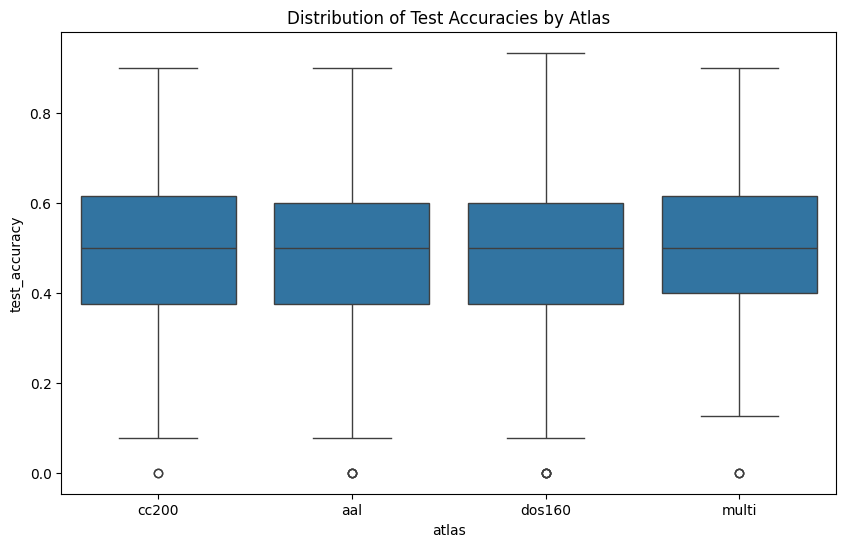

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.boxplot(x='atlas', y='test_accuracy', data=results_df)
plt.title('Distribution of Test Accuracies by Atlas')
plt.show()

2. Heatmap:

Create a heatmap of average test accuracies across sites and atlases.

Site-specific Performance: The heatmap allows you to identify if certain atlases perform better at specific sites, which could be important for practical applications

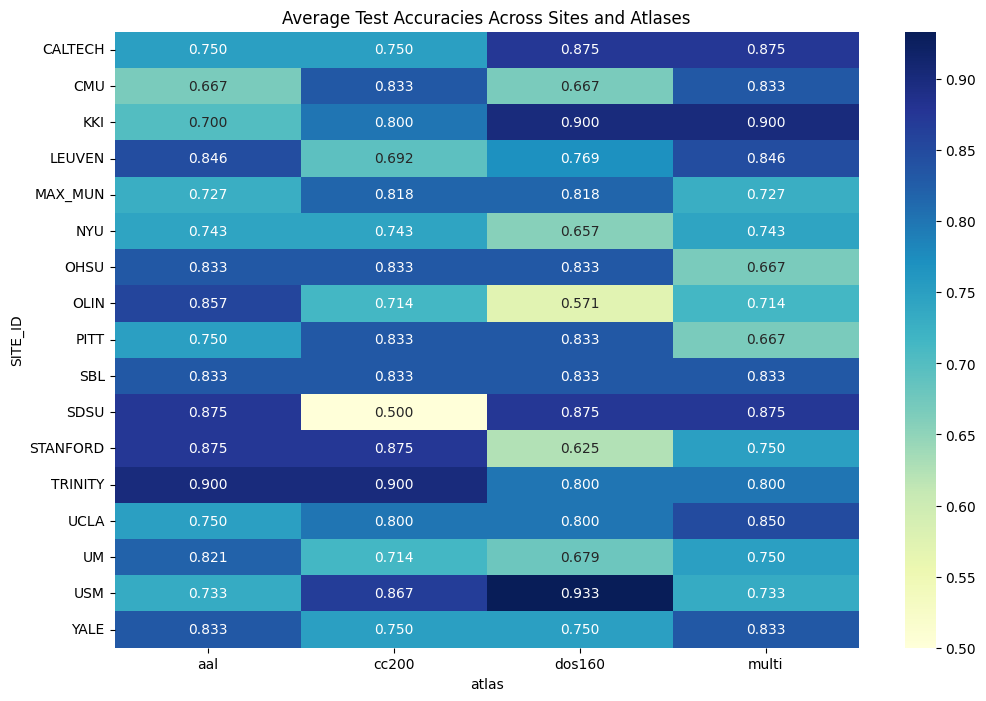

In [42]:
pivot_df = results_df.pivot_table(index='SITE_ID', columns='atlas', values='test_accuracy', aggfunc='max')

plt.figure(figsize=(12, 8))
sns.heatmap(pivot_df, annot=True, cmap='YlGnBu', fmt='.3f')
plt.title('Average Test Accuracies Across Sites and Atlases')
plt.show()

3. Interaction Plot:

Create an interaction plot to visualize how atlas performance varies across different graph features, feature engineering methods, and classifier models

Interactions: The interaction plots help you understand how atlas performance varies across different pipeline components. This can reveal if certain atlases are particularly well-suited for specific graph features, feature engineering methods, or classifier models

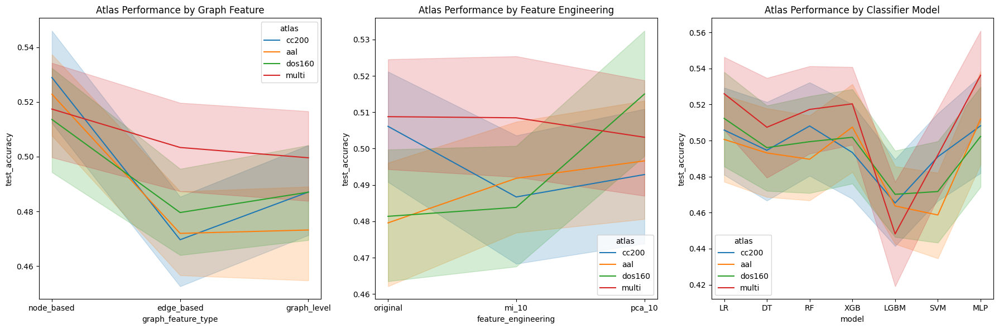

In [41]:
import matplotlib.pyplot as plt

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

sns.lineplot(data=results_df, x='graph_feature_type', y='test_accuracy', hue='atlas', ax=ax1)
ax1.set_title('Atlas Performance by Graph Feature')

sns.lineplot(data=results_df, x='feature_engineering', y='test_accuracy', hue='atlas', ax=ax2)
ax2.set_title('Atlas Performance by Feature Engineering')

sns.lineplot(data=results_df, x='model', y='test_accuracy', hue='atlas', ax=ax3)
ax3.set_title('Atlas Performance by Classifier Model')

plt.tight_layout()
plt.show()

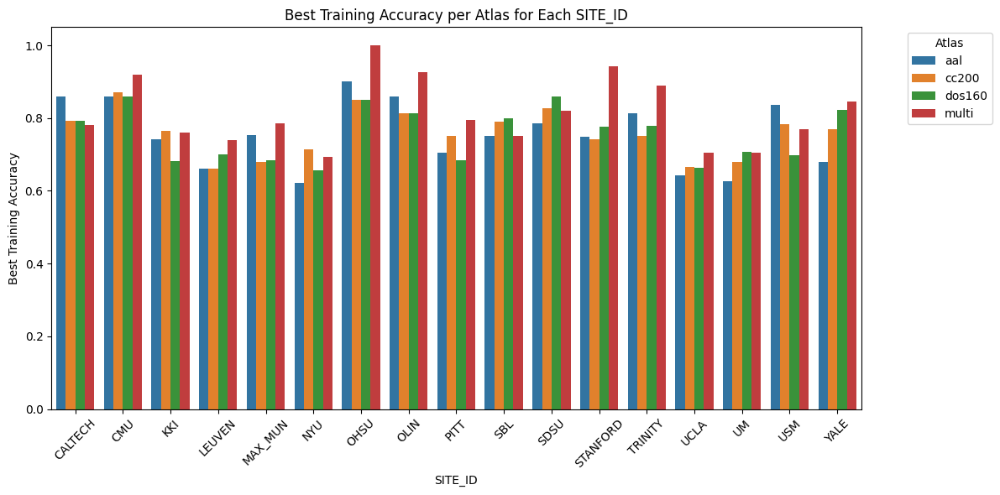

In [106]:
import matplotlib.pyplot as plt
import seaborn as sns

# Find the best training accuracy for each (SITE_ID, atlas) combination
best_train_acc_df = results_df.groupby(['SITE_ID', 'atlas'])['train_accuracy'].max().reset_index()

# Set up the bar plot
plt.figure(figsize=(12, 6))
sns.barplot(data=best_train_acc_df, x='SITE_ID', y='train_accuracy', hue='atlas')

# Add labels and title
plt.xlabel("SITE_ID")
plt.ylabel("Best Training Accuracy")
plt.title("Best Training Accuracy per Atlas for Each SITE_ID")
plt.legend(title="Atlas", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()
plt.show()


In [109]:
# Find the best training accuracy for each atlas
best_train_acc_df = full_training_results_df.groupby(['atlas'])['test_accuracy'].max().reset_index()
best_train_acc_df

,atlas,test_accuracy
0,aal,0.628019
1,cc200,0.657005
2,dos160,0.599034
3,multi,0.608696


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Find the best training accuracy for each atlas
best_train_acc_df = full_training_results_df.groupby(['atlas'])['train_accuracy'].max().reset_index()

# Set up the bar plot
plt.figure(figsize=(12, 6))
sns.barplot(data=best_train_acc_df, x='SITE_ID', y='train_accuracy', hue='atlas')

# Add labels and title
plt.xlabel("SITE_ID")
plt.ylabel("Best Training Accuracy")
plt.title("Best Training Accuracy per Atlas for Each SITE_ID")
plt.legend(title="Atlas", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()
plt.show()


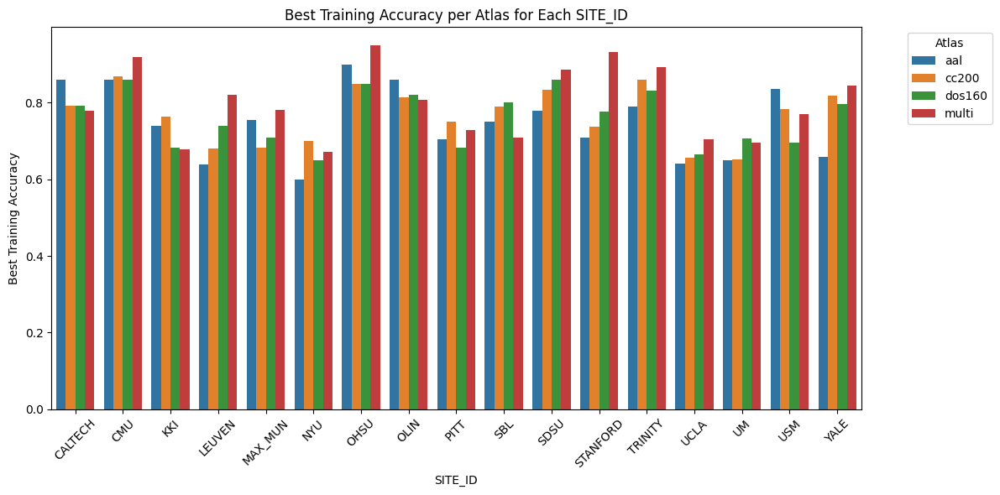

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

# Find the best training accuracy for each (SITE_ID, atlas) combination
best_train_acc_df = results_df.groupby(['SITE_ID', 'atlas'])['train_accuracy'].max().reset_index()

# Set up the bar plot
plt.figure(figsize=(12, 6))
sns.barplot(data=best_train_acc_df, x='SITE_ID', y='train_accuracy', hue='atlas')

# Add labels and title
plt.xlabel("SITE_ID")
plt.ylabel("Best Training Accuracy")
plt.title("Best Training Accuracy per Atlas for Each SITE_ID")
plt.legend(title="Atlas", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()
plt.show()


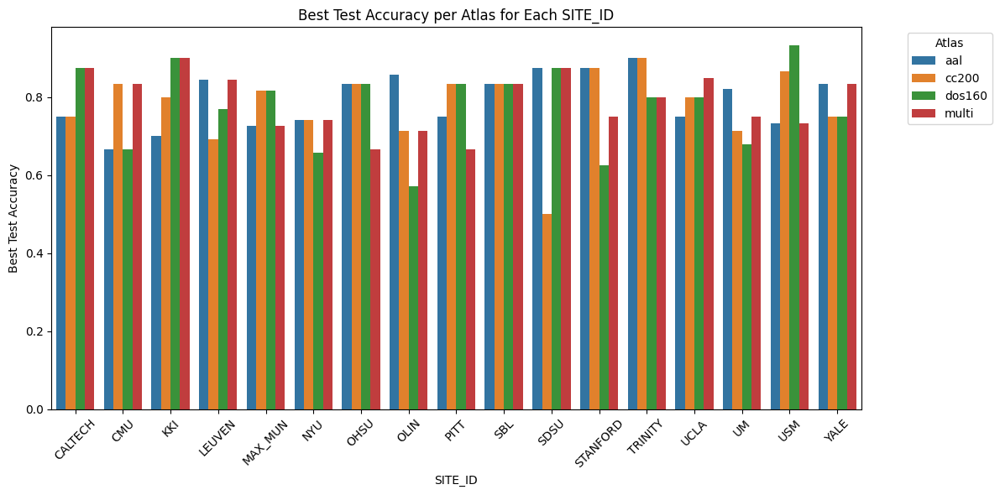

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns

# Find the best test accuracy for each (SITE_ID, atlas) combination
best_test_acc_df = results_df.groupby(['SITE_ID', 'atlas'])['test_accuracy'].max().reset_index()

# Set up the bar plot
plt.figure(figsize=(12, 6))
sns.barplot(data=best_test_acc_df, x='SITE_ID', y='test_accuracy', hue='atlas')

# Add labels and title
plt.xlabel("SITE_ID")
plt.ylabel("Best Test Accuracy")
plt.title("Best Test Accuracy per Atlas for Each SITE_ID")
plt.legend(title="Atlas", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()
plt.show()


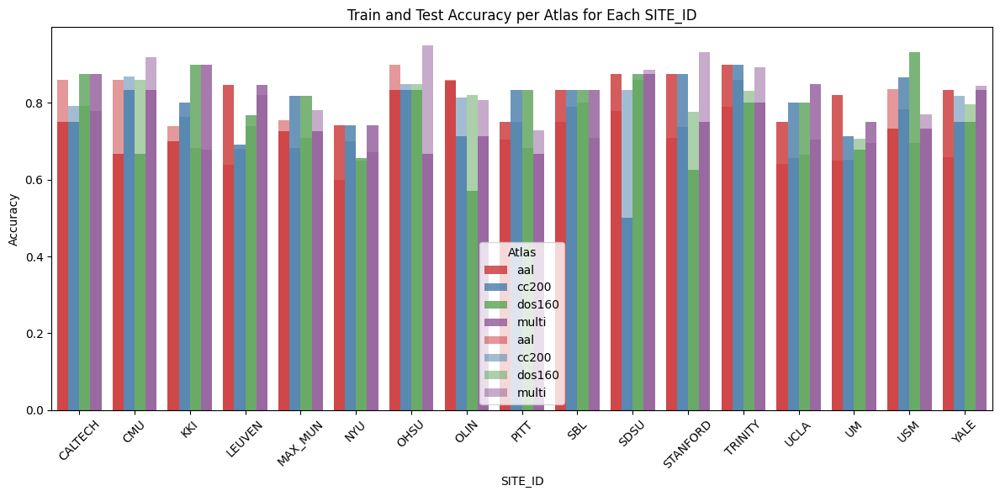

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns

# Find the best train and test accuracy for each (SITE_ID, atlas) combination
best_acc_df = results_df.groupby(['SITE_ID', 'atlas']).agg({'train_accuracy': 'max', 'test_accuracy': 'max'}).reset_index()

# Set up the plot
plt.figure(figsize=(12, 6))

# Plot the test accuracies with dark bars (darker color)
sns.barplot(data=best_acc_df, x='SITE_ID', y='test_accuracy', hue='atlas', alpha=0.8, palette='Set1')

# Plot the train accuracies with transparent bars
sns.barplot(data=best_acc_df, x='SITE_ID', y='train_accuracy', hue='atlas', alpha=0.5, palette='Set1')


# Add labels and title
plt.xlabel("SITE_ID")
plt.ylabel("Accuracy")
plt.title("Train and Test Accuracy per Atlas for Each SITE_ID")
plt.legend(title="Atlas")

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()
plt.show()


In [ ]:
# Find the best training accuracy for each (SITE_ID, atlas) combination
best_train_acc_df = results_df.groupby(['SITE_ID', 'atlas'])['train_accuracy'].max().reset_index()

# Create a new column that stores the atlas with the best training accuracy for each SITE_ID
best_train_acc_df['best_train_atlas'] = best_train_acc_df.groupby('SITE_ID')['train_accuracy'].transform('max')

# Now we need to count how many times each atlas has the best training accuracy for each SITE_ID
# Filter rows where the train_accuracy is equal to the best train_accuracy for that SITE_ID
best_train_atlas_per_site = best_train_acc_df[best_train_acc_df['train_accuracy'] == best_train_acc_df['best_train_atlas']]

# Count the number of times each atlas is the best for training accuracy
atlas_train_performance_count = best_train_atlas_per_site['atlas'].value_counts()

# --- Now for the same process for test_accuracy ---
# Find the best test accuracy for each (SITE_ID, atlas) combination
best_test_acc_df = results_df.groupby(['SITE_ID', 'atlas'])['test_accuracy'].max().reset_index()

# Create a new column that stores the atlas with the best test accuracy for each SITE_ID
best_test_acc_df['best_test_atlas'] = best_test_acc_df.groupby('SITE_ID')['test_accuracy'].transform('max')

# Filter rows where the test_accuracy is equal to the best test_accuracy for that SITE_ID
best_test_atlas_per_site = best_test_acc_df[best_test_acc_df['test_accuracy'] == best_test_acc_df['best_test_atlas']]

# Count the number of times each atlas is the best for test accuracy
atlas_test_performance_count = best_test_atlas_per_site['atlas'].value_counts()

# Combine the results for train and test accuracies
performance_counts = pd.DataFrame({
    'train_accuracy_count': atlas_train_performance_count,
    'test_accuracy_count': atlas_test_performance_count
}).fillna(0)
y_train_augmented
# Display the result
print(performance_counts)


        train_accuracy_count  test_accuracy_count
atlas                                            
aal                        3                   10
cc200                      3                    8
dos160                     2                    8
multi                      9                    9


In [13]:
best_test_acc_df

,SITE_ID,atlas,test_accuracy
0,CALTECH,aal,0.750000
1,CALTECH,cc200,0.750000
2,CALTECH,dos160,0.875000
3,CALTECH,multi,0.875000
4,CMU,aal,0.666667
...,...,...,...
63,USM,multi,0.733333
64,YALE,aal,0.833333
65,YALE,cc200,0.750000
66,YALE,dos160,0.750000


In [16]:
best_test_acc_df.tail(50)

,SITE_ID,atlas,test_accuracy
18,MAX_MUN,dos160,0.818182
19,MAX_MUN,multi,0.727273
20,NYU,aal,0.742857
21,NYU,cc200,0.742857
22,NYU,dos160,0.657143
23,NYU,multi,0.742857
24,OHSU,aal,0.833333
25,OHSU,cc200,0.833333
26,OHSU,dos160,0.833333
27,OHSU,multi,0.666667


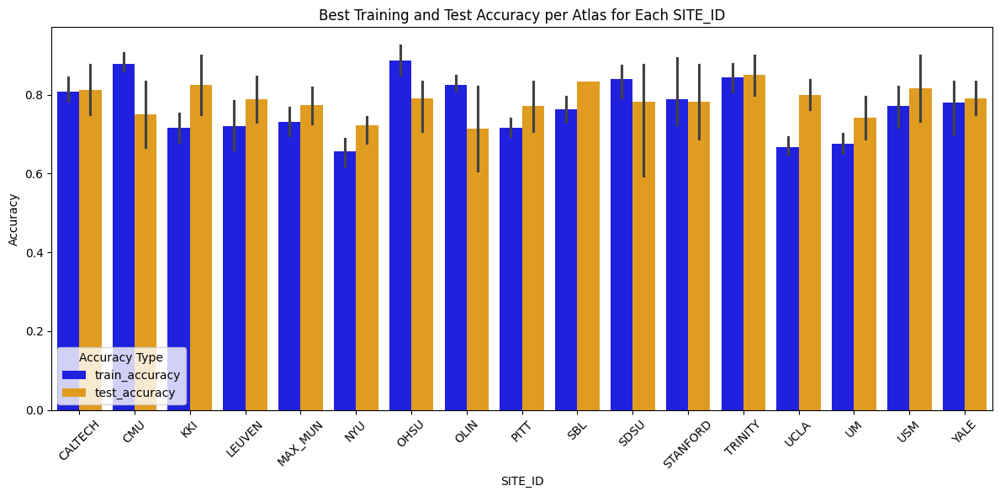

In [ ]:
import matplotlib.pyplot as plt
import seaborn as snsy_train_augmentedD, atlas) combination
best_acc_df = results_df.groupby(['SITE_ID', 'atlas'])[['train_accuracy', 'test_accuracy']].max().reset_index()

# Melt the DataFrame to have 'accuracy_type' as a variable for plotting
best_acc_melted_df = best_acc_df.melt(id_vars=['SITE_ID', 'atlas'], 
                                      value_vars=['train_accuracy', 'test_accuracy'], 
                                      var_name='accuracy_type', 
                                      value_name='accuracy')

# Set up the bar plot
plt.figure(figsize=(12, 6))
sns.barplot(data=best_acc_melted_df, x='SITE_ID', y='accuracy', hue='accuracy_type', 
            palette=['blue', 'orange'])

# Add labels and title
plt.xlabel("SITE_ID")
plt.ylabel("Accuracy")
plt.title("Best Training and Test Accuracy per Atlas for Each SITE_ID")
plt.legend(title="Accuracy Type")
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()
plt.show()


/tmp/ipykernel_297105/1789595812.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=best_acc_melted_df, x='SITE_ID', y='accuracy', hue='accuracy_type',


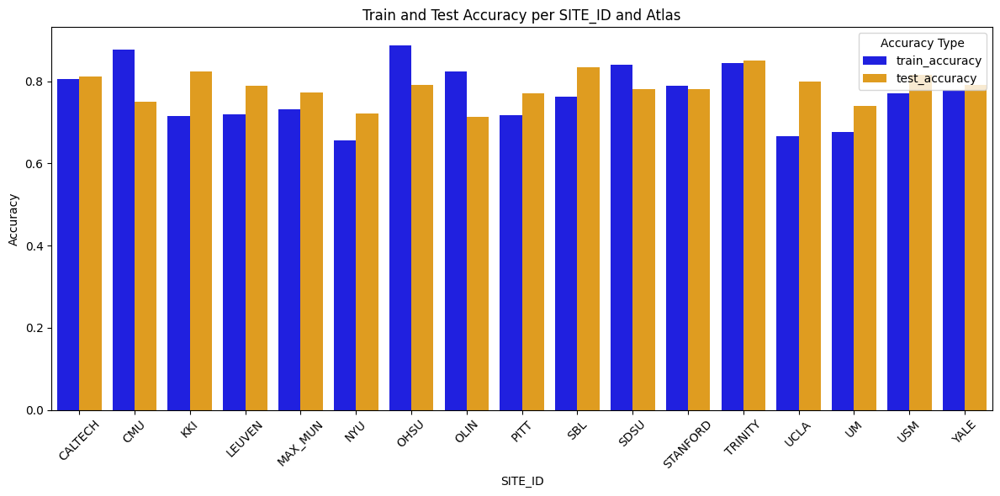

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming results_df contains both train_accuracy and test_accuracy for each (SITE_ID, atlas)
# Let's group by SITE_ID and atlas, and calculate the max accuracy for both training and test
best_acc_df = results_df.groupby(['SITE_ID', 'atlas'])[['train_accuracy', 'test_accuracy']].max().reset_index()

# Melt the DataFrame so that we can have 'train_accuracy' and 'test_accuracy' as a variable
best_acc_melted_df = best_acc_df.melt(id_vars=['SITE_ID', 'atlas'], 
                                      value_vars=['train_accuracy', 'test_accuracy'], 
                                      var_name='accuracy_type', 
                                      value_name='accuracy')

# Set up the plot
plt.figure(figsize=(12, 6))

# Plot using seaborn's barplot
sns.barplot(data=best_acc_melted_df, x='SITE_ID', y='accuracy', hue='accuracy_type', 
            palette=['blue', 'orange'], ci=None) you

# Customize the plot
plt.xlabel("SITE_ID")
plt.ylabel("Accuracy")
plt.title("Train and Test Accuracy per SITE_ID and Atlas")
plt.xticks(rotation=45)  # Rotate SITE_ID labels for better readability
plt.legend(title="Accuracy Type")
plt.tight_layout()

# Show the plot
plt.show()


In [18]:
best_acc_melted_df

,SITE_ID,atlas,accuracy_type,accuracy
0,CALTECH,aal,train_accuracy,0.860000
1,CALTECH,cc200,train_accuracy,0.793333
2,CALTECH,dos160,train_accuracy,0.793333
3,CALTECH,multi,train_accuracy,0.780000
4,CMU,aal,train_accuracy,0.860000
...,...,...,...,...
131,USM,multi,test_accuracy,0.733333
132,YALE,aal,test_accuracy,0.833333
133,YALE,cc200,test_accuracy,0.750000
134,YALE,dos160,test_accuracy,0.750000
